<a href="https://colab.research.google.com/github/Lilbrosyrus/cosc470s24/blob/main/cifar10_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
 # example of loading the cifar10 dataset
from keras.datasets.cifar10 import load_data
# load the images into memory
(trainX, trainy), (testX, testy) = load_data()
# summarize the shape of the dataset
print('Train', trainX.shape, trainy.shape)
print('Test', testX.shape, testy.shape)

170498071/170498071 [==============================] - 4s 0us/step
Train (50000, 32, 32, 3) (50000, 1)
Test (10000, 32, 32, 3) (10000, 1)


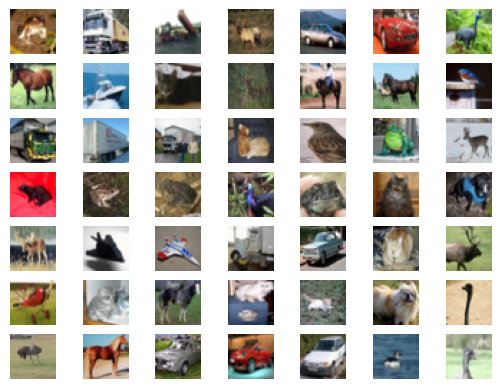

In [2]:
# example of loading and plotting the cifar10 dataset
from keras.datasets.cifar10 import load_data
from matplotlib import pyplot
# load the images into memory
(trainX, trainy), (testX, testy) = load_data()
# plot images from the training dataset
for i in range(49):
	# define subplot
	pyplot.subplot(7, 7, 1 + i)
	# turn off axis
	pyplot.axis('off')
	# plot raw pixel data
	pyplot.imshow(trainX[i])
pyplot.show()

In [3]:
# example of training the discriminator model on real and random cifar10 images
from numpy import expand_dims
from numpy import ones
from numpy import zeros
from numpy.random import rand
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.datasets.cifar100 import load_data as load_data_100
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU

# define the standalone discriminator model
def define_discriminator(in_shape=(32,32,3)):
	model = Sequential()
	# normal
	model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# classifier
	model.add(Flatten())
	model.add(Dropout(0.4))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model

# load and prepare cifar10 training images
def load_real_samples(loadfunc):
	# load cifar10 dataset
	(trainX, _), (_, _) = loadfunc()
	# convert from unsigned ints to floats
	X = trainX.astype('float32')
	# scale from [0,255] to [-1,1]
	X = (X - 127.5) / 127.5
	return X

# select real samples
def generate_real_samples(dataset, n_samples):
	# choose random instances
	ix = randint(0, dataset.shape[0], n_samples)
	# retrieve selected images
	X = dataset[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, 1))
	return X, y

# generate n fake samples with class labels
def generate_fake_samples(n_samples):
	# generate uniform random numbers in [0,1]
	X = rand(32 * 32 * 3 * n_samples)
	# update to have the range [-1, 1]
	X = -1 + X * 2
	# reshape into a batch of color images
	X = X.reshape((n_samples, 32, 32, 3))
	# generate 'fake' class labels (0)
	y = zeros((n_samples, 1))
	return X, y

# train the discriminator model
def train_discriminator(model, dataset, n_iter=20, n_batch=128):
	half_batch = int(n_batch / 2)
	# manually enumerate epochs
	for i in range(n_iter):
		# get randomly selected 'real' samples
		X_real, y_real = generate_real_samples(dataset, half_batch)
		# update discriminator on real samples
		_, real_acc = model.train_on_batch(X_real, y_real)
		# generate 'fake' examples
		X_fake, y_fake = generate_fake_samples(half_batch)
		# update discriminator on fake samples
		_, fake_acc = model.train_on_batch(X_fake, y_fake)
		# summarize performance
		print('>%d real=%.0f%% fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

# define the discriminator model
model = define_discriminator()
# load image data
dataset100 = load_real_samples(load_data)
# fit the model
train_discriminator(model, dataset100)


>1 real=55% fake=0%
>2 real=98% fake=3%
>3 real=98% fake=98%
>4 real=86% fake=100%
>5 real=94% fake=100%
>6 real=98% fake=100%
>7 real=100% fake=100%
>8 real=98% fake=100%
>9 real=100% fake=100%
>10 real=100% fake=100%
>11 real=100% fake=100%
>12 real=100% fake=100%
>13 real=100% fake=100%
>14 real=100% fake=100%
>15 real=100% fake=100%
>16 real=100% fake=100%
>17 real=100% fake=100%
>18 real=100% fake=100%
>19 real=100% fake=100%
>20 real=100% fake=100%


In [4]:
import numpy as np
print(dataset100[0])
a_real = model.predict(np.array([dataset100[0], dataset100[37476]]))
print(a_real)
fake_samples = generate_fake_samples(2)
a_fake = model.predict(fake_samples[0])
print(a_fake)

[[[-0.5372549  -0.5137255  -0.5058824 ]
  [-0.6627451  -0.6392157  -0.64705884]
  [-0.60784316 -0.62352943 -0.6627451 ]
  ...
  [ 0.23921569  0.03529412 -0.15294118]
  [ 0.19215687 -0.01960784 -0.2       ]
  [ 0.16078432 -0.02745098 -0.19215687]]

 [[-0.8745098  -0.84313726 -0.84313726]
  [-1.         -1.         -1.        ]
  [-0.85882354 -0.9372549  -1.        ]
  ...
  [-0.03529412 -0.30980393 -0.5686275 ]
  [-0.06666667 -0.34901962 -0.60784316]
  [-0.04313726 -0.31764707 -0.5529412 ]]

 [[-0.8039216  -0.8117647  -0.8352941 ]
  [-0.8745098  -0.94509804 -1.        ]
  [-0.6156863  -0.7882353  -0.9372549 ]
  ...
  [-0.07450981 -0.34117648 -0.60784316]
  [-0.05882353 -0.34117648 -0.60784316]
  [-0.14509805 -0.42745098 -0.67058825]]

 ...

 [[ 0.6313726   0.33333334 -0.24705882]
  [ 0.5764706   0.2        -0.73333335]
  [ 0.5529412   0.2627451  -0.79607844]
  ...
  [ 0.25490198  0.04313726 -0.4509804 ]
  [-0.56078434 -0.75686276 -0.94509804]
  [-0.58431375 -0.73333335 -0.84313726]]

 [

169001437/169001437 [==============================] - 2s 0us/step
(50000, 32, 32, 3)
1/1 [==============================] - 0s 32ms/step


[[1.]
 [1.]]


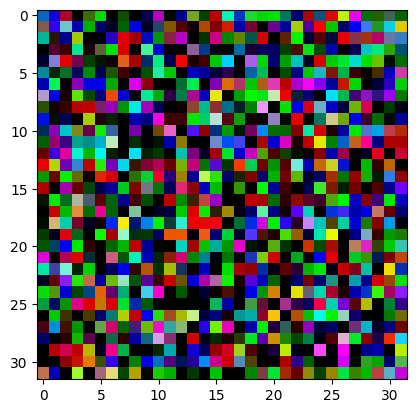

In [5]:
# how well does it recognize images from the cifar-100 dataset, when it was only trained on cifar-10
dataset100 = load_real_samples(load_data_100)
print(dataset100.shape)
a_real100 = model.predict(np.array([dataset100[7500], dataset100[23000]]))
print(a_real100)
pyplot.imshow(fake_samples[0][0])

[[ 0.53499969 -1.40772726  1.20100175 ... -1.00900422  0.71087516
   0.57092783]
 [-0.69787845 -1.01847258  2.22022907 ... -0.68264949  0.41582147
   0.53056337]
 [ 0.01043605 -0.93945289  0.46196351 ...  0.09873475 -0.0874452
  -0.62347905]
 ...
 [-1.01869132  1.8116315   0.86511083 ...  0.92524297 -1.85228802
  -0.07946404]
 [ 1.22512792 -1.41163687  1.0656727  ... -1.632898   -0.21044411
  -1.63843125]
 [ 1.14543998  0.22098497 -0.93424908 ... -0.25859139  0.82115578
  -0.71364667]]
2/2 [==============================] - 1s 305ms/step
[[[0.499334   0.5007192  0.49925798]
  [0.5019018  0.50119025 0.5005974 ]
  [0.50134236 0.4983169  0.50033706]
  ...
  [0.50100166 0.50148845 0.50004023]
  [0.49986795 0.49958715 0.5007567 ]
  [0.49985248 0.5023069  0.5008025 ]]

 [[0.49921238 0.49886402 0.5036021 ]
  [0.49988443 0.4993737  0.5000704 ]
  [0.501837   0.49836233 0.50012094]
  ...
  [0.5010666  0.50143474 0.5039679 ]
  [0.49943706 0.50137484 0.5007122 ]
  [0.49903378 0.50310355 0.5016828 

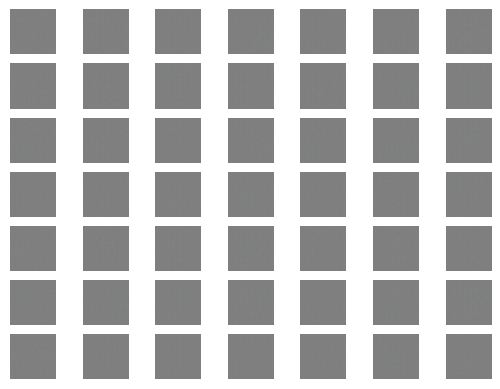

In [30]:
# example of defining and using the generator model
from numpy import zeros
from numpy.random import randn
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from matplotlib import pyplot

# define the standalone generator model
def define_generator(latent_dim):
	model = Sequential()
	# foundation for 4x4 image
	n_nodes = 256 * 4 * 4
	model.add(Dense(n_nodes, input_dim=latent_dim))
	model.add(LeakyReLU(alpha=0.2))
	model.add(Reshape((4, 4, 256)))
	# upsample to 8x8
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 16x16
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 32x32
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# output layer
	model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
	return model

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    print(x_input)
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = zeros((n_samples, 1))
    return X, y

# size of the latent space
latent_dim = 100
# define the discriminator model
model = define_generator(latent_dim)
# generate samples
n_samples = 49
X, _ = generate_fake_samples(model, latent_dim, n_samples)
# scale pixel values from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the generated samples
for i in range(n_samples):
	# define subplot
	pyplot.subplot(7, 7, 1 + i)
	# turn off axis labels
	pyplot.axis('off')
	# plot single image
	pyplot.imshow(X[i])
# show the figure
print(X[i])
pyplot.show()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 32, 32, 3)         1466115   
                                                                 
 sequential_2 (Sequential)   (None, 1)                 522497    
                                                                 
Total params: 1988612 (7.59 MB)
Trainable params: 1466115 (5.59 MB)
Non-trainable params: 522497 (1.99 MB)
_________________________________________________________________


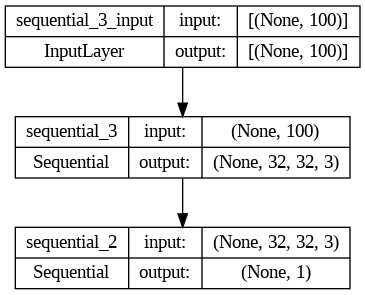

In [31]:
# demonstrate creating the three models in the gan
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model

# define the standalone discriminator model
def define_discriminator(in_shape=(32,32,3)):
	model = Sequential()
	# normal
	model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# classifier
	model.add(Flatten())
	model.add(Dropout(0.4))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model

# define the standalone generator model
def define_generator(latent_dim):
	model = Sequential()
	# foundation for 4x4 image
	n_nodes = 256 * 4 * 4
	model.add(Dense(n_nodes, input_dim=latent_dim))
	model.add(LeakyReLU(alpha=0.2))
	model.add(Reshape((4, 4, 256)))
	# upsample to 8x8
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 16x16
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 32x32
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# output layer
	model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
	return model

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# connect them
	model = Sequential()
	# add generator
	model.add(g_model)
	# add the discriminator
	model.add(d_model)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# summarize gan model
gan_model.summary()
# plot gan model
plot_model(gan_model, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

2/2 [==============================] - 0s 168ms/step
>1, 1/39, d1=0.701, d2=0.708 g=0.691


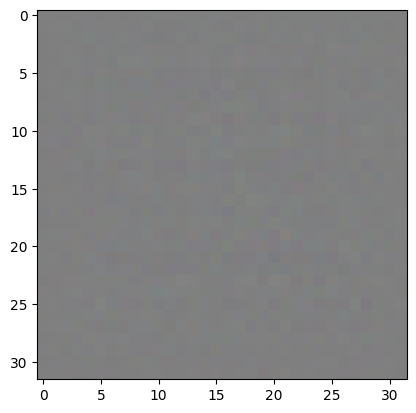

2/2 [==============================] - 0s 173ms/step
>1, 2/39, d1=0.417, d2=0.762 g=0.668


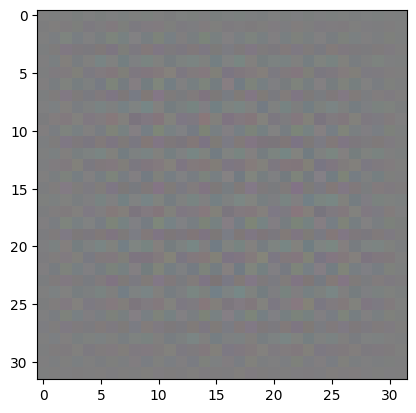

2/2 [==============================] - 0s 167ms/step
>1, 3/39, d1=0.101, d2=1.724 g=0.603


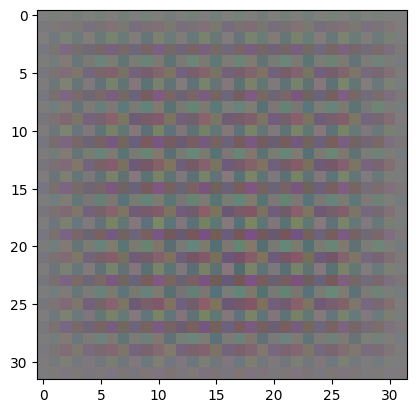

2/2 [==============================] - 0s 167ms/step
>1, 4/39, d1=0.108, d2=1.057 g=0.966


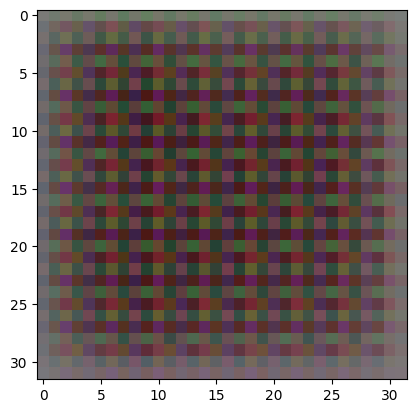

2/2 [==============================] - 0s 166ms/step
>1, 5/39, d1=0.320, d2=0.572 g=1.078


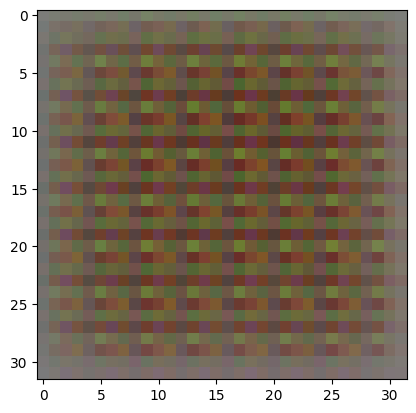

2/2 [==============================] - 0s 171ms/step
>1, 6/39, d1=0.301, d2=0.667 g=0.755


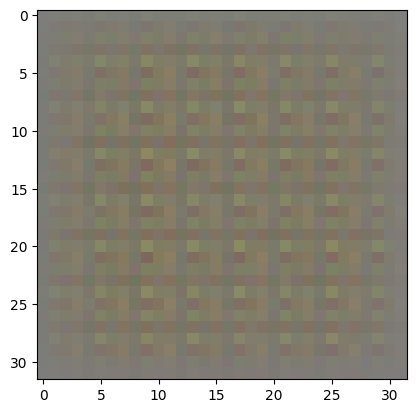

2/2 [==============================] - 0s 170ms/step
>1, 7/39, d1=0.297, d2=1.739 g=0.706


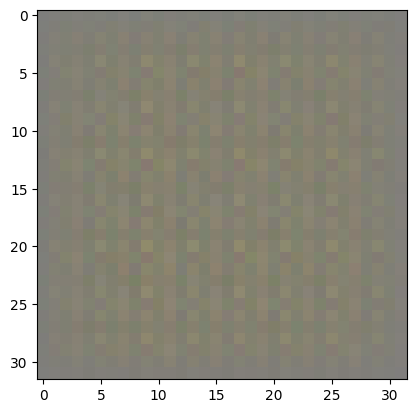

2/2 [==============================] - 0s 174ms/step
>1, 8/39, d1=0.179, d2=1.297 g=0.792


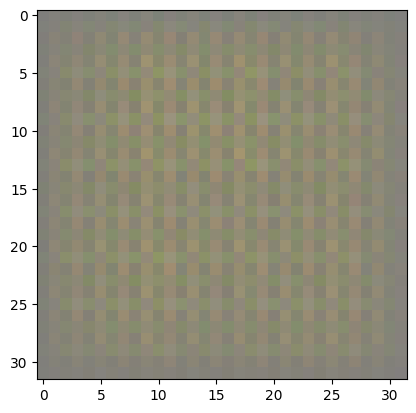

2/2 [==============================] - 0s 183ms/step
>1, 9/39, d1=0.420, d2=0.648 g=0.751


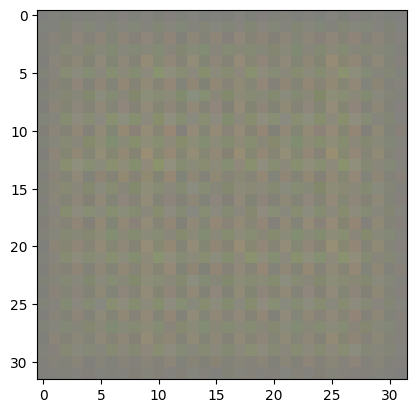

2/2 [==============================] - 0s 177ms/step
>1, 10/39, d1=0.240, d2=0.706 g=0.718


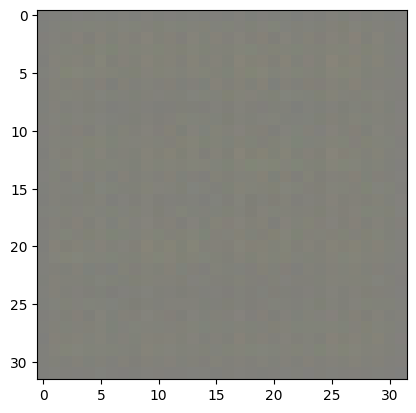

2/2 [==============================] - 0s 170ms/step
>1, 11/39, d1=0.061, d2=0.780 g=0.729


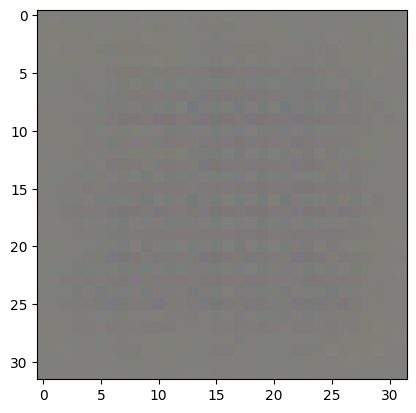

2/2 [==============================] - 0s 177ms/step
>1, 12/39, d1=0.031, d2=2.340 g=0.782


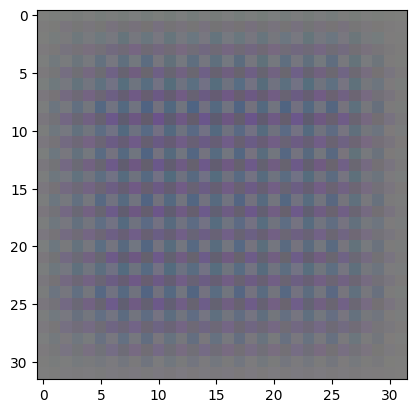

2/2 [==============================] - 0s 183ms/step
>1, 13/39, d1=0.151, d2=0.586 g=1.232


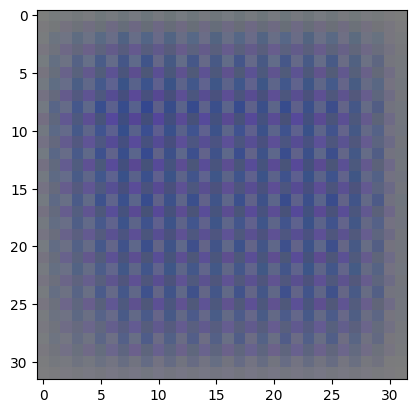

2/2 [==============================] - 1s 278ms/step
>1, 14/39, d1=0.371, d2=0.548 g=0.991


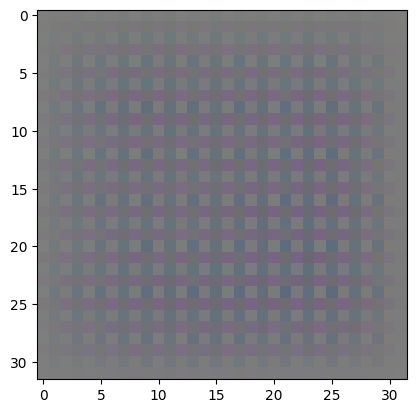

2/2 [==============================] - 0s 169ms/step
>1, 15/39, d1=0.163, d2=0.567 g=0.923


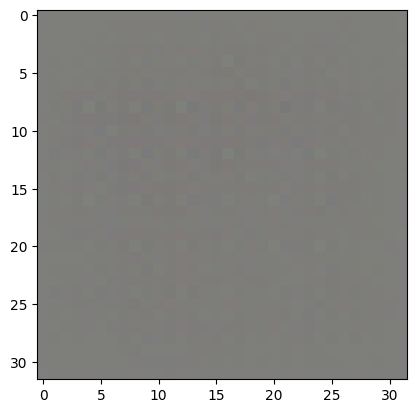

2/2 [==============================] - 0s 172ms/step
>1, 16/39, d1=0.078, d2=0.523 g=1.061


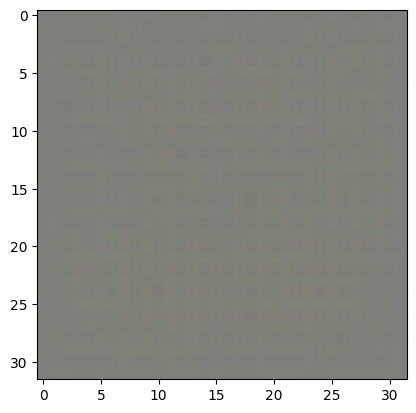

2/2 [==============================] - 1s 289ms/step
>1, 17/39, d1=0.015, d2=1.174 g=1.189


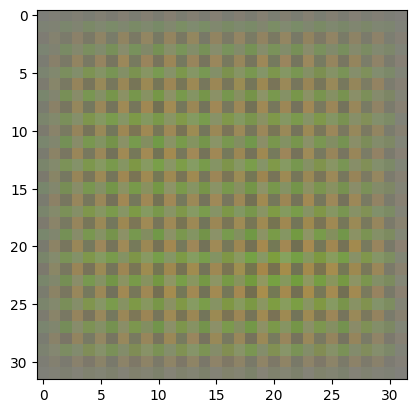

2/2 [==============================] - 0s 175ms/step
>1, 18/39, d1=0.111, d2=0.851 g=2.133


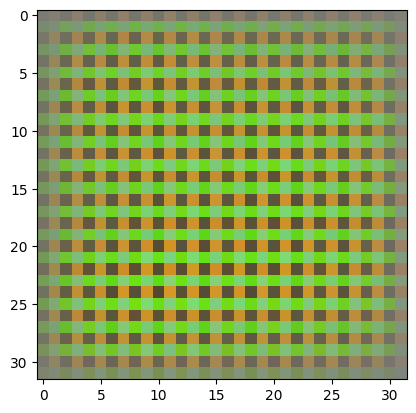

2/2 [==============================] - 0s 187ms/step
>1, 19/39, d1=0.299, d2=0.904 g=1.949


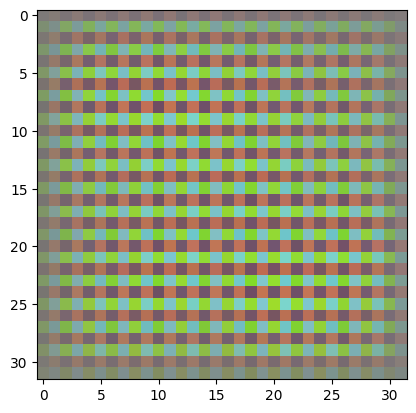

2/2 [==============================] - 1s 443ms/step
>1, 20/39, d1=0.311, d2=0.339 g=1.606


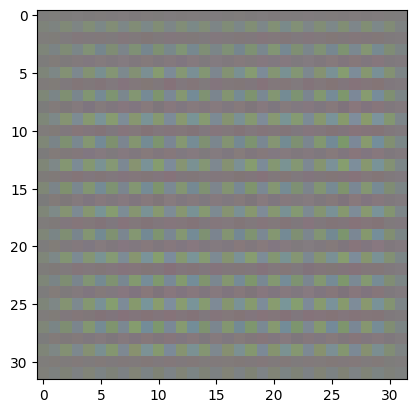

2/2 [==============================] - 1s 279ms/step
>1, 21/39, d1=0.249, d2=0.449 g=1.244


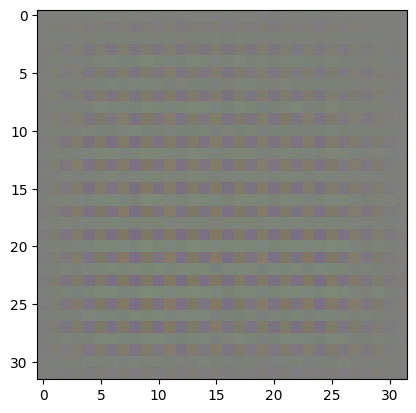

2/2 [==============================] - 0s 178ms/step
>1, 22/39, d1=0.100, d2=1.111 g=1.083


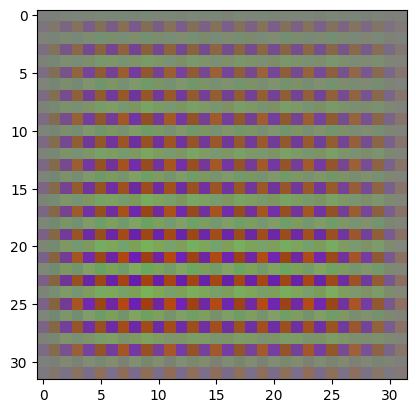

2/2 [==============================] - 0s 173ms/step
>1, 23/39, d1=0.287, d2=0.911 g=2.441


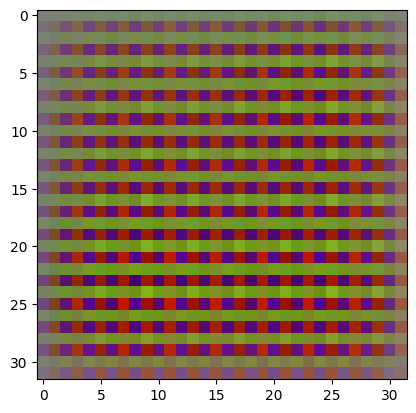

2/2 [==============================] - 1s 264ms/step
>1, 24/39, d1=0.512, d2=0.225 g=2.960


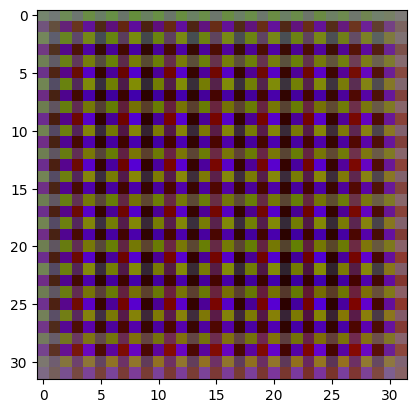

2/2 [==============================] - 0s 180ms/step
>1, 25/39, d1=0.314, d2=0.240 g=4.353


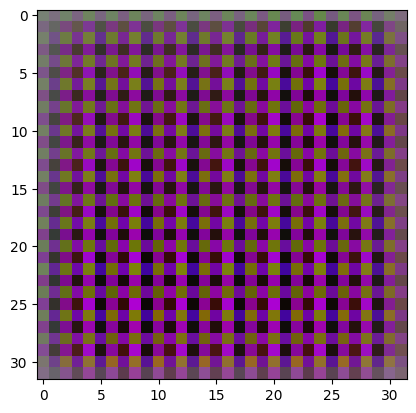

2/2 [==============================] - 0s 174ms/step
>1, 26/39, d1=0.196, d2=0.181 g=3.454


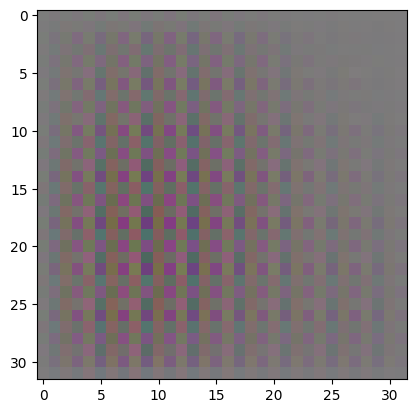

2/2 [==============================] - 1s 282ms/step
>1, 27/39, d1=0.303, d2=0.817 g=1.637


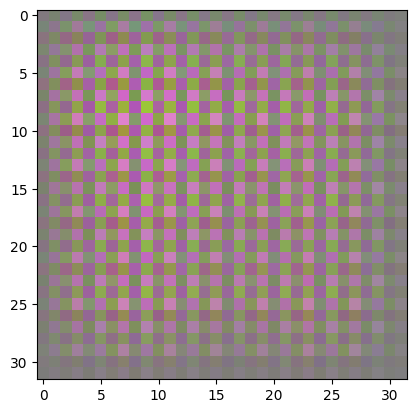

2/2 [==============================] - 0s 176ms/step
>1, 28/39, d1=0.181, d2=1.925 g=1.589


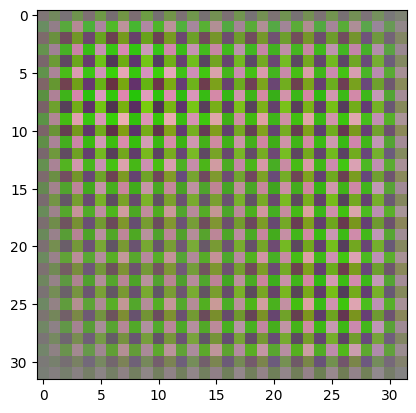

2/2 [==============================] - 0s 179ms/step
>1, 29/39, d1=0.329, d2=0.331 g=2.455


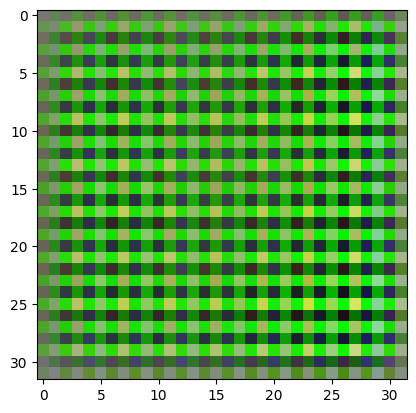

2/2 [==============================] - 1s 282ms/step
>1, 30/39, d1=0.587, d2=0.481 g=1.902


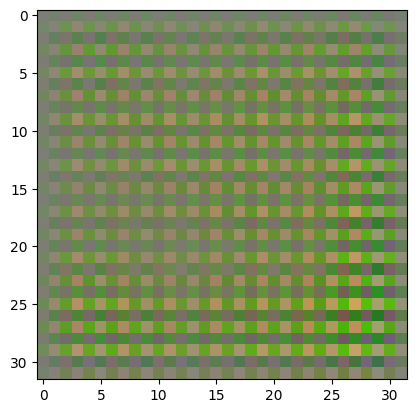

2/2 [==============================] - 0s 174ms/step
>1, 31/39, d1=0.562, d2=0.549 g=2.275


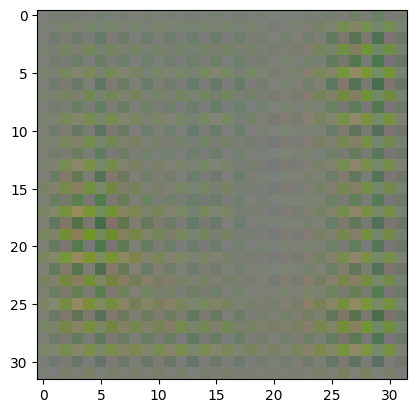

2/2 [==============================] - 0s 179ms/step
>1, 32/39, d1=0.513, d2=0.361 g=2.527


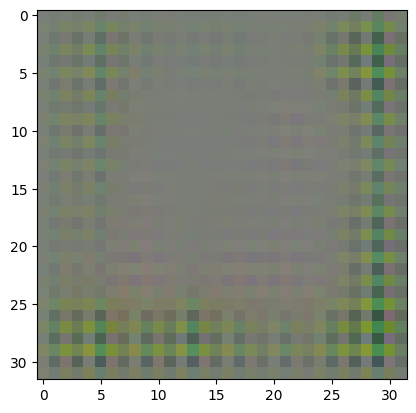

2/2 [==============================] - 1s 285ms/step
>1, 33/39, d1=0.275, d2=0.406 g=4.920


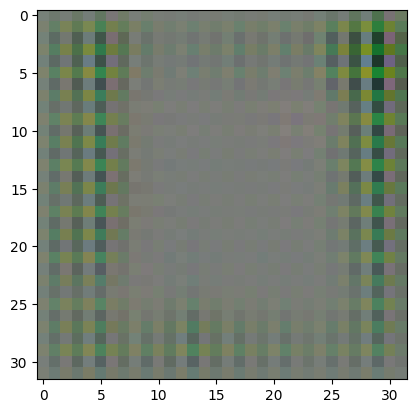

2/2 [==============================] - 0s 189ms/step
>1, 34/39, d1=0.465, d2=0.097 g=2.597


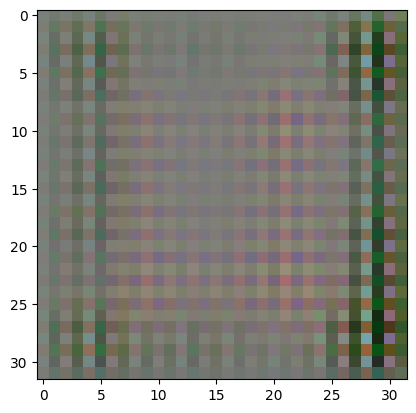

2/2 [==============================] - 0s 188ms/step
>1, 35/39, d1=0.181, d2=0.600 g=2.934


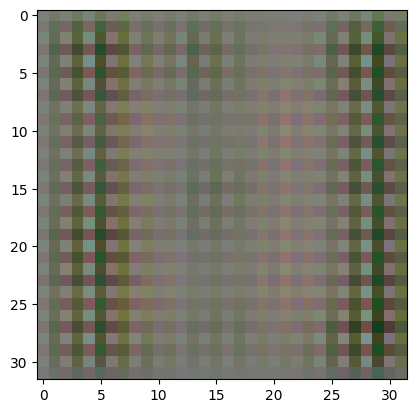

2/2 [==============================] - 1s 271ms/step
>1, 36/39, d1=0.212, d2=0.662 g=5.114


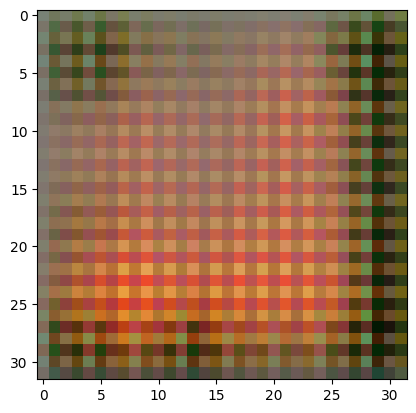

2/2 [==============================] - 0s 175ms/step
>1, 37/39, d1=0.700, d2=0.212 g=3.574


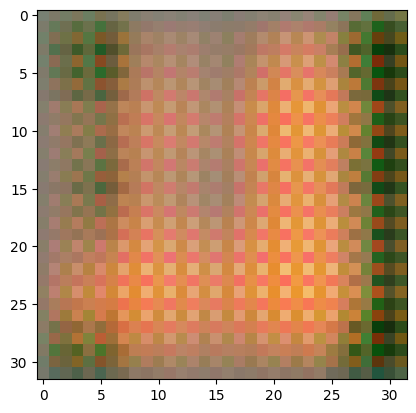

2/2 [==============================] - 0s 179ms/step
>1, 38/39, d1=0.395, d2=0.391 g=3.348


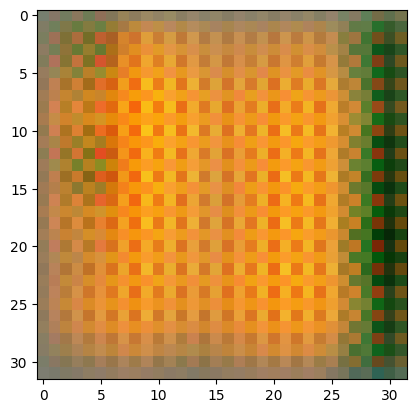

2/2 [==============================] - 1s 262ms/step
>1, 39/39, d1=0.230, d2=0.555 g=3.775


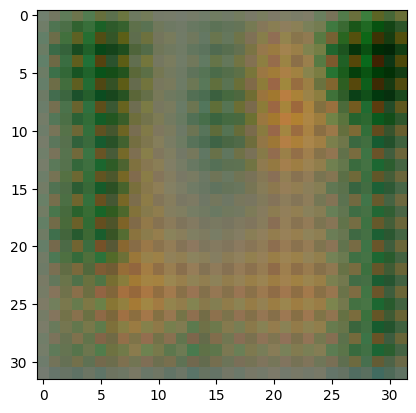

2/2 [==============================] - 0s 184ms/step
>2, 1/39, d1=0.349, d2=0.467 g=2.714


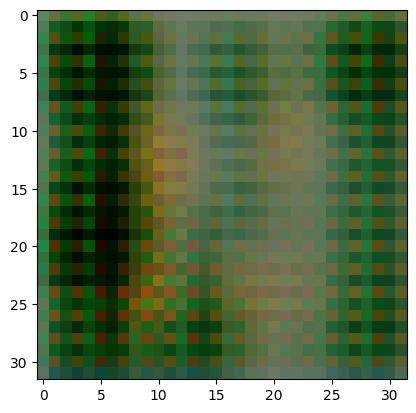

2/2 [==============================] - 0s 189ms/step
>2, 2/39, d1=0.578, d2=0.203 g=2.886


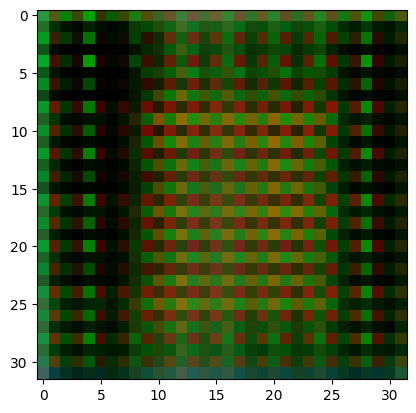

2/2 [==============================] - 1s 278ms/step
>2, 3/39, d1=0.546, d2=0.258 g=2.519


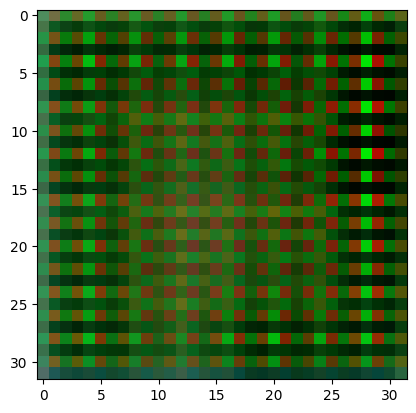

2/2 [==============================] - 0s 179ms/step
>2, 4/39, d1=0.363, d2=0.206 g=2.508


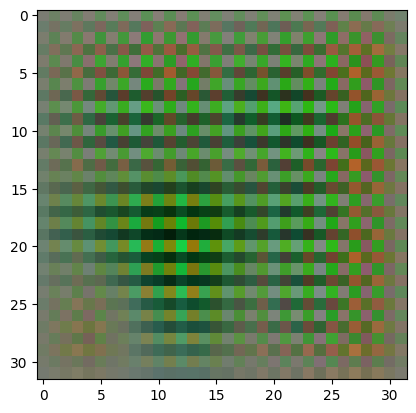

2/2 [==============================] - 0s 173ms/step
>2, 5/39, d1=0.315, d2=0.194 g=2.837


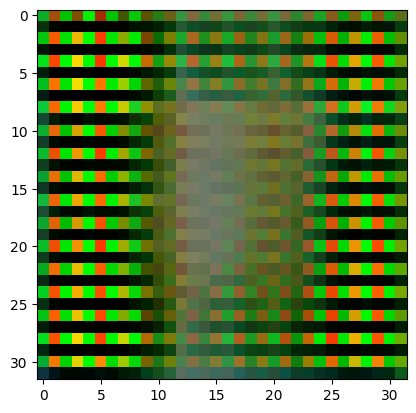

2/2 [==============================] - 1s 279ms/step
>2, 6/39, d1=0.379, d2=0.215 g=2.844


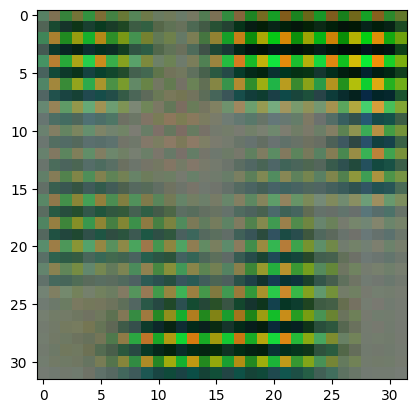

2/2 [==============================] - 0s 190ms/step
>2, 7/39, d1=0.273, d2=0.255 g=2.851


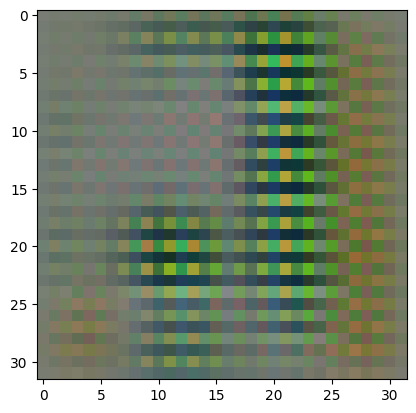

2/2 [==============================] - 0s 178ms/step
>2, 8/39, d1=0.130, d2=9.172 g=3.646


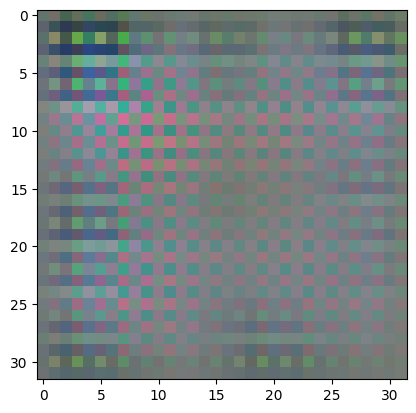

2/2 [==============================] - 1s 295ms/step
>2, 9/39, d1=0.560, d2=0.341 g=2.018


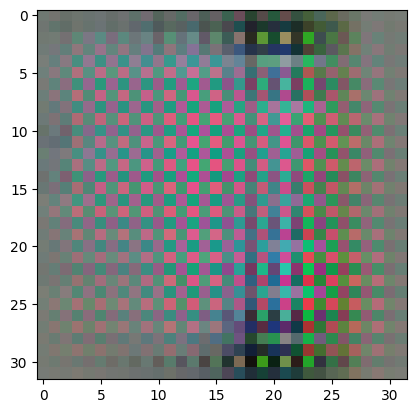

2/2 [==============================] - 0s 188ms/step
>2, 10/39, d1=0.664, d2=0.448 g=2.340


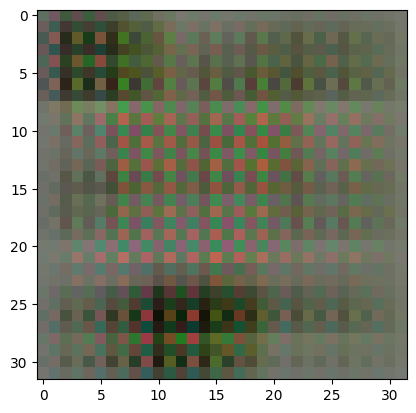

2/2 [==============================] - 0s 179ms/step
>2, 11/39, d1=0.705, d2=0.428 g=1.480


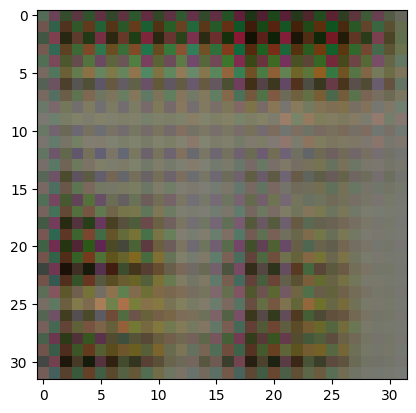

2/2 [==============================] - 1s 291ms/step
>2, 12/39, d1=0.548, d2=0.463 g=1.437


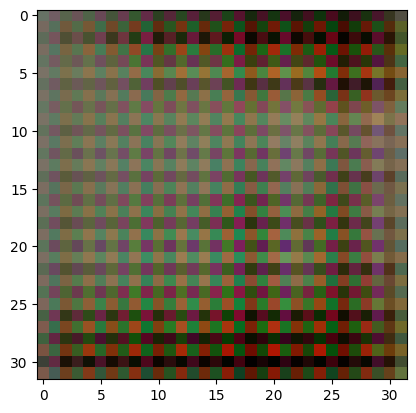

2/2 [==============================] - 0s 176ms/step
>2, 13/39, d1=0.488, d2=0.374 g=1.655


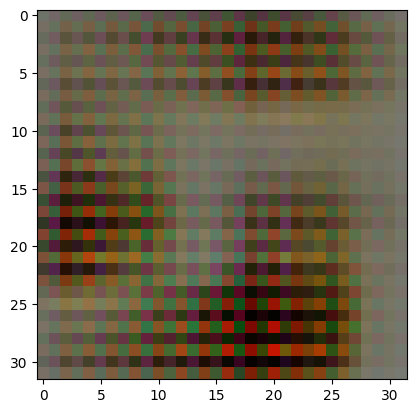

2/2 [==============================] - 0s 192ms/step
>2, 14/39, d1=0.341, d2=0.259 g=2.399


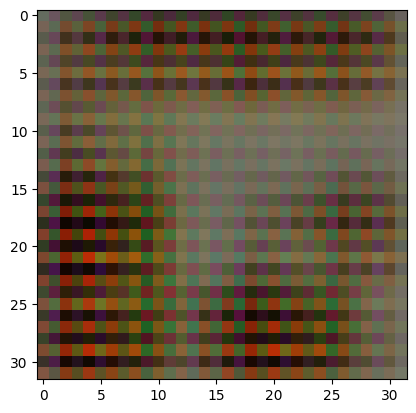

2/2 [==============================] - 1s 278ms/step
>2, 15/39, d1=0.429, d2=0.179 g=2.660


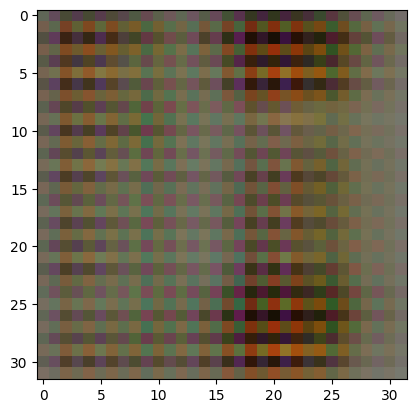

2/2 [==============================] - 0s 177ms/step
>2, 16/39, d1=0.370, d2=0.298 g=2.836


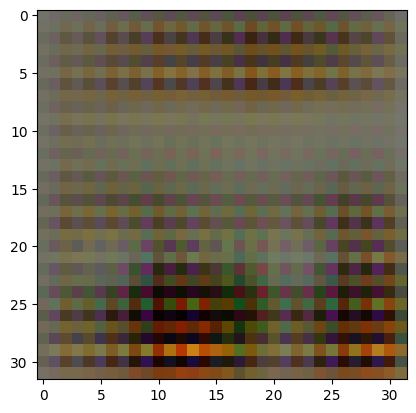

2/2 [==============================] - 0s 174ms/step
>2, 17/39, d1=0.231, d2=0.167 g=3.373


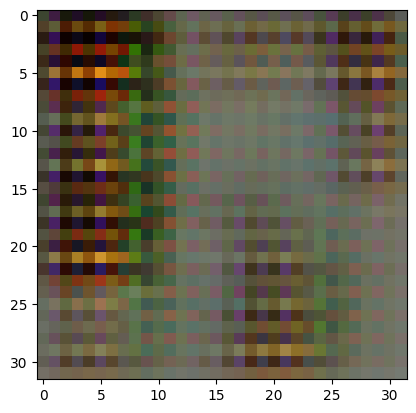

2/2 [==============================] - 1s 292ms/step
>2, 18/39, d1=0.394, d2=0.347 g=2.666


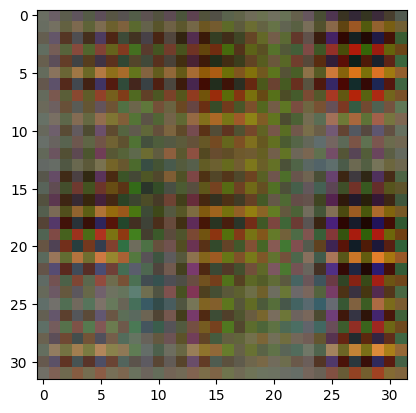

2/2 [==============================] - 0s 172ms/step
>2, 19/39, d1=0.161, d2=0.116 g=3.366


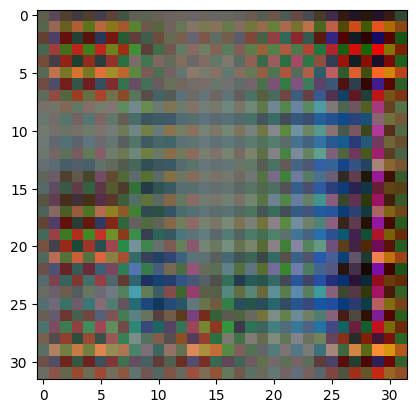

2/2 [==============================] - 0s 175ms/step
>2, 20/39, d1=0.124, d2=0.074 g=3.505


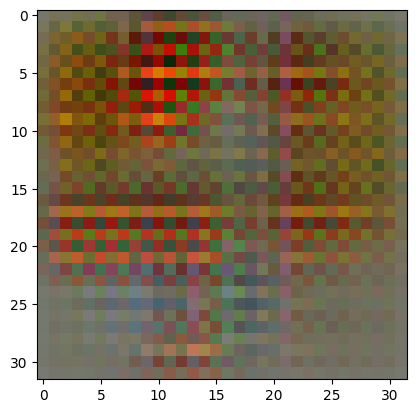

2/2 [==============================] - 1s 279ms/step
>2, 21/39, d1=0.227, d2=1.049 g=6.141


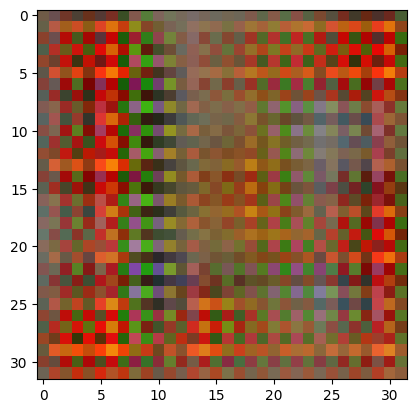

2/2 [==============================] - 0s 179ms/step
>2, 22/39, d1=0.380, d2=0.032 g=4.728


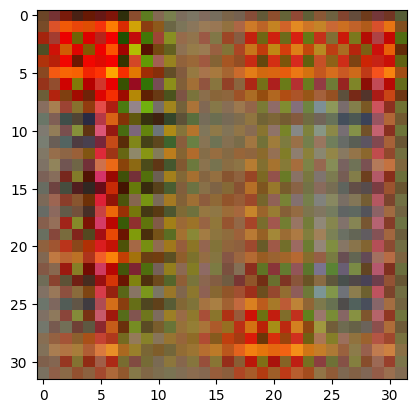

2/2 [==============================] - 0s 178ms/step
>2, 23/39, d1=0.314, d2=4.696 g=4.787


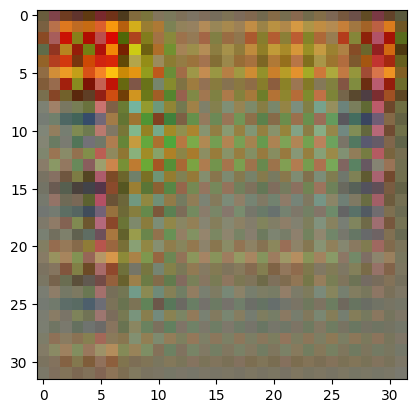

2/2 [==============================] - 1s 301ms/step
>2, 24/39, d1=0.615, d2=0.195 g=3.044


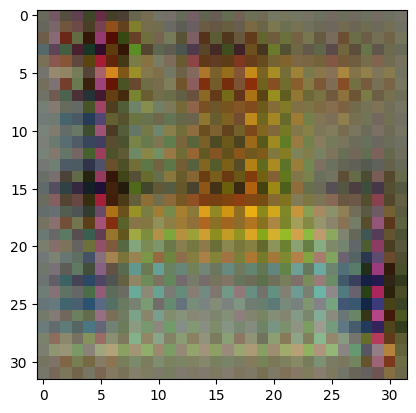

2/2 [==============================] - 0s 191ms/step
>2, 25/39, d1=0.531, d2=0.496 g=2.240


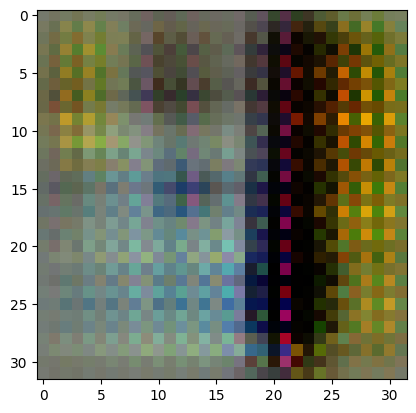

2/2 [==============================] - 0s 184ms/step
>2, 26/39, d1=0.576, d2=0.540 g=2.549


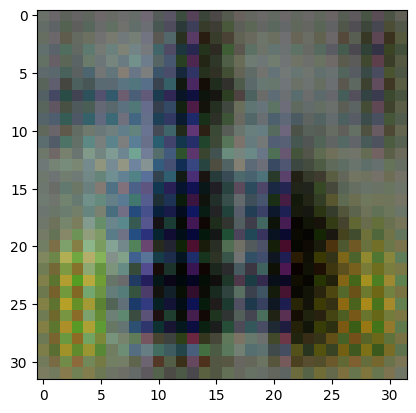

2/2 [==============================] - 0s 178ms/step
>2, 27/39, d1=0.960, d2=0.458 g=1.911


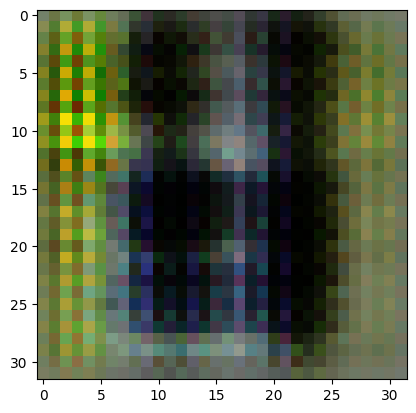

2/2 [==============================] - 0s 181ms/step
>2, 28/39, d1=0.437, d2=0.339 g=2.681


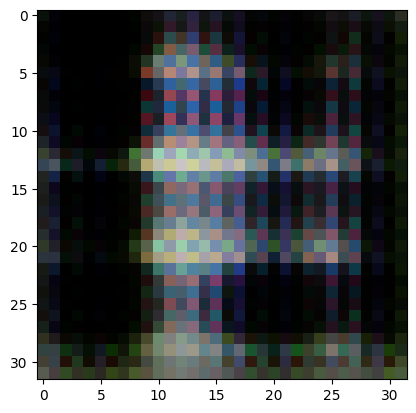

2/2 [==============================] - 0s 175ms/step
>2, 29/39, d1=0.657, d2=0.362 g=2.296


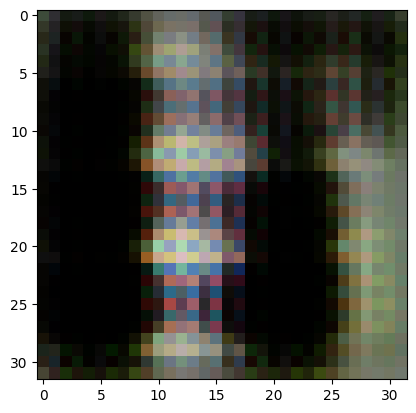

2/2 [==============================] - 0s 185ms/step
>2, 30/39, d1=0.652, d2=0.619 g=4.222


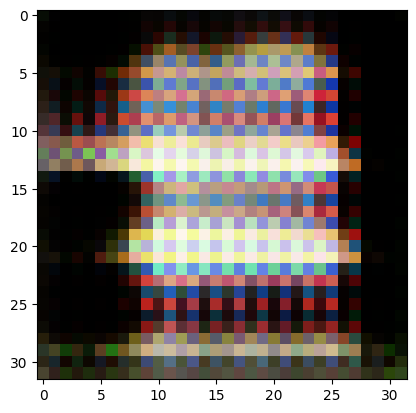

2/2 [==============================] - 0s 182ms/step
>2, 31/39, d1=0.945, d2=0.173 g=2.149


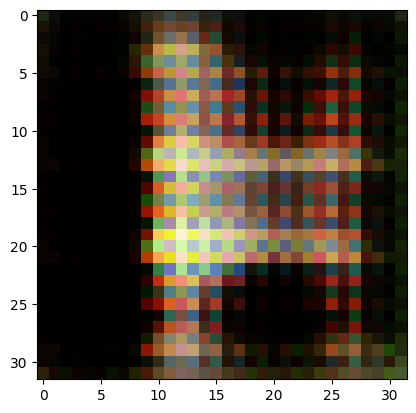

2/2 [==============================] - 0s 174ms/step
>2, 32/39, d1=0.793, d2=0.411 g=1.568


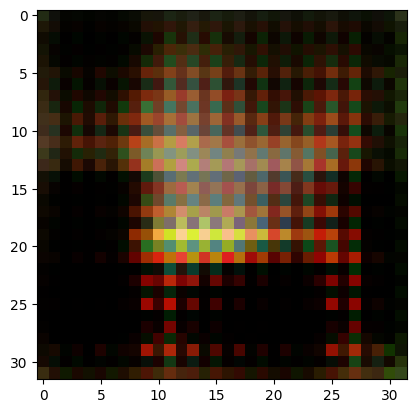

2/2 [==============================] - 1s 286ms/step
>2, 33/39, d1=0.476, d2=0.314 g=1.989


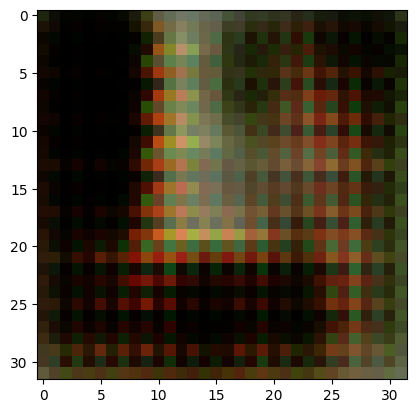

2/2 [==============================] - 0s 192ms/step
>2, 34/39, d1=0.400, d2=0.196 g=2.260


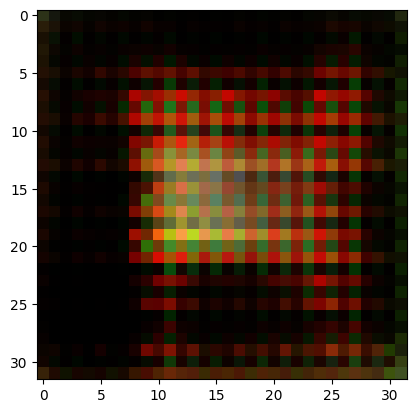

2/2 [==============================] - 0s 180ms/step
>2, 35/39, d1=0.394, d2=0.209 g=2.250


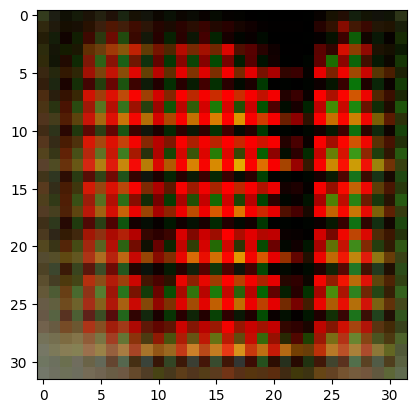

2/2 [==============================] - 1s 273ms/step
>2, 36/39, d1=0.497, d2=0.310 g=1.843


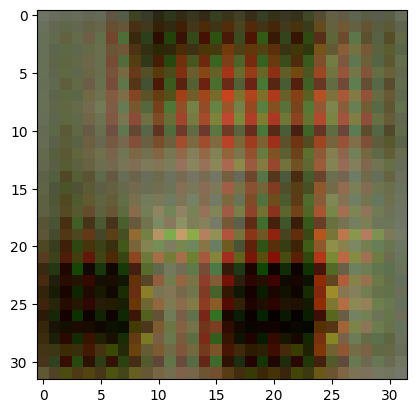

2/2 [==============================] - 0s 179ms/step
>2, 37/39, d1=0.520, d2=0.373 g=1.709


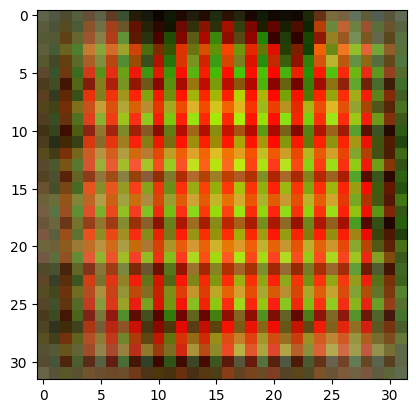

2/2 [==============================] - 0s 182ms/step
>2, 38/39, d1=0.376, d2=0.562 g=1.913


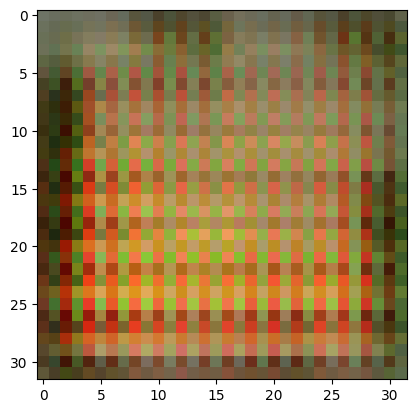

2/2 [==============================] - 1s 293ms/step
>2, 39/39, d1=0.371, d2=3.032 g=3.293


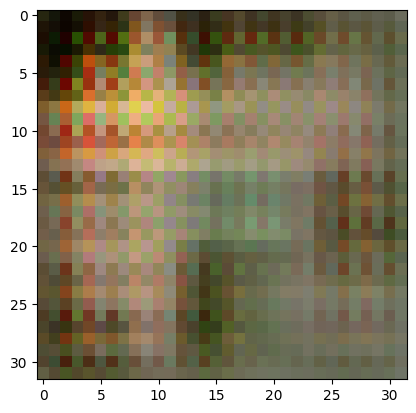

2/2 [==============================] - 0s 178ms/step
>3, 1/39, d1=0.697, d2=0.344 g=1.926


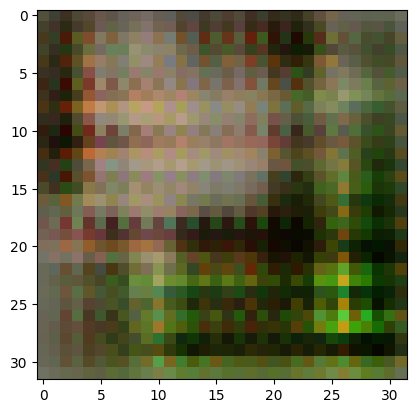

2/2 [==============================] - 0s 191ms/step
>3, 2/39, d1=0.741, d2=0.632 g=1.097


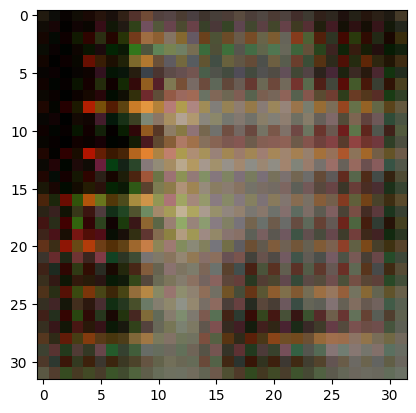

2/2 [==============================] - 1s 286ms/step
>3, 3/39, d1=0.582, d2=0.496 g=1.259


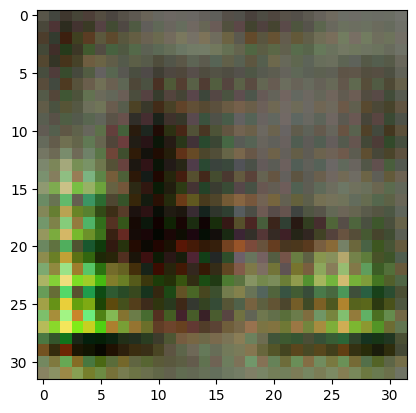

2/2 [==============================] - 0s 177ms/step
>3, 4/39, d1=0.699, d2=0.414 g=1.366


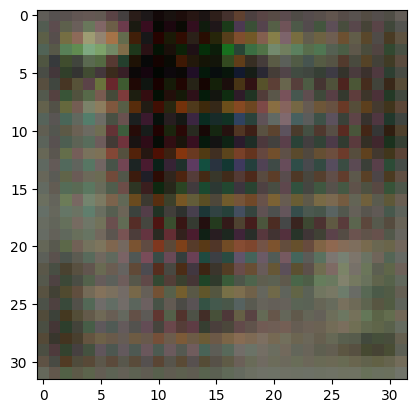

2/2 [==============================] - 0s 180ms/step
>3, 5/39, d1=0.761, d2=0.363 g=1.463


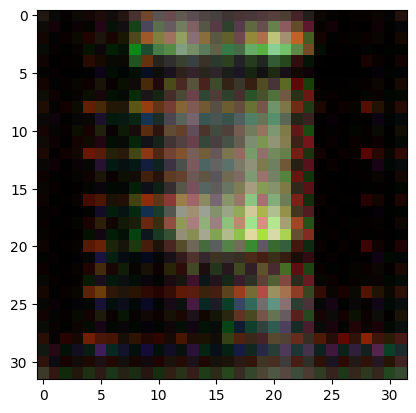

2/2 [==============================] - 1s 329ms/step
>3, 6/39, d1=0.493, d2=0.328 g=1.558


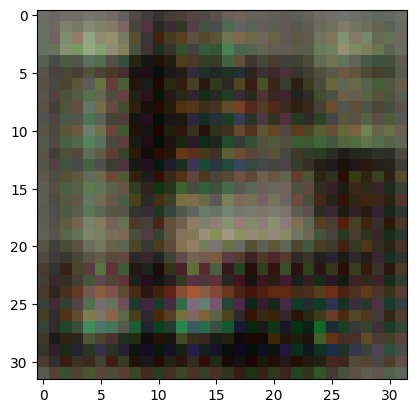

2/2 [==============================] - 0s 197ms/step
>3, 7/39, d1=0.725, d2=0.468 g=1.482


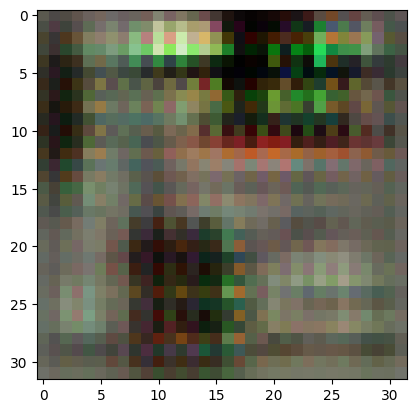

2/2 [==============================] - 0s 181ms/step
>3, 8/39, d1=0.713, d2=0.643 g=1.368


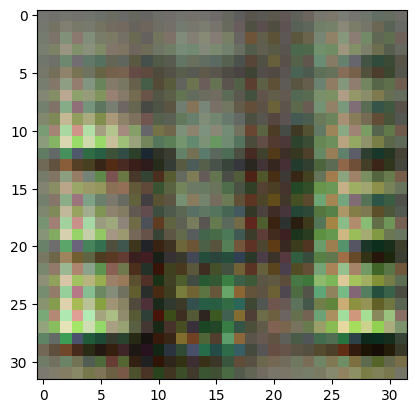

2/2 [==============================] - 1s 270ms/step
>3, 9/39, d1=0.555, d2=0.463 g=1.784


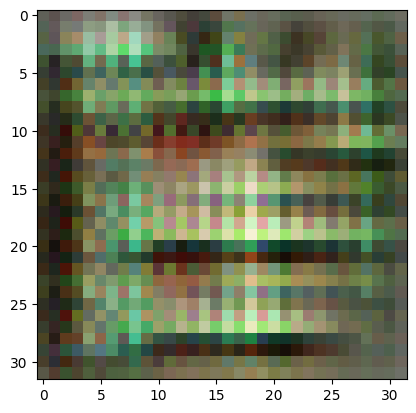

2/2 [==============================] - 0s 183ms/step
>3, 10/39, d1=0.607, d2=0.337 g=2.148


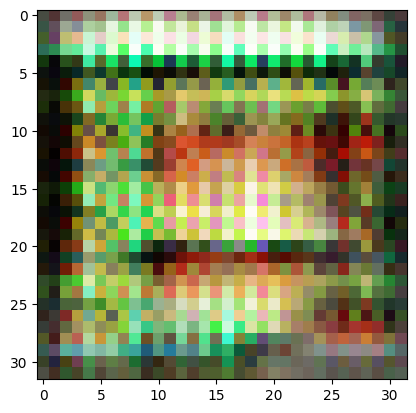

2/2 [==============================] - 0s 193ms/step
>3, 11/39, d1=0.542, d2=0.399 g=1.436


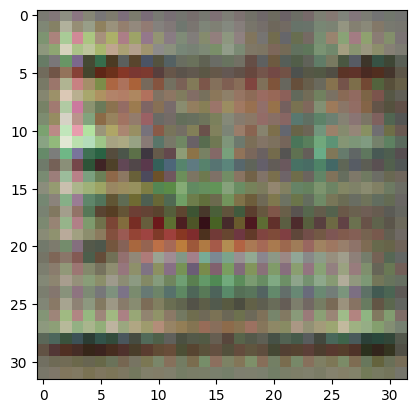

2/2 [==============================] - 1s 282ms/step
>3, 12/39, d1=0.642, d2=0.552 g=1.155


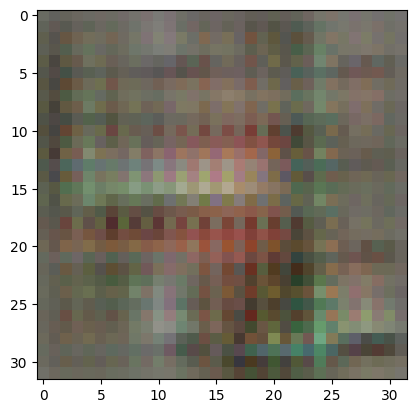

2/2 [==============================] - 0s 182ms/step
>3, 13/39, d1=0.549, d2=0.552 g=1.211


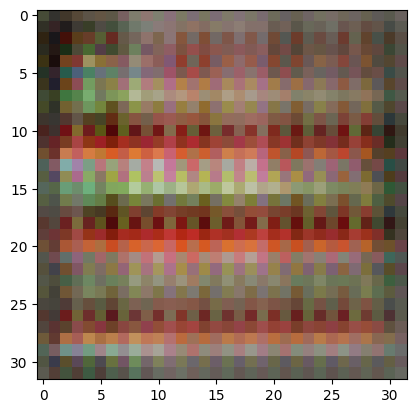

2/2 [==============================] - 0s 183ms/step
>3, 14/39, d1=0.513, d2=0.465 g=1.409


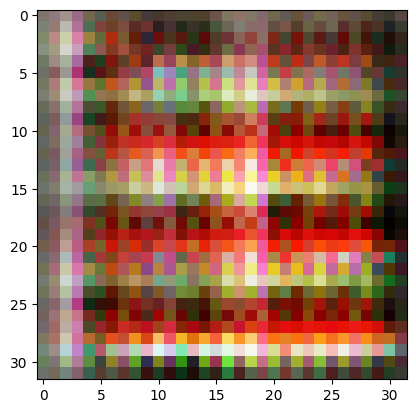

2/2 [==============================] - 1s 294ms/step
>3, 15/39, d1=0.463, d2=0.368 g=1.621


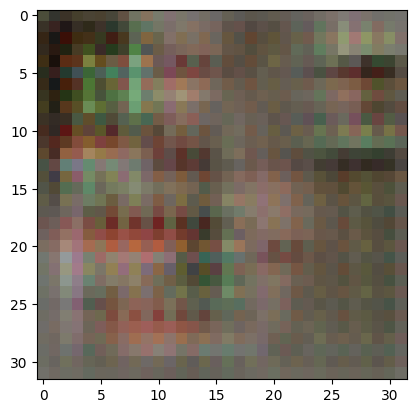

2/2 [==============================] - 0s 178ms/step
>3, 16/39, d1=0.518, d2=0.698 g=1.543


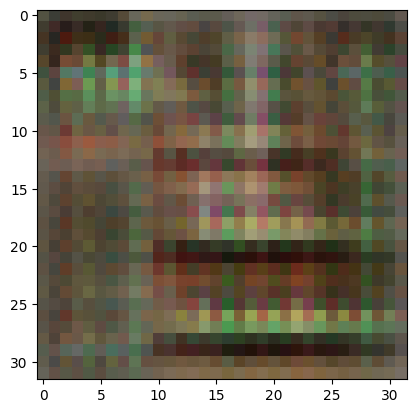

2/2 [==============================] - 0s 193ms/step
>3, 17/39, d1=0.486, d2=0.627 g=1.683


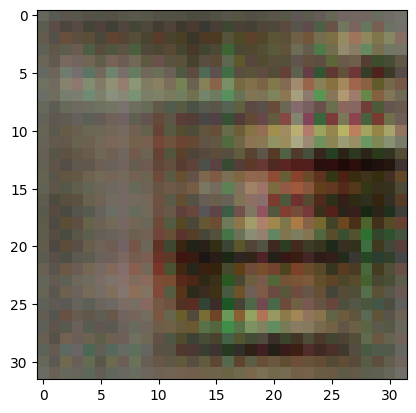

2/2 [==============================] - 1s 269ms/step
>3, 18/39, d1=0.594, d2=0.453 g=1.699


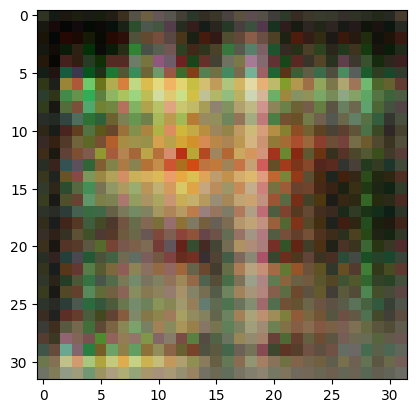

2/2 [==============================] - 0s 181ms/step
>3, 19/39, d1=0.591, d2=0.448 g=1.653


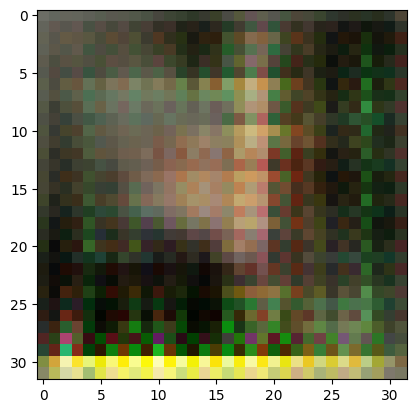

2/2 [==============================] - 0s 180ms/step
>3, 20/39, d1=0.660, d2=0.440 g=1.587


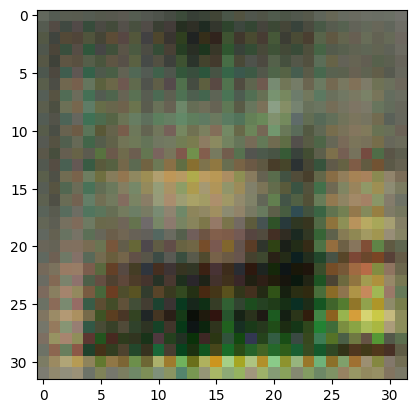

2/2 [==============================] - 1s 284ms/step
>3, 21/39, d1=0.647, d2=0.568 g=1.670


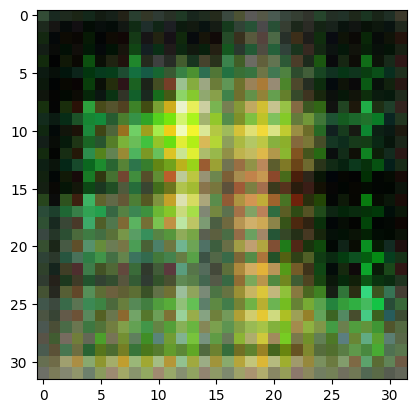

2/2 [==============================] - 0s 177ms/step
>3, 22/39, d1=0.575, d2=0.808 g=1.903


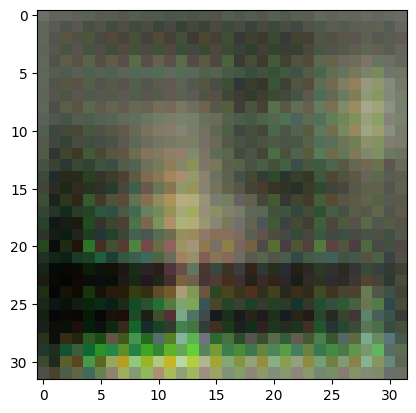

2/2 [==============================] - 0s 181ms/step
>3, 23/39, d1=0.568, d2=0.616 g=1.757


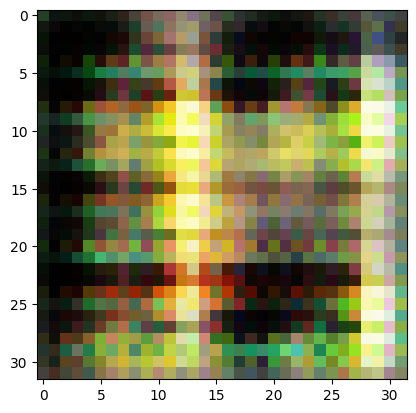

2/2 [==============================] - 1s 269ms/step
>3, 24/39, d1=0.691, d2=0.542 g=1.608


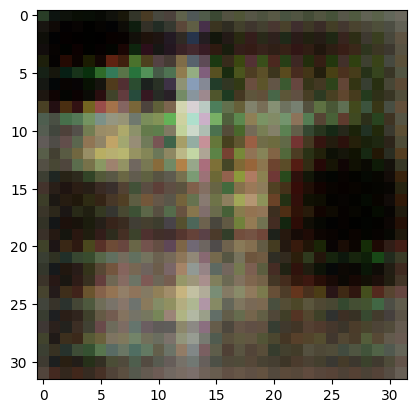

2/2 [==============================] - 0s 181ms/step
>3, 25/39, d1=0.689, d2=0.594 g=1.393


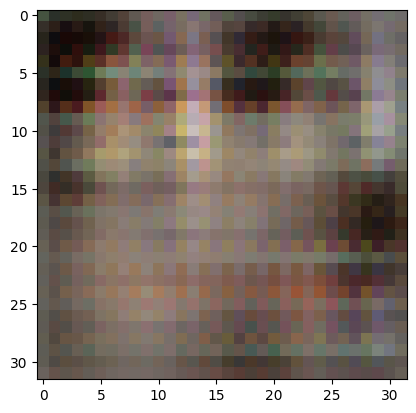

2/2 [==============================] - 0s 183ms/step
>3, 26/39, d1=0.632, d2=0.546 g=1.479


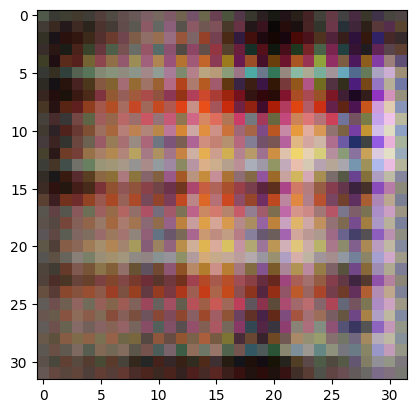

2/2 [==============================] - 1s 280ms/step
>3, 27/39, d1=0.616, d2=0.489 g=1.405


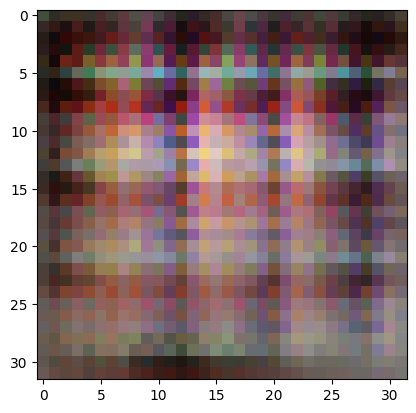

2/2 [==============================] - 0s 177ms/step
>3, 28/39, d1=0.528, d2=0.572 g=1.307


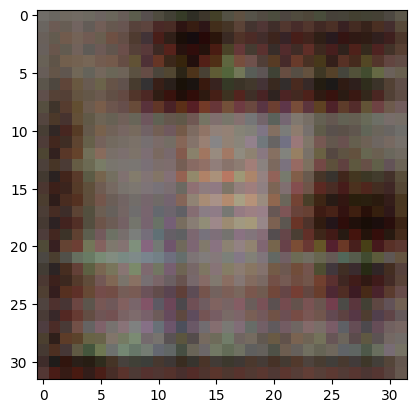

2/2 [==============================] - 0s 187ms/step
>3, 29/39, d1=0.548, d2=0.649 g=1.176


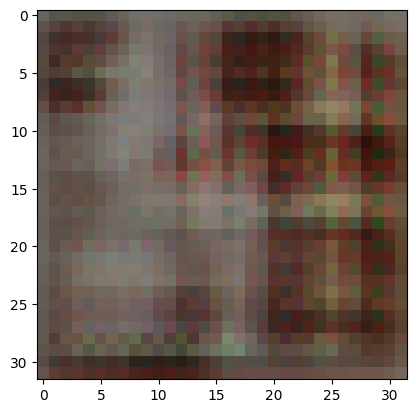

2/2 [==============================] - 1s 296ms/step
>3, 30/39, d1=0.484, d2=0.551 g=1.293


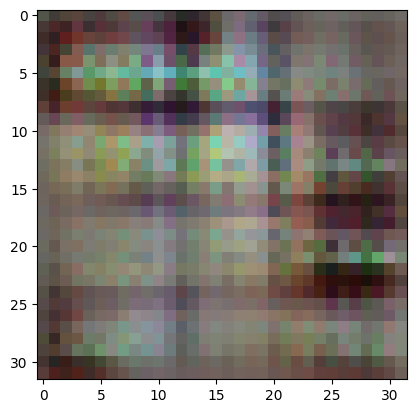

2/2 [==============================] - 0s 200ms/step
>3, 31/39, d1=0.541, d2=0.409 g=1.371


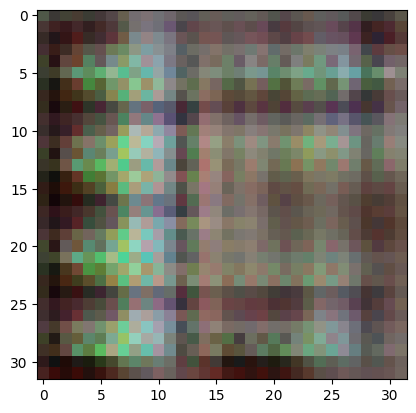

2/2 [==============================] - 0s 189ms/step
>3, 32/39, d1=0.418, d2=0.441 g=1.511


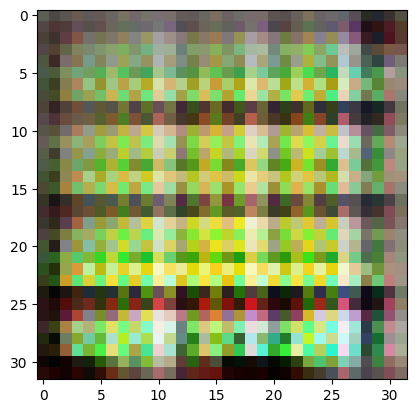

2/2 [==============================] - 1s 270ms/step
>3, 33/39, d1=0.614, d2=0.514 g=1.644


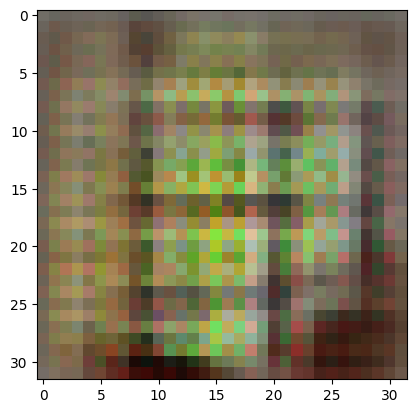

2/2 [==============================] - 0s 182ms/step
>3, 34/39, d1=0.486, d2=0.303 g=1.861


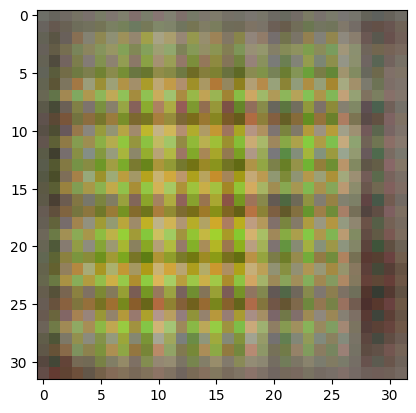

2/2 [==============================] - 0s 185ms/step
>3, 35/39, d1=0.481, d2=0.319 g=1.807


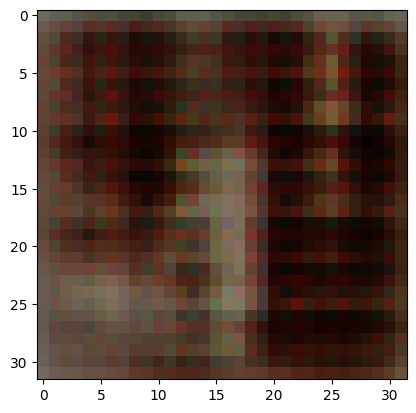

2/2 [==============================] - 1s 279ms/step
>3, 36/39, d1=0.421, d2=0.355 g=1.768


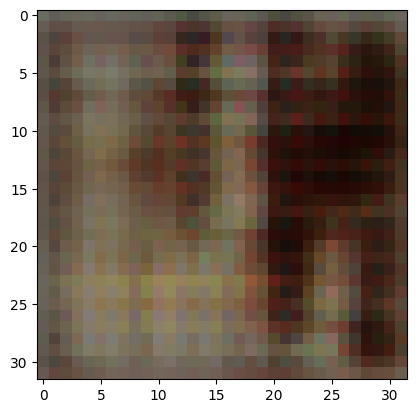

2/2 [==============================] - 0s 180ms/step
>3, 37/39, d1=0.292, d2=0.375 g=1.988


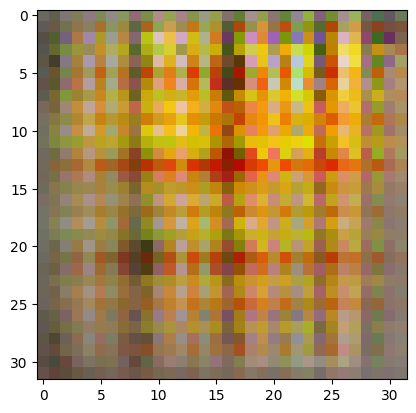

2/2 [==============================] - 0s 187ms/step
>3, 38/39, d1=0.491, d2=0.522 g=1.805


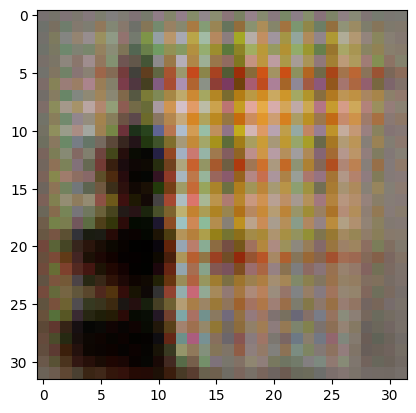

2/2 [==============================] - 0s 196ms/step
>3, 39/39, d1=0.464, d2=1.071 g=1.553


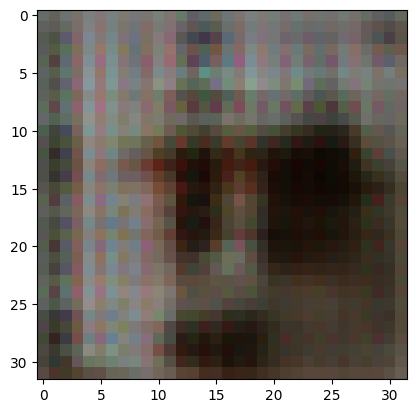

2/2 [==============================] - 0s 187ms/step
>4, 1/39, d1=0.597, d2=0.659 g=1.775


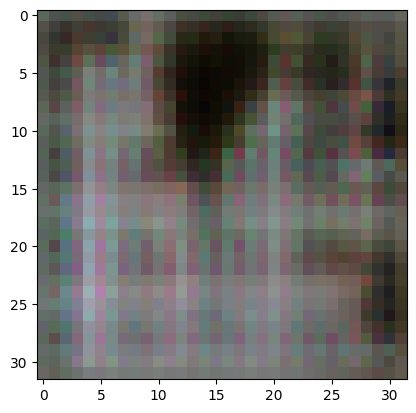

2/2 [==============================] - 0s 181ms/step
>4, 2/39, d1=0.639, d2=0.380 g=1.921


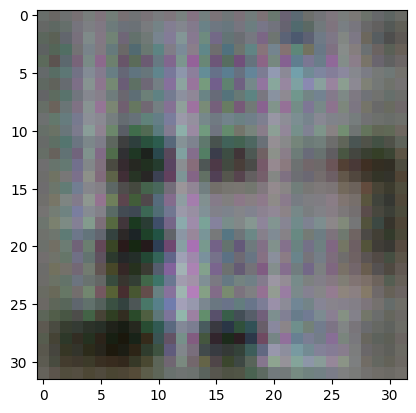

2/2 [==============================] - 0s 185ms/step
>4, 3/39, d1=0.746, d2=0.521 g=1.489


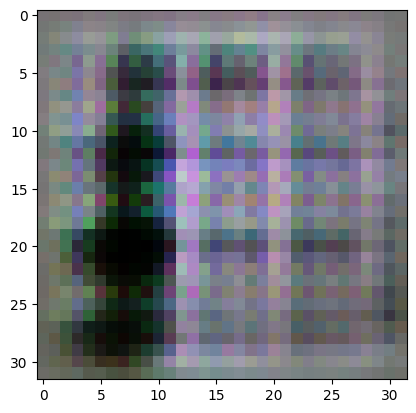

2/2 [==============================] - 0s 180ms/step
>4, 4/39, d1=0.563, d2=0.540 g=1.709


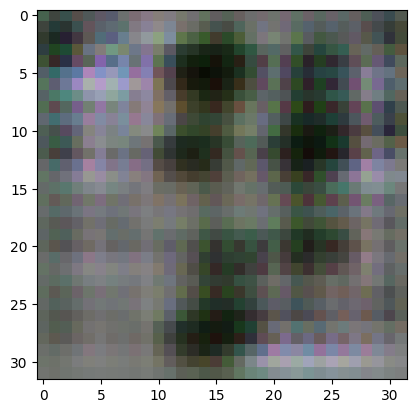

2/2 [==============================] - 0s 182ms/step
>4, 5/39, d1=0.594, d2=0.446 g=2.144


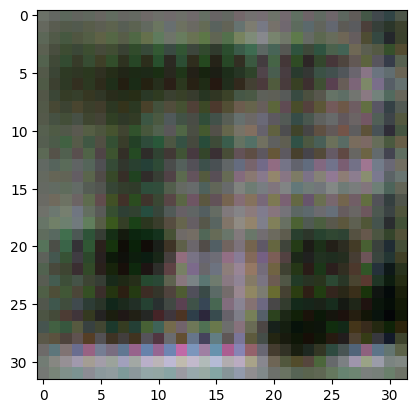

2/2 [==============================] - 1s 324ms/step
>4, 6/39, d1=0.786, d2=0.428 g=1.599


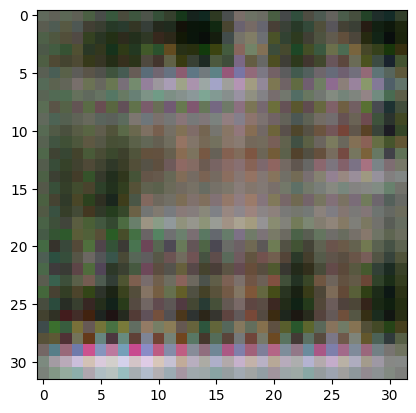

2/2 [==============================] - 0s 184ms/step
>4, 7/39, d1=0.588, d2=0.409 g=1.543


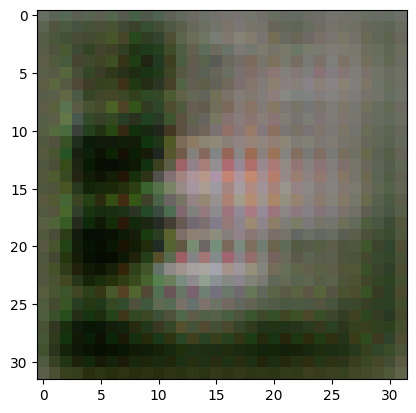

2/2 [==============================] - 0s 184ms/step
>4, 8/39, d1=0.619, d2=0.692 g=1.925


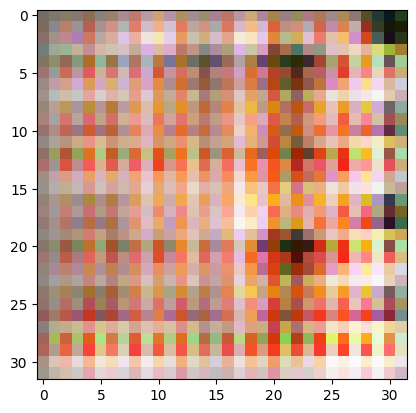

2/2 [==============================] - 0s 185ms/step
>4, 9/39, d1=0.681, d2=0.478 g=1.443


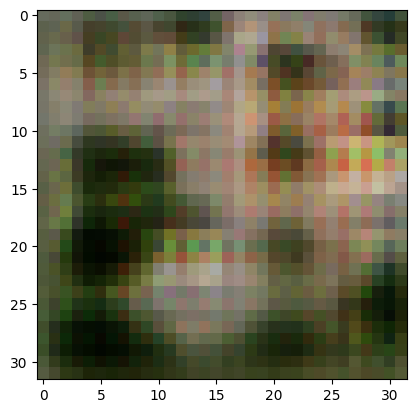

2/2 [==============================] - 0s 182ms/step
>4, 10/39, d1=0.794, d2=0.634 g=1.098


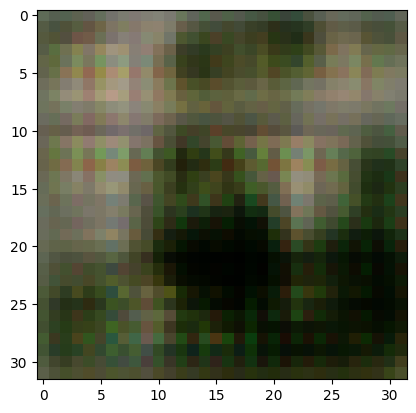

2/2 [==============================] - 0s 187ms/step
>4, 11/39, d1=0.641, d2=0.574 g=1.259


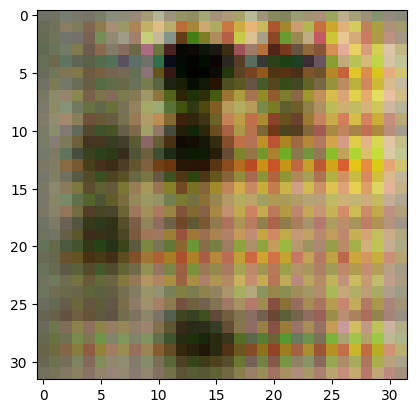

2/2 [==============================] - 0s 182ms/step
>4, 12/39, d1=0.573, d2=0.507 g=1.380


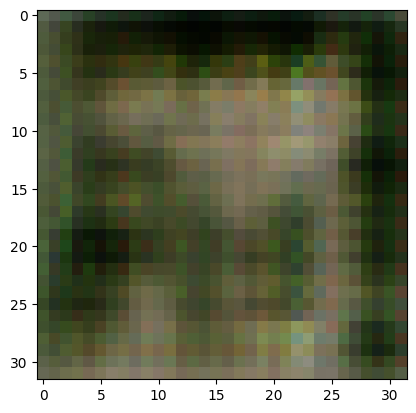

2/2 [==============================] - 0s 182ms/step
>4, 13/39, d1=0.596, d2=0.530 g=1.336


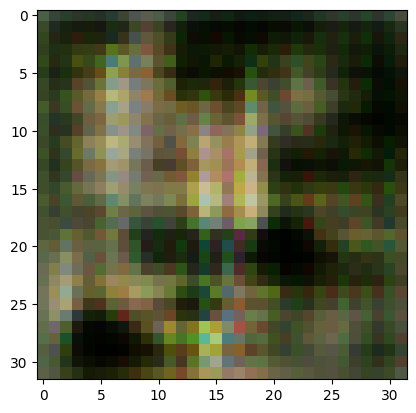

2/2 [==============================] - 0s 190ms/step
>4, 14/39, d1=0.613, d2=0.602 g=1.352


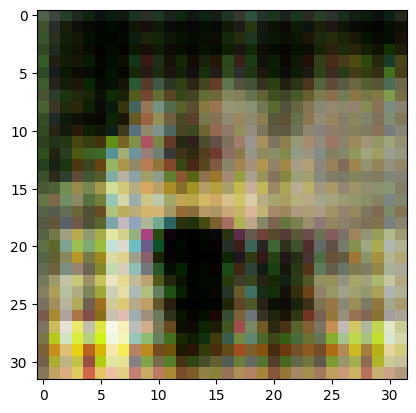

2/2 [==============================] - 0s 180ms/step
>4, 15/39, d1=0.633, d2=0.588 g=1.660


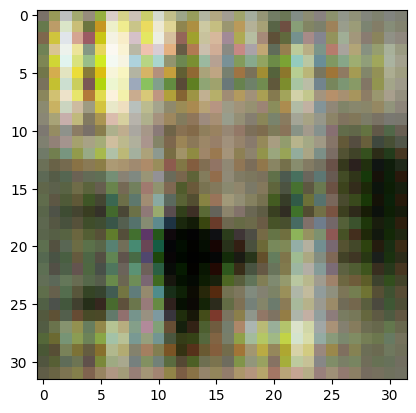

2/2 [==============================] - 0s 196ms/step
>4, 16/39, d1=0.697, d2=0.403 g=1.565


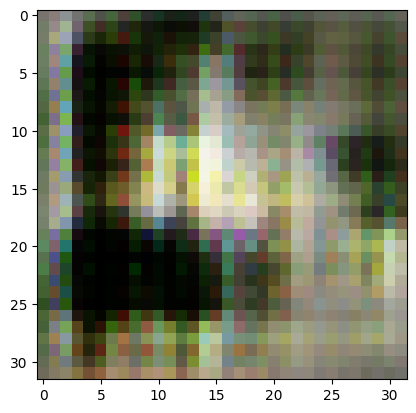

2/2 [==============================] - 0s 265ms/step
>4, 17/39, d1=0.756, d2=0.697 g=1.323


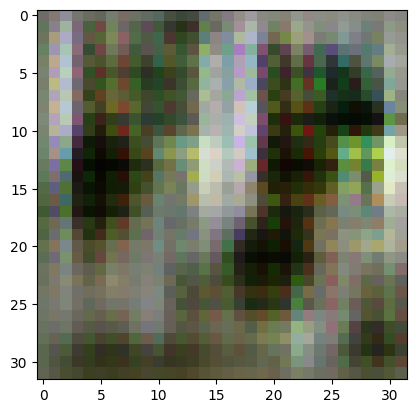

2/2 [==============================] - 0s 187ms/step
>4, 18/39, d1=0.586, d2=0.517 g=1.309


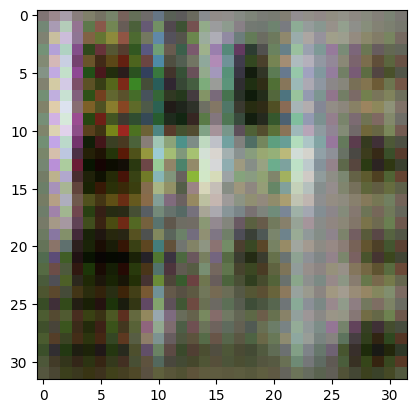

2/2 [==============================] - 0s 187ms/step
>4, 19/39, d1=0.576, d2=0.788 g=1.190


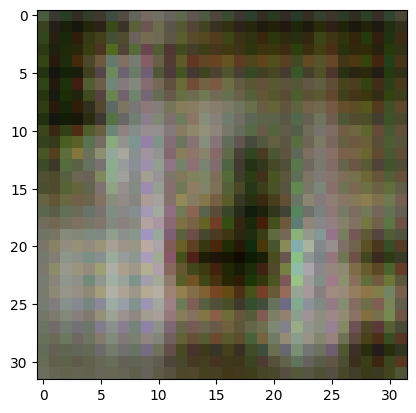

2/2 [==============================] - 1s 295ms/step
>4, 20/39, d1=0.571, d2=0.747 g=1.000


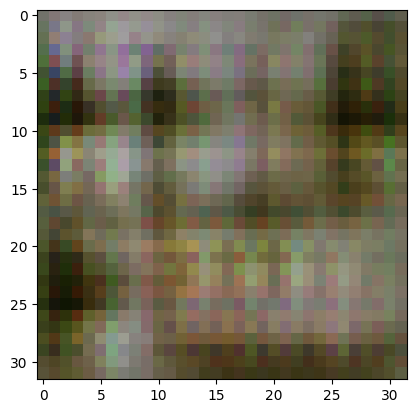

2/2 [==============================] - 0s 188ms/step
>4, 21/39, d1=0.605, d2=0.672 g=0.972


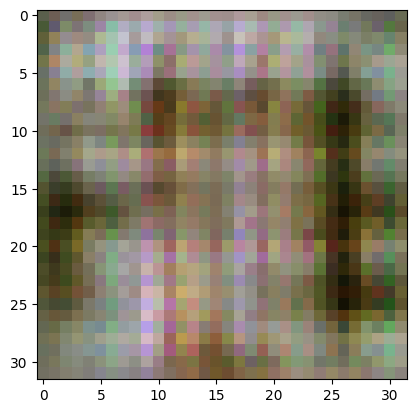

2/2 [==============================] - 0s 200ms/step
>4, 22/39, d1=0.504, d2=0.665 g=1.025


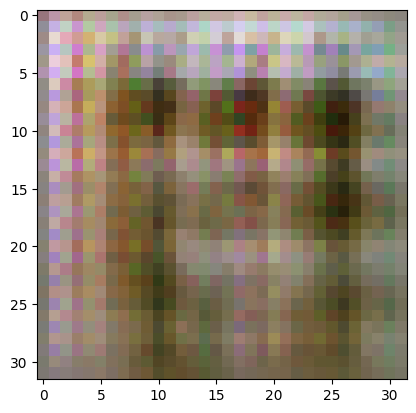

2/2 [==============================] - 1s 300ms/step
>4, 23/39, d1=0.400, d2=0.581 g=1.118


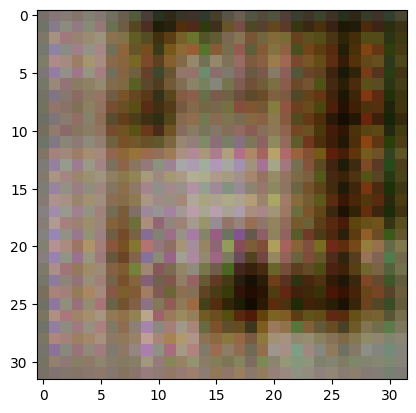

2/2 [==============================] - 0s 197ms/step
>4, 24/39, d1=0.418, d2=0.538 g=1.200


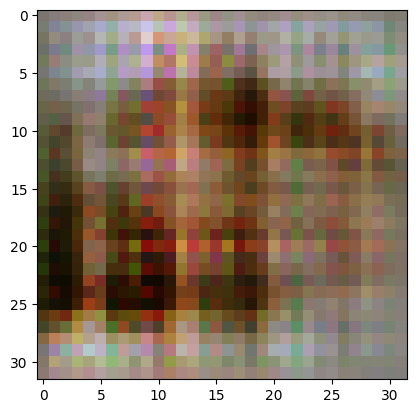

2/2 [==============================] - 0s 187ms/step
>4, 25/39, d1=0.405, d2=0.578 g=1.379


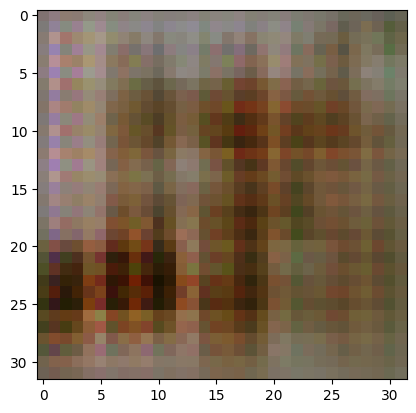

2/2 [==============================] - 1s 293ms/step
>4, 26/39, d1=0.358, d2=0.691 g=1.591


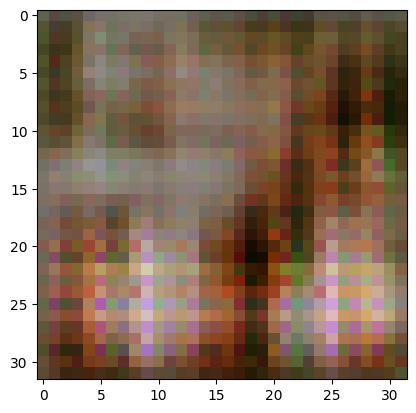

2/2 [==============================] - 0s 194ms/step
>4, 27/39, d1=0.486, d2=0.394 g=1.776


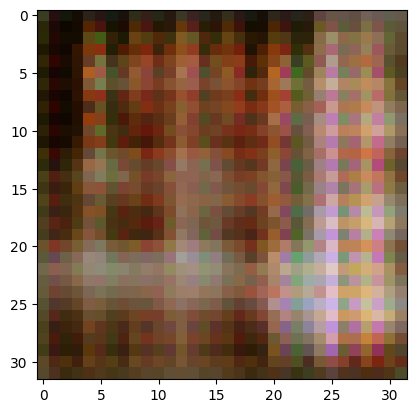

2/2 [==============================] - 0s 205ms/step
>4, 28/39, d1=0.479, d2=0.675 g=1.761


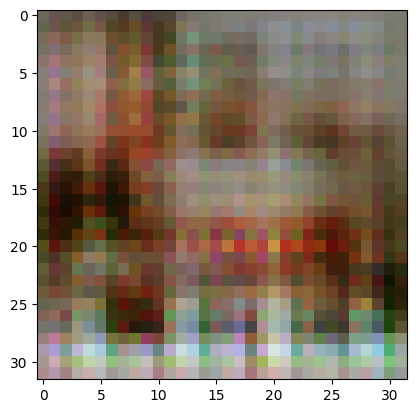

2/2 [==============================] - 1s 268ms/step
>4, 29/39, d1=0.489, d2=0.798 g=1.842


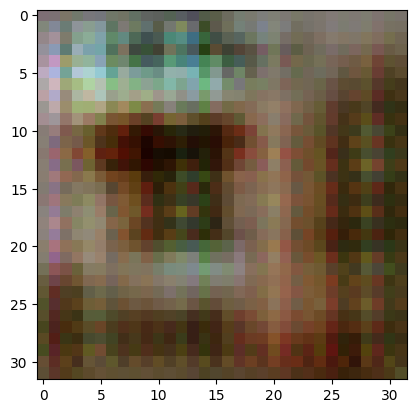

2/2 [==============================] - 0s 190ms/step
>4, 30/39, d1=0.748, d2=0.649 g=1.708


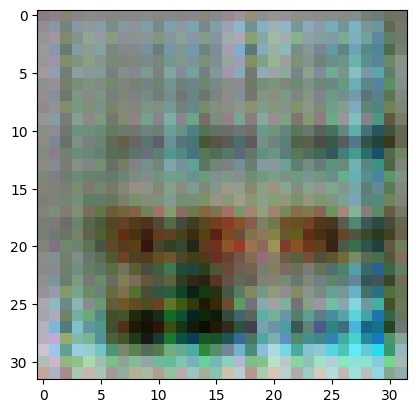

2/2 [==============================] - 0s 190ms/step
>4, 31/39, d1=0.856, d2=0.532 g=1.530


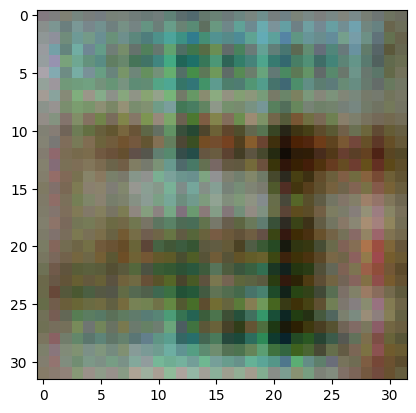

2/2 [==============================] - 1s 287ms/step
>4, 32/39, d1=0.560, d2=0.598 g=1.574


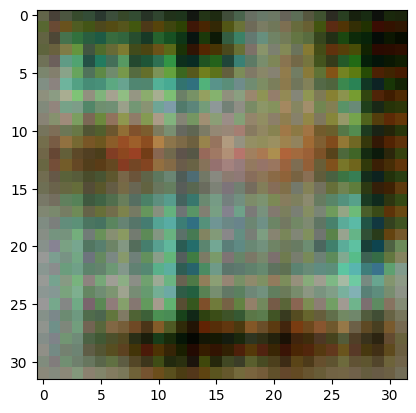

2/2 [==============================] - 0s 186ms/step
>4, 33/39, d1=0.524, d2=0.647 g=1.637


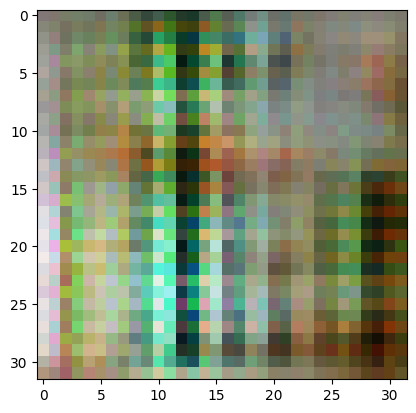

2/2 [==============================] - 0s 189ms/step
>4, 34/39, d1=0.557, d2=0.479 g=1.665


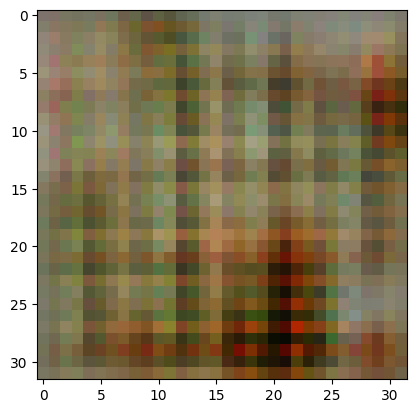

2/2 [==============================] - 1s 285ms/step
>4, 35/39, d1=0.548, d2=0.518 g=1.636


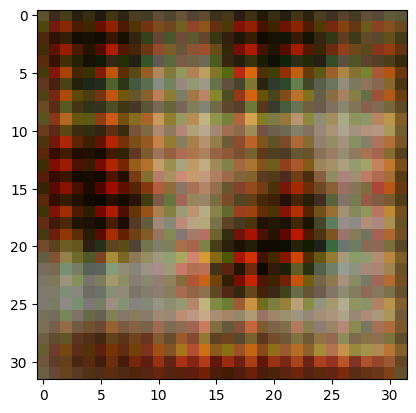

2/2 [==============================] - 0s 191ms/step
>4, 36/39, d1=0.596, d2=0.677 g=1.643


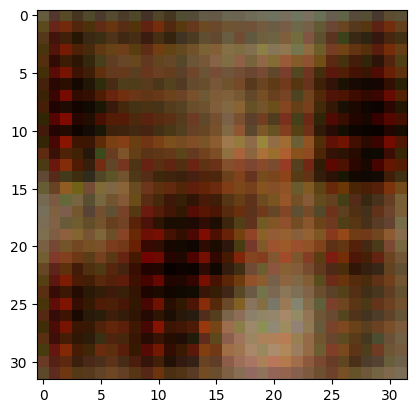

2/2 [==============================] - 0s 188ms/step
>4, 37/39, d1=0.609, d2=0.572 g=1.688


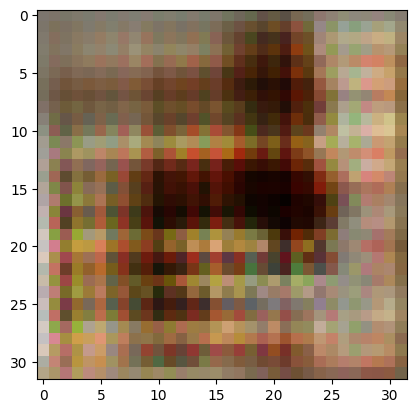

2/2 [==============================] - 1s 267ms/step
>4, 38/39, d1=0.759, d2=0.673 g=1.498


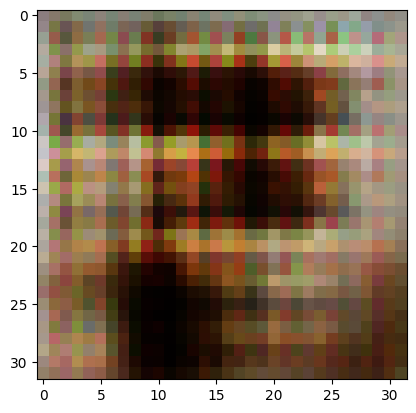

2/2 [==============================] - 0s 192ms/step
>4, 39/39, d1=0.848, d2=0.583 g=1.408


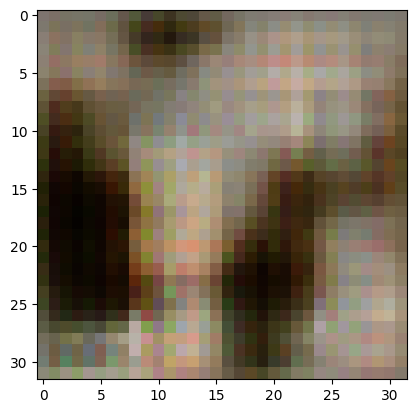

2/2 [==============================] - 0s 186ms/step
>5, 1/39, d1=0.632, d2=0.447 g=1.338


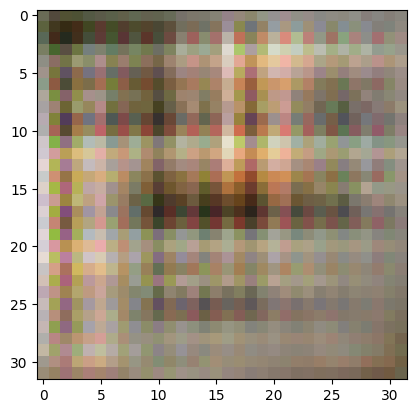

2/2 [==============================] - 1s 277ms/step
>5, 2/39, d1=0.681, d2=0.789 g=1.369


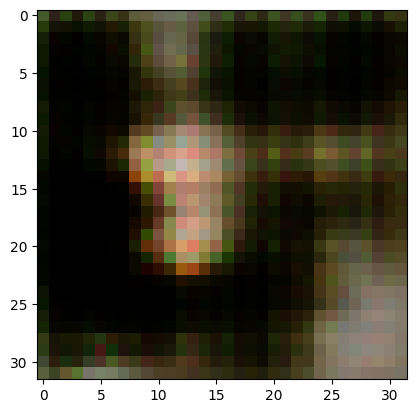

2/2 [==============================] - 0s 193ms/step
>5, 3/39, d1=0.792, d2=0.524 g=1.248


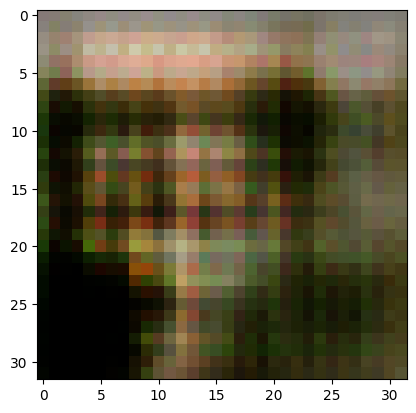

2/2 [==============================] - 0s 212ms/step
>5, 4/39, d1=0.557, d2=0.679 g=1.372


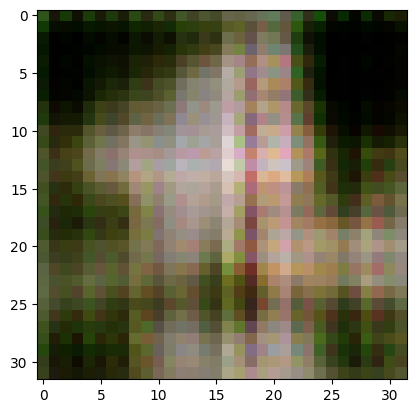

2/2 [==============================] - 1s 277ms/step
>5, 5/39, d1=0.696, d2=0.527 g=1.375


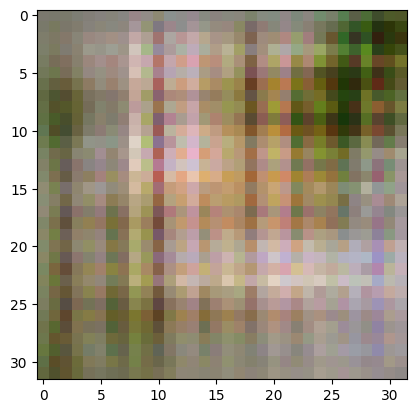

2/2 [==============================] - 0s 191ms/step
>5, 6/39, d1=0.666, d2=0.690 g=1.178


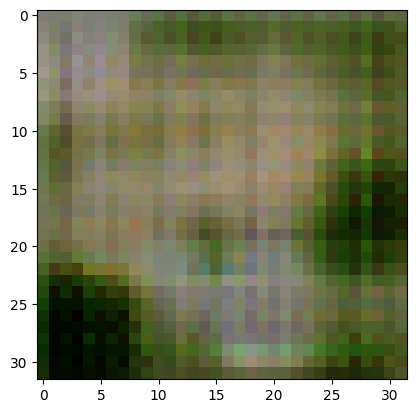

2/2 [==============================] - 0s 193ms/step
>5, 7/39, d1=0.622, d2=0.624 g=1.265


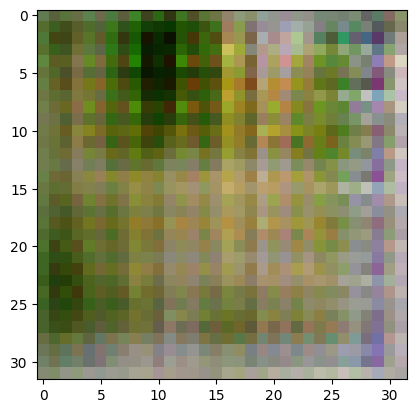

2/2 [==============================] - 1s 339ms/step
>5, 8/39, d1=0.727, d2=0.560 g=1.351


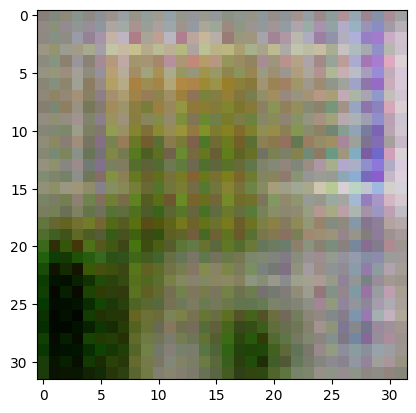

2/2 [==============================] - 0s 191ms/step
>5, 9/39, d1=0.726, d2=0.564 g=1.334


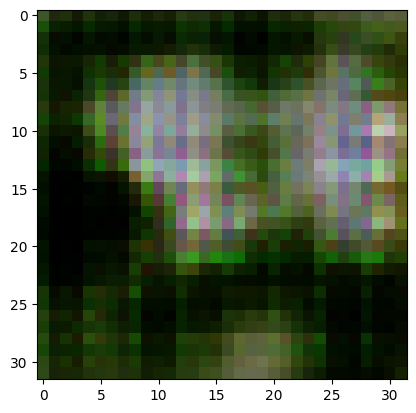

2/2 [==============================] - 0s 194ms/step
>5, 10/39, d1=0.669, d2=0.460 g=1.606


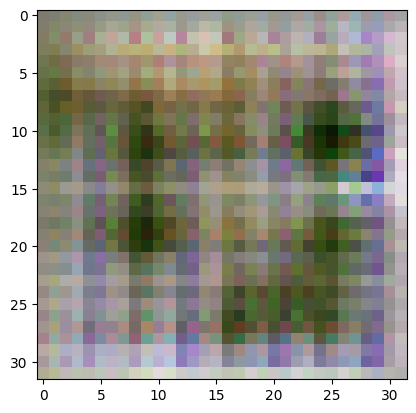

2/2 [==============================] - 1s 298ms/step
>5, 11/39, d1=0.733, d2=0.567 g=1.370


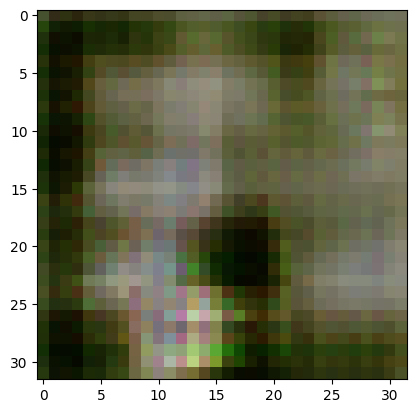

2/2 [==============================] - 0s 194ms/step
>5, 12/39, d1=0.767, d2=0.765 g=0.959


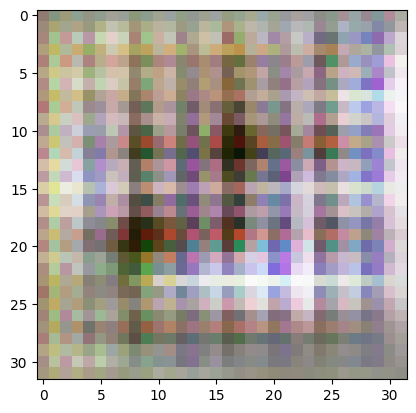

2/2 [==============================] - 0s 195ms/step
>5, 13/39, d1=0.607, d2=0.887 g=0.926


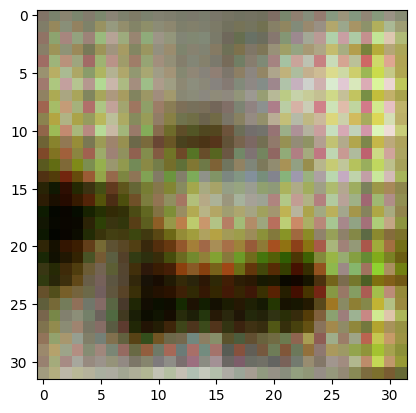

2/2 [==============================] - 1s 299ms/step
>5, 14/39, d1=0.699, d2=0.658 g=1.008


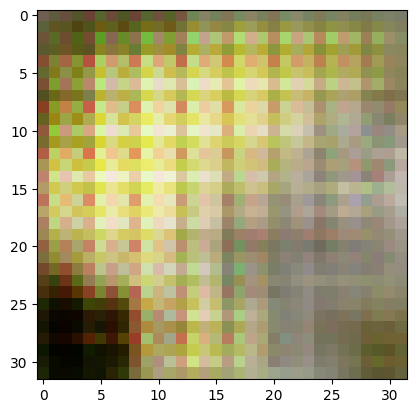

2/2 [==============================] - 0s 190ms/step
>5, 15/39, d1=0.736, d2=0.574 g=1.016


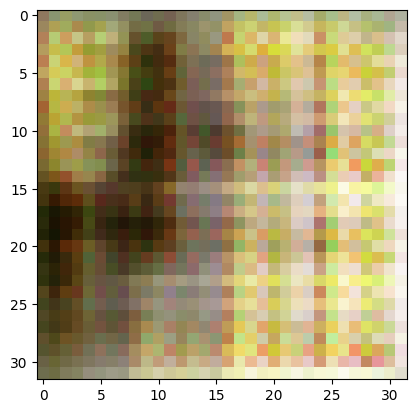

2/2 [==============================] - 0s 193ms/step
>5, 16/39, d1=0.704, d2=0.526 g=1.006


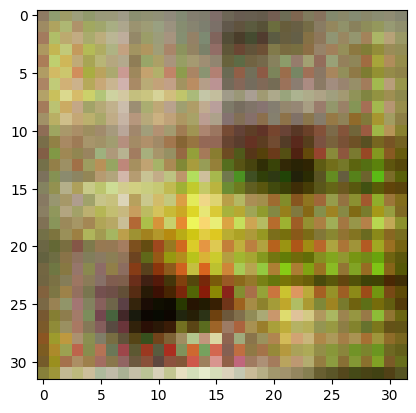

2/2 [==============================] - 1s 302ms/step
>5, 17/39, d1=0.630, d2=0.550 g=1.074


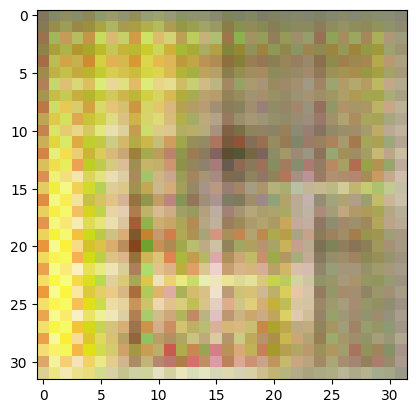

2/2 [==============================] - 0s 187ms/step
>5, 18/39, d1=0.590, d2=0.607 g=1.125


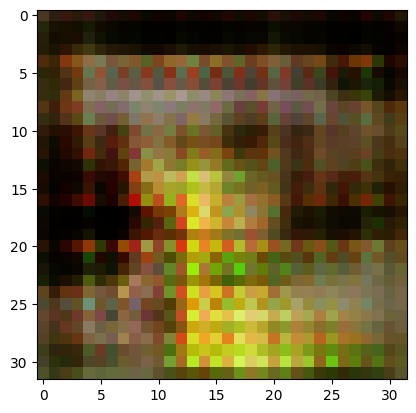

2/2 [==============================] - 0s 191ms/step
>5, 19/39, d1=0.574, d2=0.559 g=1.198


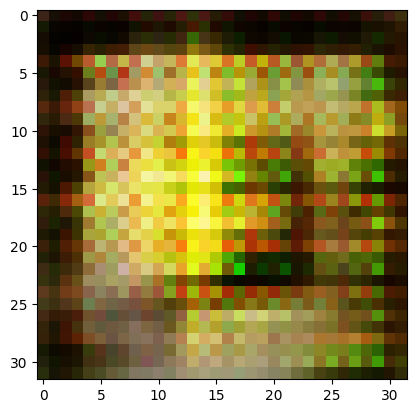

2/2 [==============================] - 0s 202ms/step
>5, 20/39, d1=0.492, d2=0.547 g=1.197


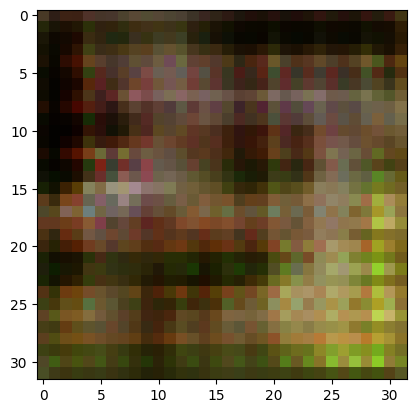

2/2 [==============================] - 0s 200ms/step
>5, 21/39, d1=0.532, d2=0.580 g=1.154


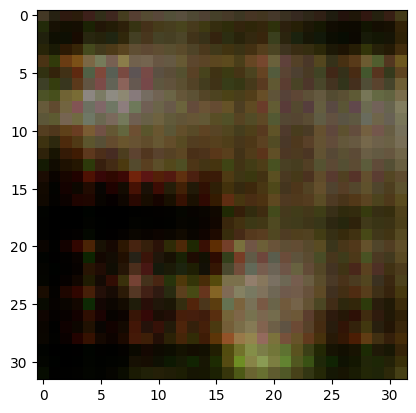

2/2 [==============================] - 0s 199ms/step
>5, 22/39, d1=0.617, d2=0.910 g=1.294


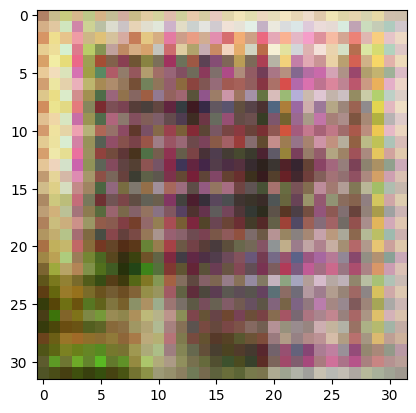

2/2 [==============================] - 0s 203ms/step
>5, 23/39, d1=0.859, d2=0.467 g=1.159


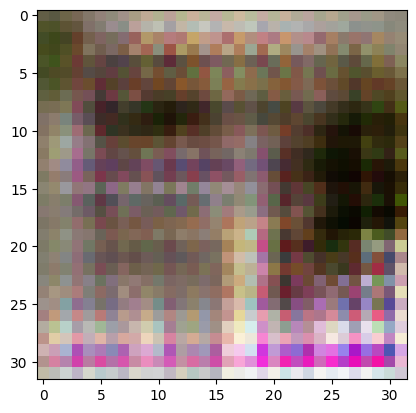

2/2 [==============================] - 0s 206ms/step
>5, 24/39, d1=0.731, d2=0.598 g=1.116


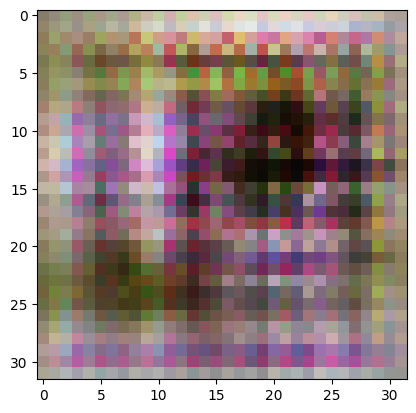

2/2 [==============================] - 0s 204ms/step
>5, 25/39, d1=0.756, d2=0.775 g=1.180


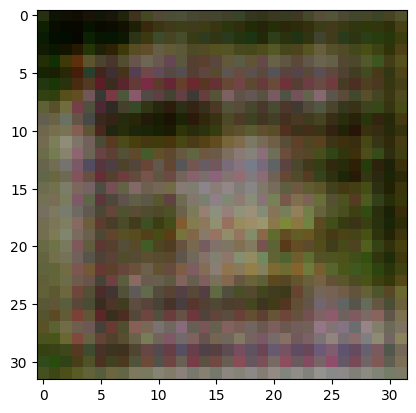

2/2 [==============================] - 0s 193ms/step
>5, 26/39, d1=0.733, d2=0.544 g=1.219


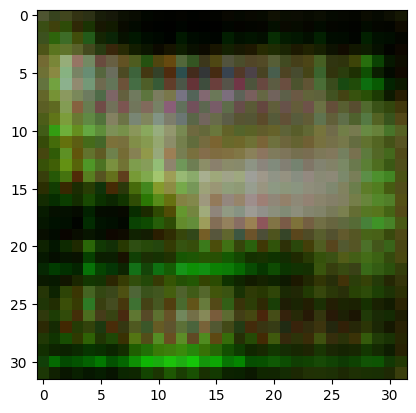

2/2 [==============================] - 0s 198ms/step
>5, 27/39, d1=0.753, d2=0.546 g=1.304


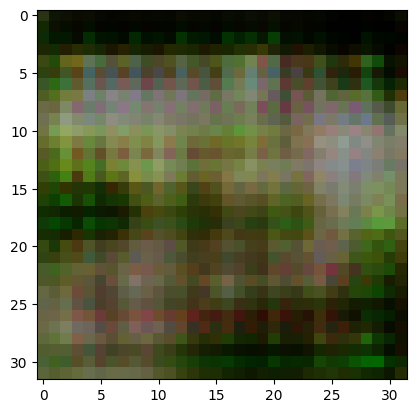

2/2 [==============================] - 1s 273ms/step
>5, 28/39, d1=0.607, d2=0.465 g=1.360


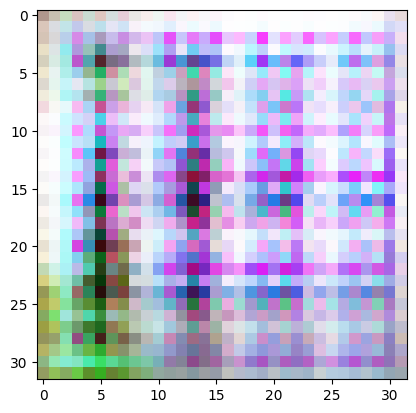

2/2 [==============================] - 0s 212ms/step
>5, 29/39, d1=0.616, d2=0.479 g=1.250


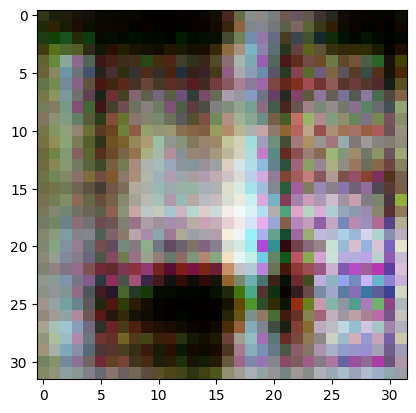

2/2 [==============================] - 0s 207ms/step
>5, 30/39, d1=0.568, d2=0.655 g=1.345


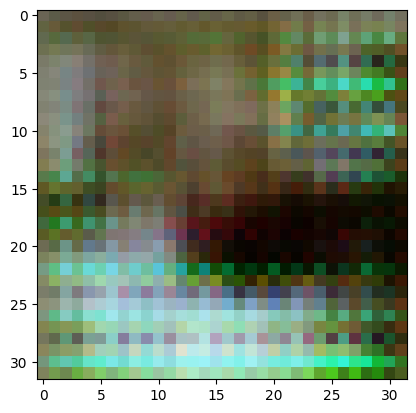

2/2 [==============================] - 1s 287ms/step
>5, 31/39, d1=0.729, d2=0.566 g=1.166


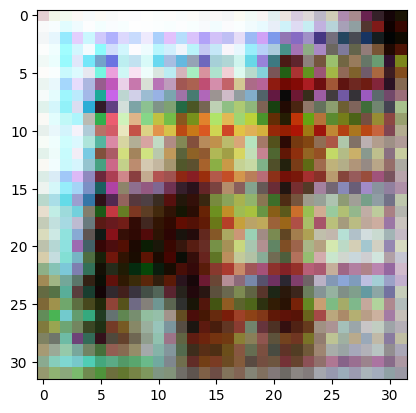

2/2 [==============================] - 0s 202ms/step
>5, 32/39, d1=0.508, d2=0.613 g=1.148


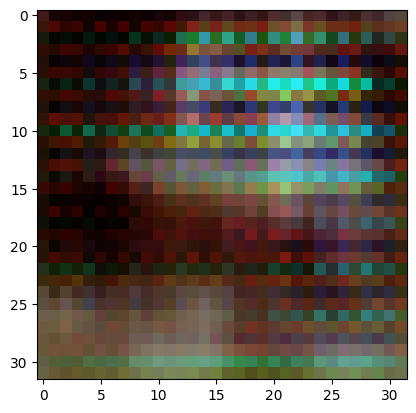

2/2 [==============================] - 0s 188ms/step
>5, 33/39, d1=0.563, d2=0.673 g=1.340


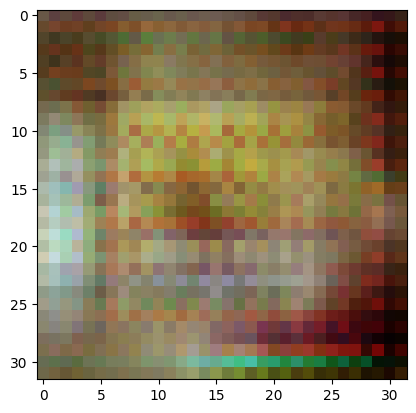

2/2 [==============================] - 1s 270ms/step
>5, 34/39, d1=0.529, d2=0.590 g=1.660


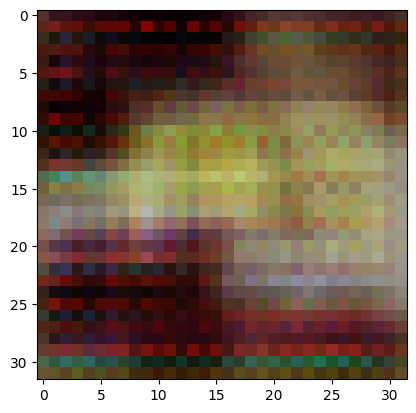

2/2 [==============================] - 0s 189ms/step
>5, 35/39, d1=0.596, d2=0.464 g=1.602


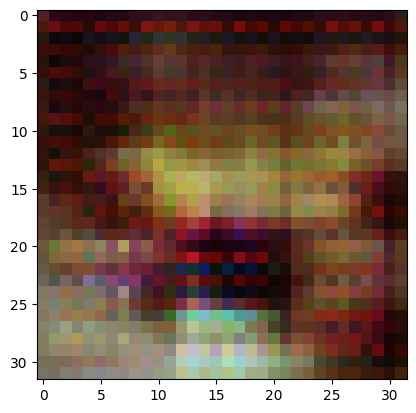

2/2 [==============================] - 0s 195ms/step
>5, 36/39, d1=0.673, d2=0.924 g=1.628


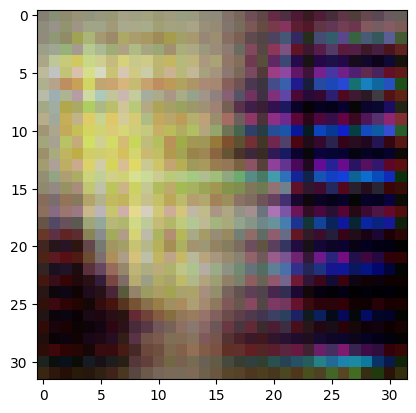

2/2 [==============================] - 0s 205ms/step
>5, 37/39, d1=0.865, d2=0.670 g=1.521


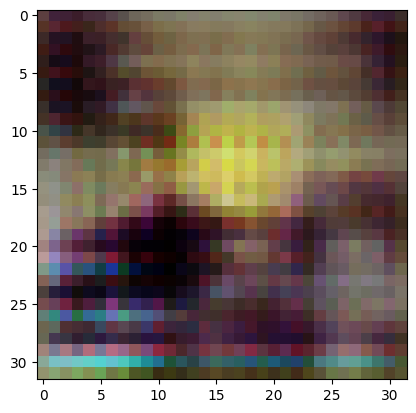

2/2 [==============================] - 0s 197ms/step
>5, 38/39, d1=0.862, d2=0.588 g=1.430


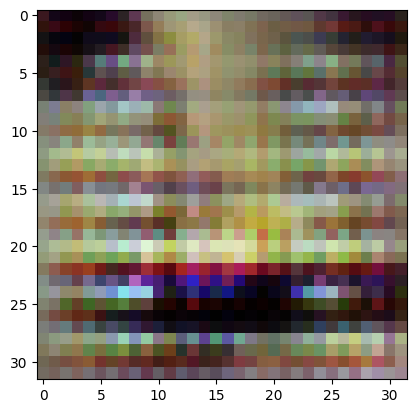

2/2 [==============================] - 0s 192ms/step
>5, 39/39, d1=0.784, d2=0.439 g=1.705


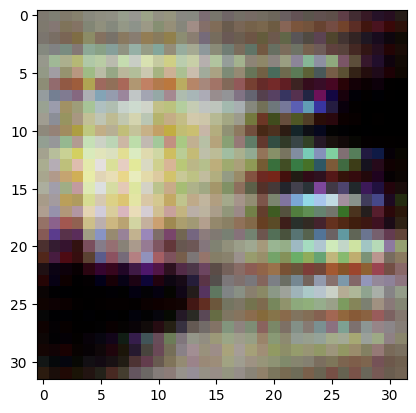

2/2 [==============================] - 0s 227ms/step
>6, 1/39, d1=0.790, d2=0.357 g=1.793


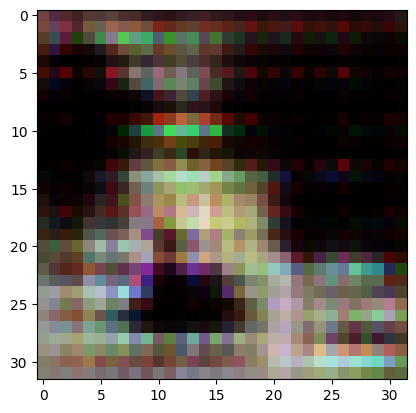

2/2 [==============================] - 0s 211ms/step
>6, 2/39, d1=0.750, d2=0.422 g=1.773


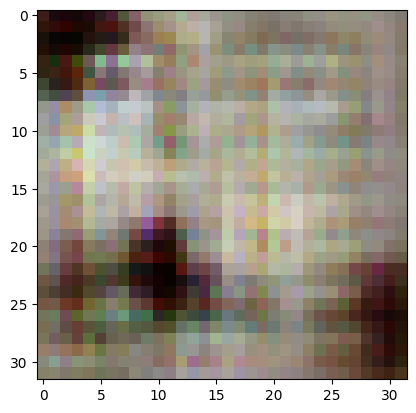

2/2 [==============================] - 0s 199ms/step
>6, 3/39, d1=0.554, d2=0.557 g=1.684


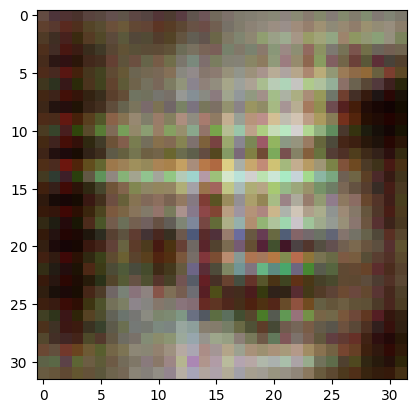

2/2 [==============================] - 0s 202ms/step
>6, 4/39, d1=0.622, d2=0.694 g=1.004


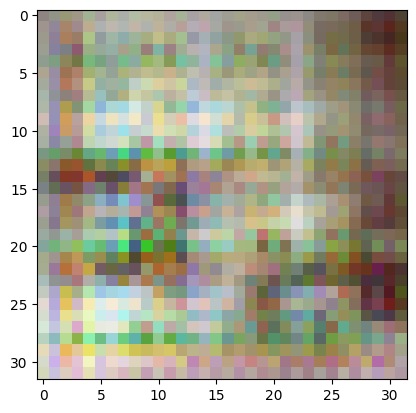

2/2 [==============================] - 0s 205ms/step
>6, 5/39, d1=0.590, d2=0.718 g=1.009


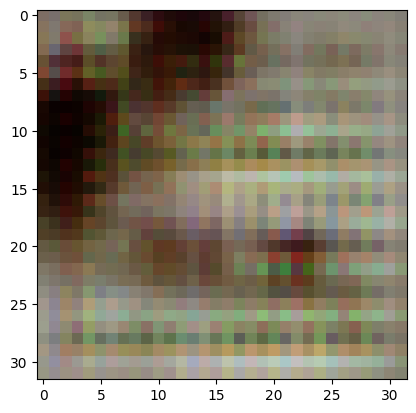

2/2 [==============================] - 0s 194ms/step
>6, 6/39, d1=0.557, d2=0.506 g=1.263


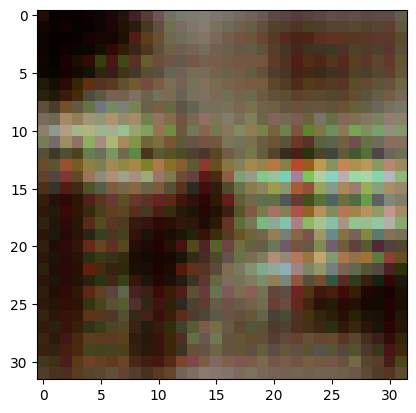

2/2 [==============================] - 0s 187ms/step
>6, 7/39, d1=0.493, d2=0.464 g=1.427


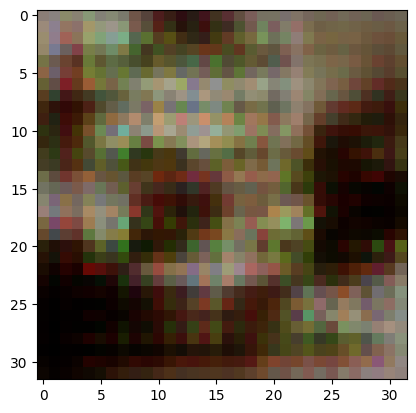

2/2 [==============================] - 0s 190ms/step
>6, 8/39, d1=0.441, d2=0.469 g=1.480


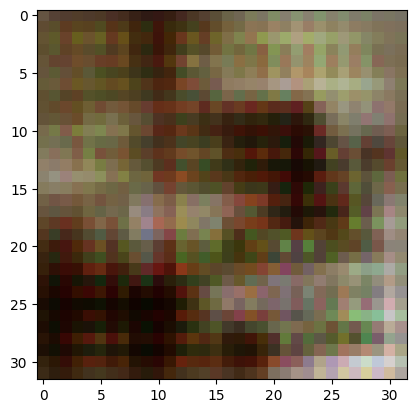

2/2 [==============================] - 0s 195ms/step
>6, 9/39, d1=0.490, d2=0.584 g=1.354


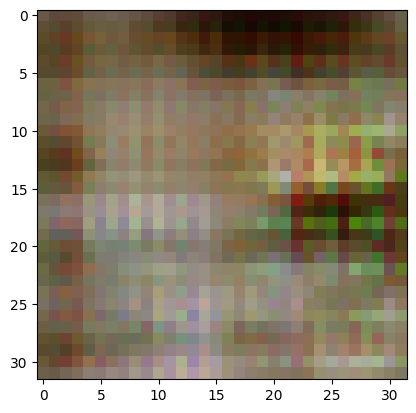

2/2 [==============================] - 0s 193ms/step
>6, 10/39, d1=0.713, d2=0.825 g=1.223


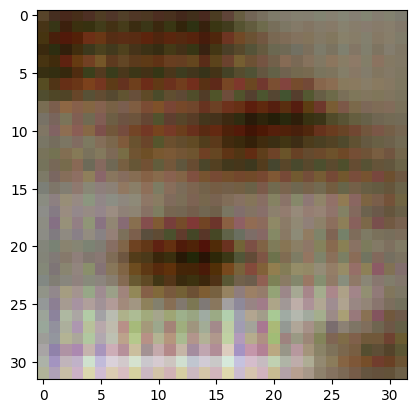

2/2 [==============================] - 0s 191ms/step
>6, 11/39, d1=0.677, d2=0.524 g=1.206


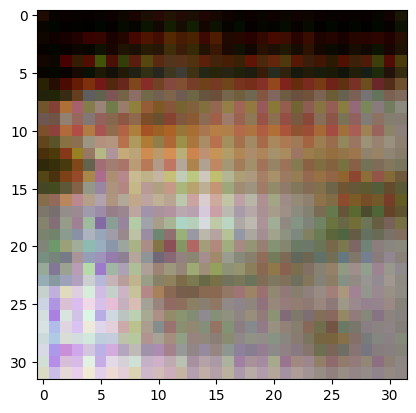

2/2 [==============================] - 1s 298ms/step
>6, 12/39, d1=0.641, d2=0.750 g=1.187


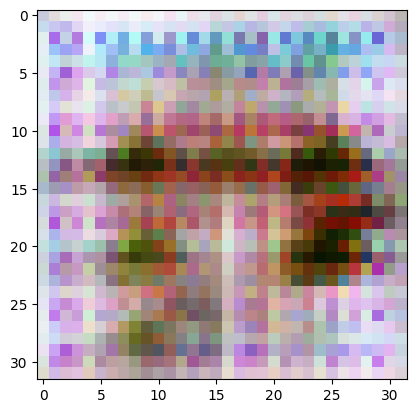

2/2 [==============================] - 0s 193ms/step
>6, 13/39, d1=0.790, d2=0.504 g=1.188


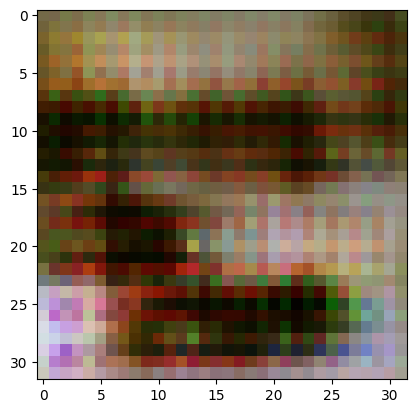

2/2 [==============================] - 0s 195ms/step
>6, 14/39, d1=0.797, d2=0.551 g=1.148


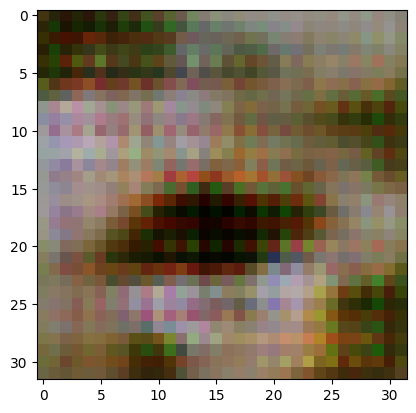

2/2 [==============================] - 1s 286ms/step
>6, 15/39, d1=0.703, d2=0.557 g=1.079


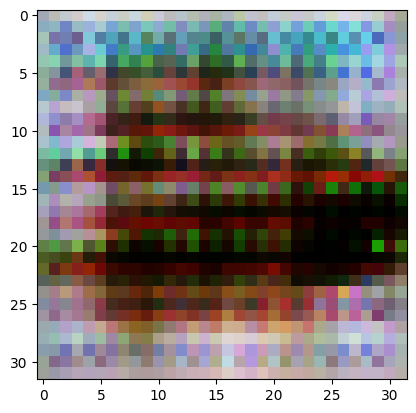

2/2 [==============================] - 0s 194ms/step
>6, 16/39, d1=0.545, d2=0.621 g=1.051


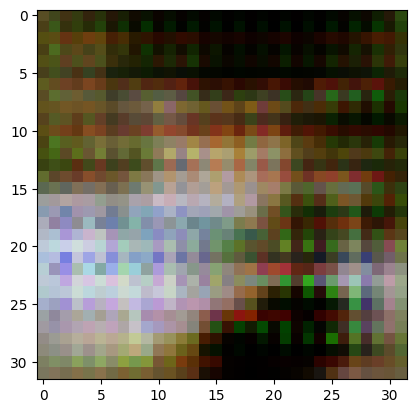

2/2 [==============================] - 0s 193ms/step
>6, 17/39, d1=0.509, d2=1.051 g=1.152


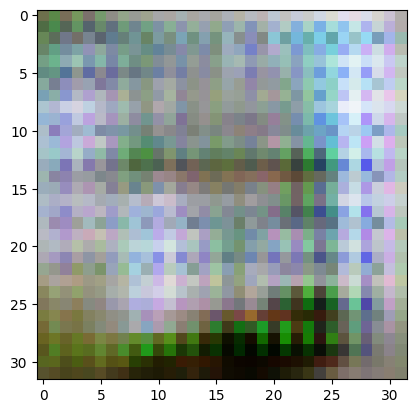

2/2 [==============================] - 1s 314ms/step
>6, 18/39, d1=0.603, d2=0.580 g=1.153


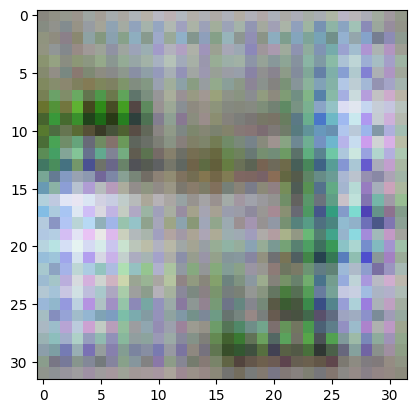

2/2 [==============================] - 0s 194ms/step
>6, 19/39, d1=0.590, d2=0.673 g=1.293


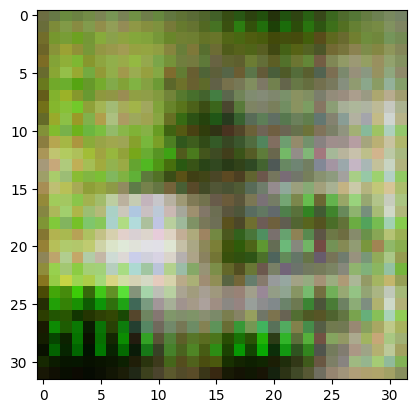

2/2 [==============================] - 0s 189ms/step
>6, 20/39, d1=0.597, d2=0.731 g=1.479


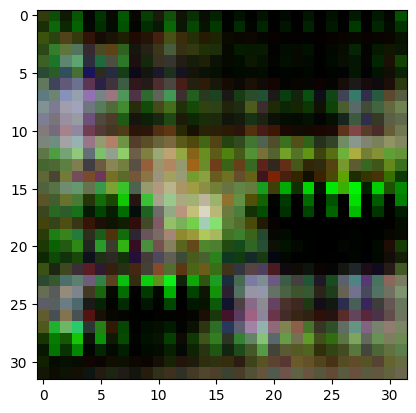

2/2 [==============================] - 1s 284ms/step
>6, 21/39, d1=0.580, d2=0.873 g=1.605


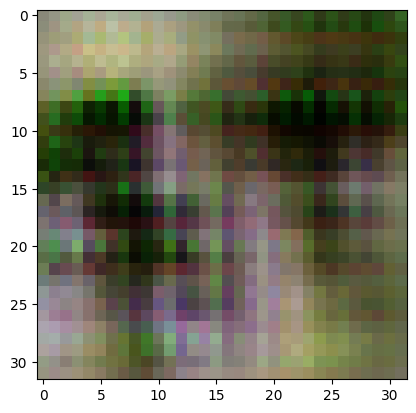

2/2 [==============================] - 0s 193ms/step
>6, 22/39, d1=0.771, d2=0.503 g=1.515


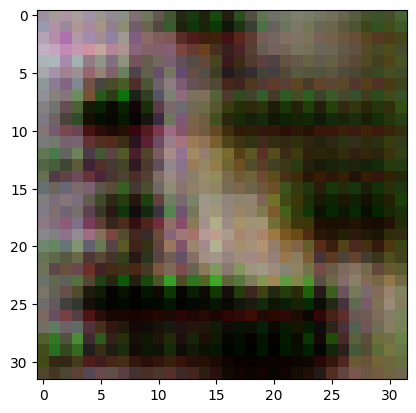

2/2 [==============================] - 0s 192ms/step
>6, 23/39, d1=0.738, d2=0.708 g=1.281


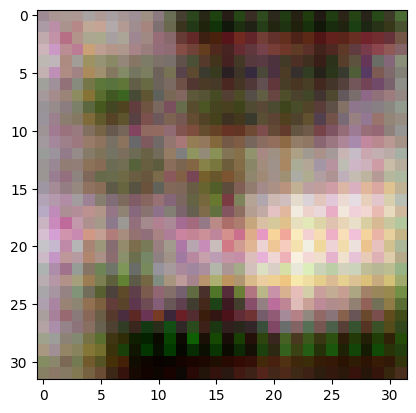

2/2 [==============================] - 1s 292ms/step
>6, 24/39, d1=0.840, d2=0.693 g=1.028


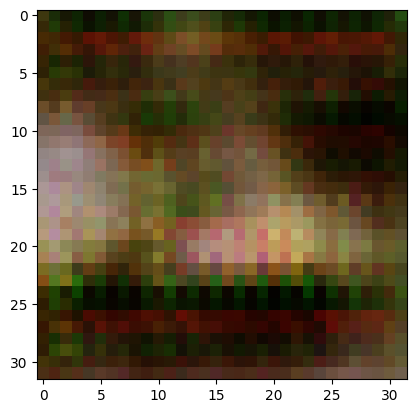

2/2 [==============================] - 0s 192ms/step
>6, 25/39, d1=0.759, d2=0.650 g=0.948


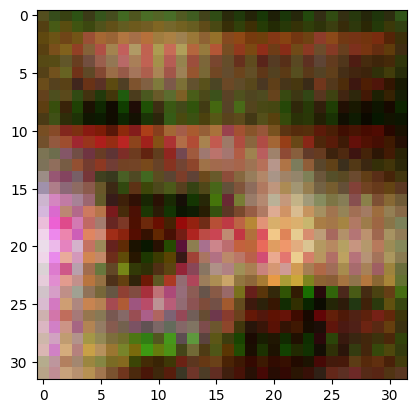

2/2 [==============================] - 0s 193ms/step
>6, 26/39, d1=0.547, d2=0.626 g=1.121


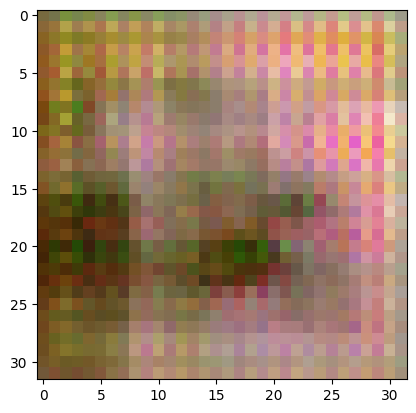

2/2 [==============================] - 1s 283ms/step
>6, 27/39, d1=0.497, d2=0.457 g=1.330


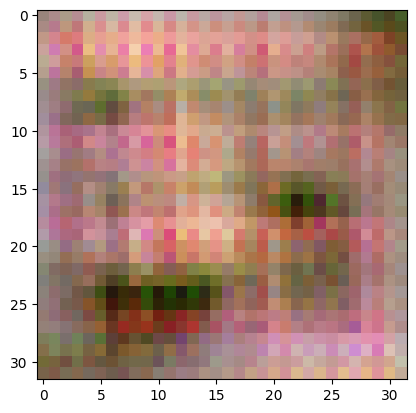

2/2 [==============================] - 1s 267ms/step
>6, 28/39, d1=0.561, d2=0.585 g=1.468


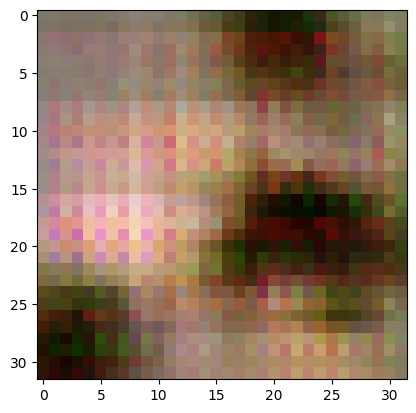

2/2 [==============================] - 0s 192ms/step
>6, 29/39, d1=0.663, d2=0.573 g=1.243


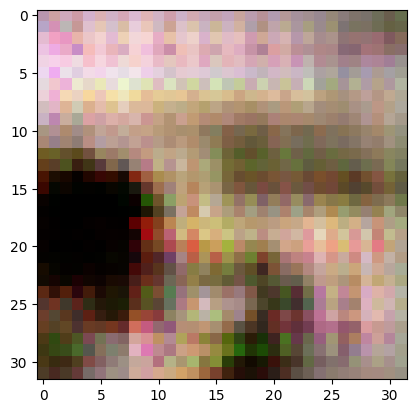

2/2 [==============================] - 0s 190ms/step
>6, 30/39, d1=0.566, d2=0.632 g=1.347


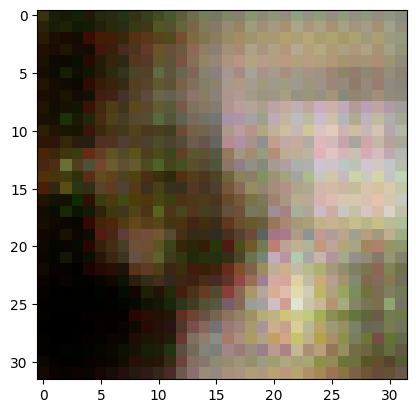

2/2 [==============================] - 0s 197ms/step
>6, 31/39, d1=0.757, d2=1.381 g=1.368


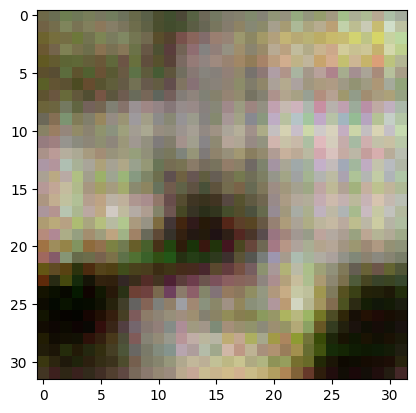

2/2 [==============================] - 0s 202ms/step
>6, 32/39, d1=0.900, d2=1.095 g=1.343


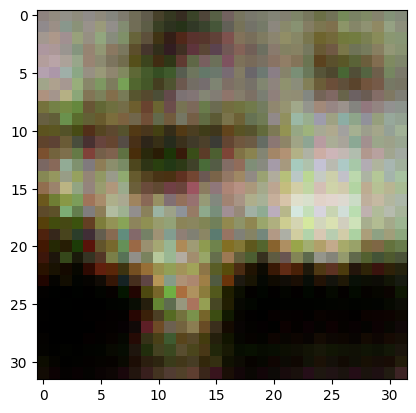

2/2 [==============================] - 0s 203ms/step
>6, 33/39, d1=1.108, d2=0.482 g=1.068


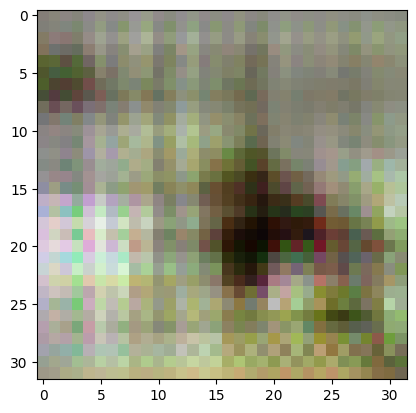

2/2 [==============================] - 0s 195ms/step
>6, 34/39, d1=0.863, d2=0.598 g=0.937


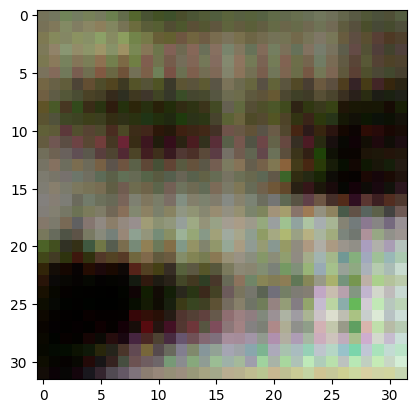

2/2 [==============================] - 0s 194ms/step
>6, 35/39, d1=0.738, d2=0.618 g=0.914


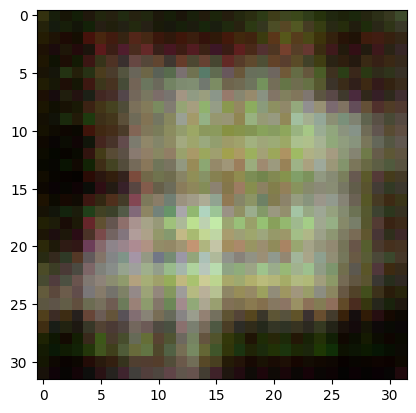

2/2 [==============================] - 0s 197ms/step
>6, 36/39, d1=0.694, d2=0.645 g=0.890


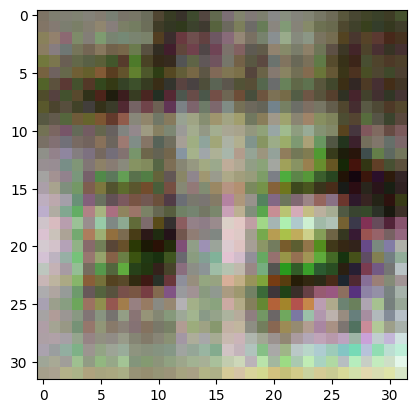

2/2 [==============================] - 0s 191ms/step
>6, 37/39, d1=0.667, d2=0.628 g=0.918


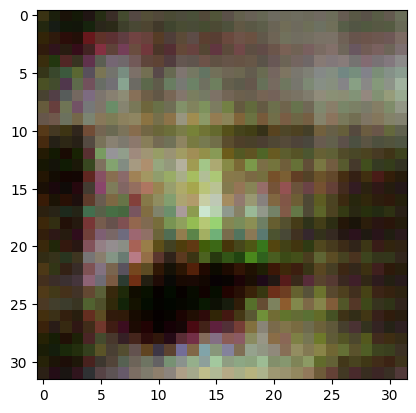

2/2 [==============================] - 1s 293ms/step
>6, 38/39, d1=0.649, d2=0.602 g=0.927


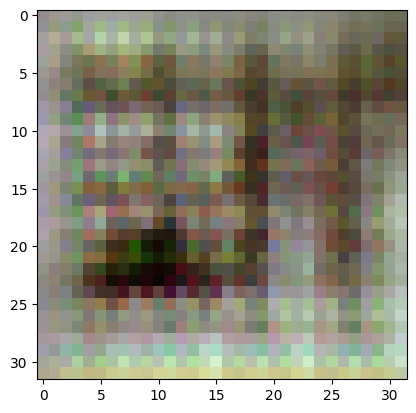

2/2 [==============================] - 0s 194ms/step
>6, 39/39, d1=0.638, d2=0.631 g=0.901


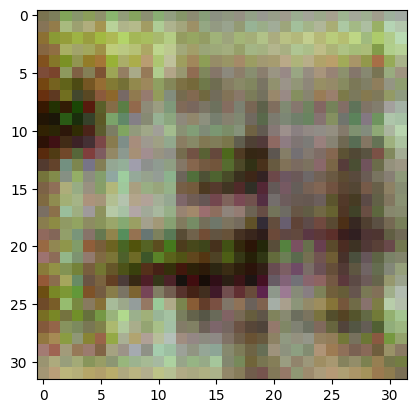

2/2 [==============================] - 0s 193ms/step
>7, 1/39, d1=0.671, d2=0.677 g=0.917


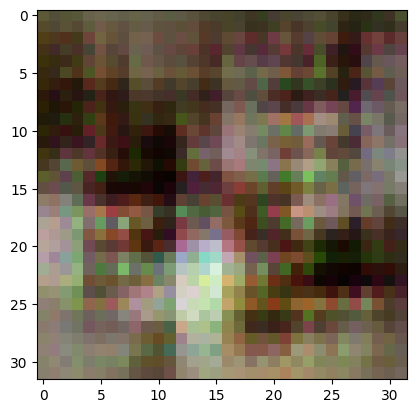

2/2 [==============================] - 1s 254ms/step
>7, 2/39, d1=0.627, d2=0.640 g=0.946


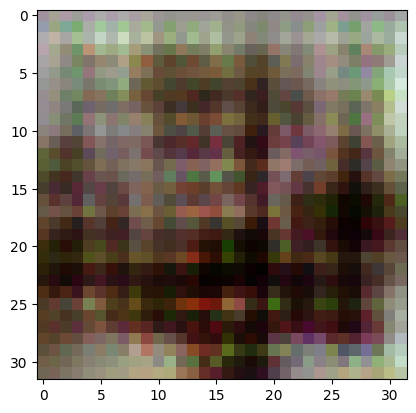

2/2 [==============================] - 0s 204ms/step
>7, 3/39, d1=0.643, d2=0.590 g=0.961


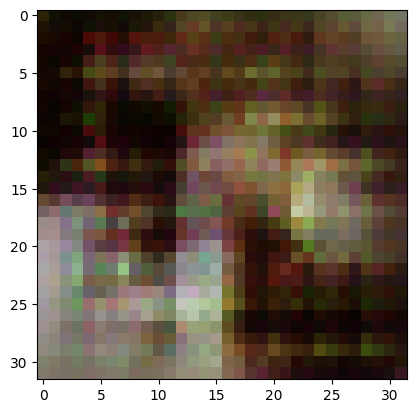

2/2 [==============================] - 0s 199ms/step
>7, 4/39, d1=0.617, d2=0.595 g=0.989


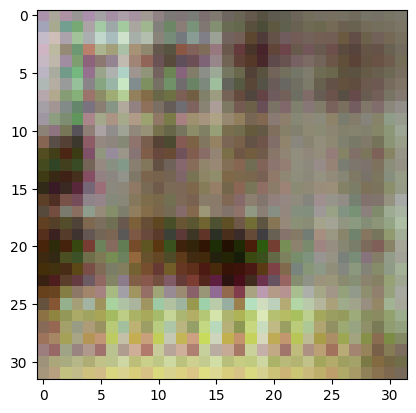

2/2 [==============================] - 1s 292ms/step
>7, 5/39, d1=0.621, d2=0.628 g=1.034


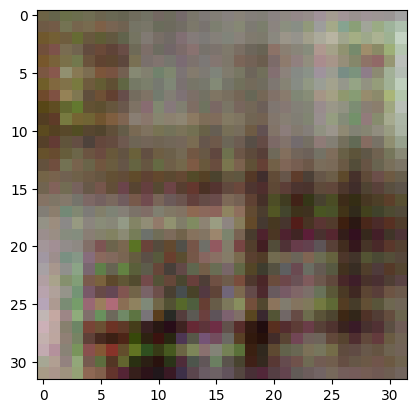

2/2 [==============================] - 0s 194ms/step
>7, 6/39, d1=0.618, d2=0.568 g=1.051


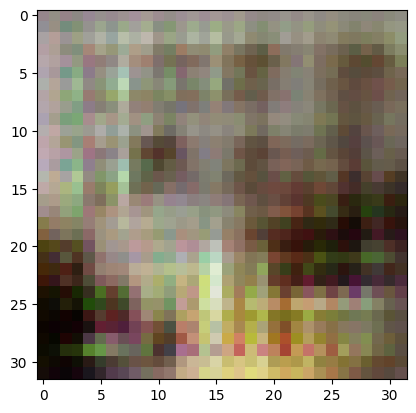

2/2 [==============================] - 0s 194ms/step
>7, 7/39, d1=0.568, d2=0.672 g=1.091


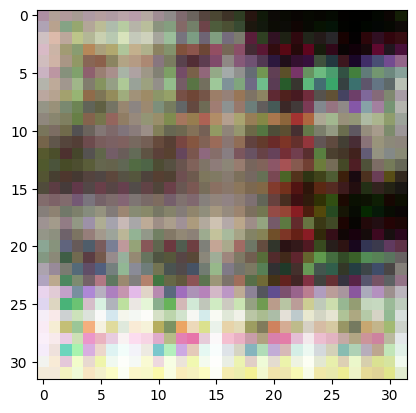

2/2 [==============================] - 1s 307ms/step
>7, 8/39, d1=0.577, d2=0.595 g=1.151


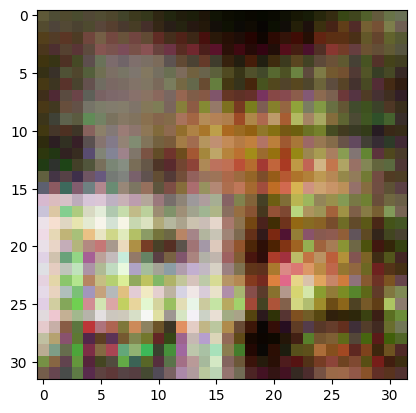

2/2 [==============================] - 0s 195ms/step
>7, 9/39, d1=0.618, d2=0.600 g=1.108


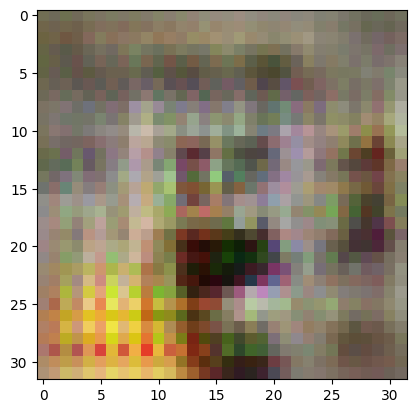

2/2 [==============================] - 0s 196ms/step
>7, 10/39, d1=0.571, d2=0.632 g=1.175


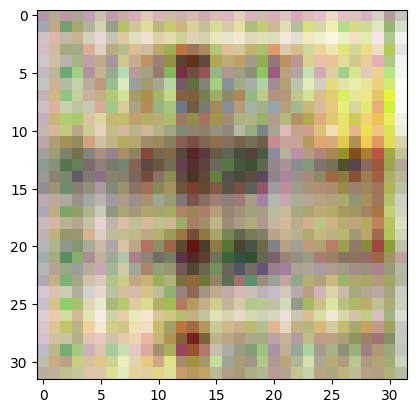

2/2 [==============================] - 1s 302ms/step
>7, 11/39, d1=0.585, d2=0.713 g=1.229


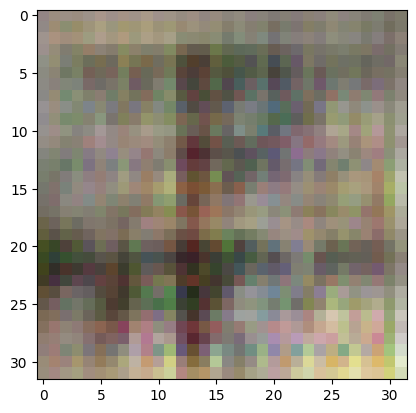

2/2 [==============================] - 0s 196ms/step
>7, 12/39, d1=0.526, d2=0.627 g=1.417


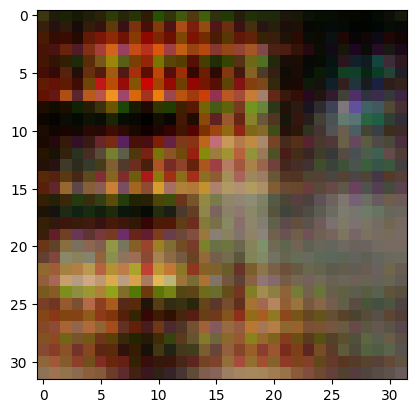

2/2 [==============================] - 0s 193ms/step
>7, 13/39, d1=0.642, d2=0.758 g=1.197


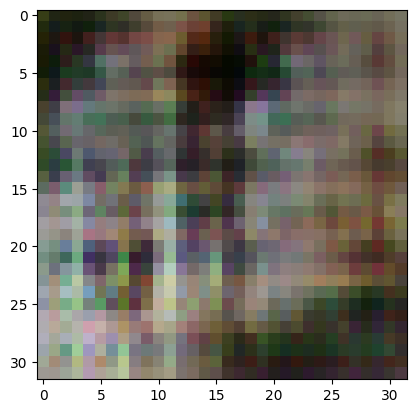

2/2 [==============================] - 1s 272ms/step
>7, 14/39, d1=0.773, d2=0.709 g=1.031


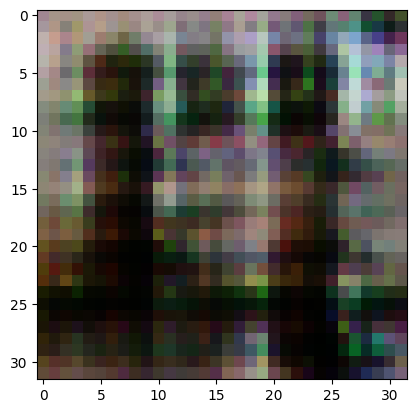

2/2 [==============================] - 0s 200ms/step
>7, 15/39, d1=0.602, d2=0.582 g=1.118


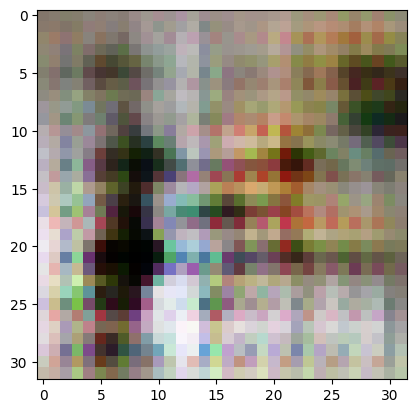

2/2 [==============================] - 0s 195ms/step
>7, 16/39, d1=0.602, d2=0.662 g=1.133


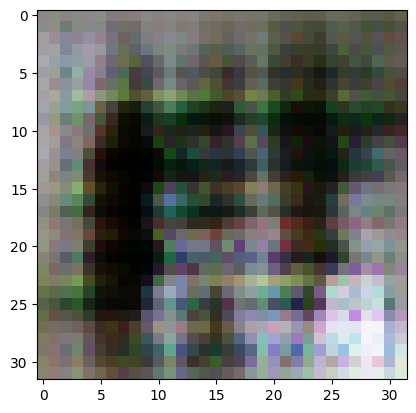

2/2 [==============================] - 1s 264ms/step
>7, 17/39, d1=0.633, d2=0.542 g=1.139


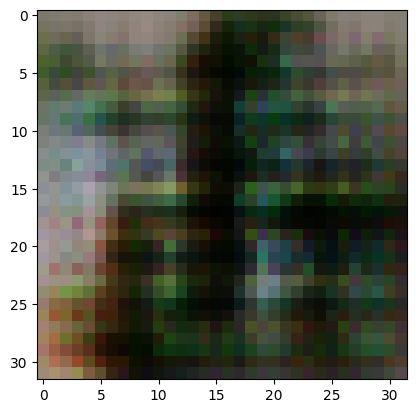

2/2 [==============================] - 0s 196ms/step
>7, 18/39, d1=0.647, d2=0.521 g=1.148


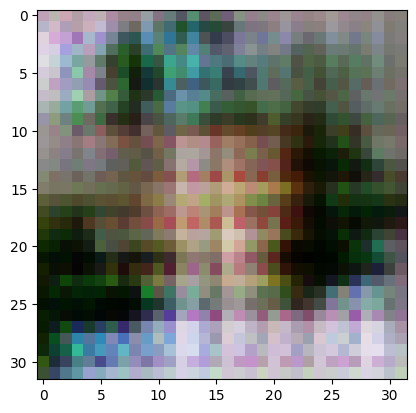

2/2 [==============================] - 0s 201ms/step
>7, 19/39, d1=0.573, d2=0.580 g=1.101


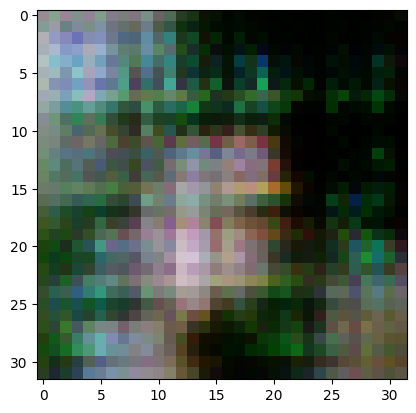

2/2 [==============================] - 0s 198ms/step
>7, 20/39, d1=0.610, d2=0.710 g=1.073


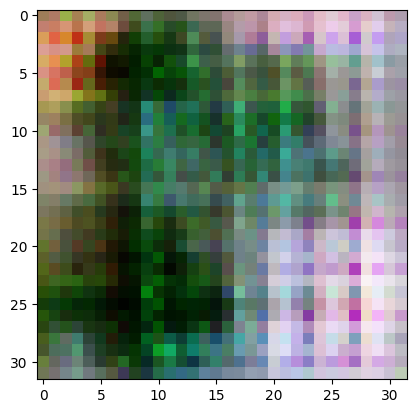

2/2 [==============================] - 0s 196ms/step
>7, 21/39, d1=0.727, d2=0.717 g=1.033


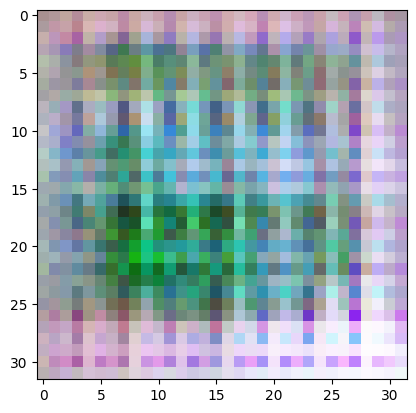

2/2 [==============================] - 0s 195ms/step
>7, 22/39, d1=0.736, d2=0.636 g=1.021


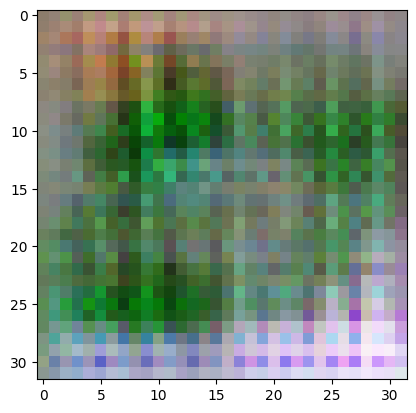

2/2 [==============================] - 0s 206ms/step
>7, 23/39, d1=0.544, d2=0.625 g=1.019


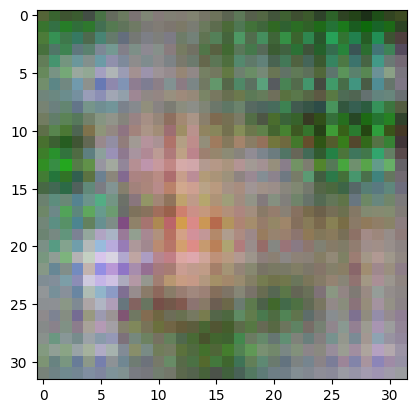

2/2 [==============================] - 0s 205ms/step
>7, 24/39, d1=0.516, d2=0.723 g=0.955


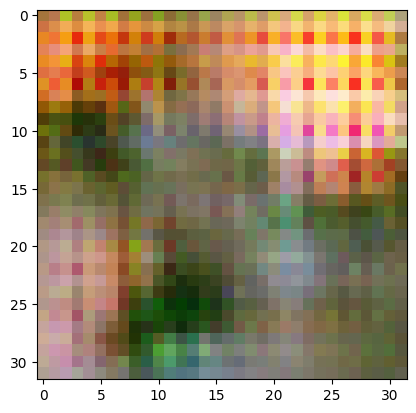

2/2 [==============================] - 0s 205ms/step
>7, 25/39, d1=0.588, d2=0.789 g=0.921


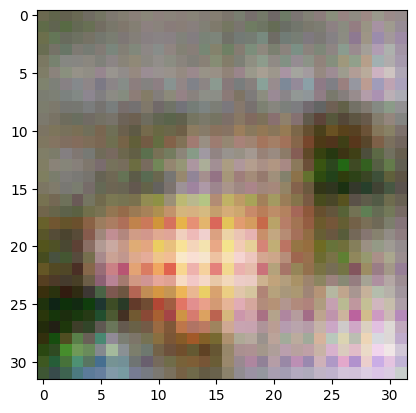

2/2 [==============================] - 0s 196ms/step
>7, 26/39, d1=0.558, d2=0.686 g=1.073


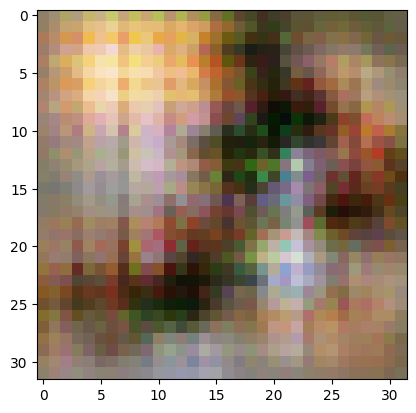

2/2 [==============================] - 0s 200ms/step
>7, 27/39, d1=0.689, d2=0.611 g=1.100


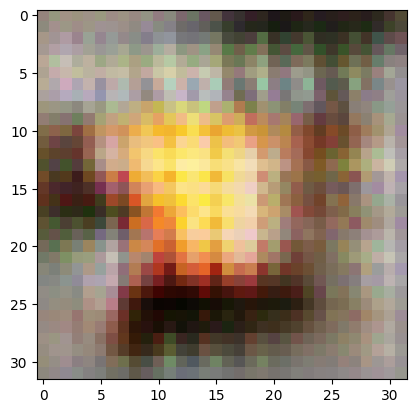

2/2 [==============================] - 0s 201ms/step
>7, 28/39, d1=0.703, d2=0.577 g=1.141


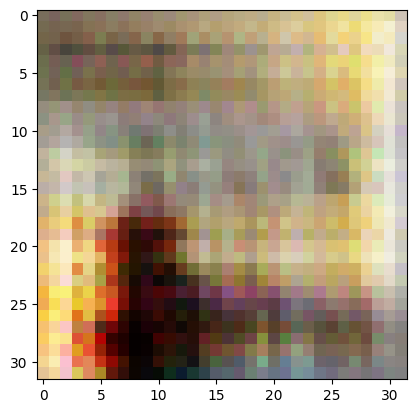

2/2 [==============================] - 0s 199ms/step
>7, 29/39, d1=0.682, d2=0.530 g=1.148


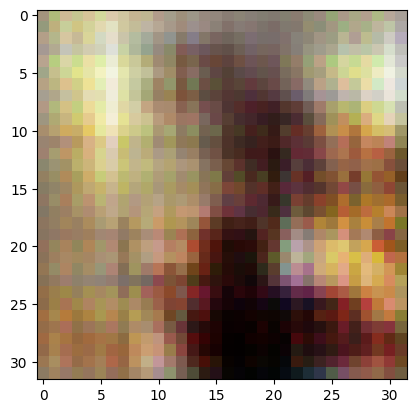

2/2 [==============================] - 0s 200ms/step
>7, 30/39, d1=0.670, d2=0.590 g=1.170


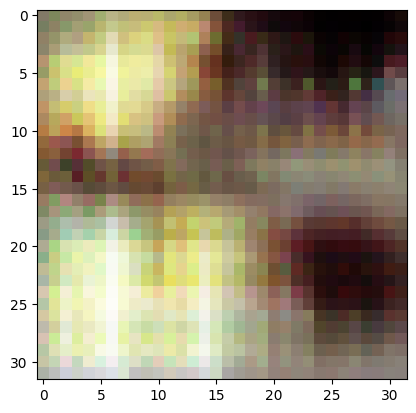

2/2 [==============================] - 0s 281ms/step
>7, 31/39, d1=0.648, d2=0.647 g=1.040


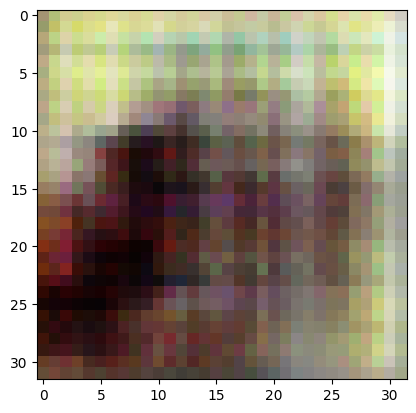

2/2 [==============================] - 0s 196ms/step
>7, 32/39, d1=0.625, d2=0.699 g=1.070


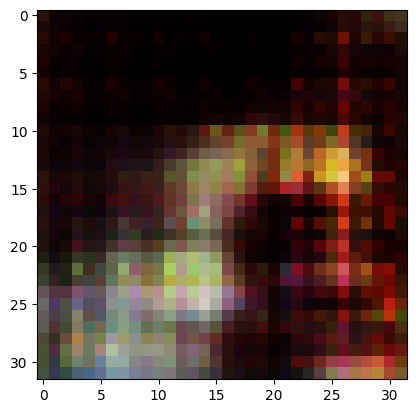

2/2 [==============================] - 0s 210ms/step
>7, 33/39, d1=0.495, d2=0.779 g=1.239


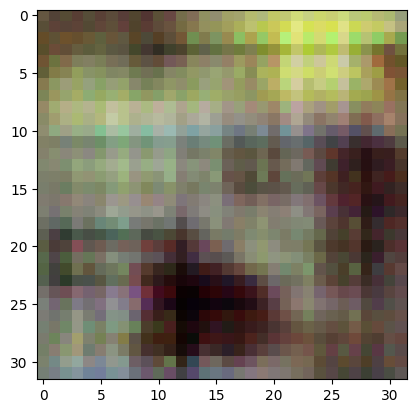

2/2 [==============================] - 1s 295ms/step
>7, 34/39, d1=0.717, d2=0.684 g=1.253


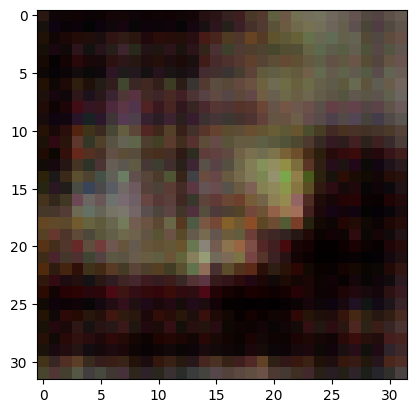

2/2 [==============================] - 0s 201ms/step
>7, 35/39, d1=0.758, d2=0.594 g=1.199


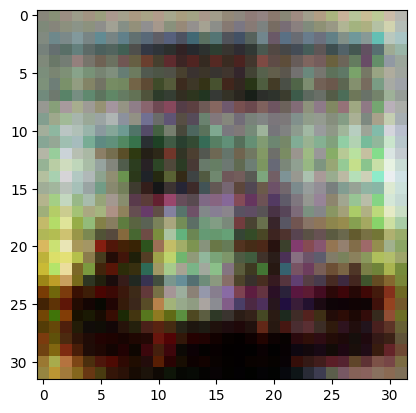

2/2 [==============================] - 0s 199ms/step
>7, 36/39, d1=0.624, d2=0.597 g=1.192


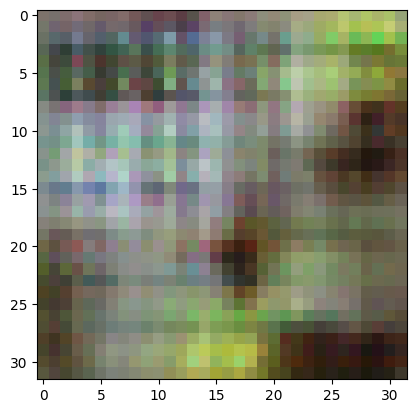

2/2 [==============================] - 1s 292ms/step
>7, 37/39, d1=0.651, d2=0.666 g=1.040


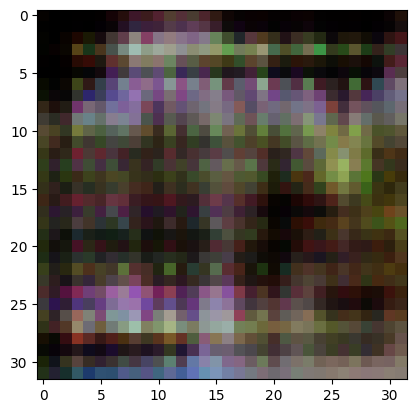

2/2 [==============================] - 0s 208ms/step
>7, 38/39, d1=0.606, d2=0.826 g=1.223


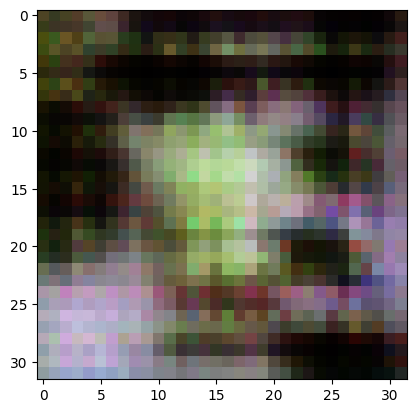

2/2 [==============================] - 0s 199ms/step
>7, 39/39, d1=0.723, d2=0.624 g=1.363


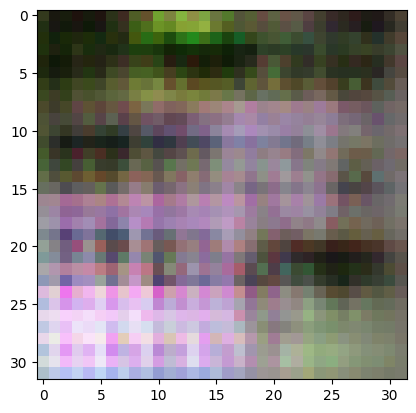

2/2 [==============================] - 0s 203ms/step
>8, 1/39, d1=0.830, d2=0.507 g=1.164


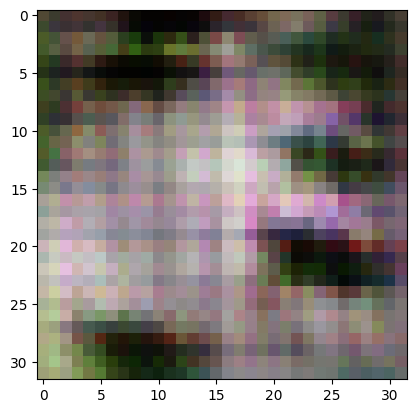

2/2 [==============================] - 0s 196ms/step
>8, 2/39, d1=0.757, d2=0.582 g=1.151


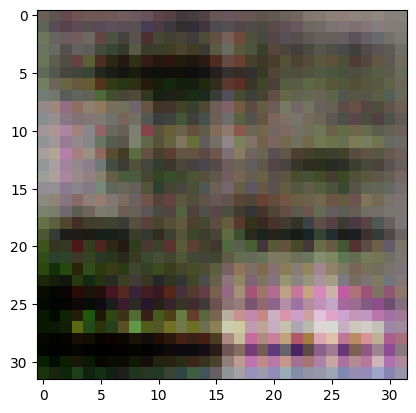

2/2 [==============================] - 0s 215ms/step
>8, 3/39, d1=0.702, d2=0.693 g=0.984


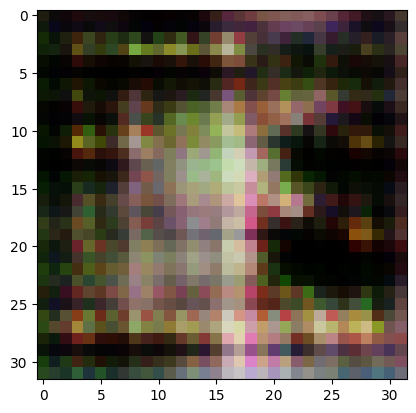

2/2 [==============================] - 0s 198ms/step
>8, 4/39, d1=0.695, d2=0.702 g=0.998


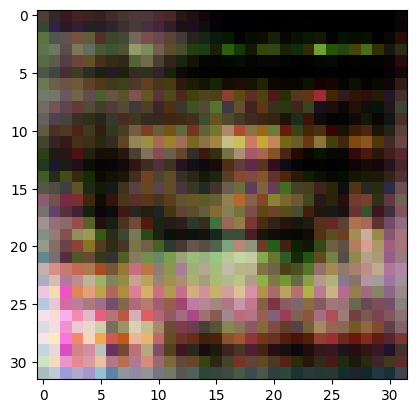

2/2 [==============================] - 0s 200ms/step
>8, 5/39, d1=0.673, d2=0.622 g=1.096


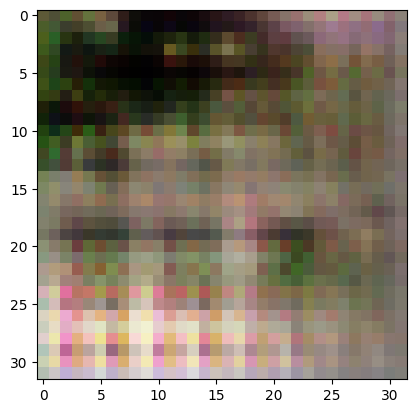

2/2 [==============================] - 0s 202ms/step
>8, 6/39, d1=0.687, d2=0.597 g=1.076


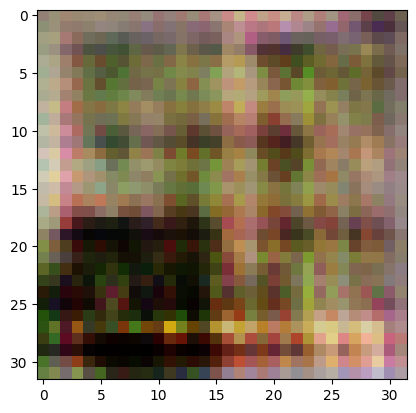

2/2 [==============================] - 0s 218ms/step
>8, 7/39, d1=0.707, d2=0.612 g=0.998


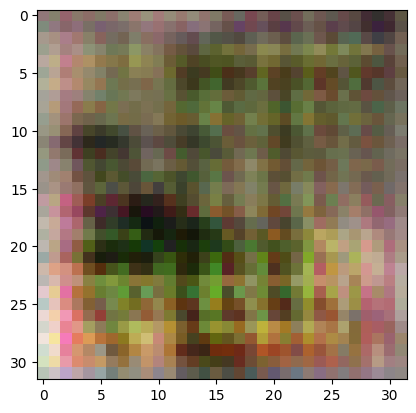

2/2 [==============================] - 0s 212ms/step
>8, 8/39, d1=0.566, d2=0.671 g=0.939


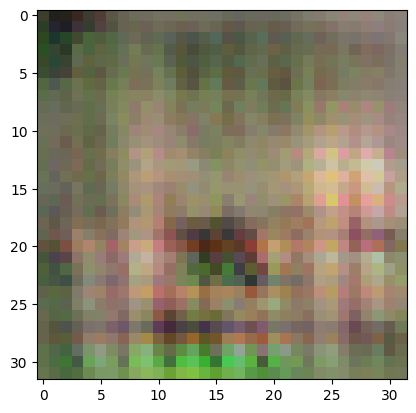

2/2 [==============================] - 0s 197ms/step
>8, 9/39, d1=0.554, d2=0.663 g=0.902


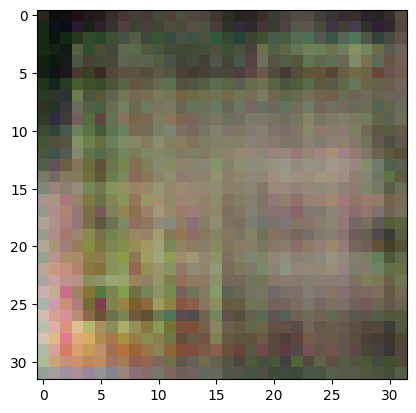

2/2 [==============================] - 0s 198ms/step
>8, 10/39, d1=0.499, d2=0.686 g=0.920


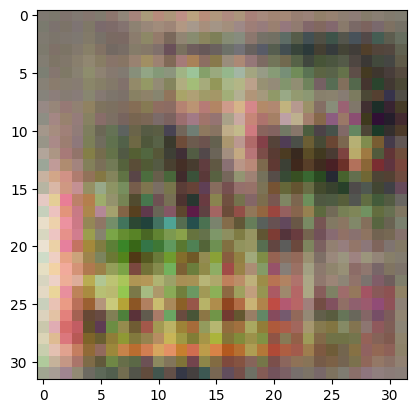

2/2 [==============================] - 0s 194ms/step
>8, 11/39, d1=0.562, d2=0.693 g=0.898


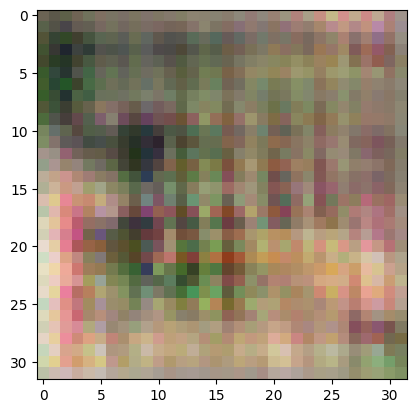

2/2 [==============================] - 0s 196ms/step
>8, 12/39, d1=0.441, d2=0.698 g=0.963


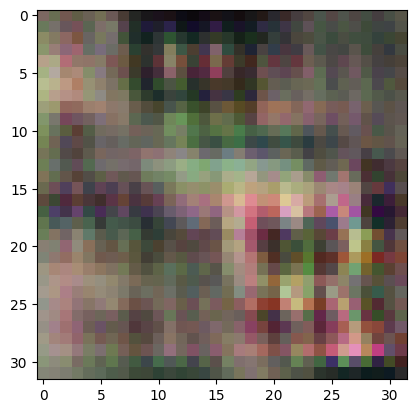

2/2 [==============================] - 0s 200ms/step
>8, 13/39, d1=0.462, d2=0.624 g=1.032


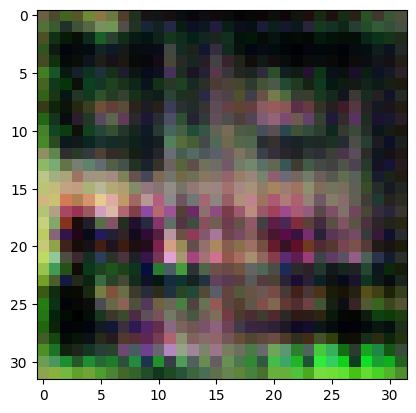

2/2 [==============================] - 0s 201ms/step
>8, 14/39, d1=0.490, d2=0.611 g=1.282


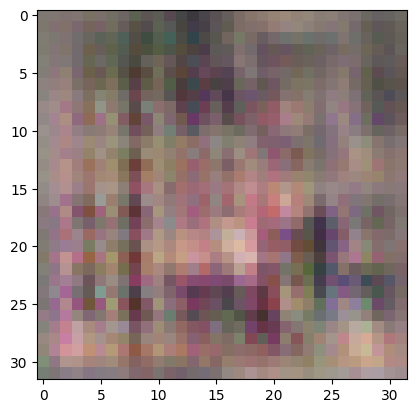

2/2 [==============================] - 1s 288ms/step
>8, 15/39, d1=0.439, d2=0.573 g=1.295


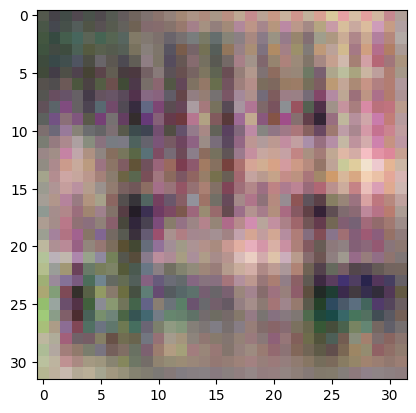

2/2 [==============================] - 0s 197ms/step
>8, 16/39, d1=0.493, d2=0.663 g=1.247


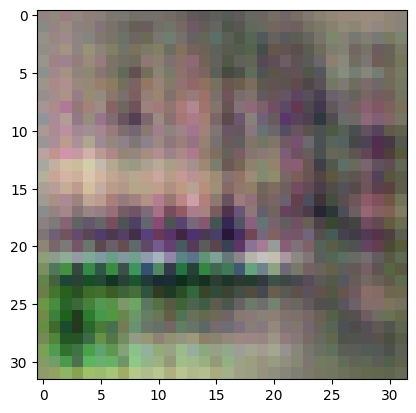

2/2 [==============================] - 0s 210ms/step
>8, 17/39, d1=0.496, d2=0.749 g=1.117


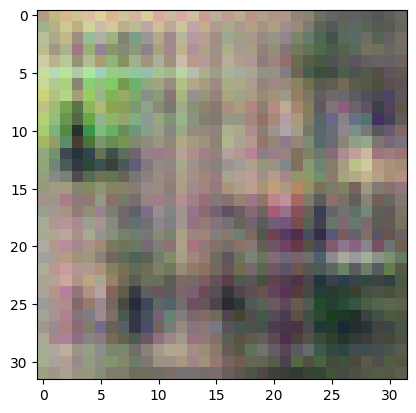

2/2 [==============================] - 1s 262ms/step
>8, 18/39, d1=0.372, d2=0.822 g=1.209


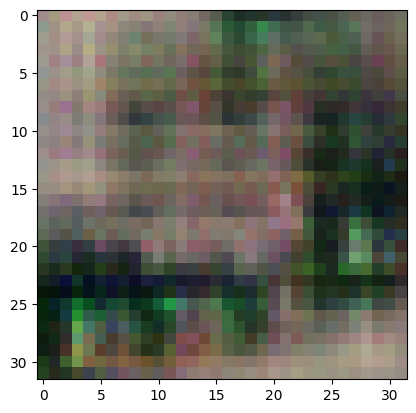

2/2 [==============================] - 0s 201ms/step
>8, 19/39, d1=0.513, d2=0.689 g=1.143


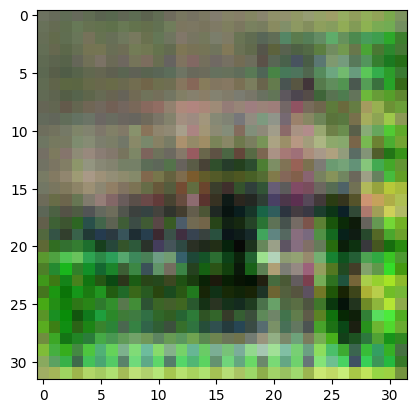

2/2 [==============================] - 0s 199ms/step
>8, 20/39, d1=0.521, d2=0.806 g=1.416


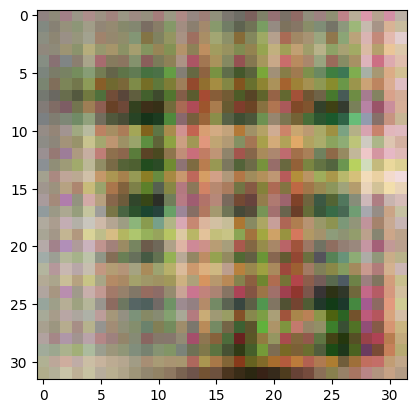

2/2 [==============================] - 1s 276ms/step
>8, 21/39, d1=0.653, d2=0.535 g=1.385


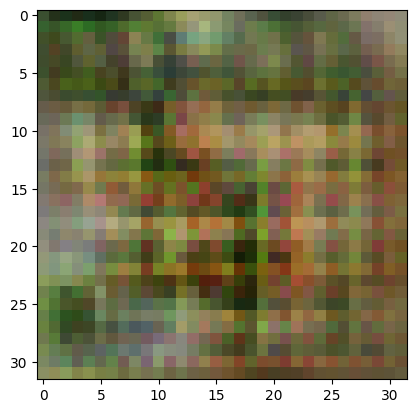

2/2 [==============================] - 0s 210ms/step
>8, 22/39, d1=0.678, d2=0.801 g=1.173


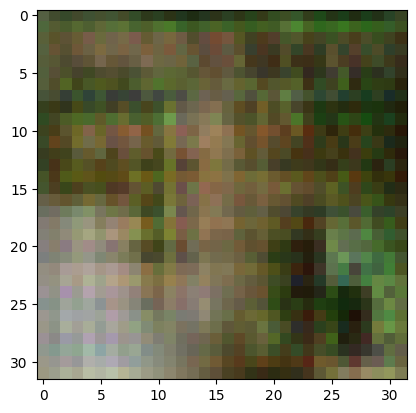

2/2 [==============================] - 0s 199ms/step
>8, 23/39, d1=0.600, d2=0.887 g=1.098


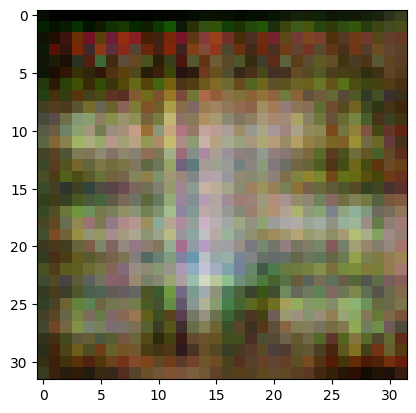

2/2 [==============================] - 1s 289ms/step
>8, 24/39, d1=0.641, d2=0.785 g=1.100


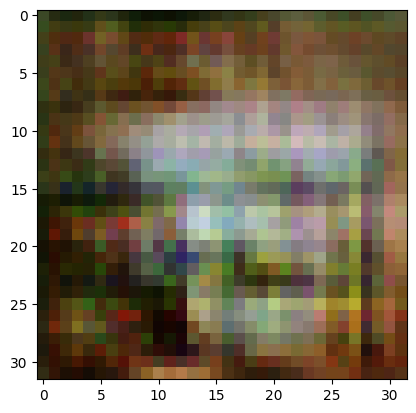

2/2 [==============================] - 0s 212ms/step
>8, 25/39, d1=0.518, d2=0.863 g=1.252


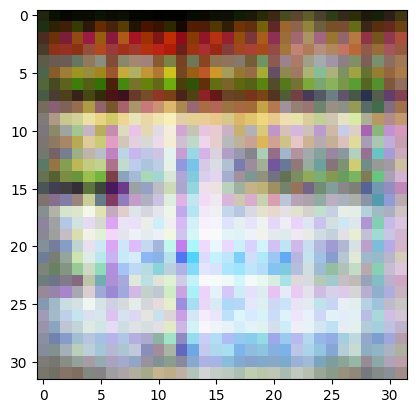

2/2 [==============================] - 0s 216ms/step
>8, 26/39, d1=0.577, d2=0.755 g=1.448


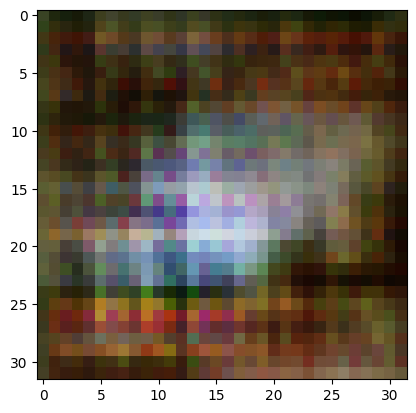

2/2 [==============================] - 1s 280ms/step
>8, 27/39, d1=0.708, d2=0.569 g=1.343


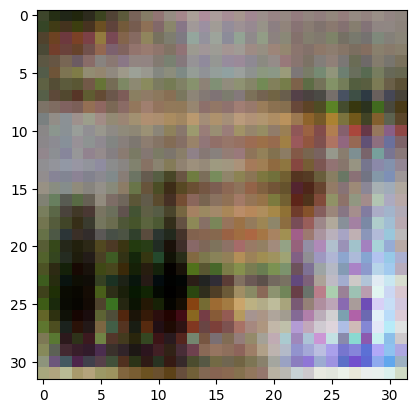

2/2 [==============================] - 0s 218ms/step
>8, 28/39, d1=0.706, d2=0.733 g=1.466


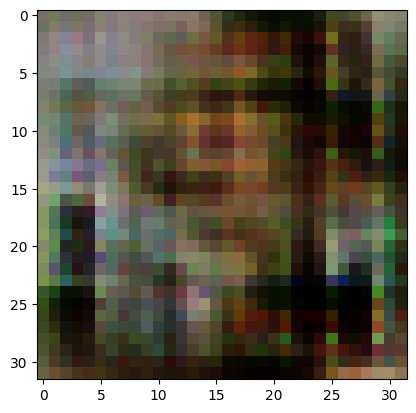

2/2 [==============================] - 0s 204ms/step
>8, 29/39, d1=0.761, d2=0.534 g=1.448


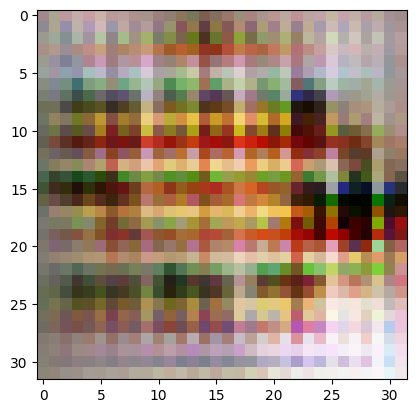

2/2 [==============================] - 1s 282ms/step
>8, 30/39, d1=0.875, d2=0.445 g=1.280


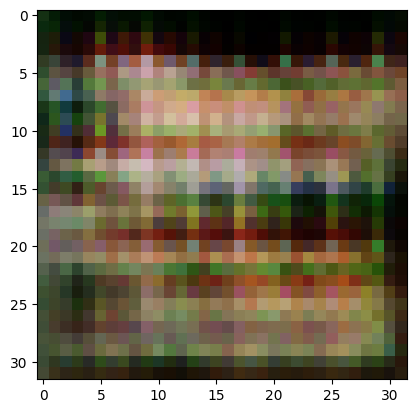

2/2 [==============================] - 0s 212ms/step
>8, 31/39, d1=0.764, d2=0.508 g=1.131


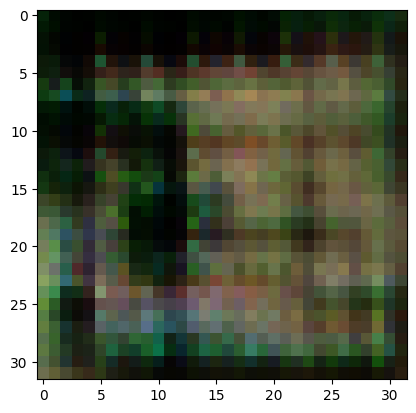

2/2 [==============================] - 0s 215ms/step
>8, 32/39, d1=0.723, d2=0.765 g=1.061


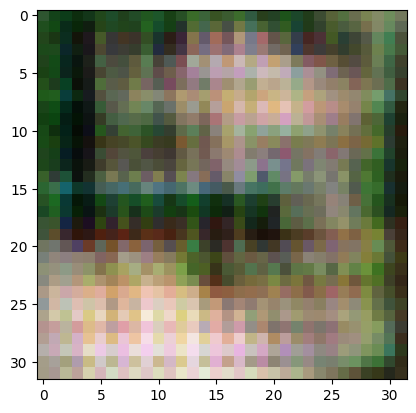

2/2 [==============================] - 0s 214ms/step
>8, 33/39, d1=0.661, d2=0.681 g=1.091


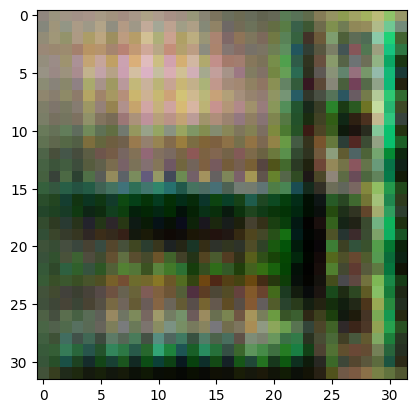

2/2 [==============================] - 0s 202ms/step
>8, 34/39, d1=0.662, d2=0.596 g=1.090


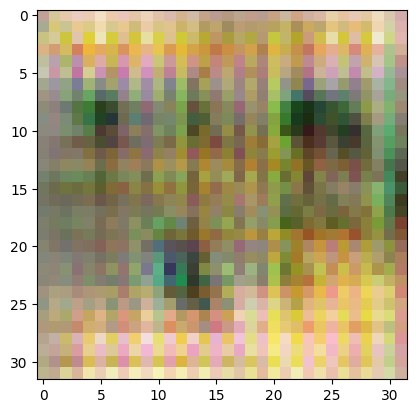

2/2 [==============================] - 0s 199ms/step
>8, 35/39, d1=0.672, d2=0.509 g=1.125


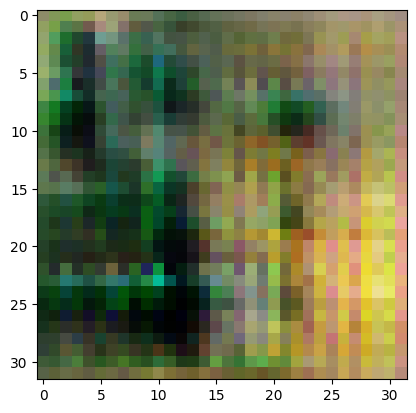

2/2 [==============================] - 0s 215ms/step
>8, 36/39, d1=0.715, d2=0.527 g=1.086


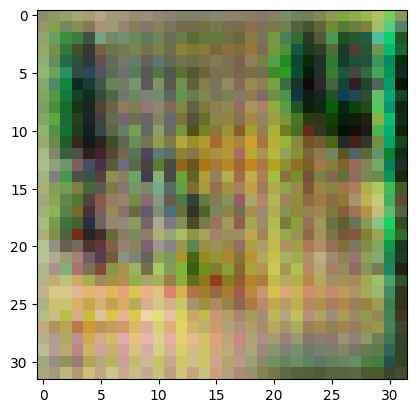

2/2 [==============================] - 0s 212ms/step
>8, 37/39, d1=0.587, d2=0.540 g=1.141


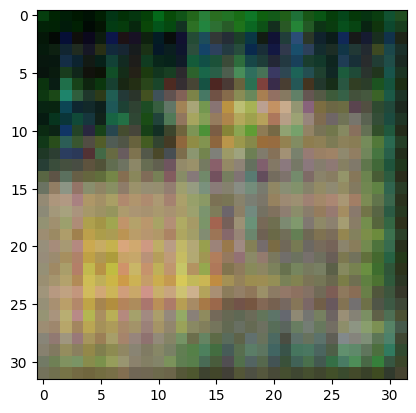

2/2 [==============================] - 0s 204ms/step
>8, 38/39, d1=0.623, d2=0.629 g=1.082


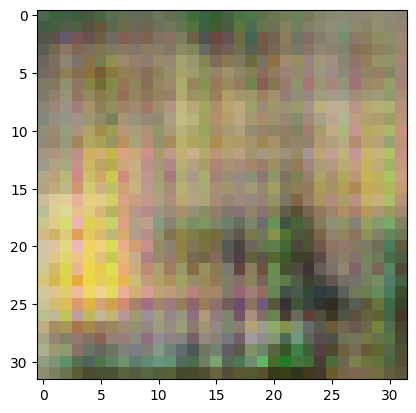

2/2 [==============================] - 0s 202ms/step
>8, 39/39, d1=0.619, d2=0.800 g=1.074


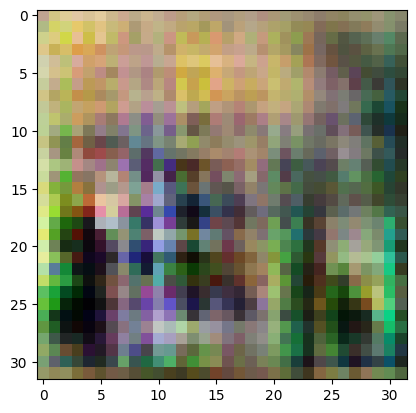

2/2 [==============================] - 0s 209ms/step
>9, 1/39, d1=0.594, d2=0.687 g=1.173


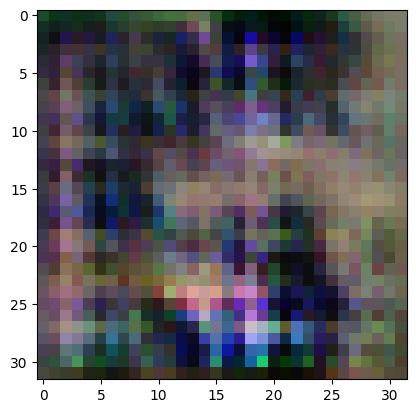

2/2 [==============================] - 1s 464ms/step
>9, 2/39, d1=0.648, d2=0.625 g=1.127


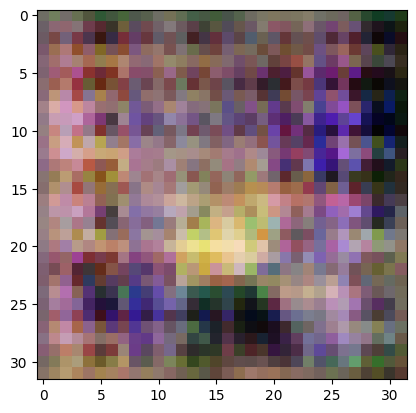

2/2 [==============================] - 0s 204ms/step
>9, 3/39, d1=0.619, d2=0.710 g=1.011


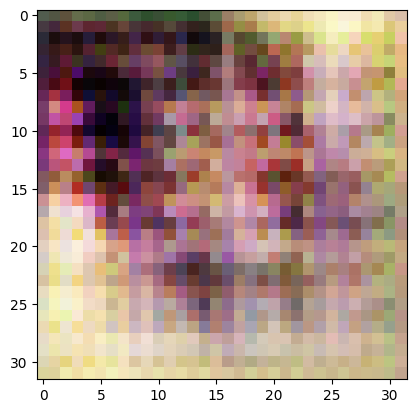

2/2 [==============================] - 0s 214ms/step
>9, 4/39, d1=0.674, d2=0.663 g=1.052


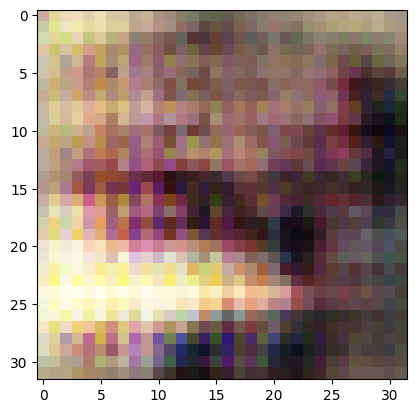

2/2 [==============================] - 0s 204ms/step
>9, 5/39, d1=0.708, d2=0.547 g=1.148


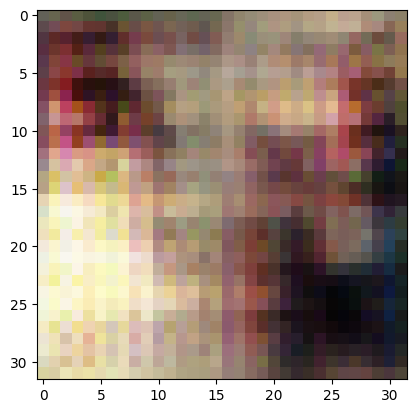

2/2 [==============================] - 0s 208ms/step
>9, 6/39, d1=0.650, d2=0.571 g=1.241


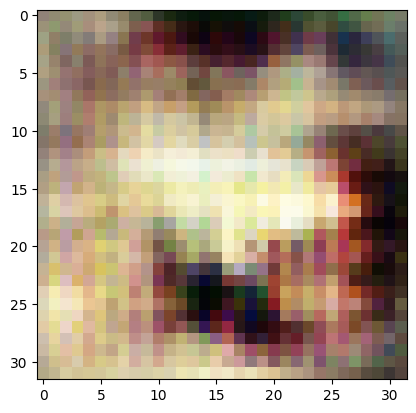

2/2 [==============================] - 1s 308ms/step
>9, 7/39, d1=0.730, d2=0.567 g=1.175


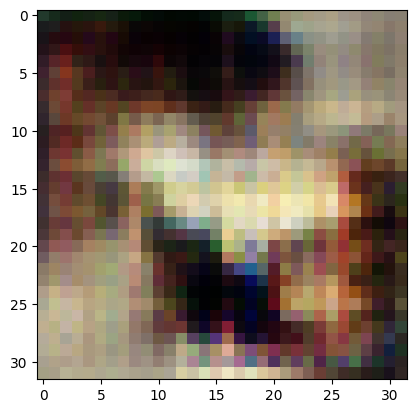

2/2 [==============================] - 0s 210ms/step
>9, 8/39, d1=0.650, d2=0.763 g=1.358


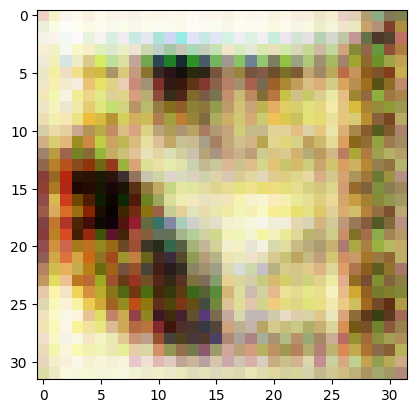

2/2 [==============================] - 0s 209ms/step
>9, 9/39, d1=0.673, d2=0.660 g=1.379


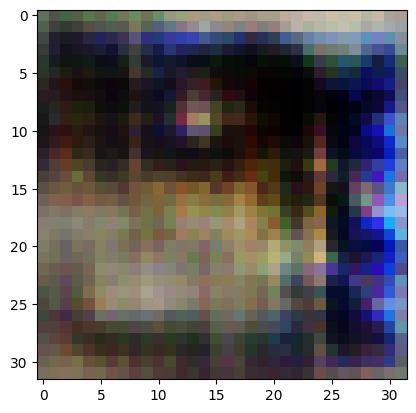

2/2 [==============================] - 1s 292ms/step
>9, 10/39, d1=0.789, d2=0.773 g=1.414


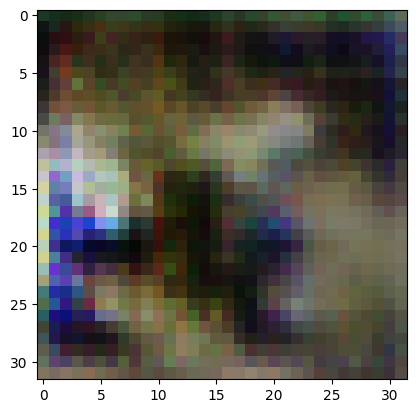

2/2 [==============================] - 0s 200ms/step
>9, 11/39, d1=0.895, d2=0.540 g=1.352


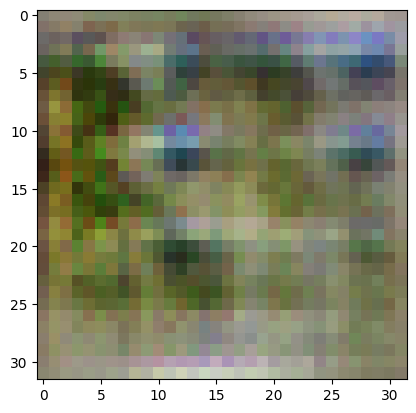

2/2 [==============================] - 0s 221ms/step
>9, 12/39, d1=0.841, d2=0.548 g=1.198


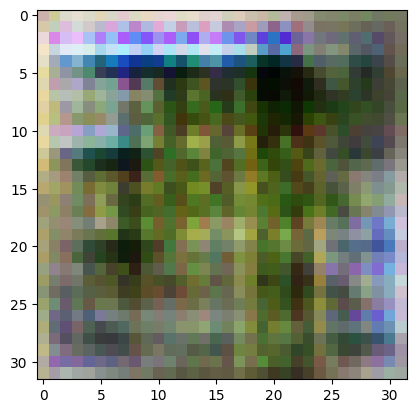

2/2 [==============================] - 0s 200ms/step
>9, 13/39, d1=0.732, d2=0.568 g=1.132


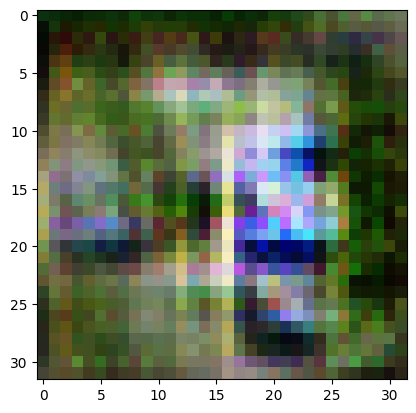

2/2 [==============================] - 0s 202ms/step
>9, 14/39, d1=0.753, d2=0.576 g=1.054


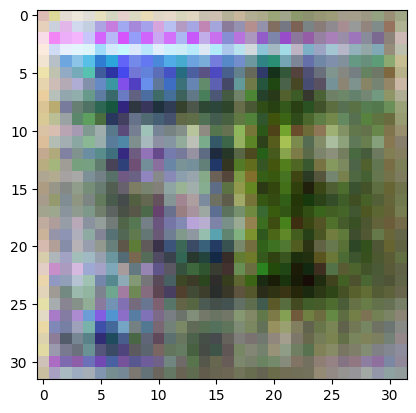

2/2 [==============================] - 0s 203ms/step
>9, 15/39, d1=0.597, d2=0.652 g=1.089


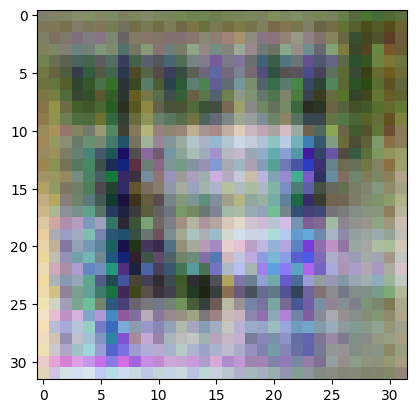

2/2 [==============================] - 0s 212ms/step
>9, 16/39, d1=0.625, d2=0.706 g=0.917


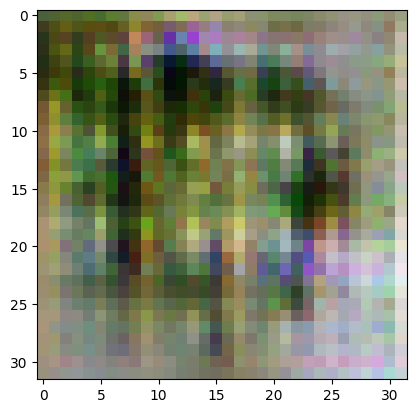

2/2 [==============================] - 0s 206ms/step
>9, 17/39, d1=0.572, d2=0.756 g=0.896


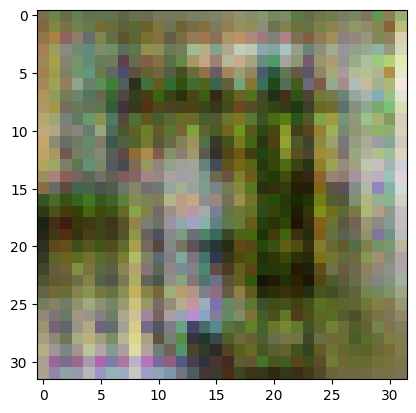

2/2 [==============================] - 0s 203ms/step
>9, 18/39, d1=0.506, d2=0.766 g=0.931


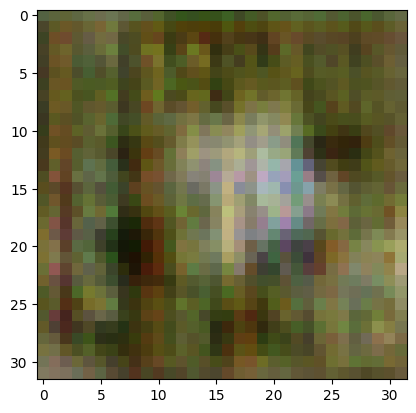

2/2 [==============================] - 0s 217ms/step
>9, 19/39, d1=0.513, d2=0.651 g=0.949


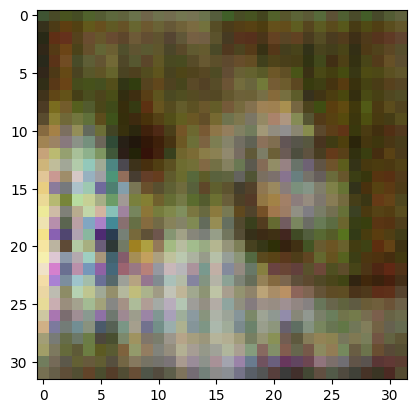

2/2 [==============================] - 0s 209ms/step
>9, 20/39, d1=0.628, d2=0.822 g=0.950


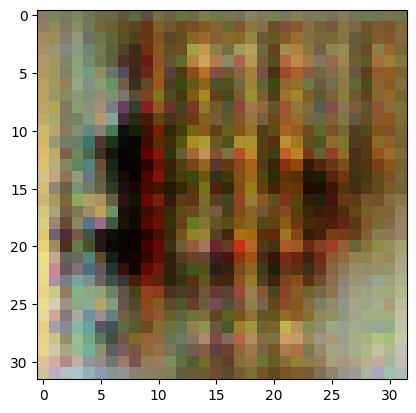

2/2 [==============================] - 0s 204ms/step
>9, 21/39, d1=0.702, d2=0.687 g=0.942


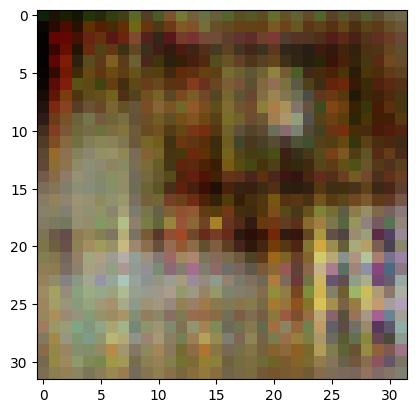

2/2 [==============================] - 0s 228ms/step
>9, 22/39, d1=0.652, d2=0.634 g=0.954


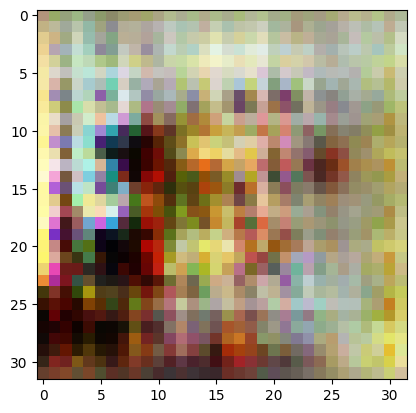

2/2 [==============================] - 0s 218ms/step
>9, 23/39, d1=0.656, d2=0.694 g=0.971


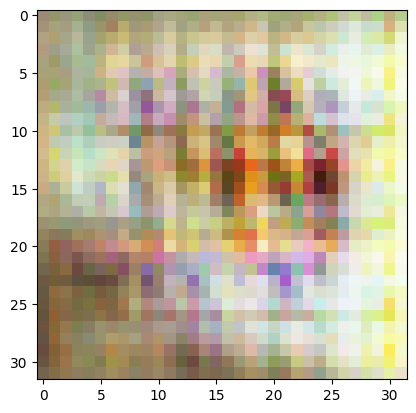

2/2 [==============================] - 1s 266ms/step
>9, 24/39, d1=0.680, d2=0.520 g=1.055


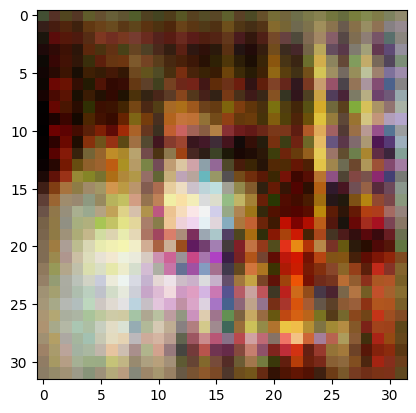

2/2 [==============================] - 0s 204ms/step
>9, 25/39, d1=0.594, d2=0.506 g=1.145


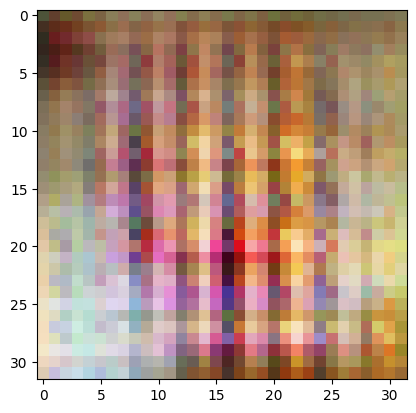

2/2 [==============================] - 0s 201ms/step
>9, 26/39, d1=0.516, d2=0.638 g=1.225


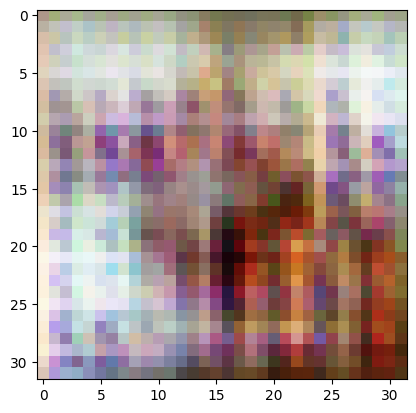

2/2 [==============================] - 1s 273ms/step
>9, 27/39, d1=0.527, d2=0.570 g=1.302


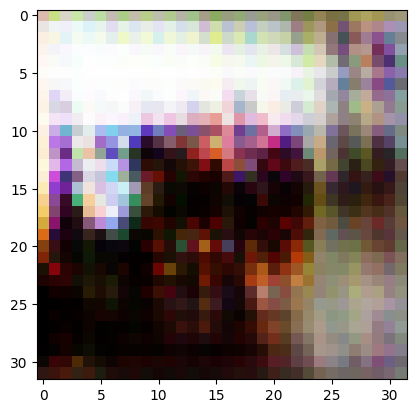

2/2 [==============================] - 0s 215ms/step
>9, 28/39, d1=0.506, d2=0.583 g=1.215


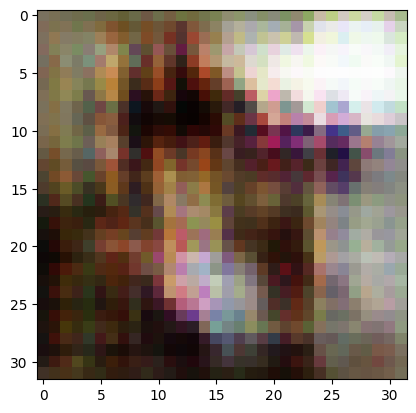

2/2 [==============================] - 0s 200ms/step
>9, 29/39, d1=0.550, d2=0.576 g=1.295


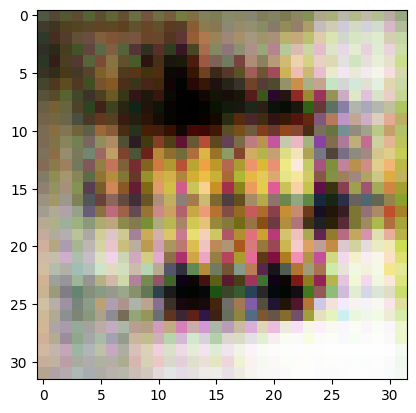

2/2 [==============================] - 1s 296ms/step
>9, 30/39, d1=0.646, d2=0.553 g=1.291


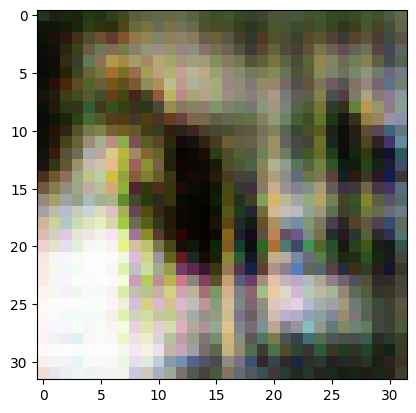

2/2 [==============================] - 0s 219ms/step
>9, 31/39, d1=0.529, d2=0.884 g=1.370


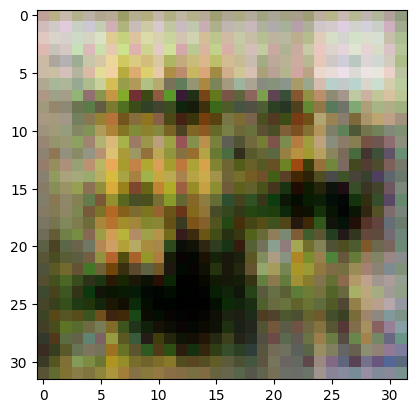

2/2 [==============================] - 0s 210ms/step
>9, 32/39, d1=0.802, d2=0.680 g=1.085


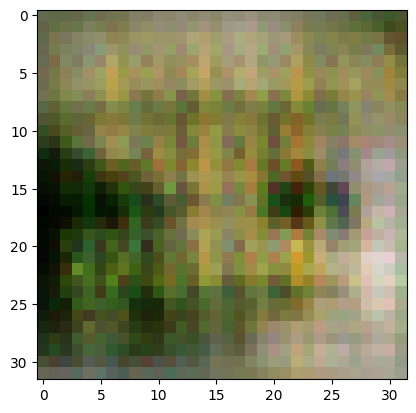

2/2 [==============================] - 1s 291ms/step
>9, 33/39, d1=0.765, d2=0.615 g=0.987


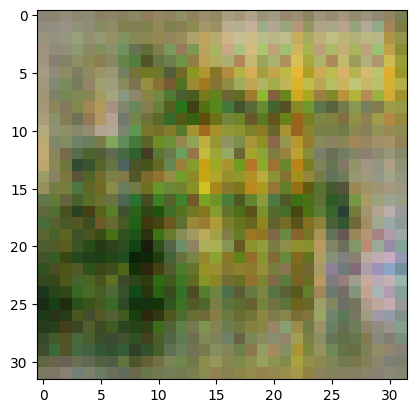

2/2 [==============================] - 0s 210ms/step
>9, 34/39, d1=0.585, d2=0.530 g=1.090


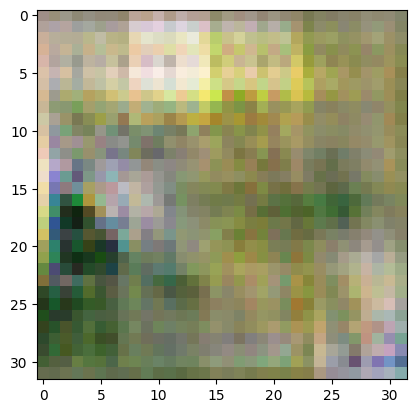

2/2 [==============================] - 0s 209ms/step
>9, 35/39, d1=0.459, d2=0.543 g=1.265


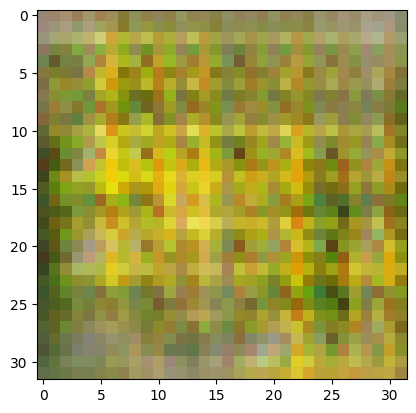

2/2 [==============================] - 1s 219ms/step
>9, 36/39, d1=0.328, d2=0.648 g=1.417


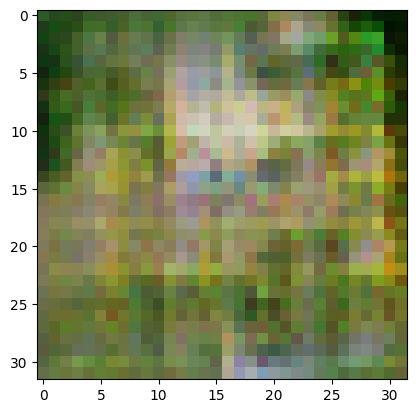

2/2 [==============================] - 0s 204ms/step
>9, 37/39, d1=0.273, d2=0.967 g=1.794


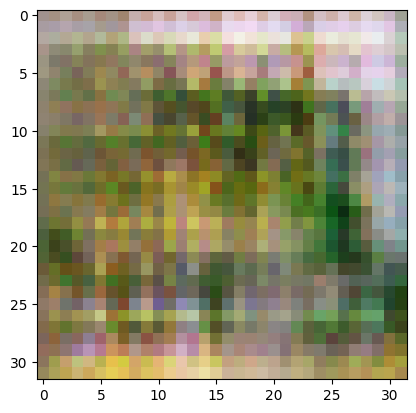

2/2 [==============================] - 0s 213ms/step
>9, 38/39, d1=0.735, d2=0.513 g=1.473


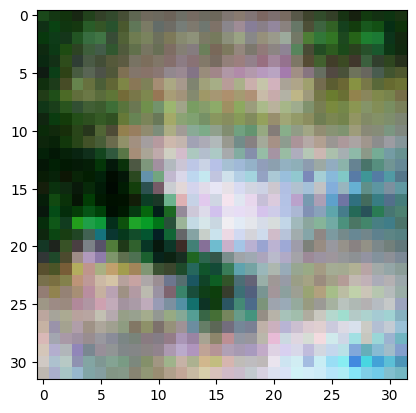

2/2 [==============================] - 0s 222ms/step
>9, 39/39, d1=0.562, d2=1.382 g=1.584


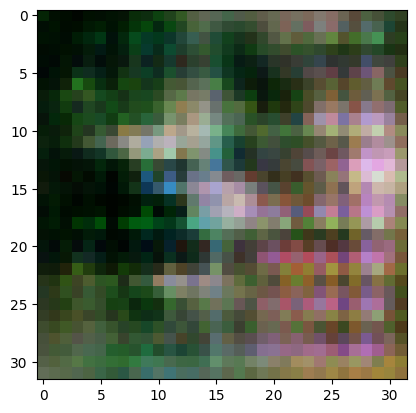

2/2 [==============================] - 0s 222ms/step
>10, 1/39, d1=0.744, d2=0.528 g=1.597


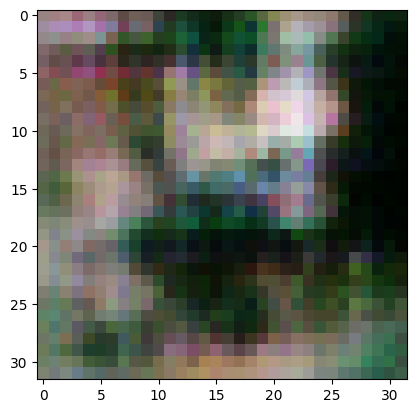

2/2 [==============================] - 0s 205ms/step
>10, 2/39, d1=0.825, d2=0.433 g=1.385


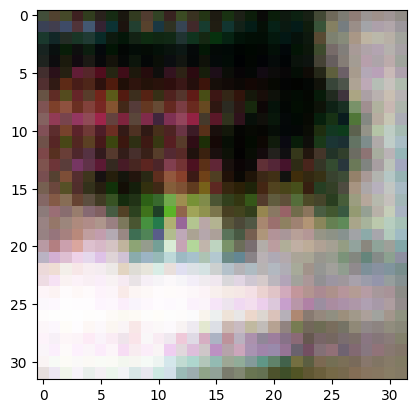

2/2 [==============================] - 0s 206ms/step
>10, 3/39, d1=0.659, d2=0.510 g=1.337


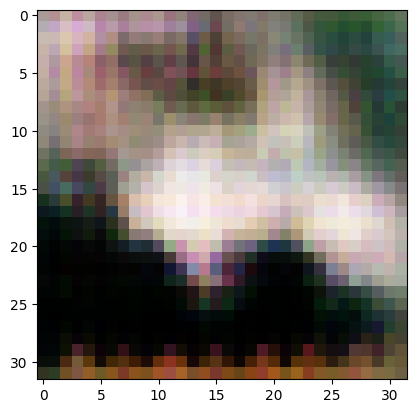

2/2 [==============================] - 0s 204ms/step
>10, 4/39, d1=0.509, d2=0.659 g=1.346


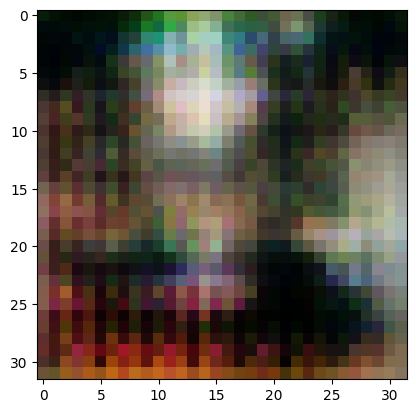

2/2 [==============================] - 0s 209ms/step
>10, 5/39, d1=0.550, d2=0.529 g=1.329


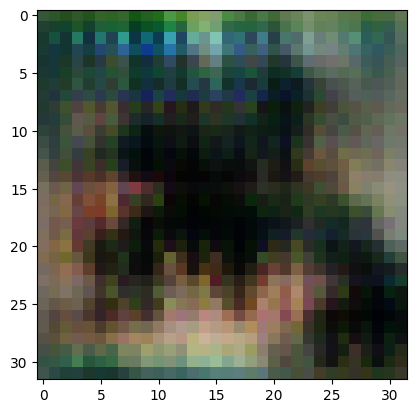

2/2 [==============================] - 0s 202ms/step
>10, 6/39, d1=0.525, d2=0.680 g=1.206


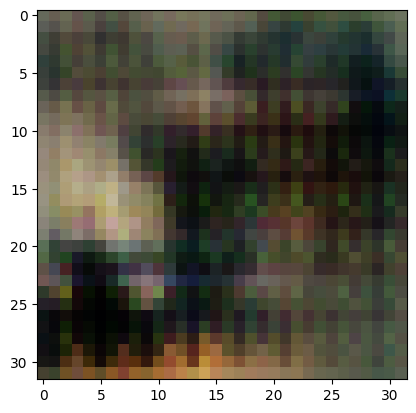

2/2 [==============================] - 0s 209ms/step
>10, 7/39, d1=0.594, d2=0.630 g=1.201


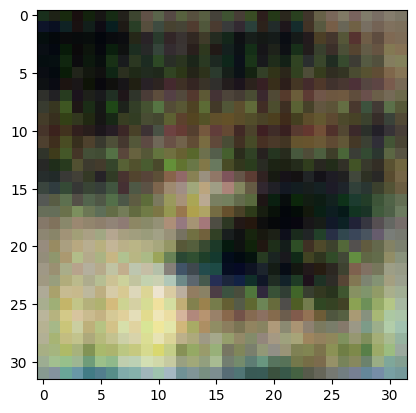

2/2 [==============================] - 0s 222ms/step
>10, 8/39, d1=0.656, d2=0.646 g=1.200


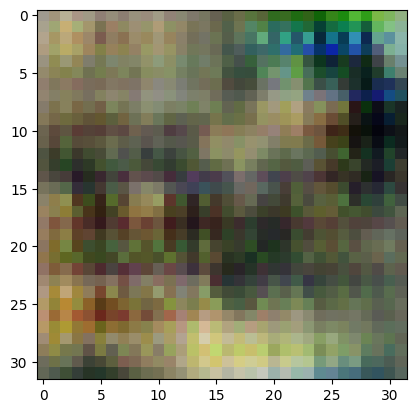

2/2 [==============================] - 1s 296ms/step
>10, 9/39, d1=0.611, d2=0.554 g=1.261


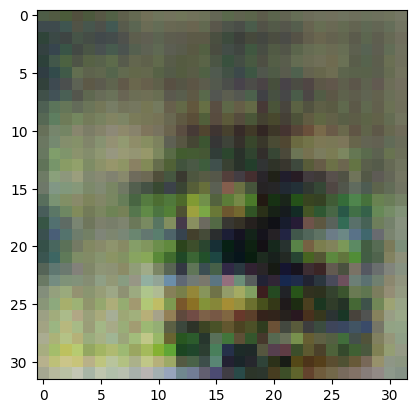

2/2 [==============================] - 0s 208ms/step
>10, 10/39, d1=0.680, d2=0.620 g=1.166


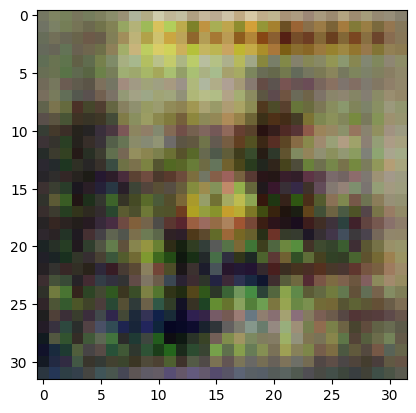

2/2 [==============================] - 1s 380ms/step
>10, 11/39, d1=0.556, d2=0.723 g=1.124


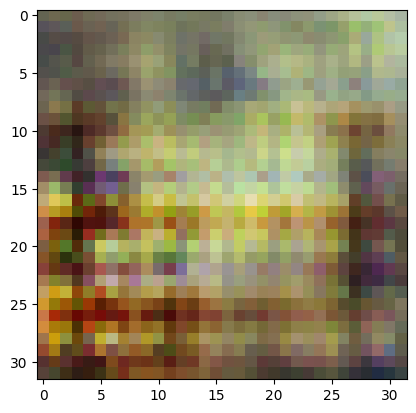

2/2 [==============================] - 0s 253ms/step
>10, 12/39, d1=0.554, d2=0.735 g=1.217


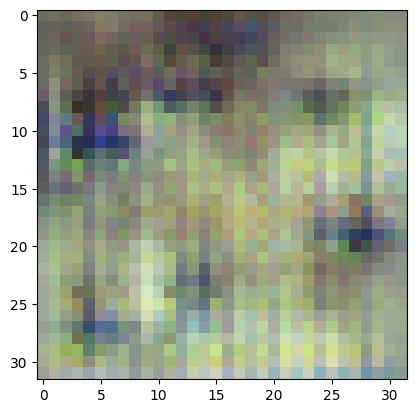

2/2 [==============================] - 0s 220ms/step
>10, 13/39, d1=0.597, d2=0.602 g=1.351


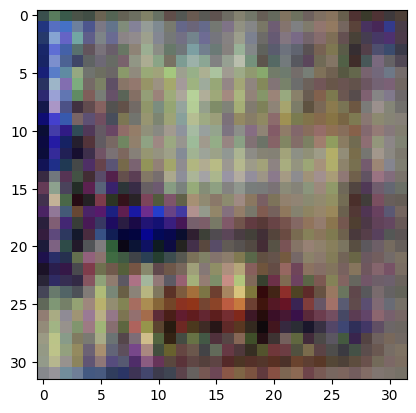

2/2 [==============================] - 0s 210ms/step
>10, 14/39, d1=0.686, d2=0.621 g=1.215


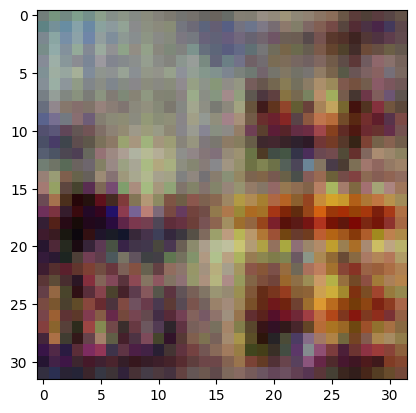

2/2 [==============================] - 0s 206ms/step
>10, 15/39, d1=0.562, d2=0.565 g=1.270


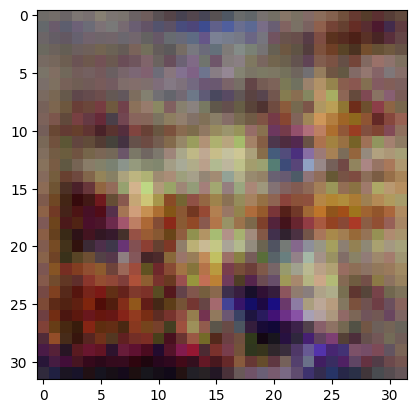

2/2 [==============================] - 0s 220ms/step
>10, 16/39, d1=0.545, d2=0.509 g=1.287


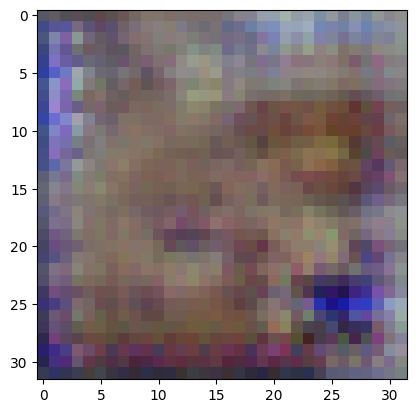

2/2 [==============================] - 1s 286ms/step
>10, 17/39, d1=0.605, d2=0.675 g=1.245


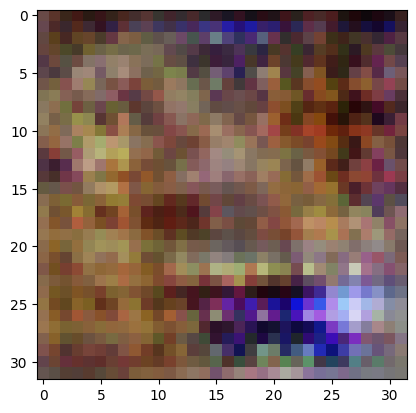

2/2 [==============================] - 0s 226ms/step
>10, 18/39, d1=0.581, d2=0.784 g=1.267


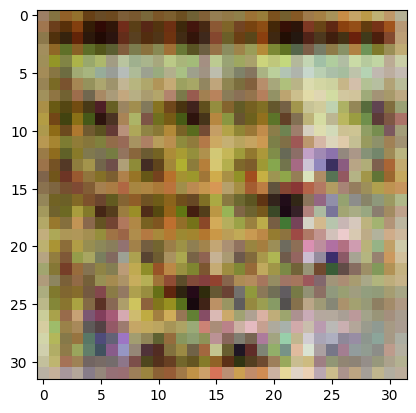

2/2 [==============================] - 0s 267ms/step
>10, 19/39, d1=0.488, d2=0.571 g=1.529


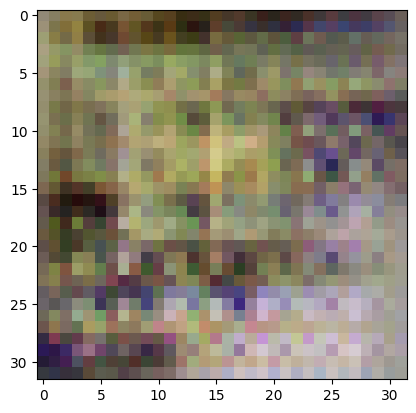

2/2 [==============================] - 0s 212ms/step
>10, 20/39, d1=0.671, d2=1.104 g=1.582


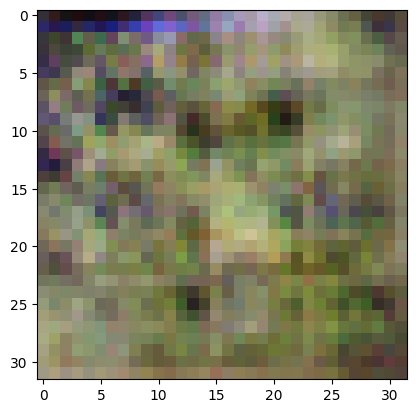

2/2 [==============================] - 0s 208ms/step
>10, 21/39, d1=0.773, d2=0.506 g=1.302


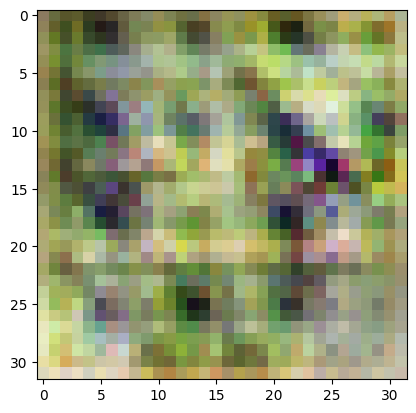

2/2 [==============================] - 1s 281ms/step
>10, 22/39, d1=0.729, d2=0.877 g=0.935


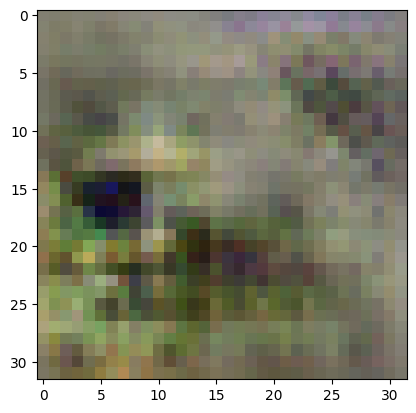

2/2 [==============================] - 0s 209ms/step
>10, 23/39, d1=0.667, d2=0.817 g=1.013


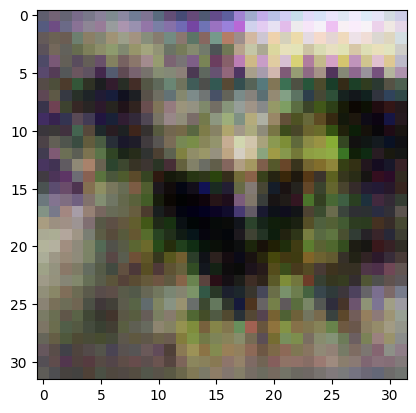

2/2 [==============================] - 0s 215ms/step
>10, 24/39, d1=0.740, d2=0.578 g=1.069


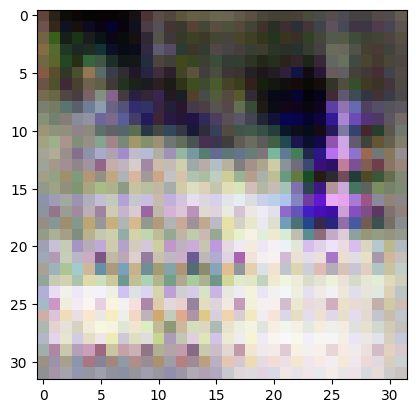

2/2 [==============================] - 1s 322ms/step
>10, 25/39, d1=0.766, d2=0.524 g=1.125


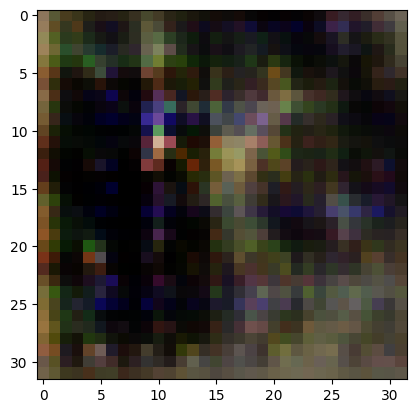

2/2 [==============================] - 0s 220ms/step
>10, 26/39, d1=0.731, d2=0.539 g=1.080


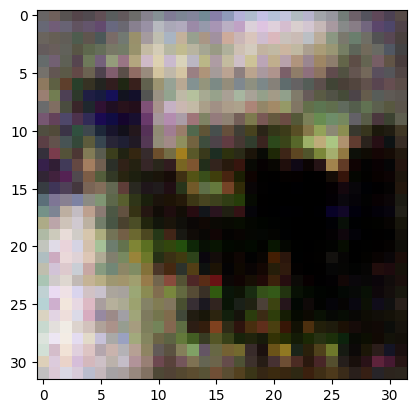

2/2 [==============================] - 0s 220ms/step
>10, 27/39, d1=0.713, d2=0.618 g=1.134


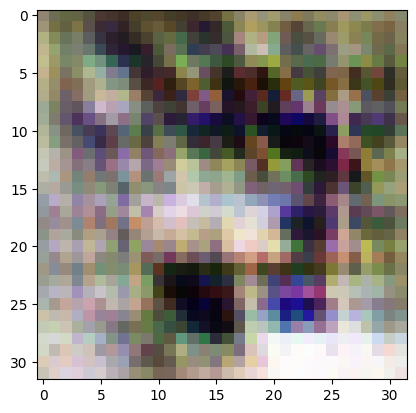

2/2 [==============================] - 1s 276ms/step
>10, 28/39, d1=0.644, d2=0.554 g=1.180


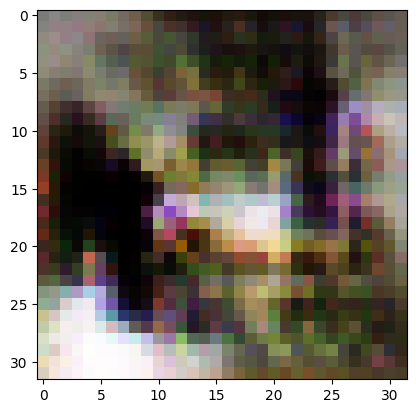

2/2 [==============================] - 0s 212ms/step
>10, 29/39, d1=0.690, d2=0.659 g=1.172


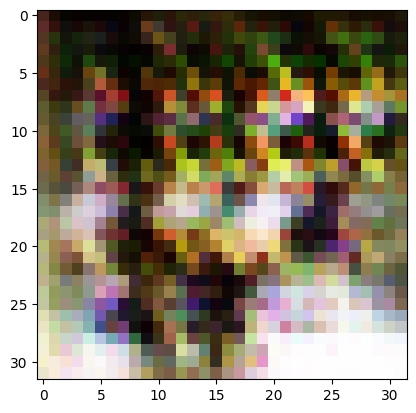

2/2 [==============================] - 0s 208ms/step
>10, 30/39, d1=0.701, d2=0.681 g=1.218


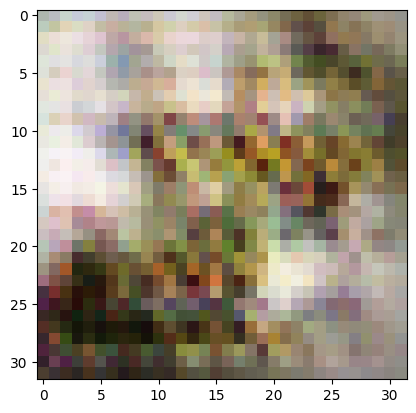

2/2 [==============================] - 1s 276ms/step
>10, 31/39, d1=0.843, d2=0.595 g=1.032


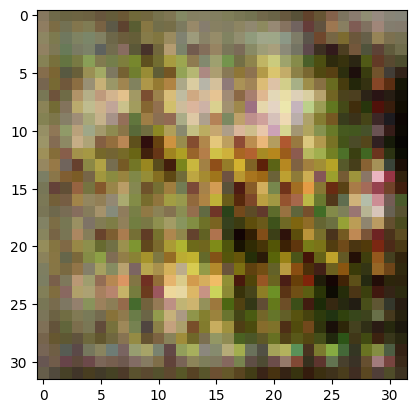

2/2 [==============================] - 0s 212ms/step
>10, 32/39, d1=0.704, d2=0.615 g=1.019


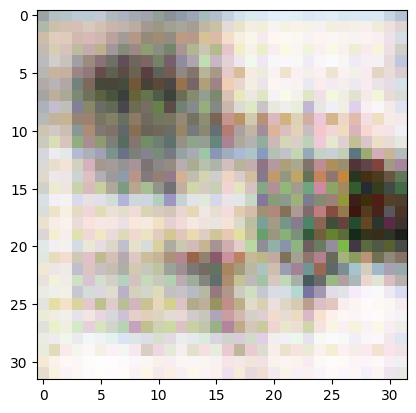

2/2 [==============================] - 0s 214ms/step
>10, 33/39, d1=0.659, d2=0.625 g=0.985


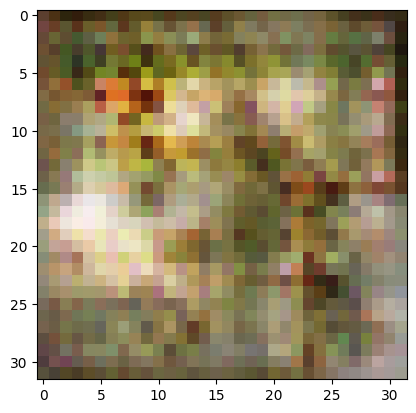

2/2 [==============================] - 1s 299ms/step
>10, 34/39, d1=0.574, d2=0.620 g=1.180


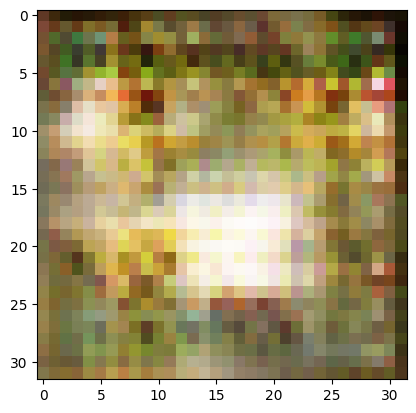

2/2 [==============================] - 0s 213ms/step
>10, 35/39, d1=0.585, d2=0.496 g=1.275


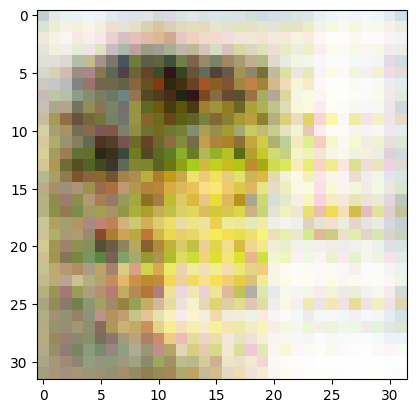

2/2 [==============================] - 0s 233ms/step
>10, 36/39, d1=0.514, d2=0.572 g=1.049


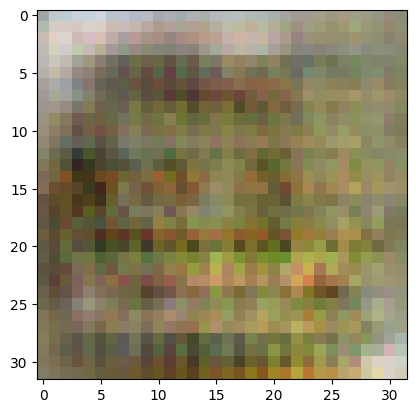

2/2 [==============================] - 1s 267ms/step
>10, 37/39, d1=0.511, d2=0.631 g=1.001


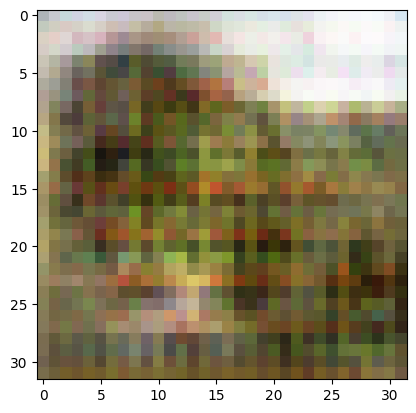

2/2 [==============================] - 0s 208ms/step
>10, 38/39, d1=0.587, d2=0.641 g=1.004


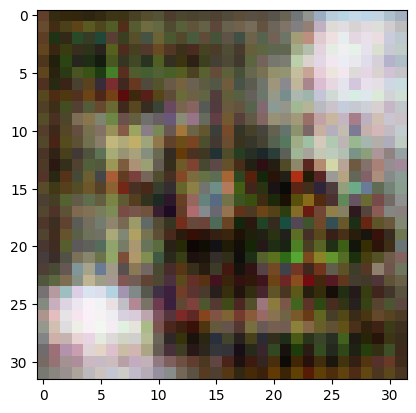

2/2 [==============================] - 0s 213ms/step
>10, 39/39, d1=0.505, d2=0.698 g=1.064


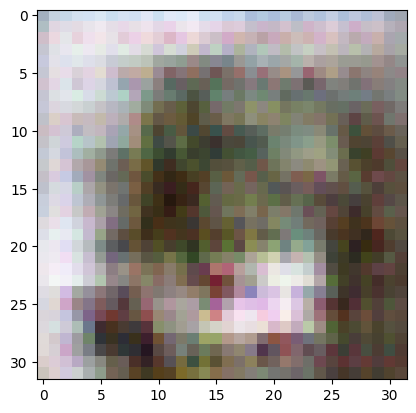

5/5 [==============================] - 1s 202ms/step
>Accuracy real: 66%, fake: 77%


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2/2 [==============================] - 0s 209ms/step
>11, 1/39, d1=0.520, d2=0.581 g=1.184


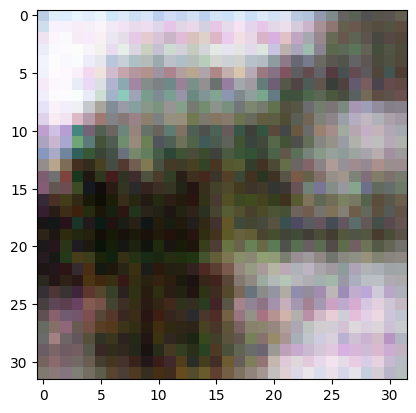

2/2 [==============================] - 0s 215ms/step
>11, 2/39, d1=0.586, d2=0.522 g=1.265


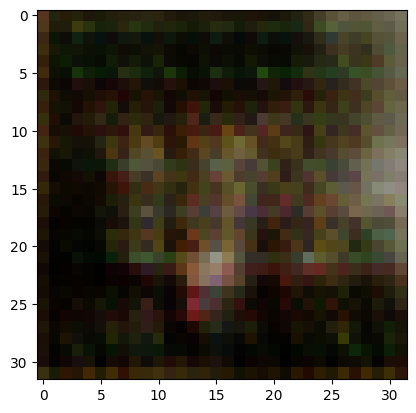

2/2 [==============================] - 0s 212ms/step
>11, 3/39, d1=0.610, d2=0.501 g=1.268


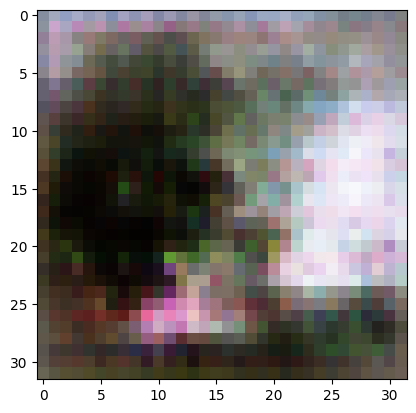

2/2 [==============================] - 0s 217ms/step
>11, 4/39, d1=0.594, d2=0.566 g=1.216


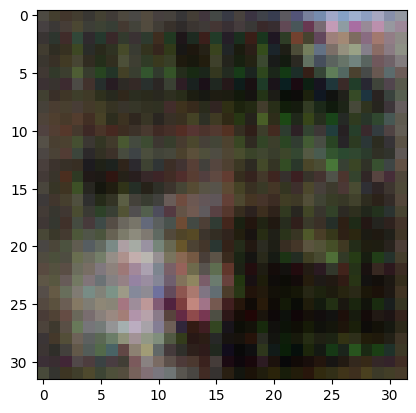

2/2 [==============================] - 0s 212ms/step
>11, 5/39, d1=0.489, d2=0.610 g=1.284


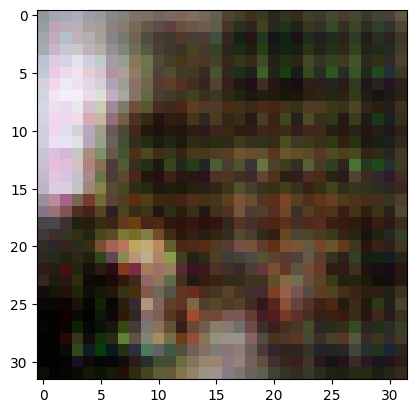

2/2 [==============================] - 0s 224ms/step
>11, 6/39, d1=0.573, d2=0.830 g=1.394


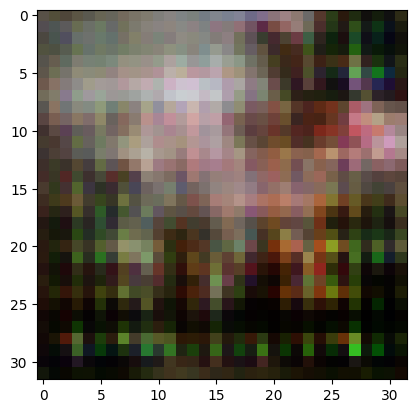

2/2 [==============================] - 0s 225ms/step
>11, 7/39, d1=0.680, d2=0.565 g=1.270


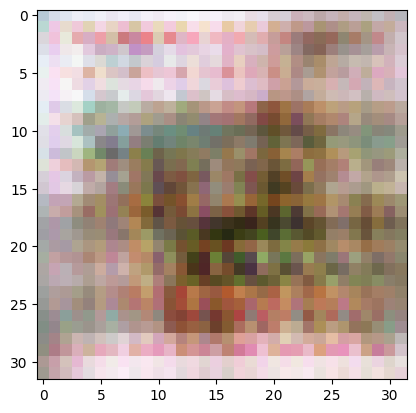

2/2 [==============================] - 0s 226ms/step
>11, 8/39, d1=0.638, d2=0.828 g=1.522


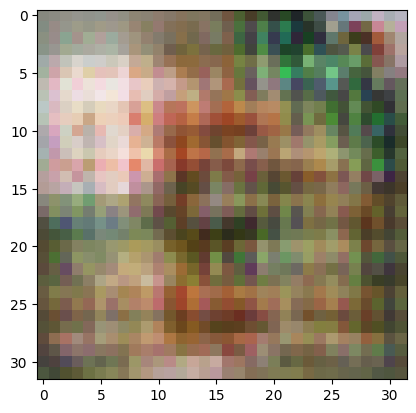

2/2 [==============================] - 0s 238ms/step
>11, 9/39, d1=0.616, d2=0.683 g=1.617


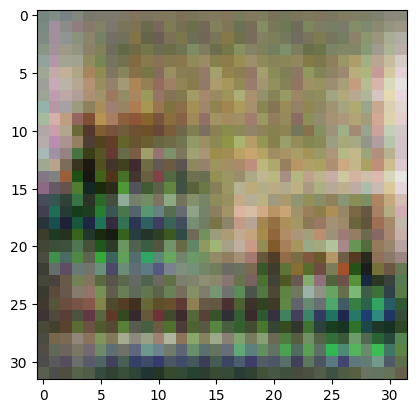

2/2 [==============================] - 0s 218ms/step
>11, 10/39, d1=0.567, d2=0.471 g=1.538


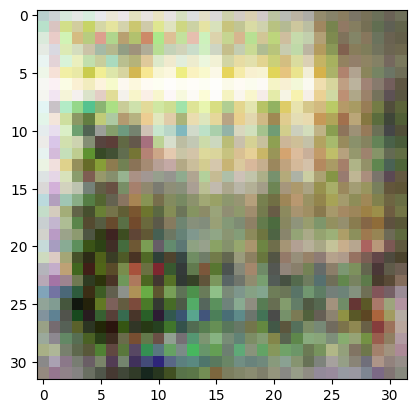

2/2 [==============================] - 0s 289ms/step
>11, 11/39, d1=0.662, d2=0.469 g=1.322


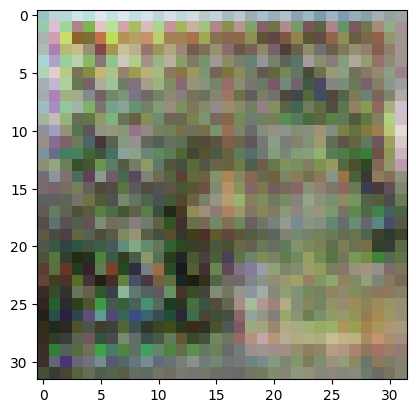

2/2 [==============================] - 0s 212ms/step
>11, 12/39, d1=0.474, d2=0.788 g=1.056


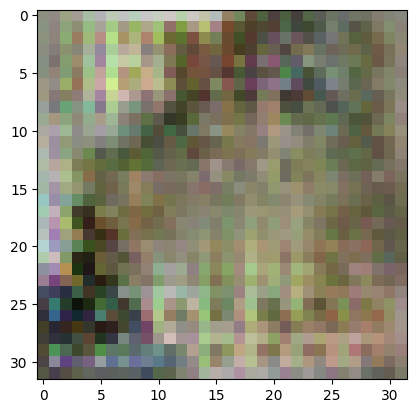

2/2 [==============================] - 0s 210ms/step
>11, 13/39, d1=0.409, d2=1.143 g=1.202


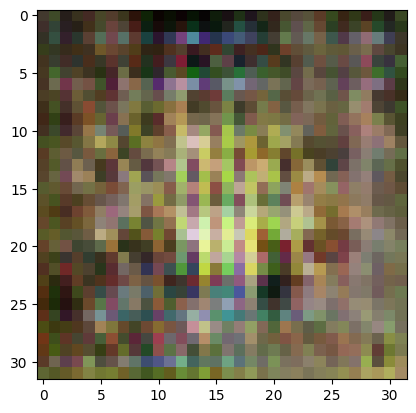

2/2 [==============================] - 1s 284ms/step
>11, 14/39, d1=0.778, d2=0.637 g=1.231


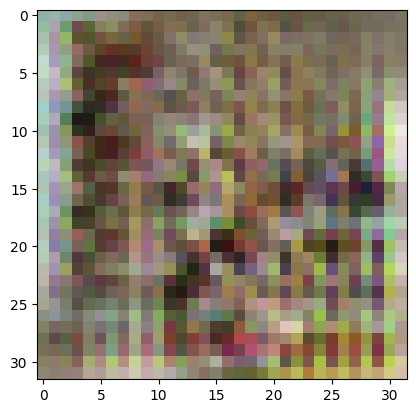

2/2 [==============================] - 0s 227ms/step
>11, 15/39, d1=0.710, d2=0.515 g=1.179


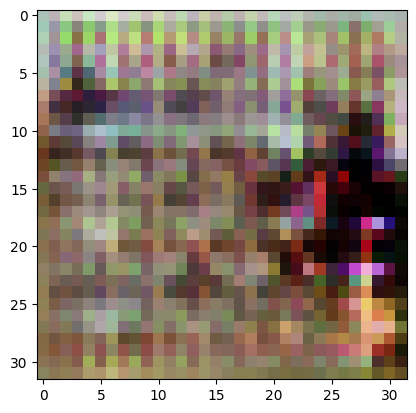

2/2 [==============================] - 0s 221ms/step
>11, 16/39, d1=0.727, d2=0.526 g=1.278


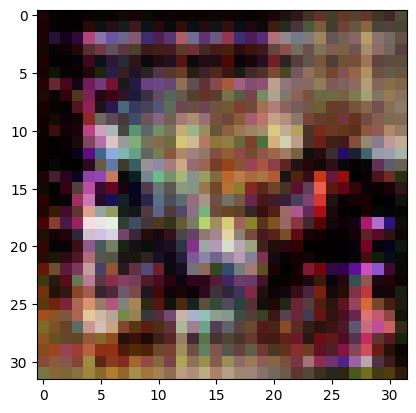

2/2 [==============================] - 1s 309ms/step
>11, 17/39, d1=0.675, d2=0.664 g=1.570


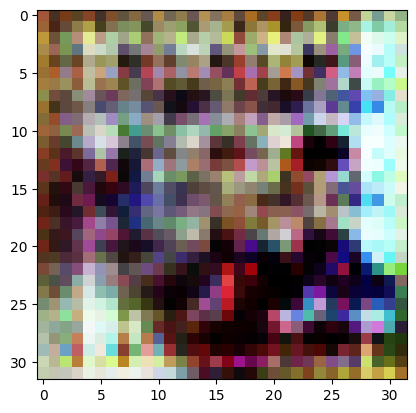

2/2 [==============================] - 0s 226ms/step
>11, 18/39, d1=0.623, d2=0.391 g=1.753


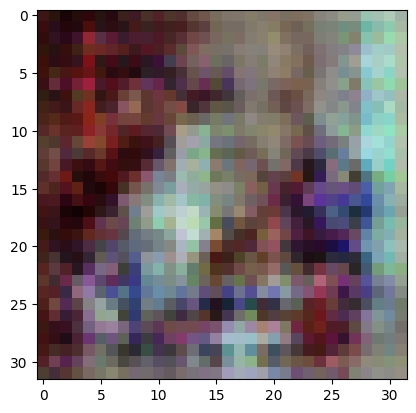

2/2 [==============================] - 0s 216ms/step
>11, 19/39, d1=0.622, d2=0.490 g=1.600


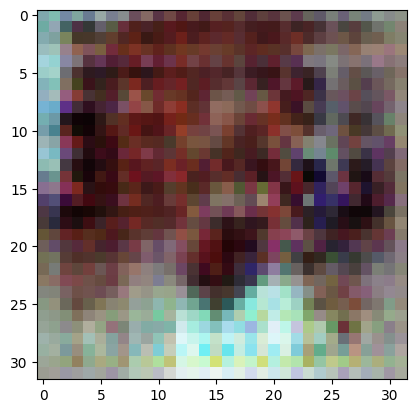

2/2 [==============================] - 1s 292ms/step
>11, 20/39, d1=0.366, d2=0.566 g=1.434


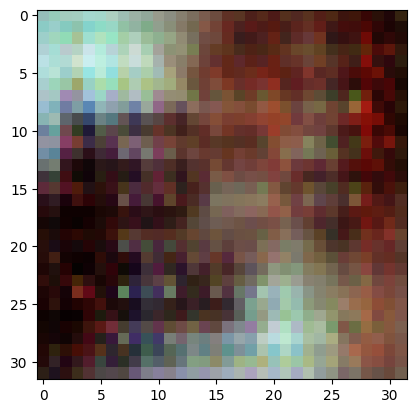

2/2 [==============================] - 0s 217ms/step
>11, 21/39, d1=0.536, d2=0.811 g=1.191


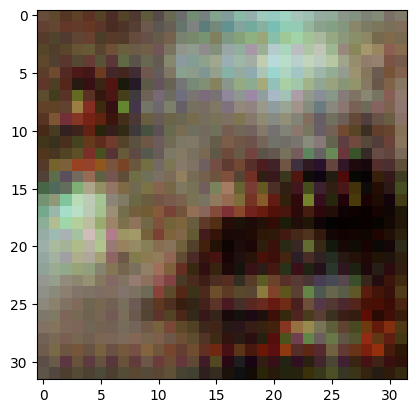

2/2 [==============================] - 0s 214ms/step
>11, 22/39, d1=0.514, d2=0.839 g=1.008


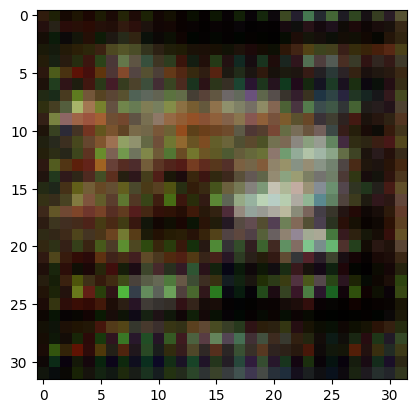

2/2 [==============================] - 1s 301ms/step
>11, 23/39, d1=0.694, d2=0.754 g=1.090


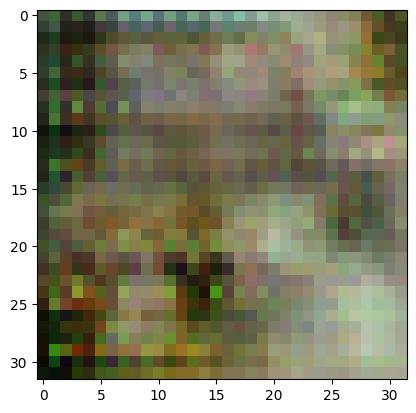

2/2 [==============================] - 0s 220ms/step
>11, 24/39, d1=0.630, d2=0.543 g=1.179


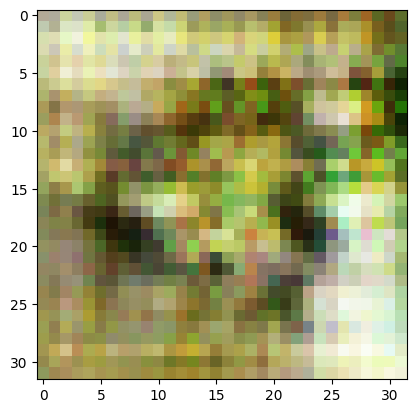

2/2 [==============================] - 1s 284ms/step
>11, 25/39, d1=0.555, d2=0.516 g=1.282


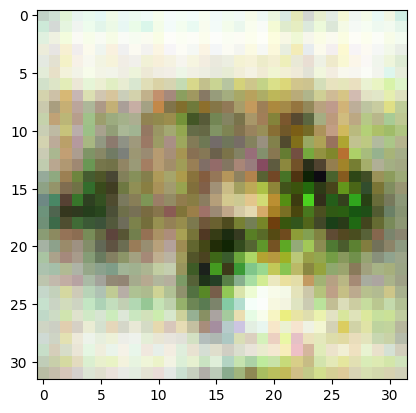

2/2 [==============================] - 0s 213ms/step
>11, 26/39, d1=0.561, d2=0.614 g=1.173


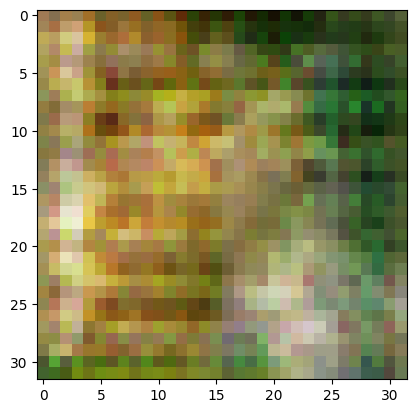

2/2 [==============================] - 0s 219ms/step
>11, 27/39, d1=0.607, d2=0.803 g=1.149


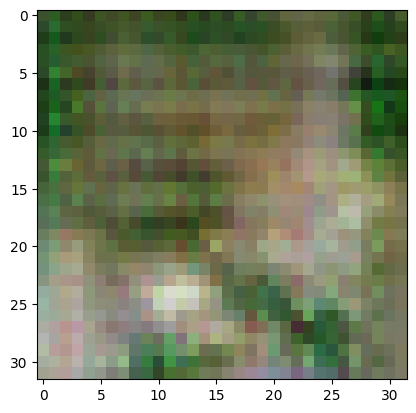

2/2 [==============================] - 0s 216ms/step
>11, 28/39, d1=0.555, d2=0.722 g=1.275


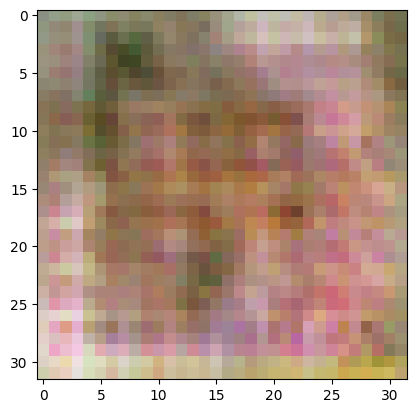

2/2 [==============================] - 0s 217ms/step
>11, 29/39, d1=0.689, d2=0.537 g=1.383


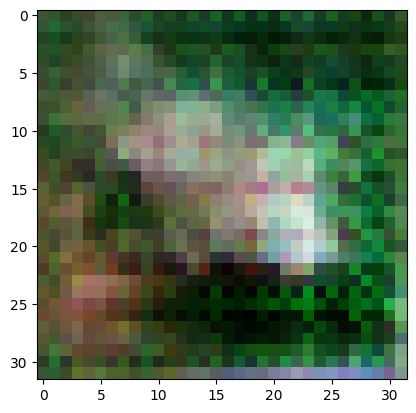

2/2 [==============================] - 0s 222ms/step
>11, 30/39, d1=0.761, d2=0.813 g=1.549


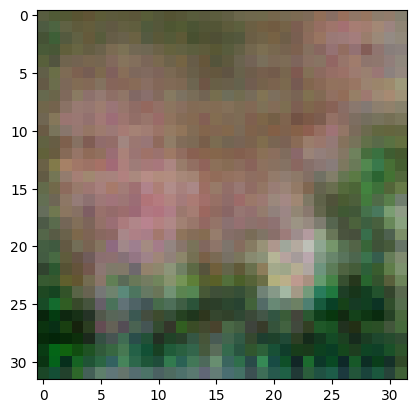

2/2 [==============================] - 0s 215ms/step
>11, 31/39, d1=0.755, d2=0.572 g=1.398


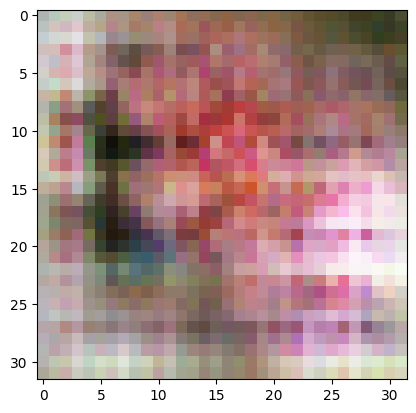

2/2 [==============================] - 0s 211ms/step
>11, 32/39, d1=0.735, d2=0.680 g=1.207


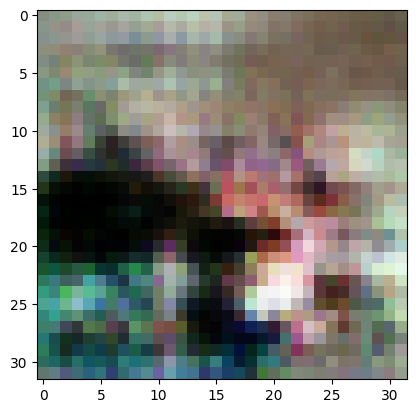

2/2 [==============================] - 0s 216ms/step
>11, 33/39, d1=0.660, d2=0.720 g=1.135


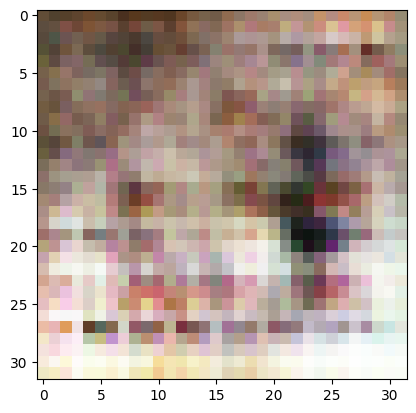

2/2 [==============================] - 1s 286ms/step
>11, 34/39, d1=0.638, d2=0.616 g=1.152


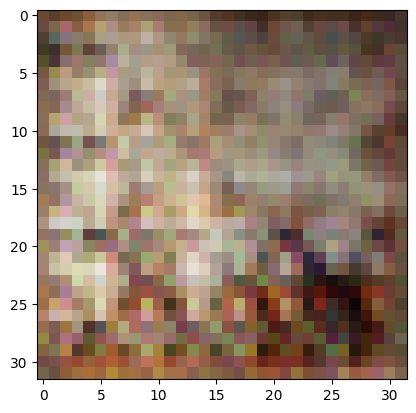

2/2 [==============================] - 0s 236ms/step
>11, 35/39, d1=0.710, d2=0.637 g=1.053


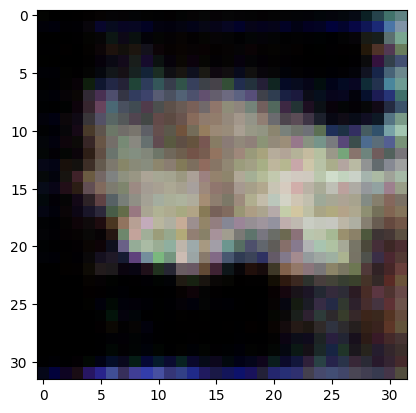

2/2 [==============================] - 0s 219ms/step
>11, 36/39, d1=0.658, d2=0.595 g=1.046


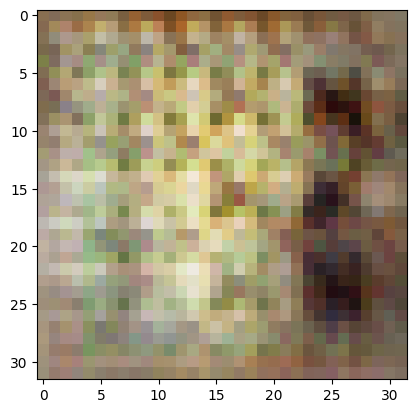

2/2 [==============================] - 1s 281ms/step
>11, 37/39, d1=0.683, d2=0.770 g=1.078


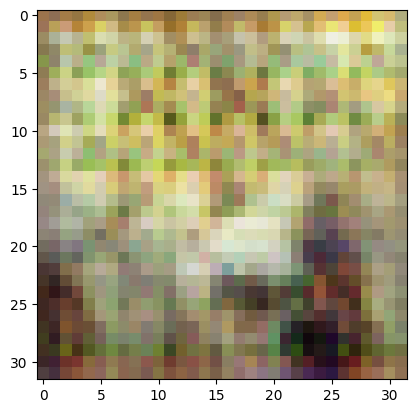

2/2 [==============================] - 0s 215ms/step
>11, 38/39, d1=0.687, d2=0.564 g=1.124


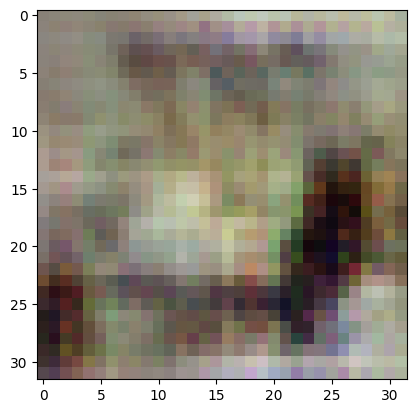

2/2 [==============================] - 0s 212ms/step
>11, 39/39, d1=0.508, d2=0.571 g=1.049


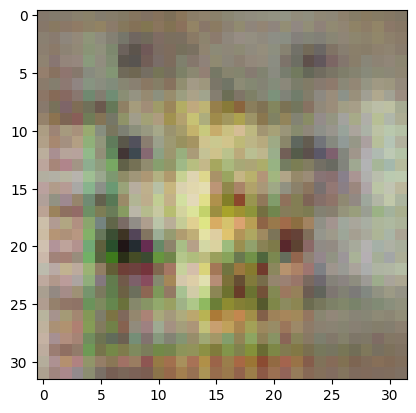

2/2 [==============================] - 1s 292ms/step
>12, 1/39, d1=0.484, d2=0.828 g=1.039


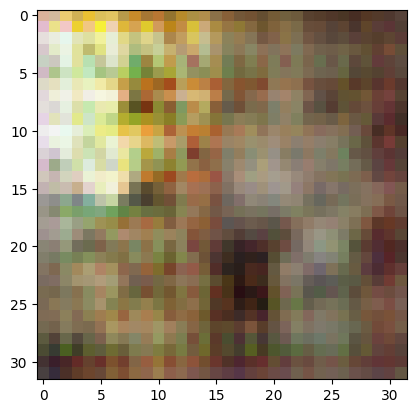

2/2 [==============================] - 0s 220ms/step
>12, 2/39, d1=0.566, d2=0.711 g=0.954


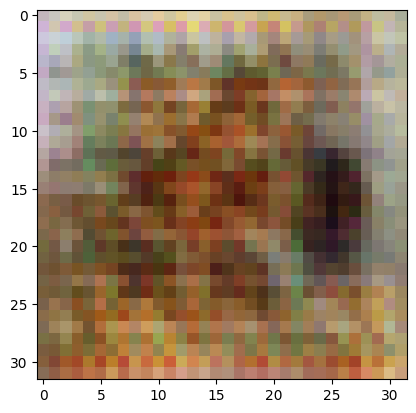

2/2 [==============================] - 0s 227ms/step
>12, 3/39, d1=0.491, d2=0.656 g=1.150


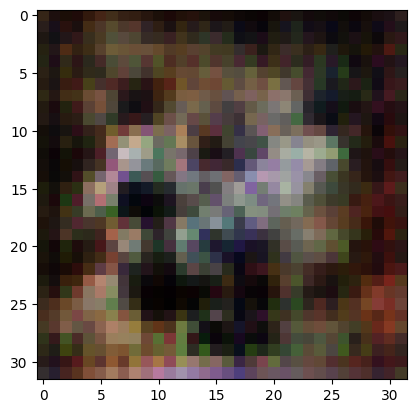

2/2 [==============================] - 1s 289ms/step
>12, 4/39, d1=0.592, d2=0.483 g=1.289


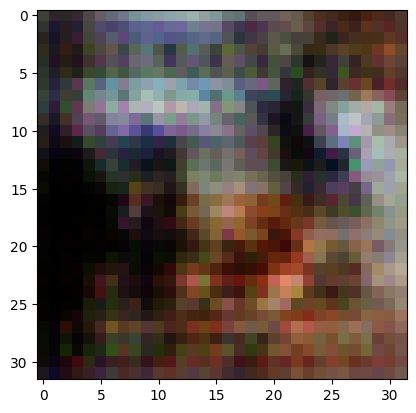

2/2 [==============================] - 0s 212ms/step
>12, 5/39, d1=0.534, d2=0.492 g=1.354


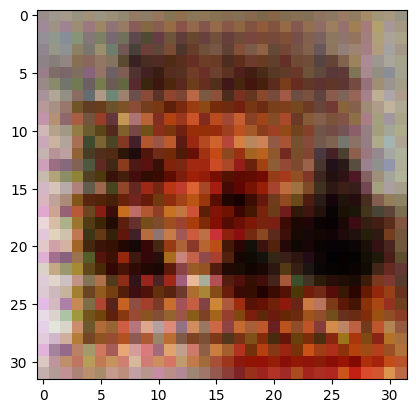

2/2 [==============================] - 0s 231ms/step
>12, 6/39, d1=0.483, d2=0.748 g=1.501


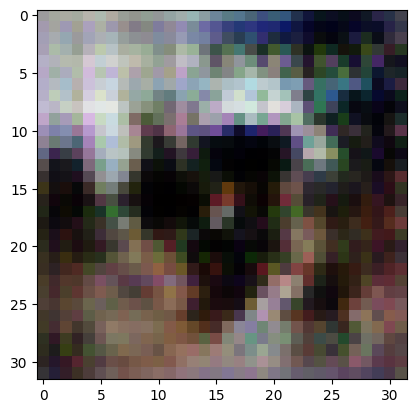

2/2 [==============================] - 1s 273ms/step
>12, 7/39, d1=0.748, d2=0.607 g=1.349


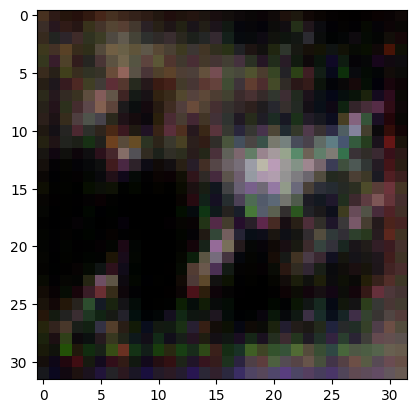

2/2 [==============================] - 0s 213ms/step
>12, 8/39, d1=0.803, d2=0.664 g=1.185


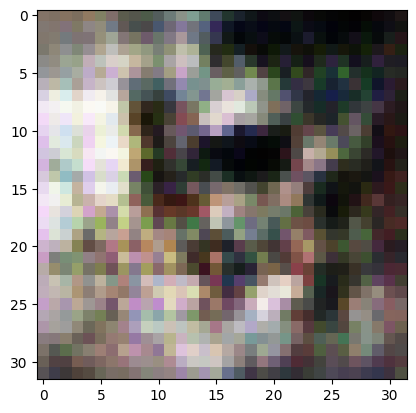

2/2 [==============================] - 0s 217ms/step
>12, 9/39, d1=0.719, d2=0.516 g=1.230


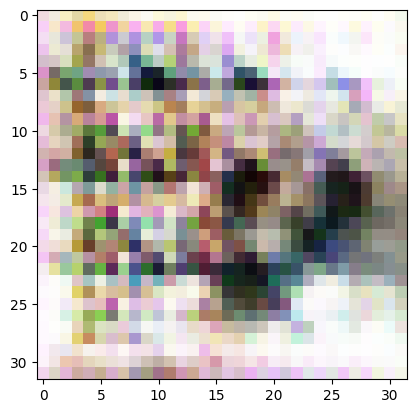

2/2 [==============================] - 1s 282ms/step
>12, 10/39, d1=0.624, d2=0.481 g=1.295


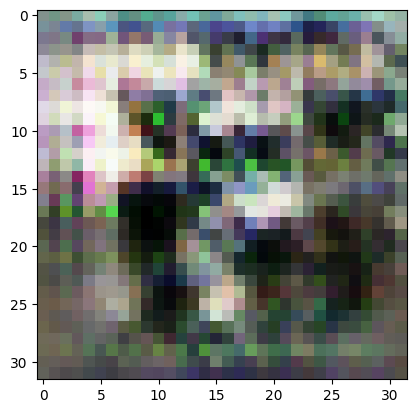

2/2 [==============================] - 0s 209ms/step
>12, 11/39, d1=0.514, d2=0.530 g=1.169


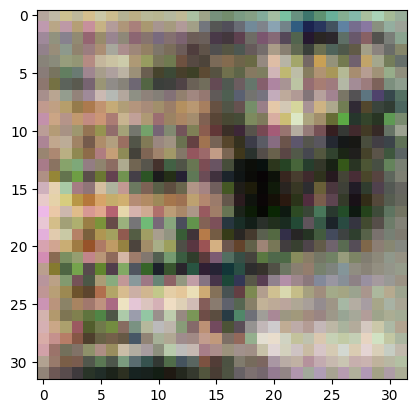

2/2 [==============================] - 0s 221ms/step
>12, 12/39, d1=0.436, d2=1.135 g=1.298


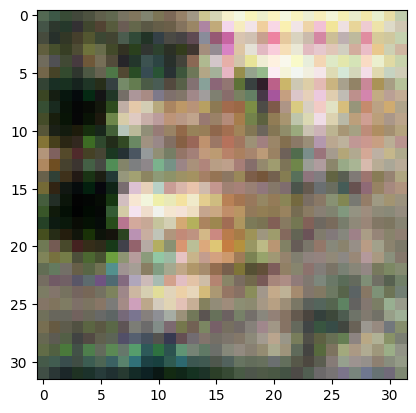

2/2 [==============================] - 1s 285ms/step
>12, 13/39, d1=0.659, d2=0.437 g=1.277


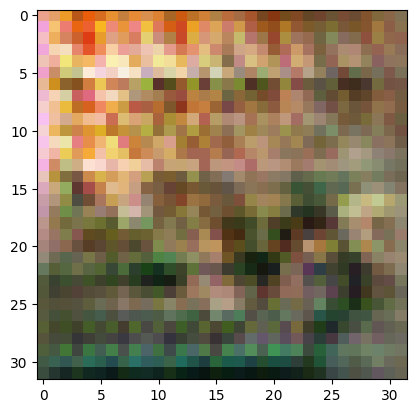

2/2 [==============================] - 0s 228ms/step
>12, 14/39, d1=0.582, d2=0.653 g=1.210


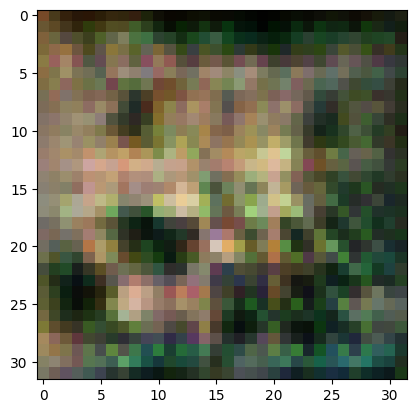

2/2 [==============================] - 0s 231ms/step
>12, 15/39, d1=0.573, d2=0.651 g=1.112


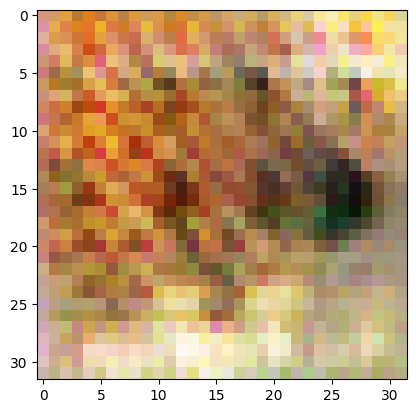

2/2 [==============================] - 1s 231ms/step
>12, 16/39, d1=0.507, d2=0.832 g=1.129


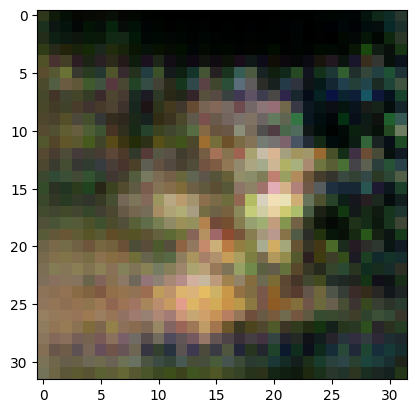

2/2 [==============================] - 0s 215ms/step
>12, 17/39, d1=0.654, d2=0.676 g=1.142


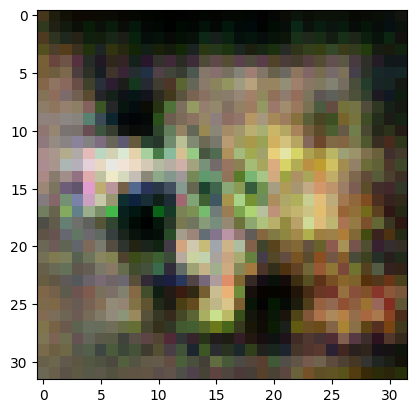

2/2 [==============================] - 0s 218ms/step
>12, 18/39, d1=0.695, d2=0.859 g=1.120


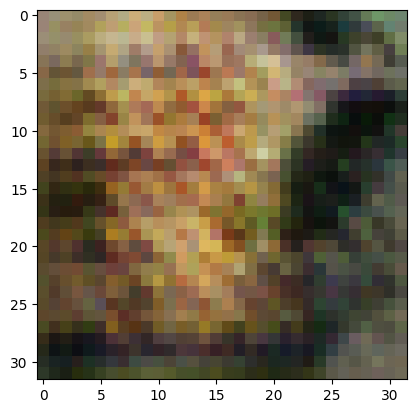

2/2 [==============================] - 0s 269ms/step
>12, 19/39, d1=0.816, d2=0.599 g=1.040


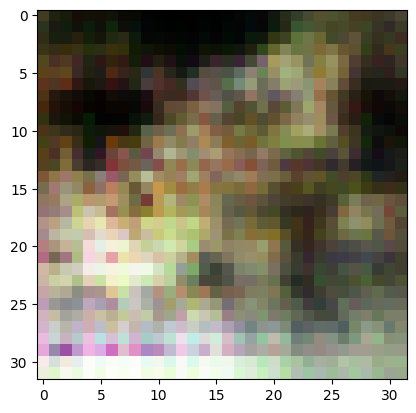

2/2 [==============================] - 0s 212ms/step
>12, 20/39, d1=0.862, d2=0.634 g=0.986


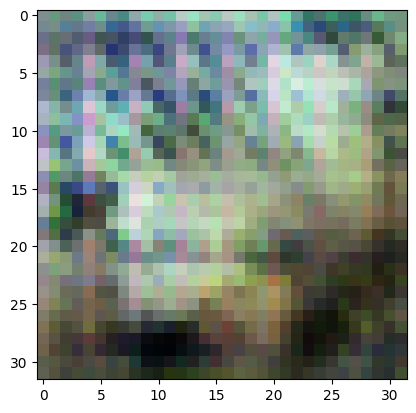

2/2 [==============================] - 1s 279ms/step
>12, 21/39, d1=0.651, d2=0.622 g=1.066


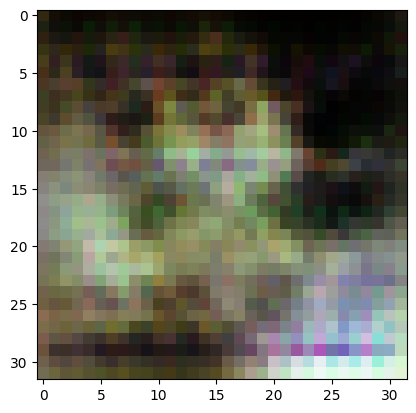

2/2 [==============================] - 0s 219ms/step
>12, 22/39, d1=0.731, d2=0.592 g=1.180


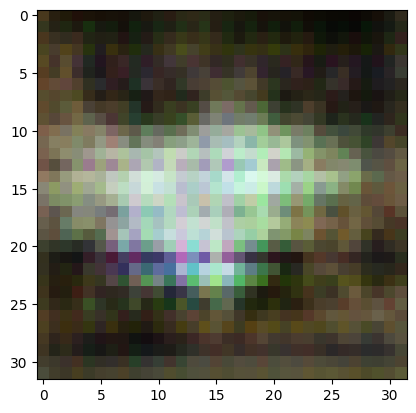

2/2 [==============================] - 0s 214ms/step
>12, 23/39, d1=0.778, d2=0.482 g=1.306


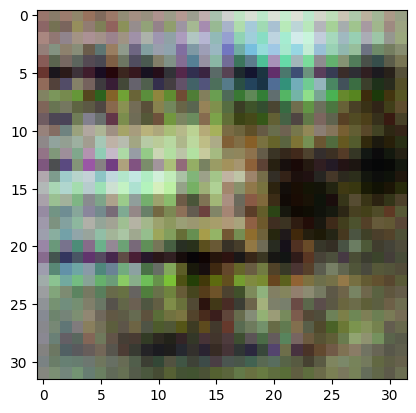

2/2 [==============================] - 1s 281ms/step
>12, 24/39, d1=0.696, d2=0.521 g=1.224


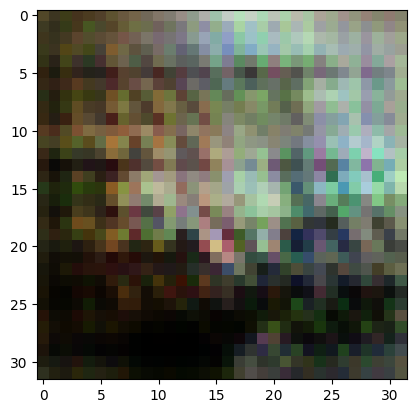

2/2 [==============================] - 0s 230ms/step
>12, 25/39, d1=0.640, d2=0.533 g=1.210


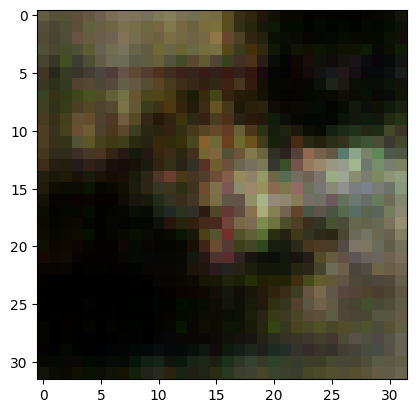

2/2 [==============================] - 1s 293ms/step
>12, 26/39, d1=0.728, d2=0.549 g=1.194


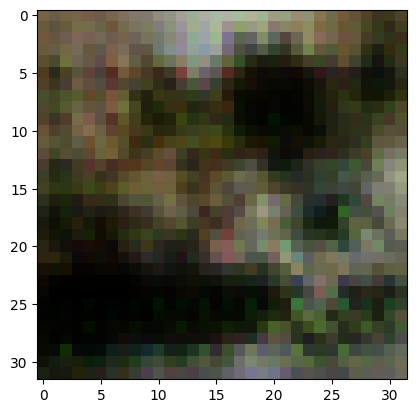

2/2 [==============================] - 0s 216ms/step
>12, 27/39, d1=0.683, d2=0.570 g=0.972


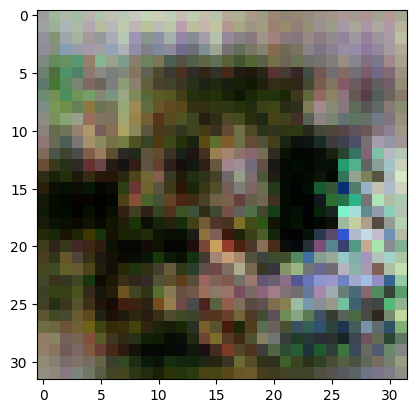

2/2 [==============================] - 0s 209ms/step
>12, 28/39, d1=0.661, d2=0.750 g=0.877


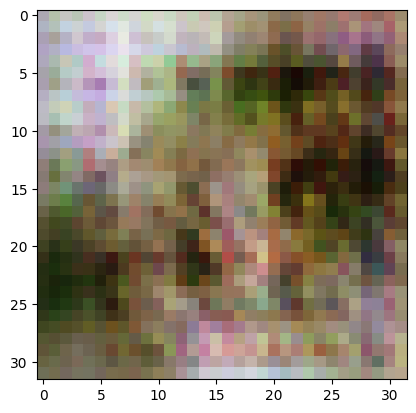

2/2 [==============================] - 1s 307ms/step
>12, 29/39, d1=0.674, d2=0.850 g=0.898


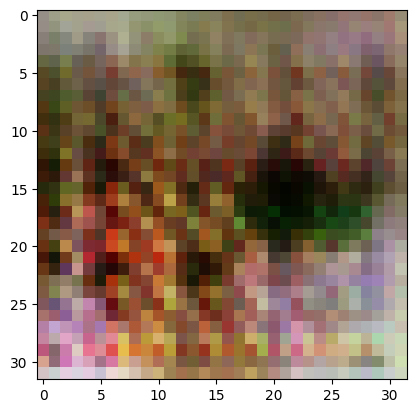

2/2 [==============================] - 0s 216ms/step
>12, 30/39, d1=0.626, d2=0.775 g=1.313


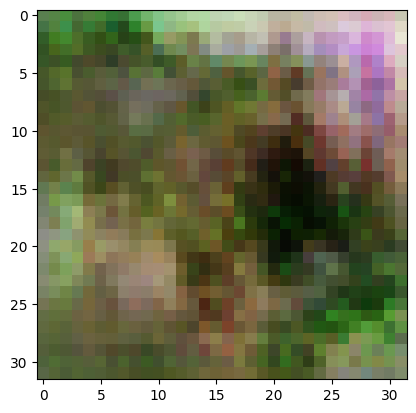

2/2 [==============================] - 0s 224ms/step
>12, 31/39, d1=0.694, d2=0.670 g=1.027


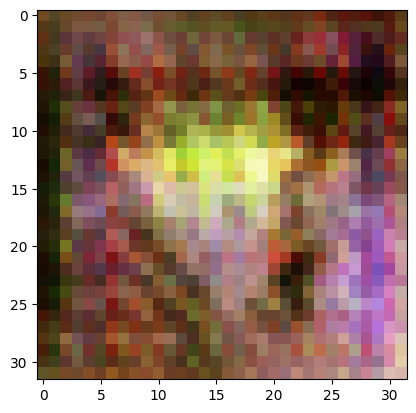

2/2 [==============================] - 1s 329ms/step
>12, 32/39, d1=0.817, d2=0.675 g=0.933


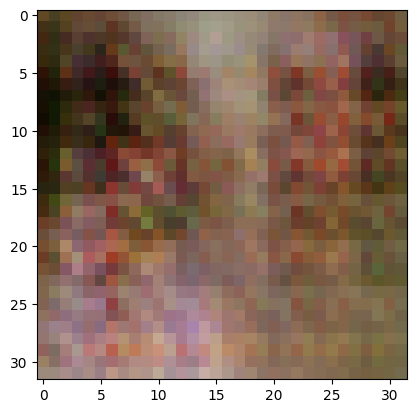

2/2 [==============================] - 0s 222ms/step
>12, 33/39, d1=0.671, d2=0.589 g=0.989


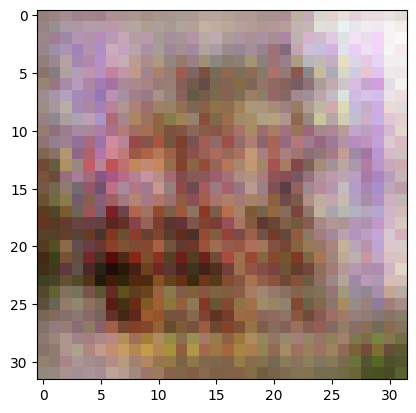

2/2 [==============================] - 0s 220ms/step
>12, 34/39, d1=0.720, d2=0.591 g=1.037


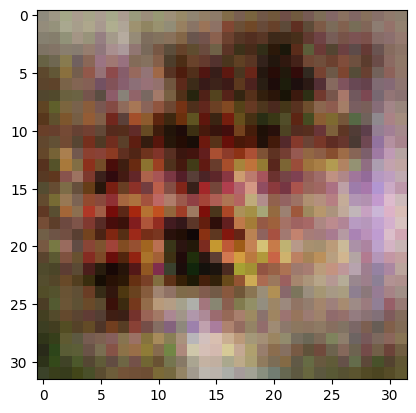

2/2 [==============================] - 1s 275ms/step
>12, 35/39, d1=0.712, d2=0.528 g=1.080


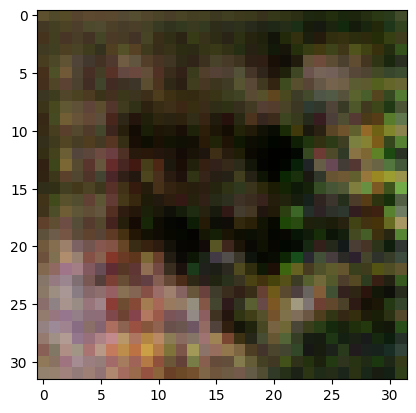

2/2 [==============================] - 0s 216ms/step
>12, 36/39, d1=0.713, d2=0.515 g=1.142


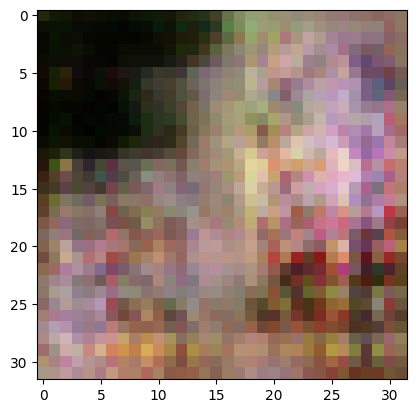

2/2 [==============================] - 0s 213ms/step
>12, 37/39, d1=0.706, d2=0.516 g=1.082


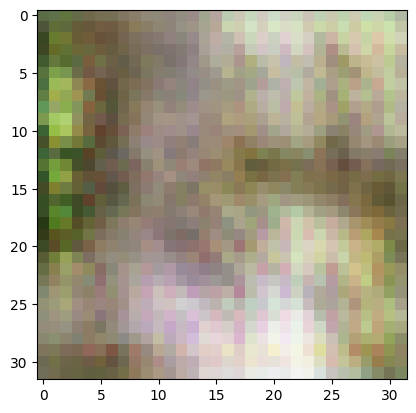

2/2 [==============================] - 0s 219ms/step
>12, 38/39, d1=0.654, d2=0.566 g=1.004


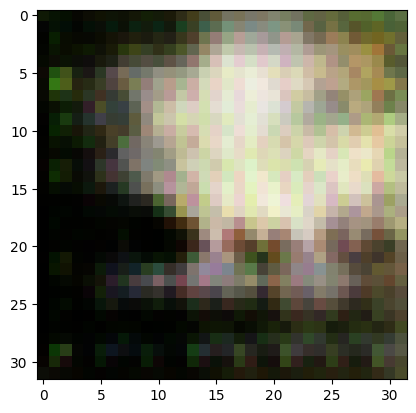

2/2 [==============================] - 0s 219ms/step
>12, 39/39, d1=0.655, d2=0.675 g=0.951


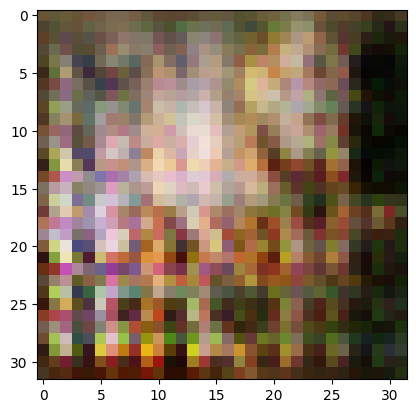

2/2 [==============================] - 0s 211ms/step
>13, 1/39, d1=0.672, d2=0.653 g=0.906


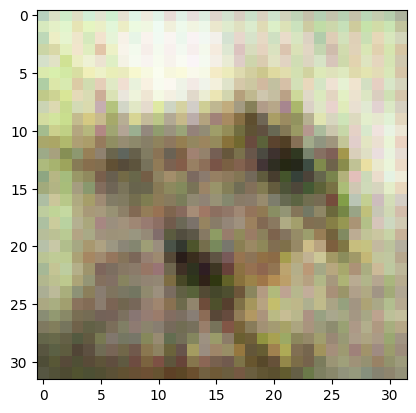

2/2 [==============================] - 0s 218ms/step
>13, 2/39, d1=0.551, d2=0.687 g=0.893


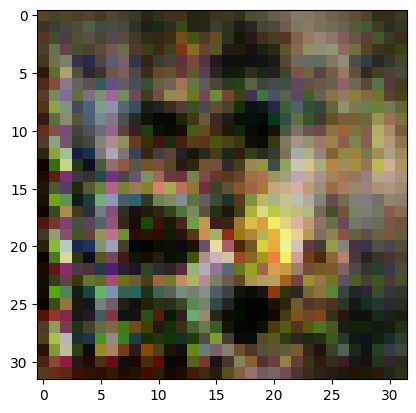

2/2 [==============================] - 0s 208ms/step
>13, 3/39, d1=0.542, d2=0.705 g=0.911


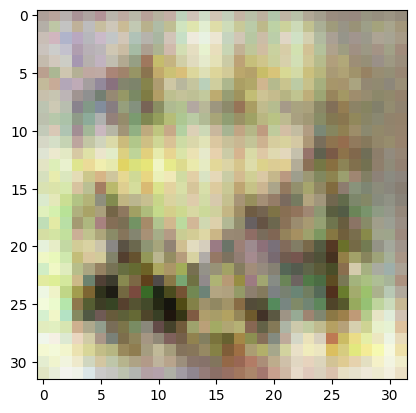

2/2 [==============================] - 0s 216ms/step
>13, 4/39, d1=0.632, d2=0.723 g=0.987


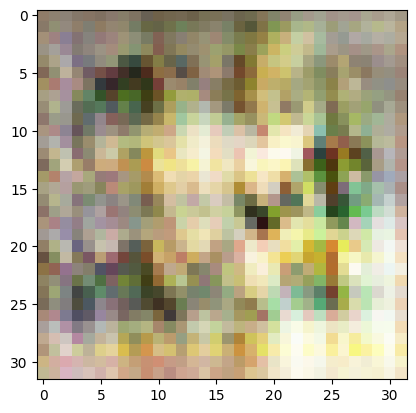

2/2 [==============================] - 0s 210ms/step
>13, 5/39, d1=0.580, d2=0.600 g=1.111


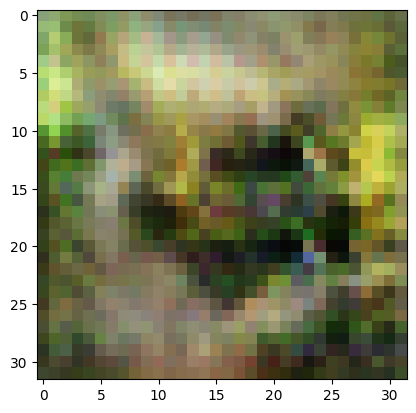

2/2 [==============================] - 0s 223ms/step
>13, 6/39, d1=0.565, d2=0.592 g=1.212


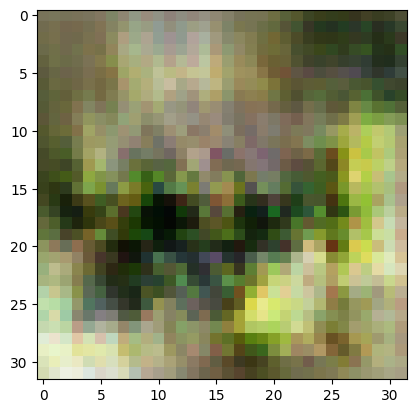

2/2 [==============================] - 1s 311ms/step
>13, 7/39, d1=0.564, d2=0.591 g=1.175


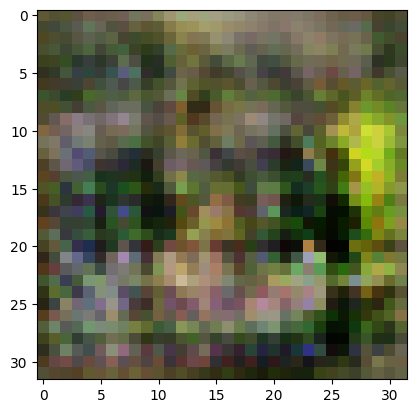

2/2 [==============================] - 0s 211ms/step
>13, 8/39, d1=0.556, d2=0.791 g=1.142


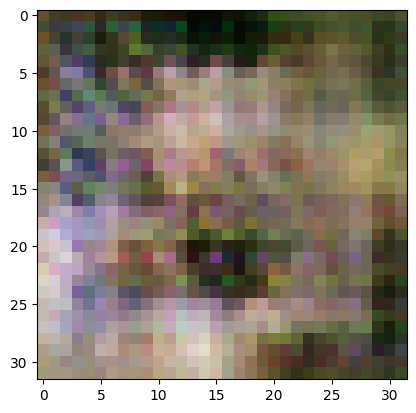

2/2 [==============================] - 0s 232ms/step
>13, 9/39, d1=0.637, d2=0.628 g=1.053


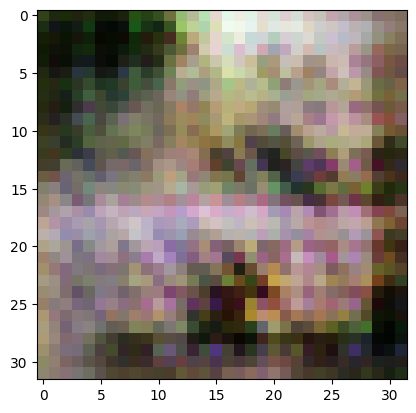

2/2 [==============================] - 1s 335ms/step
>13, 10/39, d1=0.626, d2=0.684 g=1.069


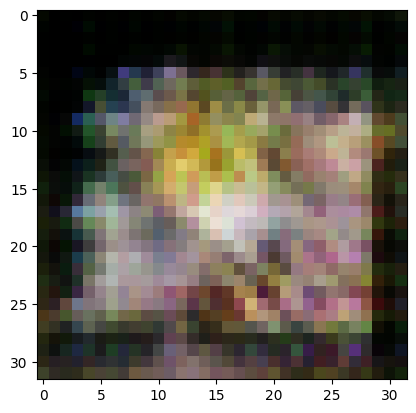

2/2 [==============================] - 0s 217ms/step
>13, 11/39, d1=0.574, d2=0.628 g=1.112


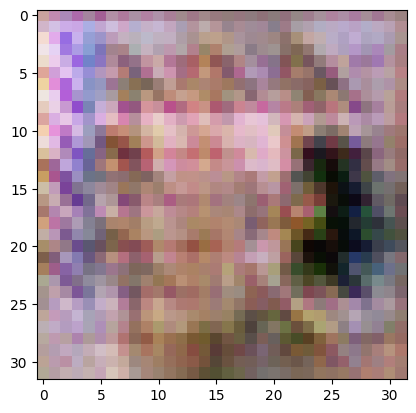

2/2 [==============================] - 0s 221ms/step
>13, 12/39, d1=0.549, d2=0.616 g=1.184


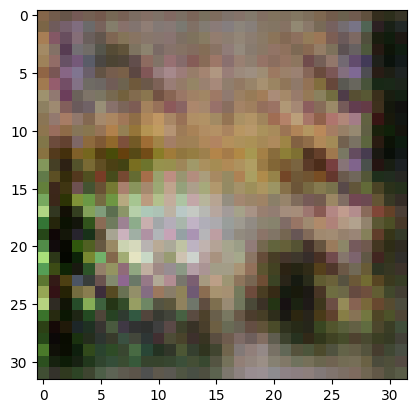

2/2 [==============================] - 1s 321ms/step
>13, 13/39, d1=0.572, d2=0.813 g=1.420


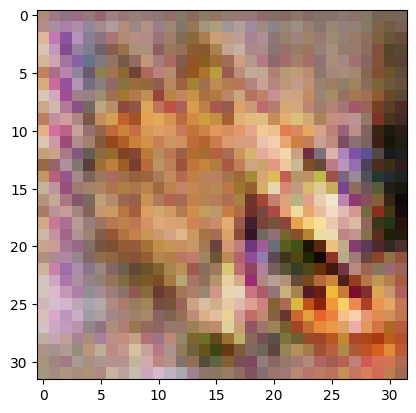

2/2 [==============================] - 0s 230ms/step
>13, 14/39, d1=0.772, d2=0.450 g=1.265


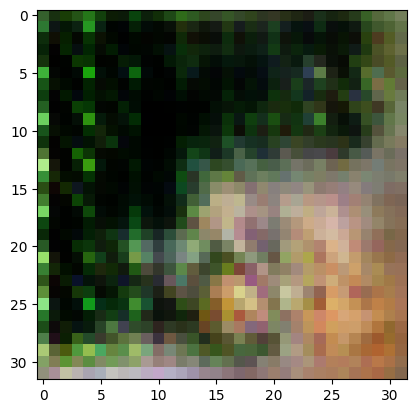

2/2 [==============================] - 0s 241ms/step
>13, 15/39, d1=0.706, d2=0.538 g=1.113


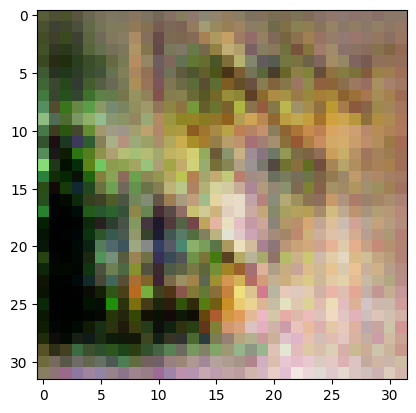

2/2 [==============================] - 1s 259ms/step
>13, 16/39, d1=0.619, d2=0.715 g=0.976


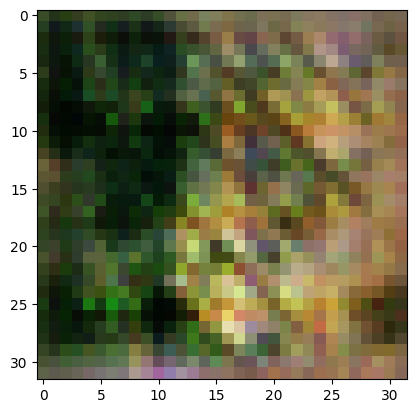

2/2 [==============================] - 0s 213ms/step
>13, 17/39, d1=0.580, d2=0.849 g=1.118


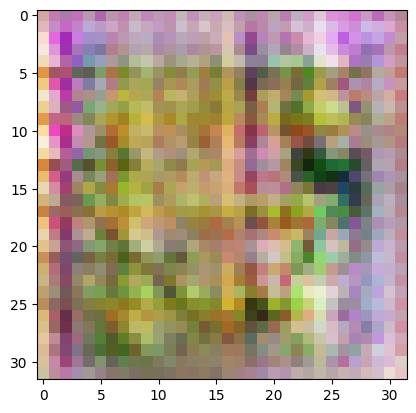

2/2 [==============================] - 0s 221ms/step
>13, 18/39, d1=0.669, d2=0.738 g=1.223


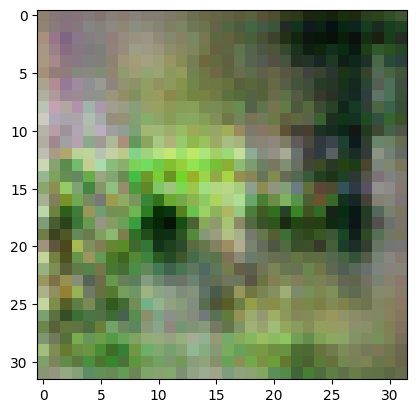

2/2 [==============================] - 1s 264ms/step
>13, 19/39, d1=0.706, d2=0.582 g=1.362


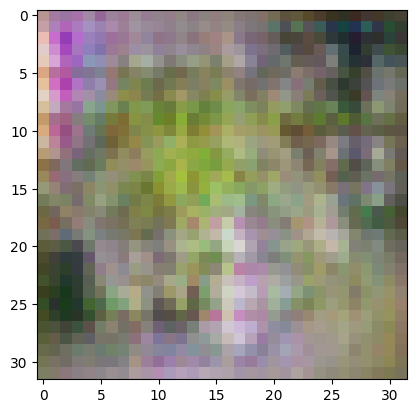

2/2 [==============================] - 0s 228ms/step
>13, 20/39, d1=0.692, d2=0.639 g=1.283


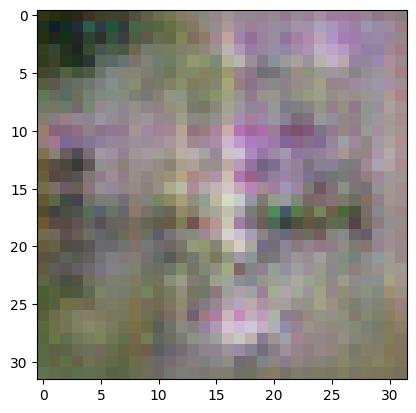

2/2 [==============================] - 0s 229ms/step
>13, 21/39, d1=0.718, d2=0.637 g=1.425


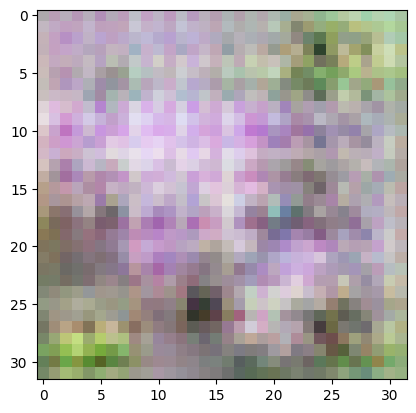

2/2 [==============================] - 1s 287ms/step
>13, 22/39, d1=0.685, d2=0.705 g=1.196


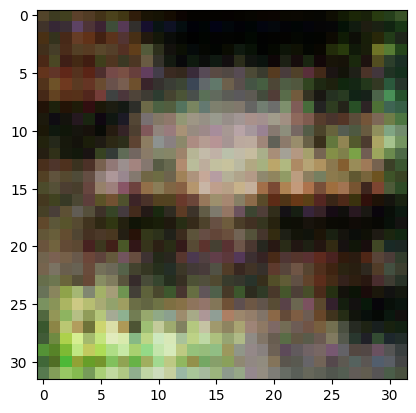

2/2 [==============================] - 0s 221ms/step
>13, 23/39, d1=0.742, d2=1.047 g=0.880


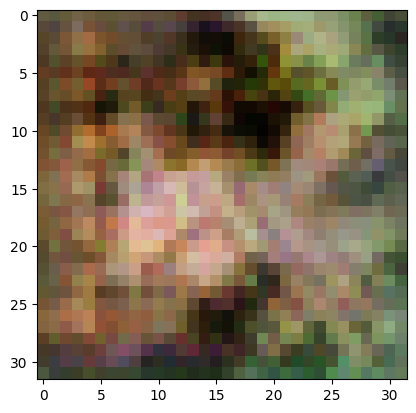

2/2 [==============================] - 0s 217ms/step
>13, 24/39, d1=0.793, d2=0.750 g=0.857


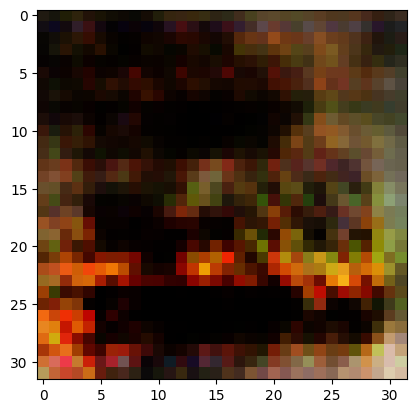

2/2 [==============================] - 1s 306ms/step
>13, 25/39, d1=0.773, d2=0.627 g=0.909


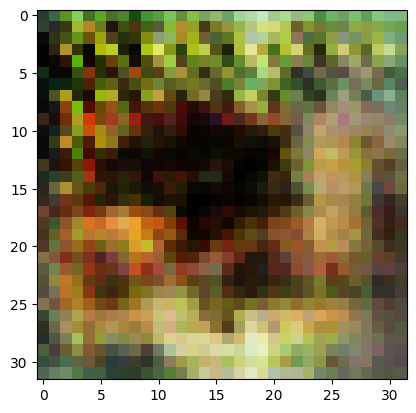

2/2 [==============================] - 0s 214ms/step
>13, 26/39, d1=0.750, d2=0.595 g=0.937


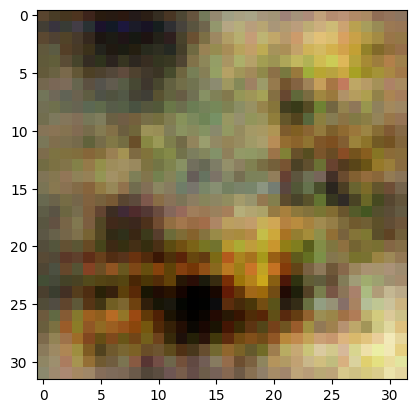

2/2 [==============================] - 0s 213ms/step
>13, 27/39, d1=0.692, d2=0.577 g=0.984


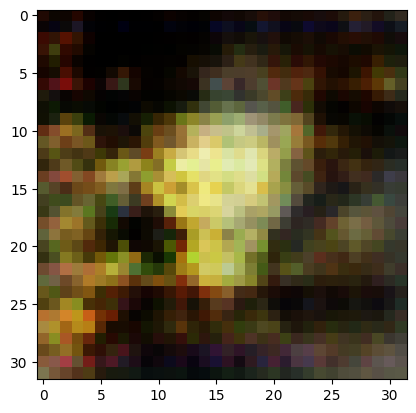

2/2 [==============================] - 1s 281ms/step
>13, 28/39, d1=0.719, d2=0.569 g=1.010


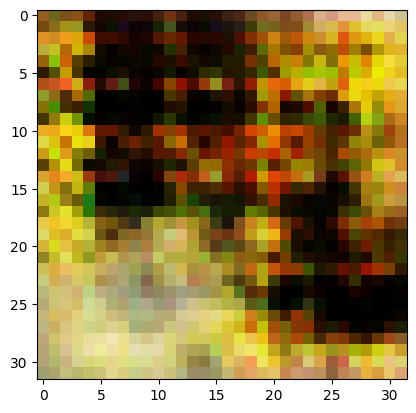

2/2 [==============================] - 0s 216ms/step
>13, 29/39, d1=0.644, d2=0.535 g=1.044


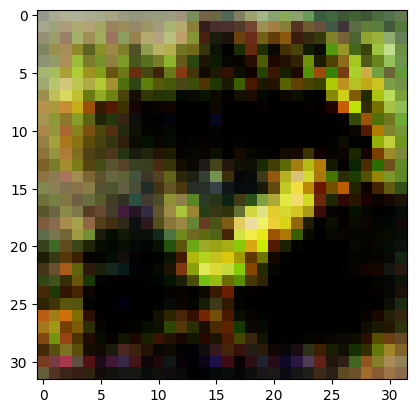

2/2 [==============================] - 0s 223ms/step
>13, 30/39, d1=0.659, d2=0.542 g=1.086


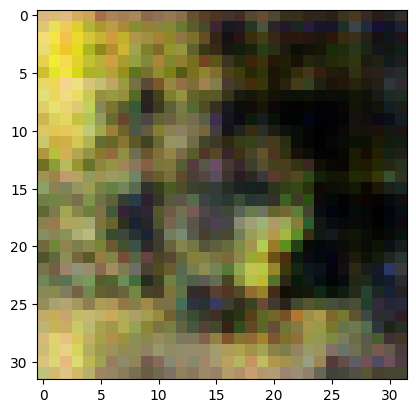

2/2 [==============================] - 0s 215ms/step
>13, 31/39, d1=0.583, d2=0.548 g=1.056


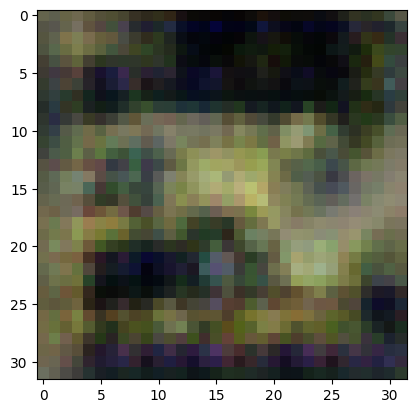

2/2 [==============================] - 0s 224ms/step
>13, 32/39, d1=0.571, d2=0.607 g=1.067


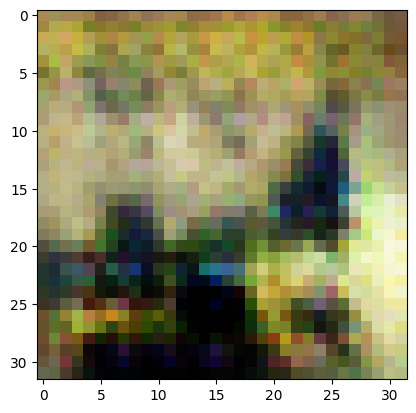

2/2 [==============================] - 0s 218ms/step
>13, 33/39, d1=0.577, d2=0.655 g=1.054


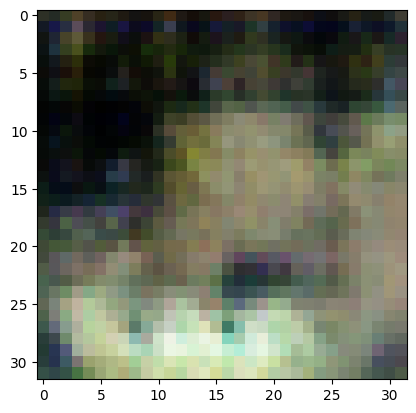

2/2 [==============================] - 0s 217ms/step
>13, 34/39, d1=0.672, d2=0.621 g=1.043


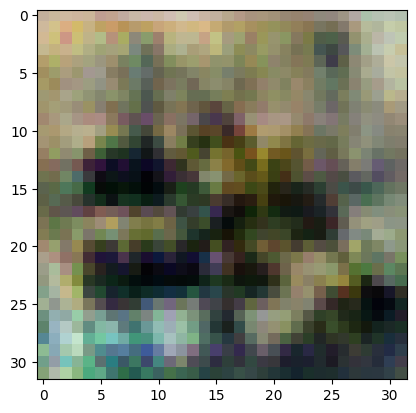

2/2 [==============================] - 0s 222ms/step
>13, 35/39, d1=0.671, d2=0.879 g=1.255


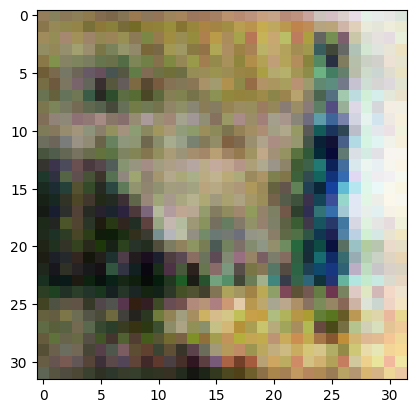

2/2 [==============================] - 1s 345ms/step
>13, 36/39, d1=0.745, d2=0.577 g=1.186


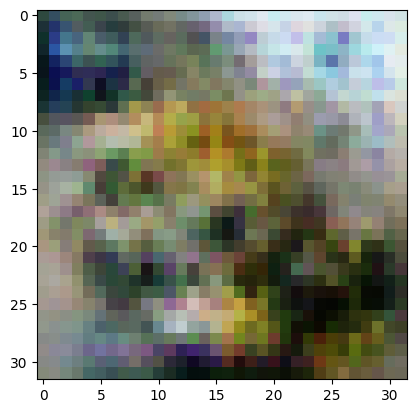

2/2 [==============================] - 0s 230ms/step
>13, 37/39, d1=0.814, d2=0.690 g=1.059


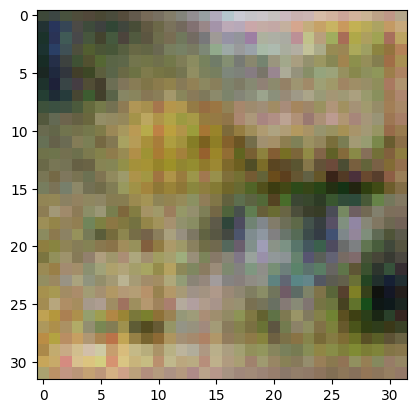

2/2 [==============================] - 0s 229ms/step
>13, 38/39, d1=0.622, d2=0.796 g=0.952


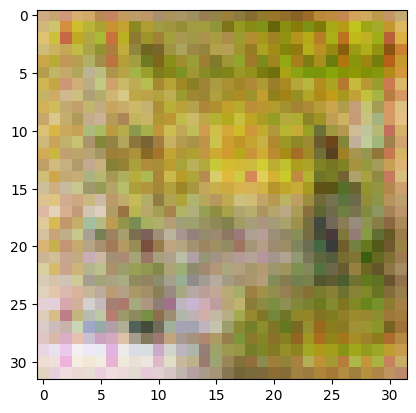

2/2 [==============================] - 1s 278ms/step
>13, 39/39, d1=0.667, d2=0.658 g=0.928


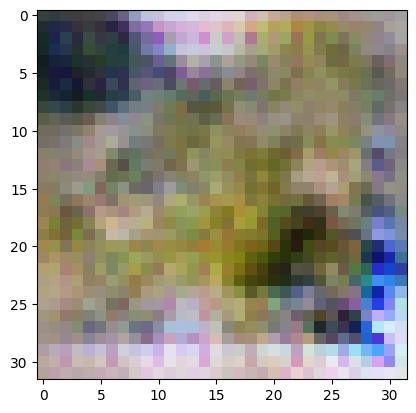

2/2 [==============================] - 0s 229ms/step
>14, 1/39, d1=0.587, d2=0.749 g=0.984


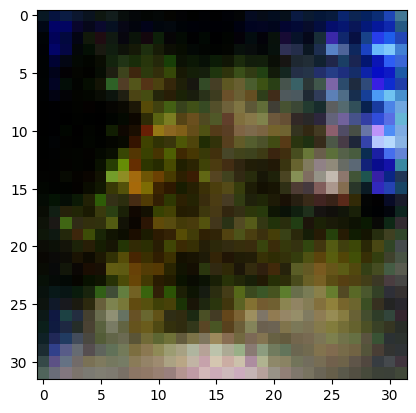

2/2 [==============================] - 0s 220ms/step
>14, 2/39, d1=0.623, d2=0.700 g=0.978


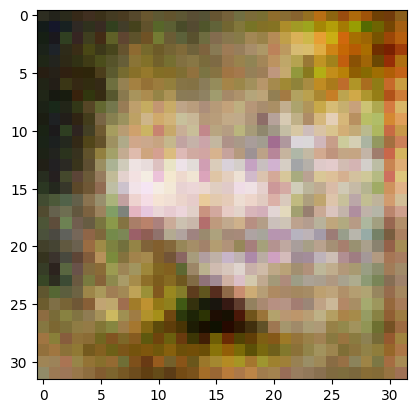

2/2 [==============================] - 0s 214ms/step
>14, 3/39, d1=0.647, d2=0.627 g=1.054


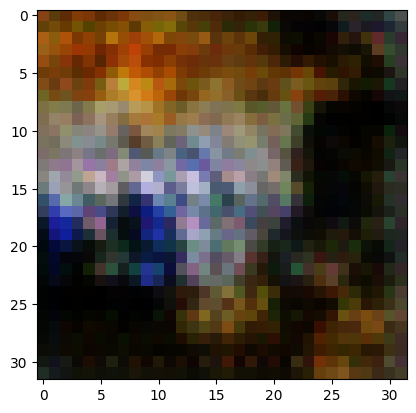

2/2 [==============================] - 0s 213ms/step
>14, 4/39, d1=0.719, d2=0.508 g=1.120


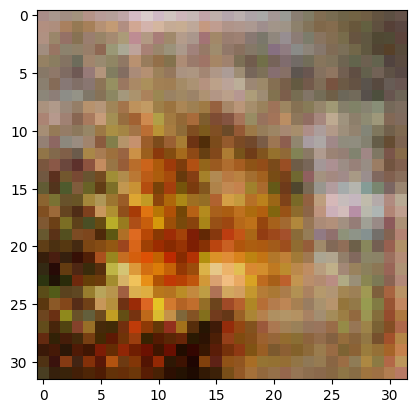

2/2 [==============================] - 0s 212ms/step
>14, 5/39, d1=0.676, d2=0.528 g=1.116


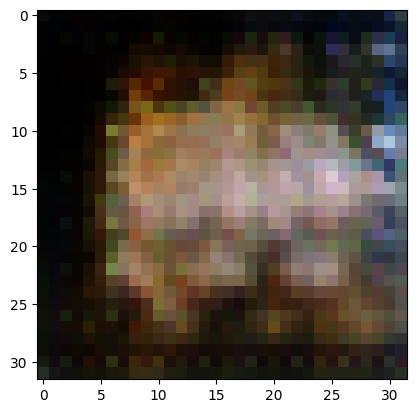

2/2 [==============================] - 0s 220ms/step
>14, 6/39, d1=0.619, d2=0.533 g=1.099


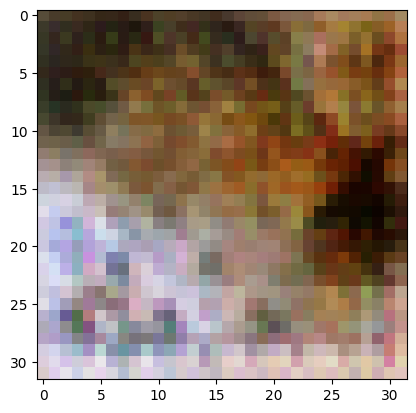

2/2 [==============================] - 0s 217ms/step
>14, 7/39, d1=0.556, d2=0.630 g=1.127


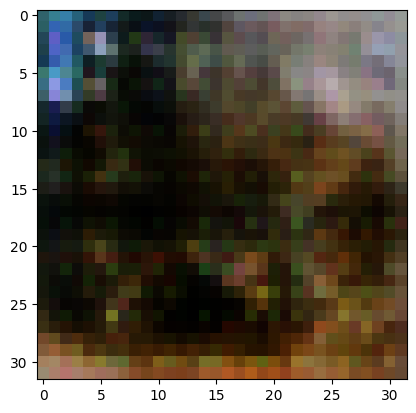

2/2 [==============================] - 0s 214ms/step
>14, 8/39, d1=0.619, d2=0.519 g=1.145


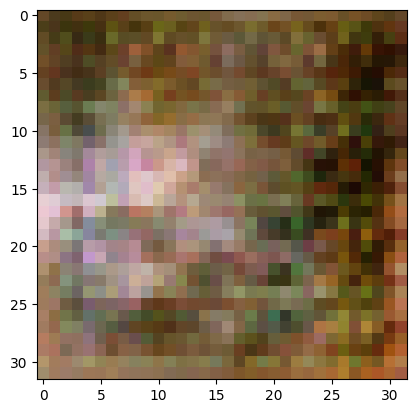

2/2 [==============================] - 0s 230ms/step
>14, 9/39, d1=0.594, d2=0.523 g=1.119


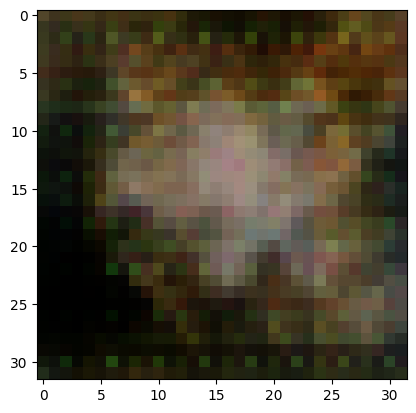

2/2 [==============================] - 0s 225ms/step
>14, 10/39, d1=0.614, d2=0.594 g=1.104


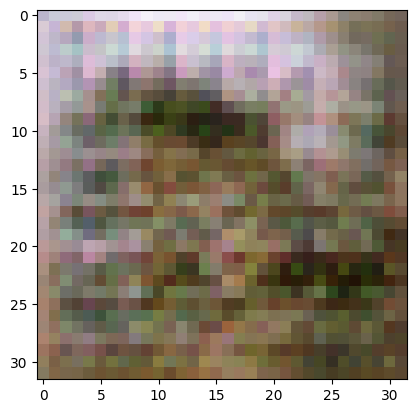

2/2 [==============================] - 1s 312ms/step
>14, 11/39, d1=0.619, d2=0.569 g=1.051


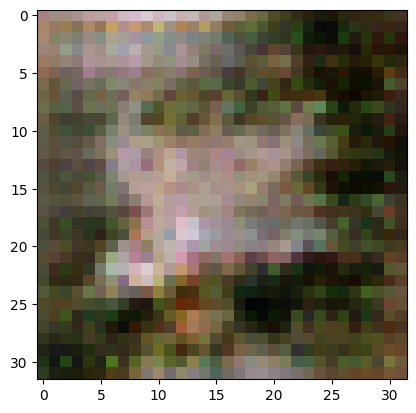

2/2 [==============================] - 0s 222ms/step
>14, 12/39, d1=0.605, d2=0.540 g=1.094


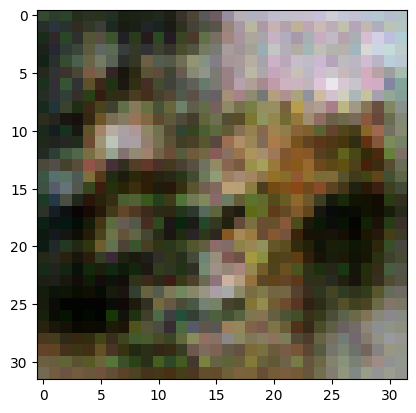

2/2 [==============================] - 0s 227ms/step
>14, 13/39, d1=0.500, d2=0.553 g=1.130


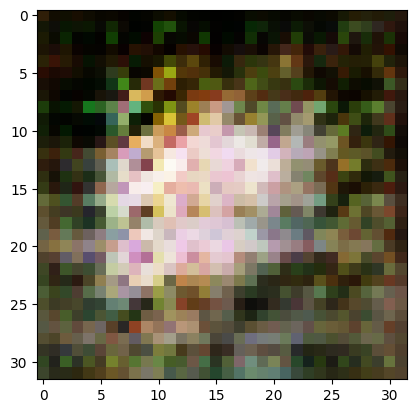

2/2 [==============================] - 1s 271ms/step
>14, 14/39, d1=0.508, d2=0.553 g=1.227


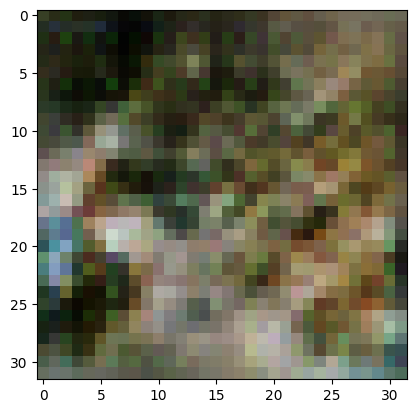

2/2 [==============================] - 0s 217ms/step
>14, 15/39, d1=0.501, d2=0.554 g=1.093


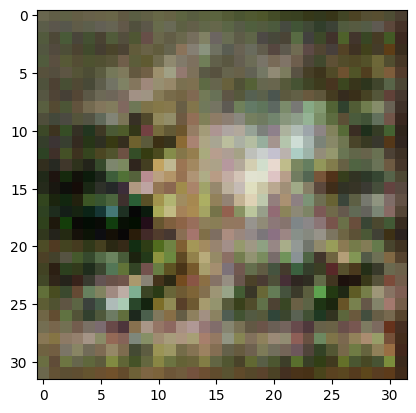

2/2 [==============================] - 0s 215ms/step
>14, 16/39, d1=0.498, d2=0.680 g=1.122


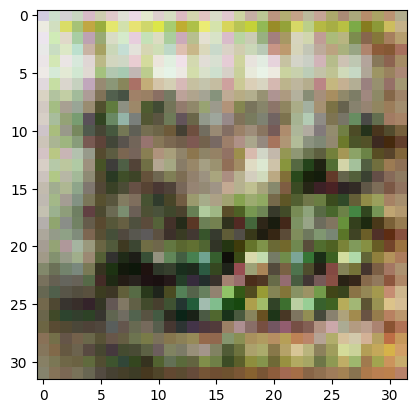

2/2 [==============================] - 1s 281ms/step
>14, 17/39, d1=0.419, d2=0.769 g=1.289


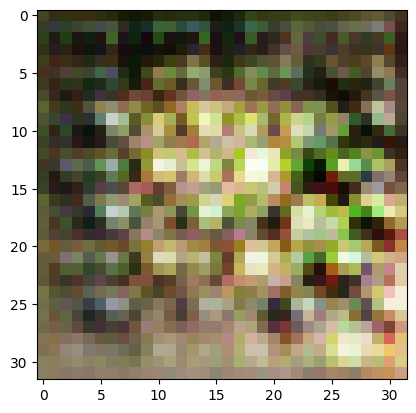

2/2 [==============================] - 0s 215ms/step
>14, 18/39, d1=0.474, d2=0.609 g=1.568


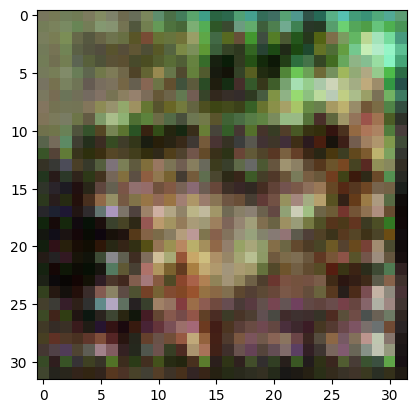

2/2 [==============================] - 0s 219ms/step
>14, 19/39, d1=0.668, d2=0.850 g=1.667


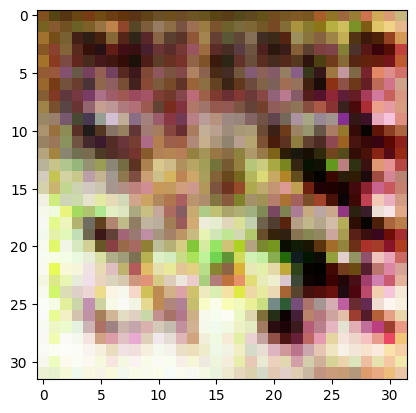

2/2 [==============================] - 1s 295ms/step
>14, 20/39, d1=0.759, d2=0.479 g=1.454


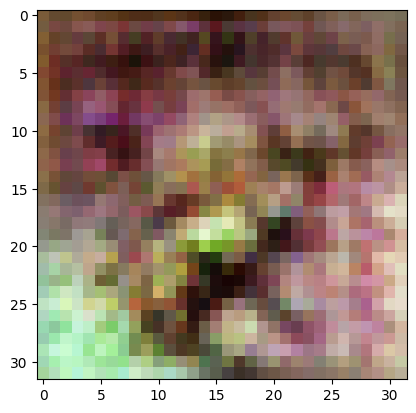

2/2 [==============================] - 0s 215ms/step
>14, 21/39, d1=0.702, d2=0.714 g=1.238


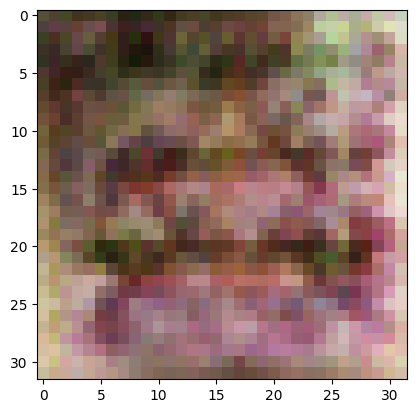

2/2 [==============================] - 0s 220ms/step
>14, 22/39, d1=0.606, d2=1.280 g=1.300


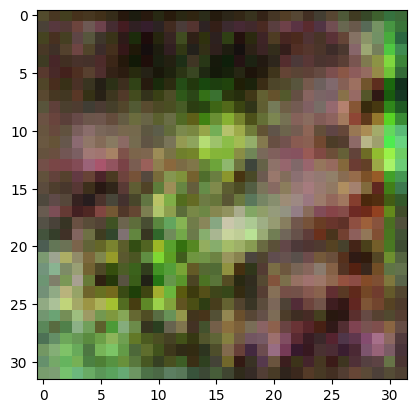

2/2 [==============================] - 1s 332ms/step
>14, 23/39, d1=0.811, d2=0.680 g=0.996


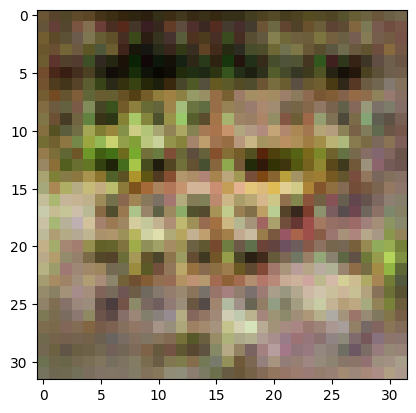

2/2 [==============================] - 0s 236ms/step
>14, 24/39, d1=0.804, d2=0.600 g=1.025


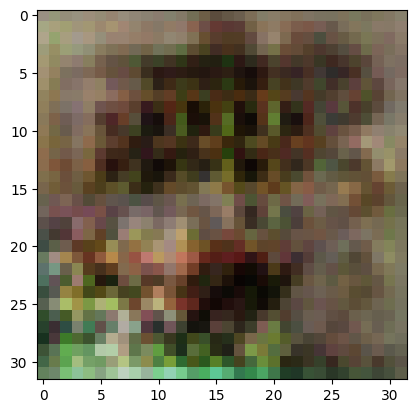

2/2 [==============================] - 0s 243ms/step
>14, 25/39, d1=0.740, d2=0.615 g=1.107


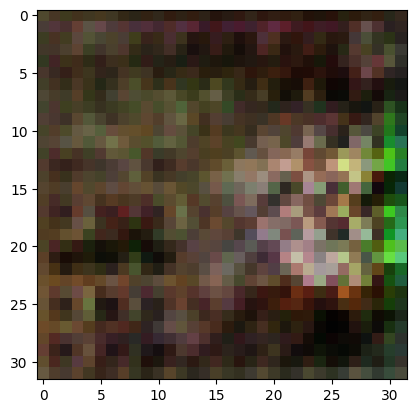

2/2 [==============================] - 0s 237ms/step
>14, 26/39, d1=0.686, d2=0.572 g=1.052


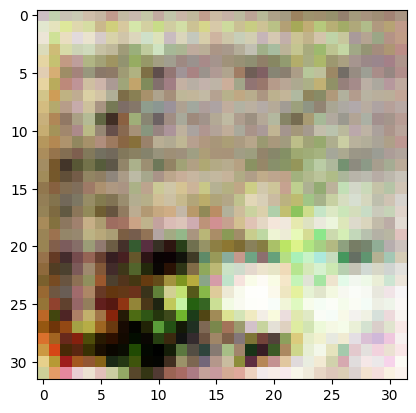

2/2 [==============================] - 0s 239ms/step
>14, 27/39, d1=0.672, d2=0.580 g=1.007


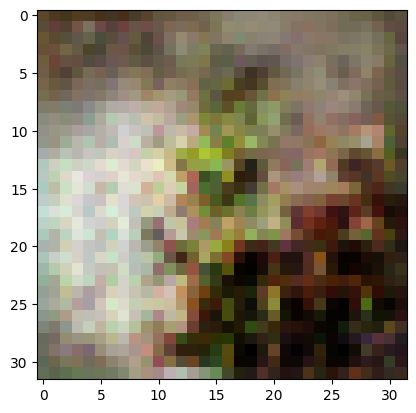

2/2 [==============================] - 0s 241ms/step
>14, 28/39, d1=0.609, d2=0.704 g=0.943


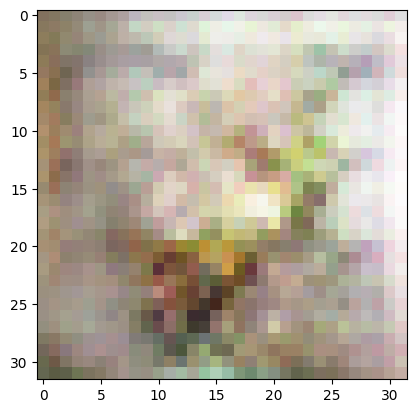

2/2 [==============================] - 0s 225ms/step
>14, 29/39, d1=0.561, d2=0.670 g=0.916


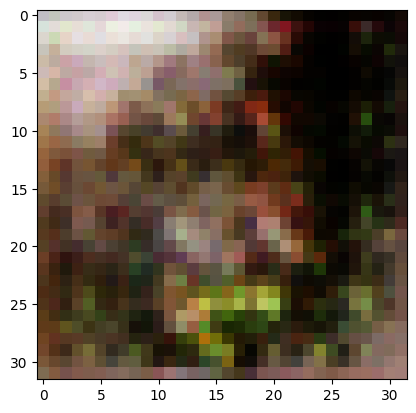

2/2 [==============================] - 0s 225ms/step
>14, 30/39, d1=0.534, d2=0.658 g=0.904


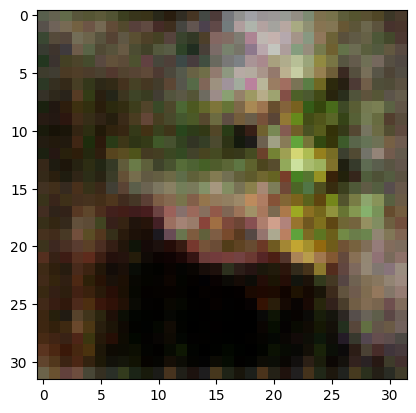

2/2 [==============================] - 0s 227ms/step
>14, 31/39, d1=0.586, d2=0.682 g=0.942


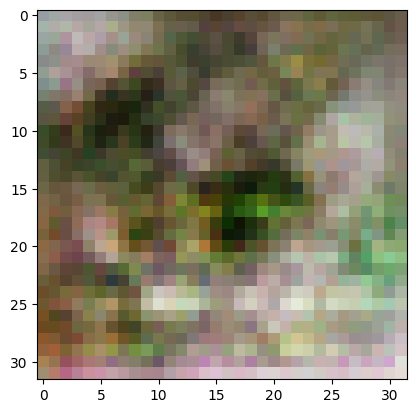

2/2 [==============================] - 0s 227ms/step
>14, 32/39, d1=0.604, d2=0.605 g=1.060


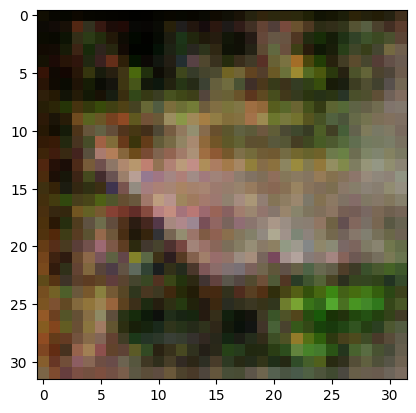

2/2 [==============================] - 0s 225ms/step
>14, 33/39, d1=0.600, d2=0.559 g=1.140


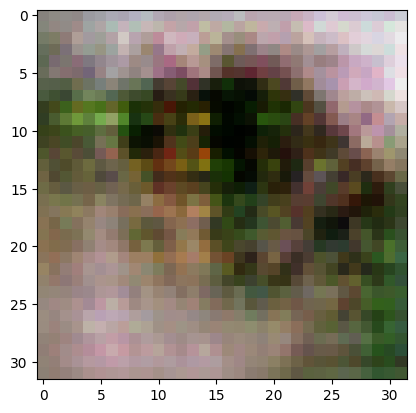

2/2 [==============================] - 1s 313ms/step
>14, 34/39, d1=0.734, d2=0.522 g=1.131


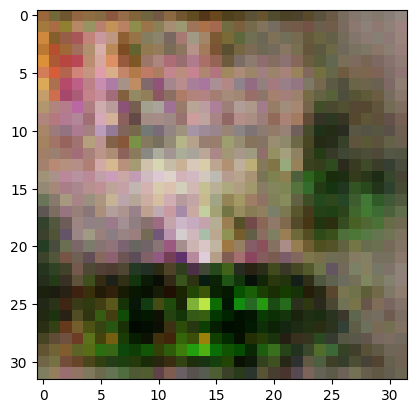

2/2 [==============================] - 0s 225ms/step
>14, 35/39, d1=0.590, d2=0.547 g=1.124


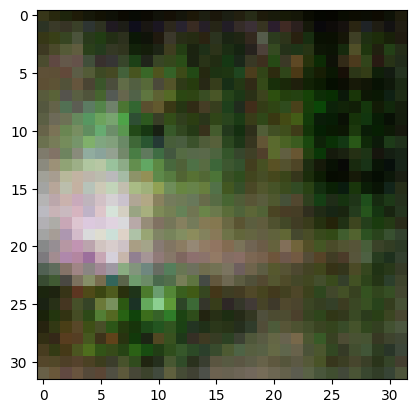

2/2 [==============================] - 0s 244ms/step
>14, 36/39, d1=0.529, d2=0.709 g=1.163


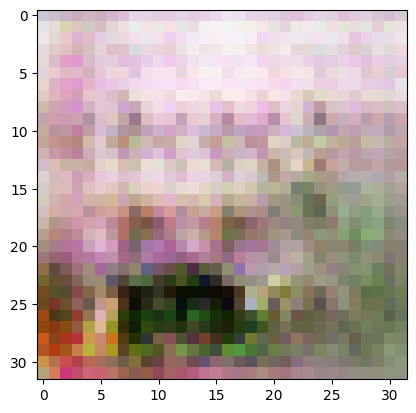

2/2 [==============================] - 1s 328ms/step
>14, 37/39, d1=0.617, d2=0.562 g=1.197


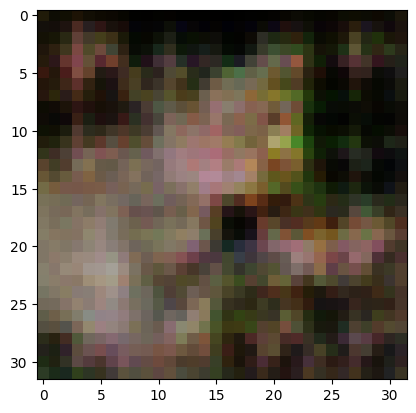

2/2 [==============================] - 0s 260ms/step
>14, 38/39, d1=0.546, d2=0.499 g=1.139


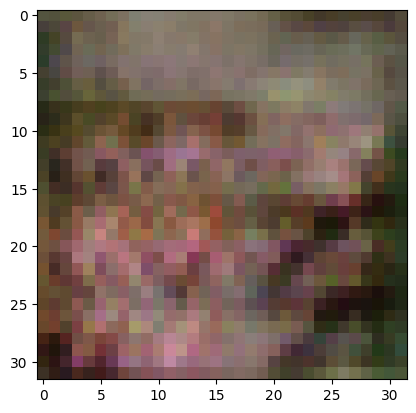

2/2 [==============================] - 0s 227ms/step
>14, 39/39, d1=0.611, d2=0.531 g=1.082


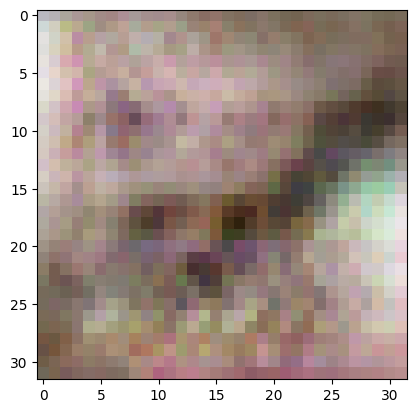

2/2 [==============================] - 1s 334ms/step
>15, 1/39, d1=0.551, d2=0.668 g=1.064


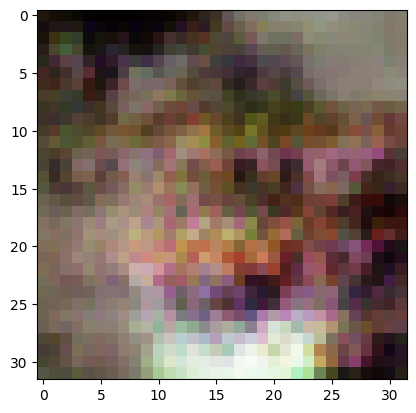

2/2 [==============================] - 0s 234ms/step
>15, 2/39, d1=0.562, d2=0.791 g=1.100


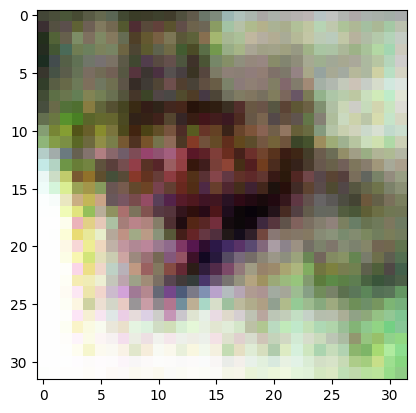

2/2 [==============================] - 0s 242ms/step
>15, 3/39, d1=0.617, d2=0.808 g=1.263


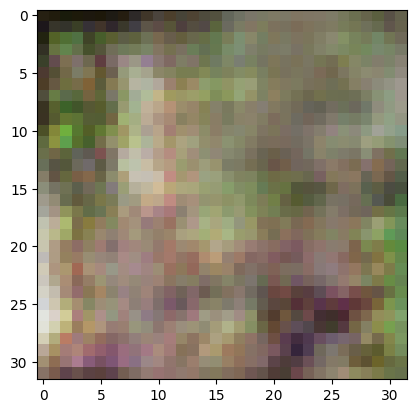

2/2 [==============================] - 1s 292ms/step
>15, 4/39, d1=0.593, d2=0.554 g=1.368


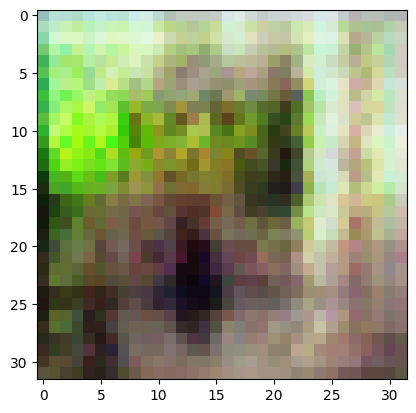

2/2 [==============================] - 0s 246ms/step
>15, 5/39, d1=0.646, d2=0.567 g=1.366


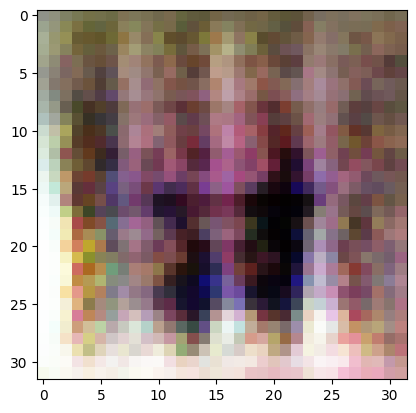

2/2 [==============================] - 0s 229ms/step
>15, 6/39, d1=0.663, d2=0.498 g=1.384


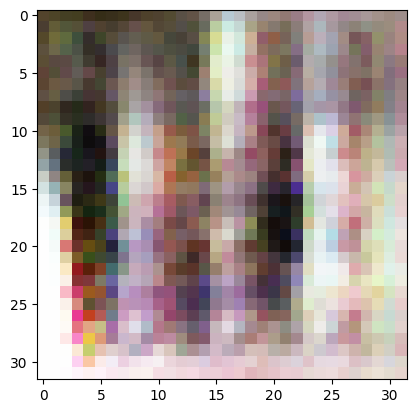

2/2 [==============================] - 1s 253ms/step
>15, 7/39, d1=0.596, d2=0.484 g=1.400


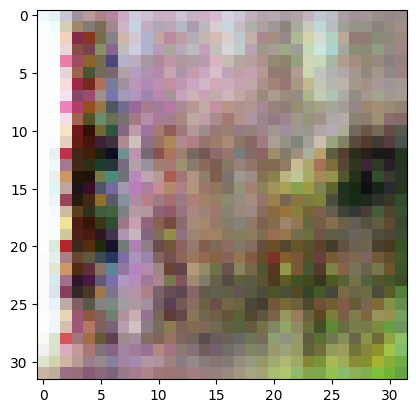

2/2 [==============================] - 0s 247ms/step
>15, 8/39, d1=0.468, d2=0.605 g=1.330


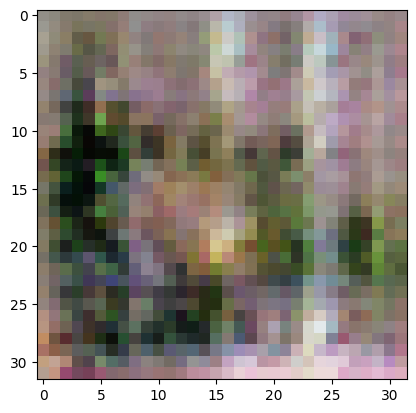

2/2 [==============================] - 0s 249ms/step
>15, 9/39, d1=0.391, d2=0.982 g=1.568


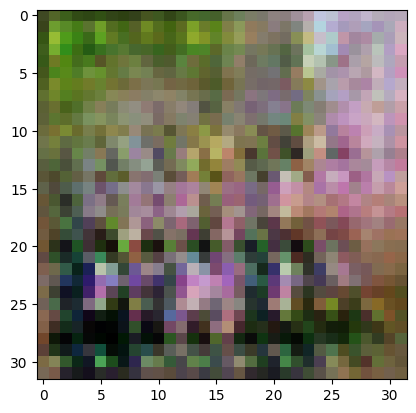

2/2 [==============================] - 0s 259ms/step
>15, 10/39, d1=0.577, d2=0.614 g=1.523


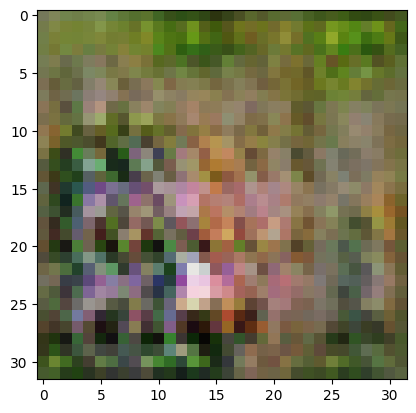

2/2 [==============================] - 0s 248ms/step
>15, 11/39, d1=0.688, d2=1.312 g=1.438


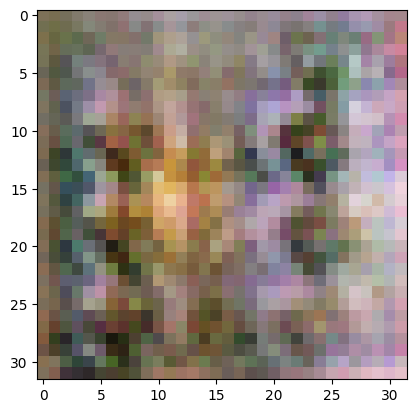

2/2 [==============================] - 1s 295ms/step
>15, 12/39, d1=0.755, d2=0.501 g=1.358


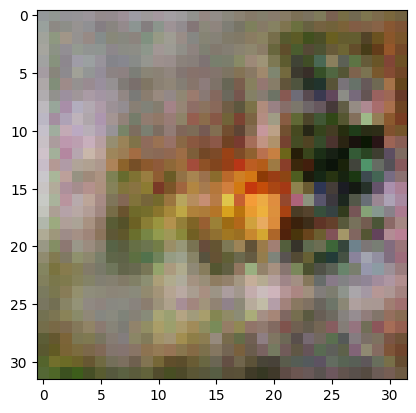

2/2 [==============================] - 0s 236ms/step
>15, 13/39, d1=0.806, d2=0.897 g=1.345


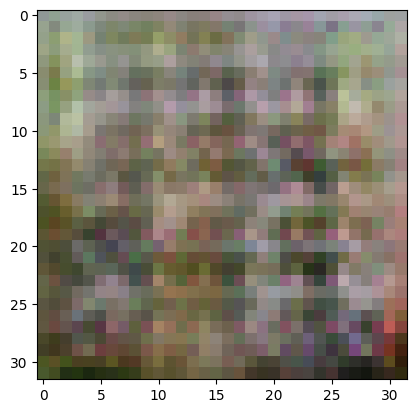

2/2 [==============================] - 0s 228ms/step
>15, 14/39, d1=0.809, d2=0.437 g=1.353


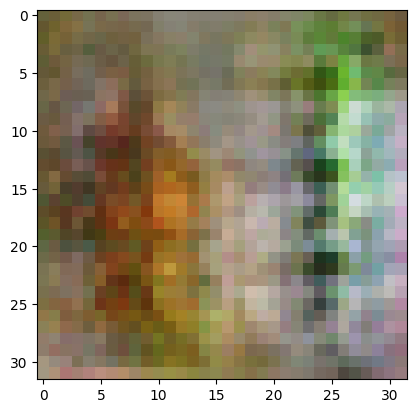

2/2 [==============================] - 1s 336ms/step
>15, 15/39, d1=0.651, d2=0.548 g=1.263


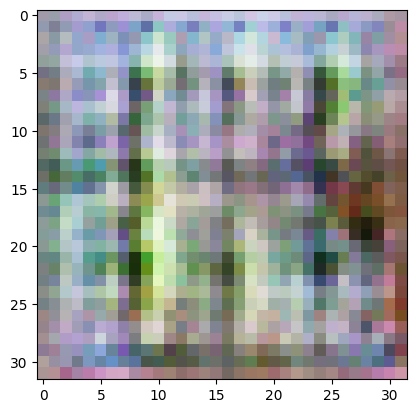

2/2 [==============================] - 0s 228ms/step
>15, 16/39, d1=0.622, d2=0.698 g=1.214


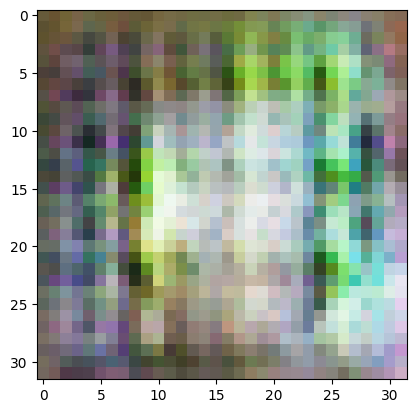

2/2 [==============================] - 0s 243ms/step
>15, 17/39, d1=0.568, d2=0.687 g=1.412


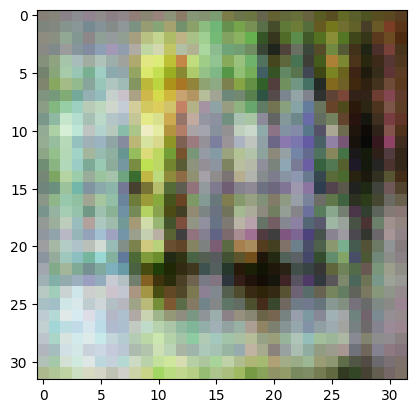

2/2 [==============================] - 1s 293ms/step
>15, 18/39, d1=0.586, d2=0.568 g=1.417


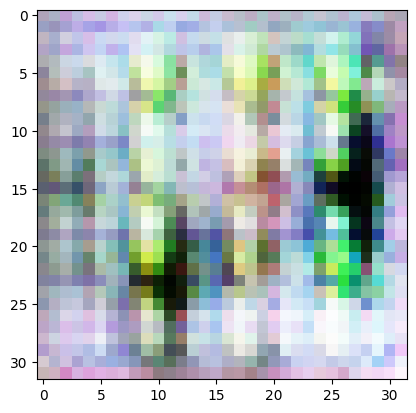

2/2 [==============================] - 0s 233ms/step
>15, 19/39, d1=0.627, d2=0.827 g=1.408


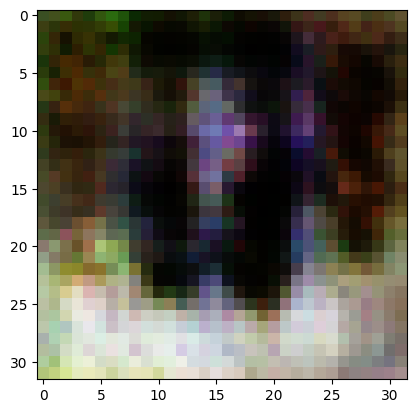

2/2 [==============================] - 0s 225ms/step
>15, 20/39, d1=0.828, d2=0.515 g=1.276


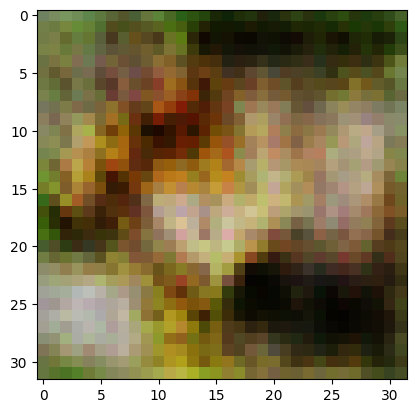

2/2 [==============================] - 1s 343ms/step
>15, 21/39, d1=0.723, d2=0.584 g=1.242


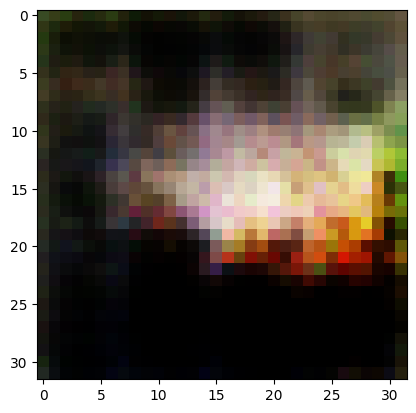

2/2 [==============================] - 0s 237ms/step
>15, 22/39, d1=0.615, d2=0.567 g=1.225


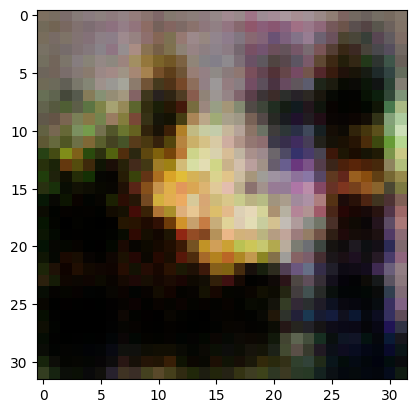

2/2 [==============================] - 0s 229ms/step
>15, 23/39, d1=0.667, d2=0.636 g=1.117


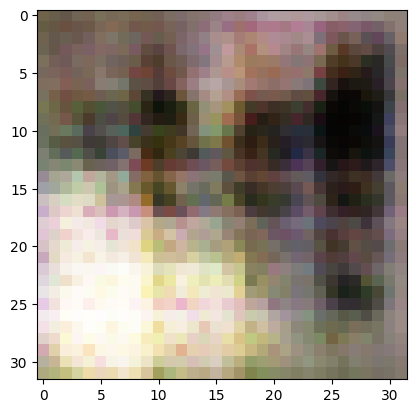

2/2 [==============================] - 0s 227ms/step
>15, 24/39, d1=0.546, d2=0.832 g=1.255


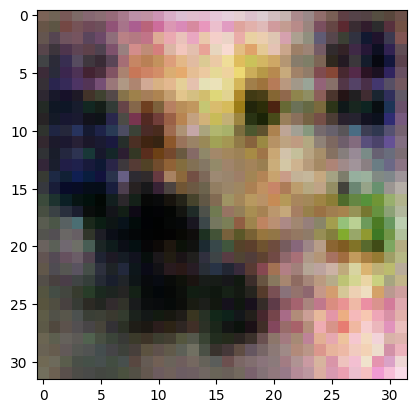

2/2 [==============================] - 0s 227ms/step
>15, 25/39, d1=0.651, d2=0.507 g=1.360


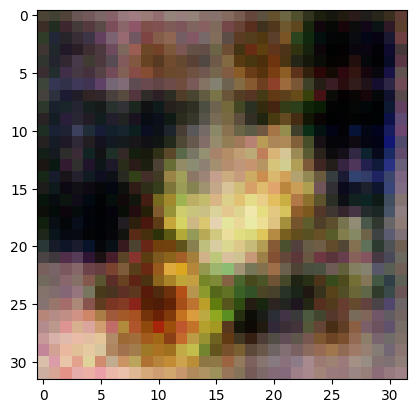

2/2 [==============================] - 0s 242ms/step
>15, 26/39, d1=0.691, d2=0.543 g=1.346


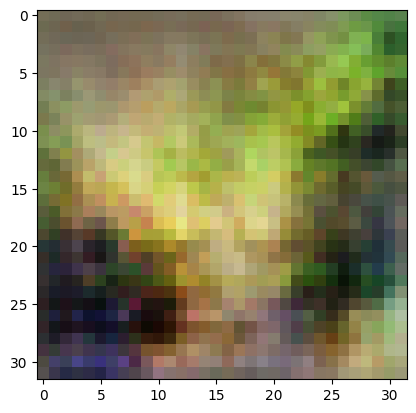

2/2 [==============================] - 0s 226ms/step
>15, 27/39, d1=0.671, d2=0.657 g=1.284


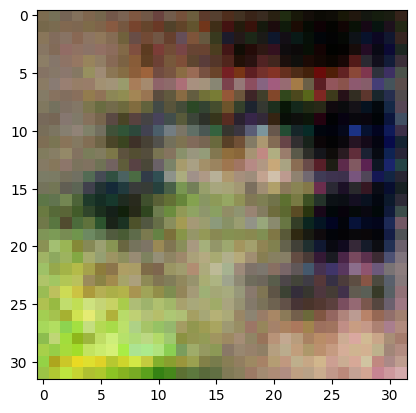

2/2 [==============================] - 0s 247ms/step
>15, 28/39, d1=0.630, d2=0.549 g=1.165


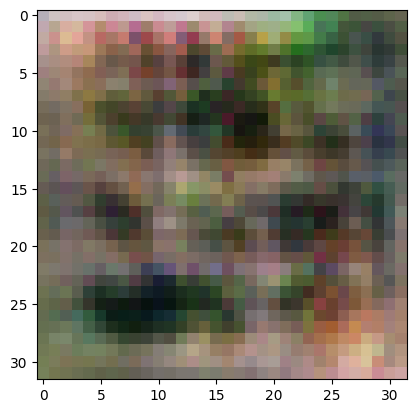

2/2 [==============================] - 1s 282ms/step
>15, 29/39, d1=0.679, d2=0.681 g=1.083


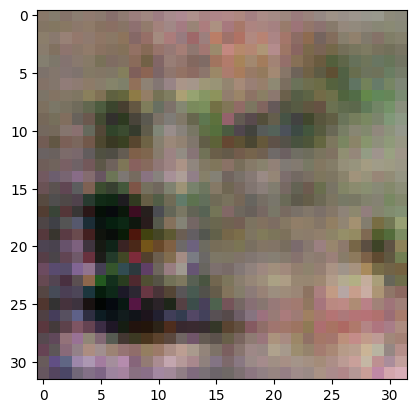

2/2 [==============================] - 0s 224ms/step
>15, 30/39, d1=0.598, d2=0.691 g=1.172


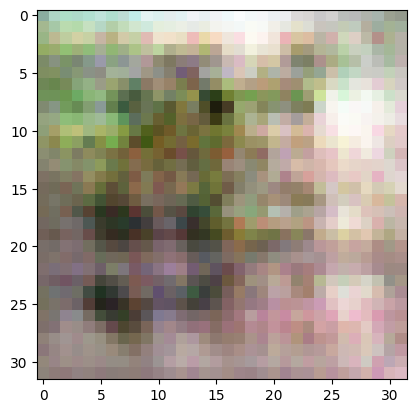

2/2 [==============================] - 0s 238ms/step
>15, 31/39, d1=0.532, d2=0.654 g=1.204


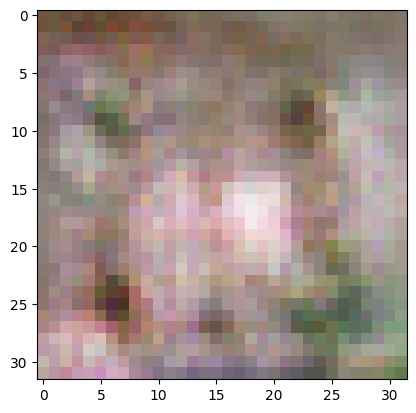

2/2 [==============================] - 1s 267ms/step
>15, 32/39, d1=0.463, d2=0.903 g=1.160


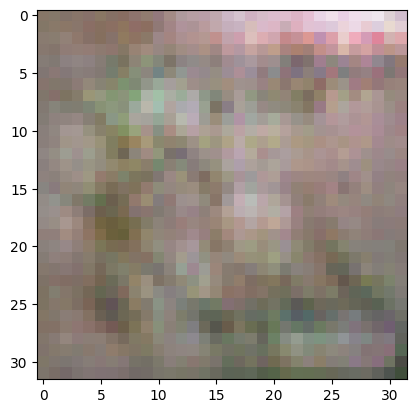

2/2 [==============================] - 0s 249ms/step
>15, 33/39, d1=0.450, d2=0.840 g=1.361


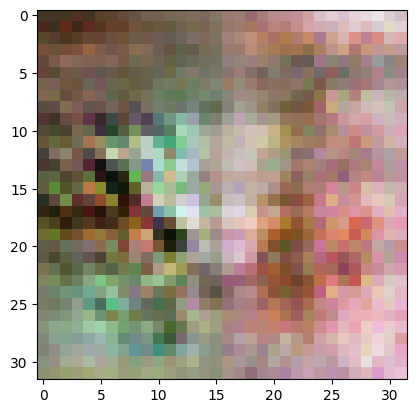

2/2 [==============================] - 0s 244ms/step
>15, 34/39, d1=0.740, d2=0.699 g=1.404


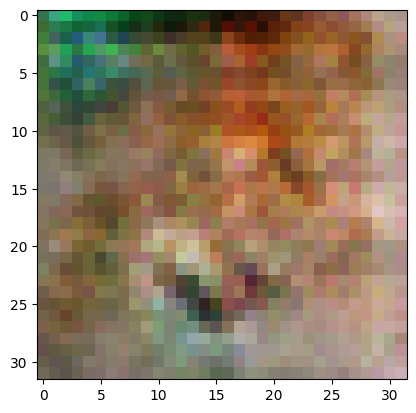

2/2 [==============================] - 1s 303ms/step
>15, 35/39, d1=0.743, d2=0.730 g=1.199


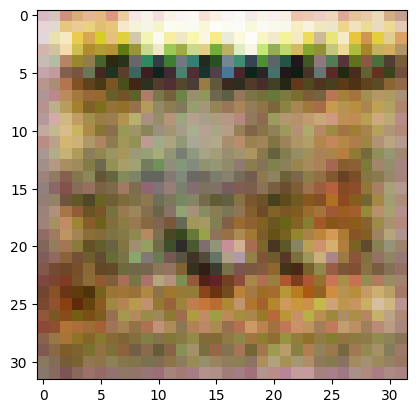

2/2 [==============================] - 0s 233ms/step
>15, 36/39, d1=0.636, d2=0.641 g=1.301


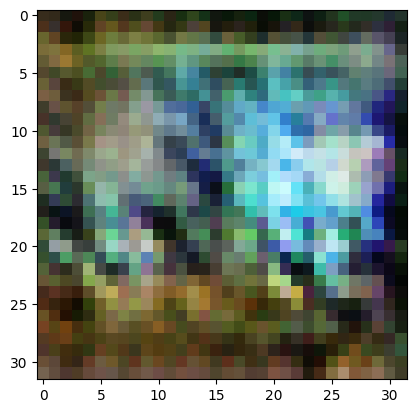

2/2 [==============================] - 0s 237ms/step
>15, 37/39, d1=0.647, d2=0.658 g=1.349


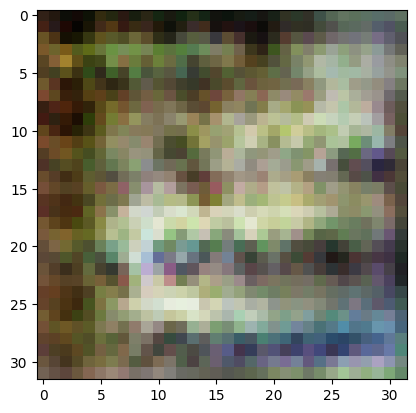

2/2 [==============================] - 1s 284ms/step
>15, 38/39, d1=0.613, d2=0.673 g=1.437


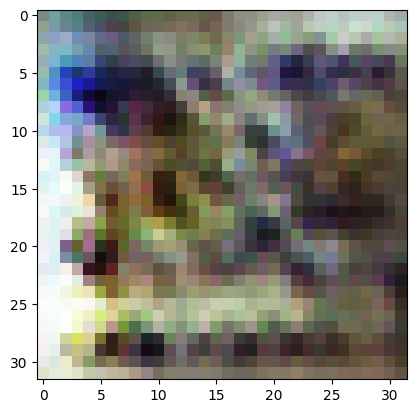

2/2 [==============================] - 0s 229ms/step
>15, 39/39, d1=0.592, d2=0.531 g=1.387


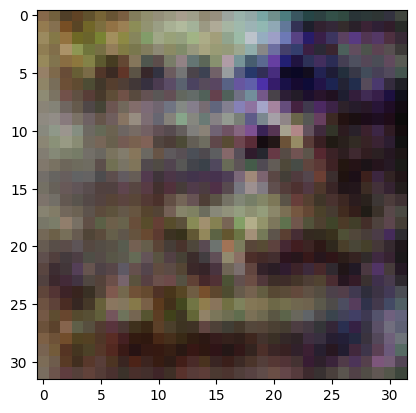

2/2 [==============================] - 0s 244ms/step
>16, 1/39, d1=0.624, d2=0.608 g=1.221


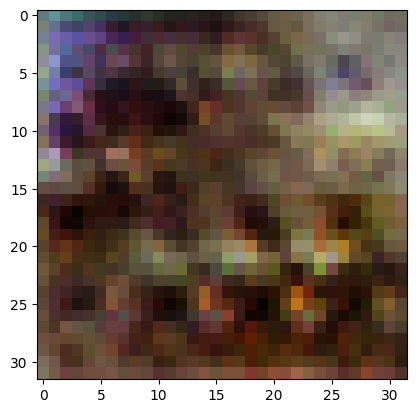

2/2 [==============================] - 1s 308ms/step
>16, 2/39, d1=0.559, d2=0.596 g=1.105


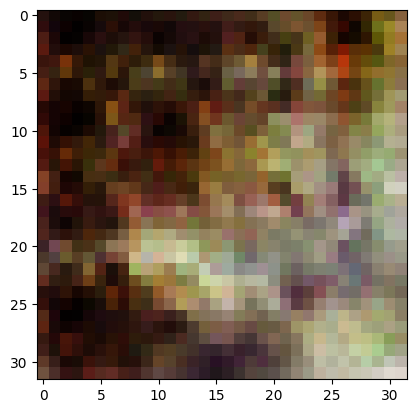

2/2 [==============================] - 0s 226ms/step
>16, 3/39, d1=0.489, d2=0.739 g=1.127


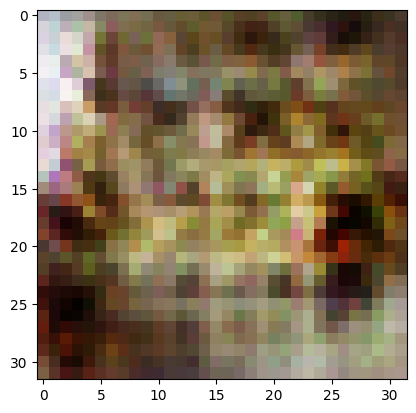

2/2 [==============================] - 0s 240ms/step
>16, 4/39, d1=0.459, d2=0.678 g=1.198


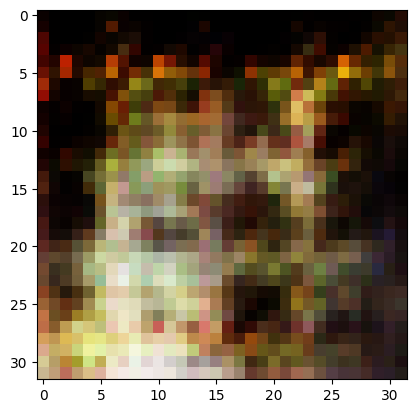

2/2 [==============================] - 0s 270ms/step
>16, 5/39, d1=0.637, d2=0.758 g=1.268


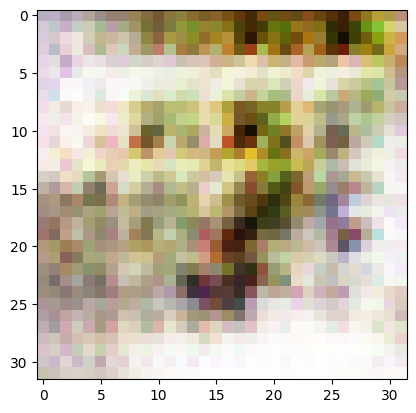

2/2 [==============================] - 0s 246ms/step
>16, 6/39, d1=0.648, d2=0.553 g=1.217


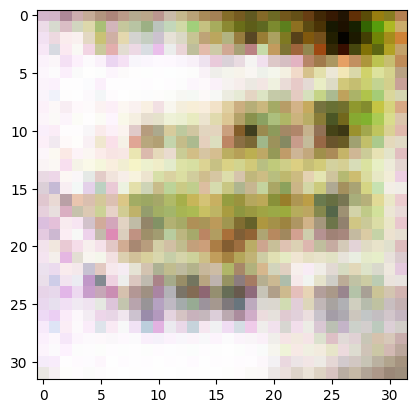

2/2 [==============================] - 1s 322ms/step
>16, 7/39, d1=0.698, d2=0.701 g=1.143


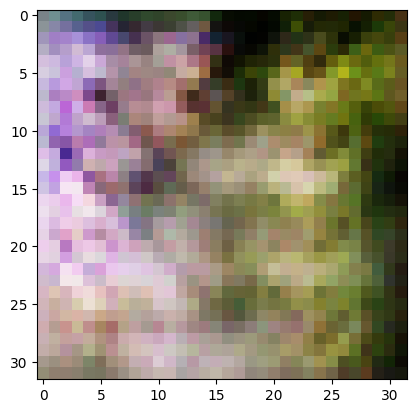

2/2 [==============================] - 0s 225ms/step
>16, 8/39, d1=0.692, d2=0.677 g=1.058


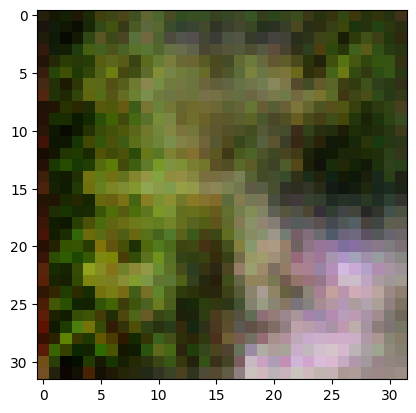

2/2 [==============================] - 0s 227ms/step
>16, 9/39, d1=0.694, d2=0.720 g=1.013


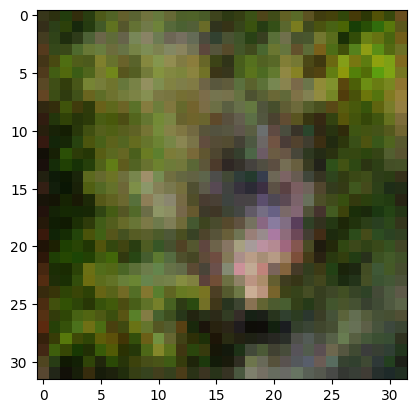

2/2 [==============================] - 0s 236ms/step
>16, 10/39, d1=0.629, d2=0.684 g=0.996


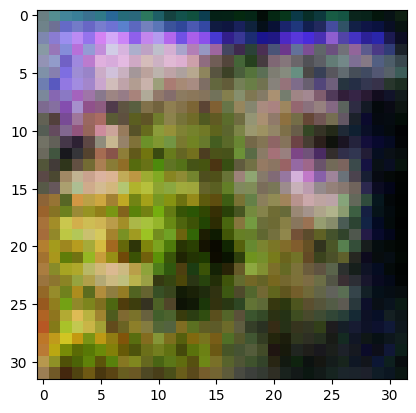

2/2 [==============================] - 0s 234ms/step
>16, 11/39, d1=0.568, d2=0.790 g=1.031


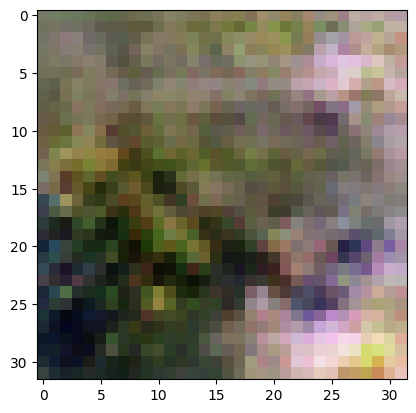

2/2 [==============================] - 0s 232ms/step
>16, 12/39, d1=0.549, d2=0.623 g=1.054


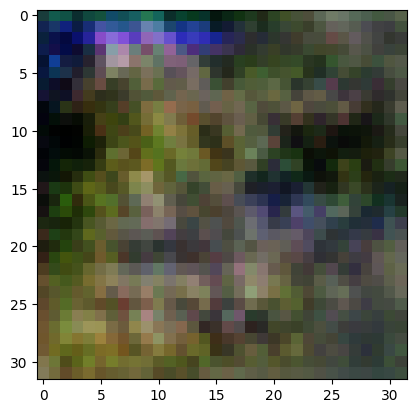

2/2 [==============================] - 1s 285ms/step
>16, 13/39, d1=0.497, d2=0.597 g=1.173


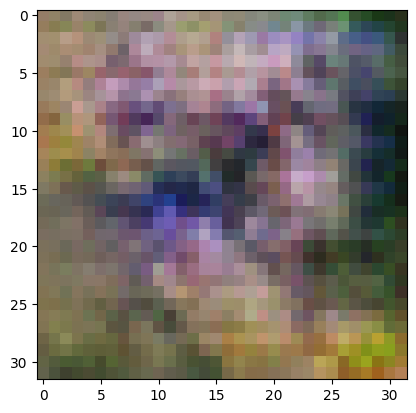

2/2 [==============================] - 0s 232ms/step
>16, 14/39, d1=0.482, d2=0.567 g=1.215


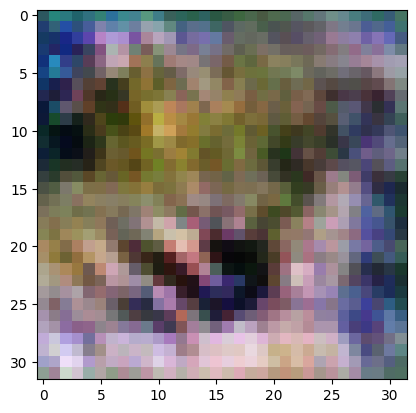

2/2 [==============================] - 0s 228ms/step
>16, 15/39, d1=0.480, d2=0.642 g=1.200


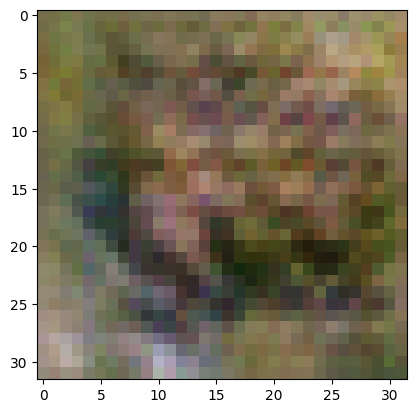

2/2 [==============================] - 1s 343ms/step
>16, 16/39, d1=0.481, d2=0.807 g=1.163


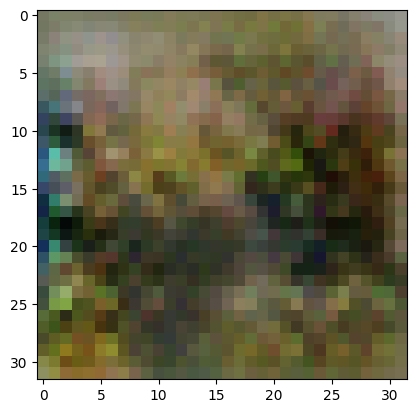

2/2 [==============================] - 0s 242ms/step
>16, 17/39, d1=0.505, d2=0.827 g=1.463


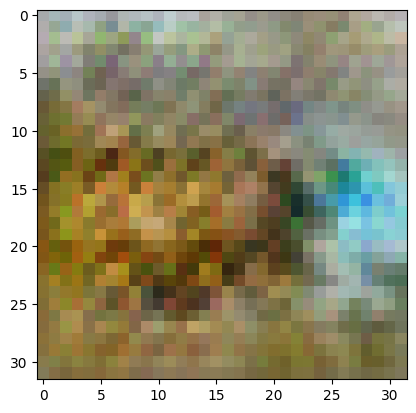

2/2 [==============================] - 0s 246ms/step
>16, 18/39, d1=0.791, d2=0.656 g=1.229


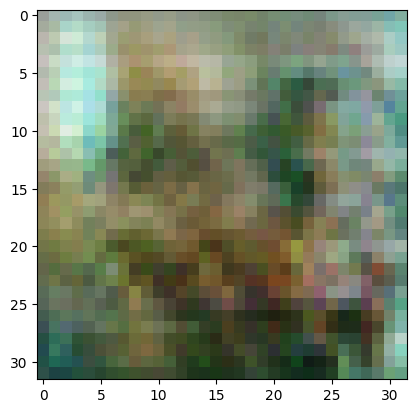

2/2 [==============================] - 1s 287ms/step
>16, 19/39, d1=0.592, d2=0.889 g=1.254


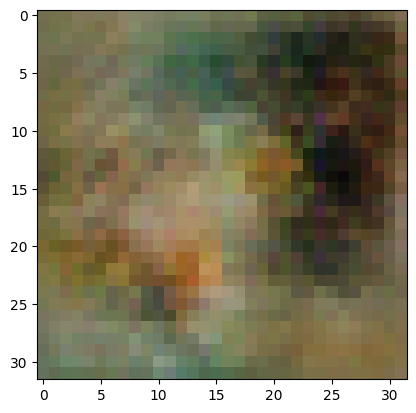

2/2 [==============================] - 0s 228ms/step
>16, 20/39, d1=0.699, d2=0.576 g=1.250


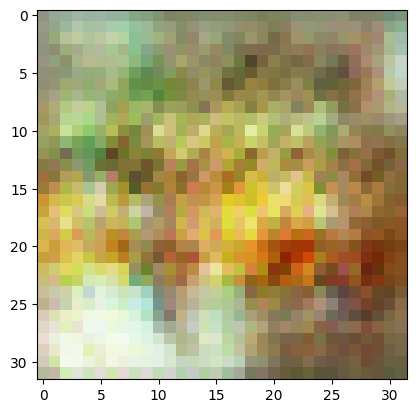

2/2 [==============================] - 0s 229ms/step
>16, 21/39, d1=0.778, d2=0.522 g=1.207


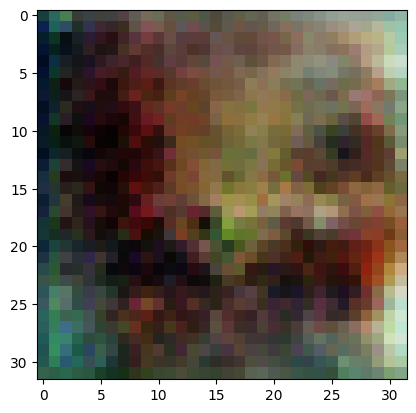

2/2 [==============================] - 1s 298ms/step
>16, 22/39, d1=0.705, d2=0.596 g=1.132


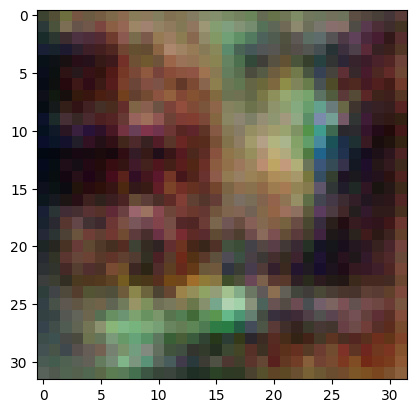

2/2 [==============================] - 0s 250ms/step
>16, 23/39, d1=0.683, d2=0.617 g=1.342


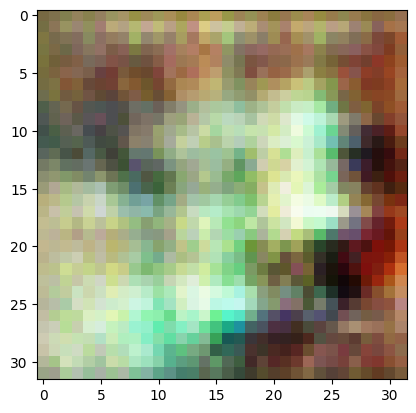

2/2 [==============================] - 0s 236ms/step
>16, 24/39, d1=0.697, d2=0.497 g=1.361


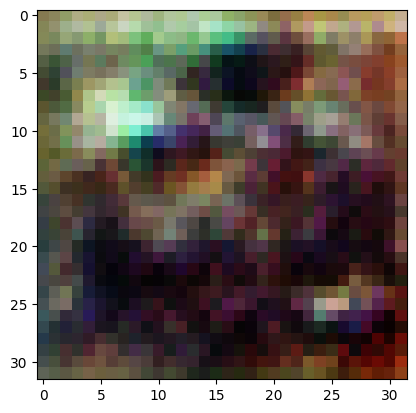

2/2 [==============================] - 1s 295ms/step
>16, 25/39, d1=0.730, d2=0.514 g=1.480


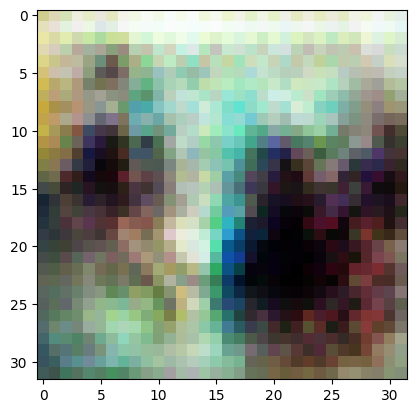

2/2 [==============================] - 0s 234ms/step
>16, 26/39, d1=0.681, d2=0.546 g=1.375


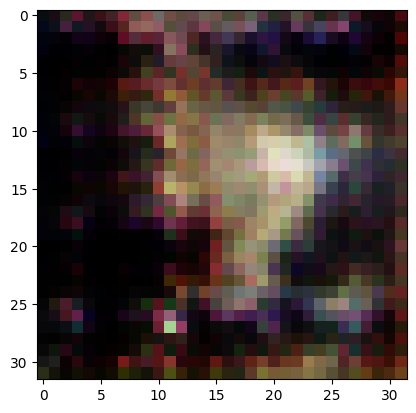

2/2 [==============================] - 0s 254ms/step
>16, 27/39, d1=0.645, d2=0.571 g=1.255


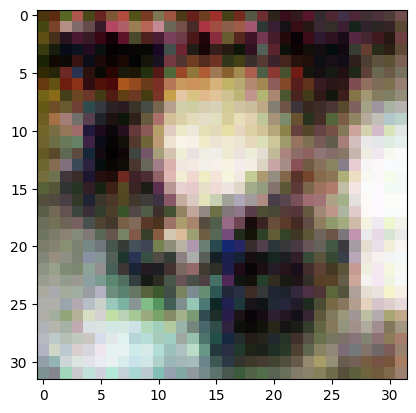

2/2 [==============================] - 1s 289ms/step
>16, 28/39, d1=0.563, d2=0.887 g=1.170


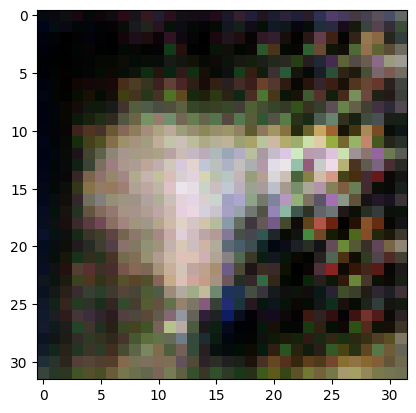

2/2 [==============================] - 0s 240ms/step
>16, 29/39, d1=0.705, d2=0.955 g=1.306


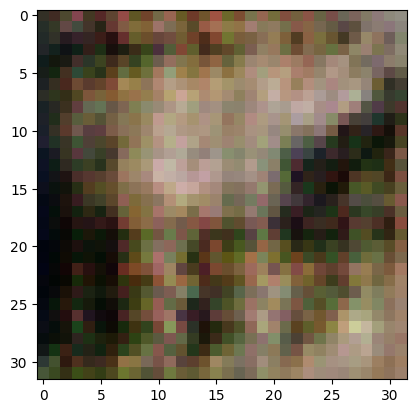

2/2 [==============================] - 0s 235ms/step
>16, 30/39, d1=0.809, d2=0.551 g=1.001


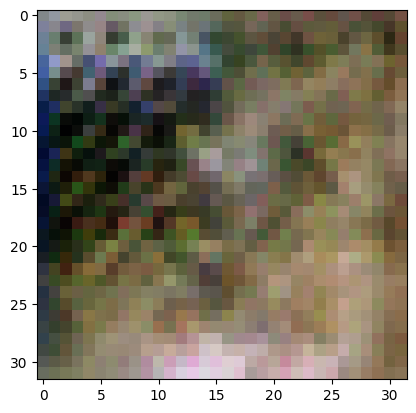

2/2 [==============================] - 1s 234ms/step
>16, 31/39, d1=0.878, d2=0.717 g=0.865


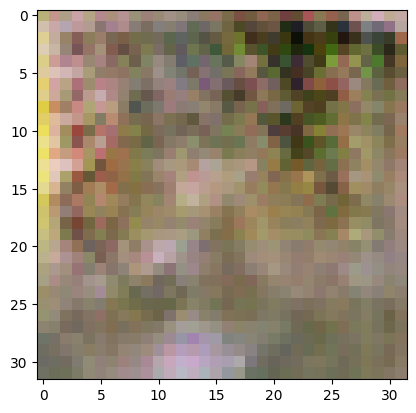

2/2 [==============================] - 0s 227ms/step
>16, 32/39, d1=0.671, d2=0.728 g=0.959


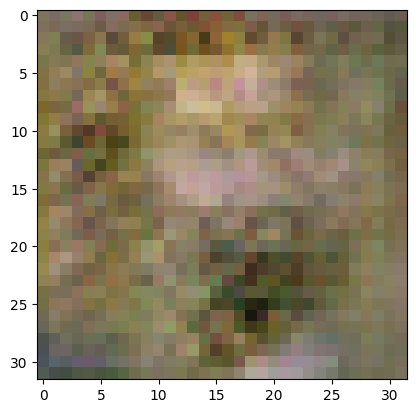

2/2 [==============================] - 0s 243ms/step
>16, 33/39, d1=0.635, d2=0.541 g=1.084


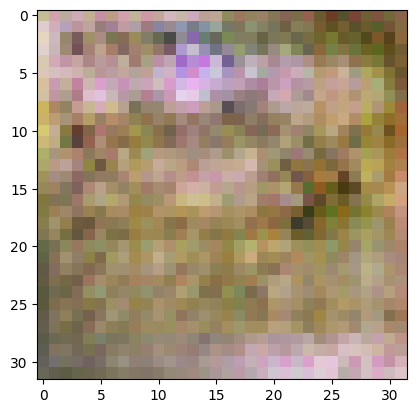

2/2 [==============================] - 0s 236ms/step
>16, 34/39, d1=0.628, d2=0.517 g=1.207


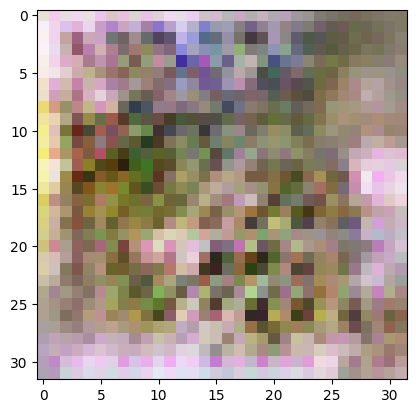

2/2 [==============================] - 0s 252ms/step
>16, 35/39, d1=0.574, d2=0.484 g=1.246


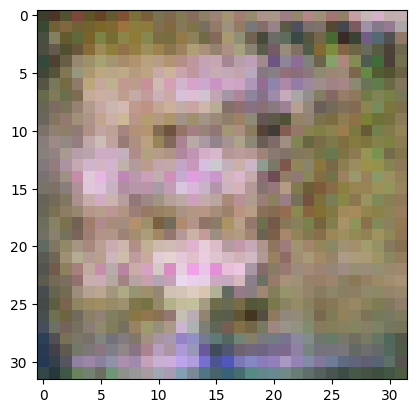

2/2 [==============================] - 0s 227ms/step
>16, 36/39, d1=0.541, d2=0.568 g=1.198


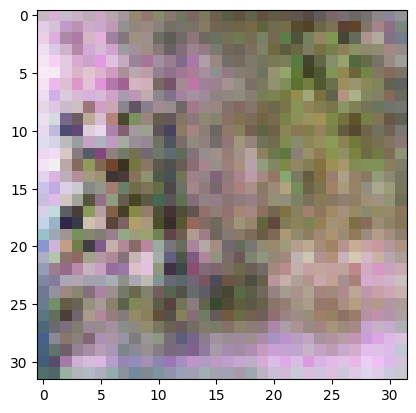

2/2 [==============================] - 0s 238ms/step
>16, 37/39, d1=0.513, d2=0.606 g=1.313


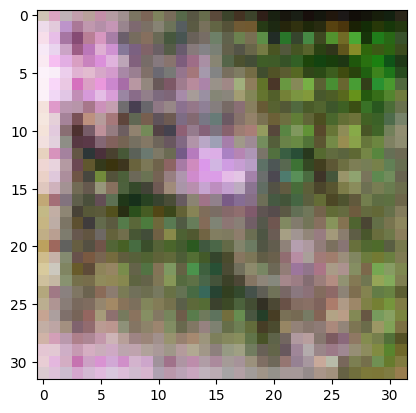

2/2 [==============================] - 0s 237ms/step
>16, 38/39, d1=0.481, d2=0.614 g=1.426


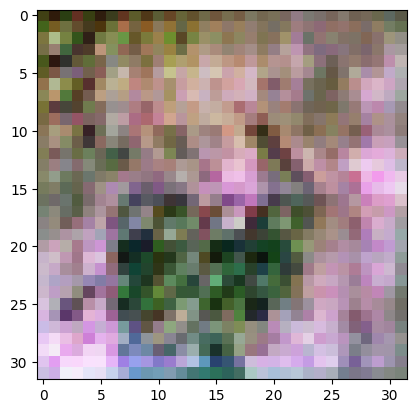

2/2 [==============================] - 1s 333ms/step
>16, 39/39, d1=0.366, d2=0.709 g=1.536


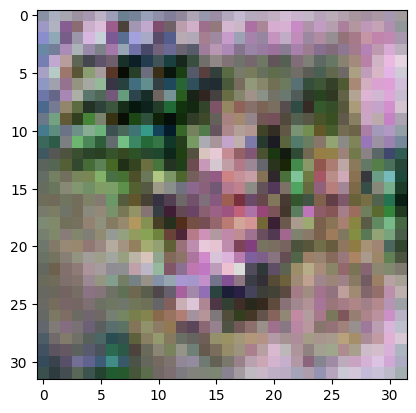

2/2 [==============================] - 0s 234ms/step
>17, 1/39, d1=0.560, d2=0.515 g=1.436


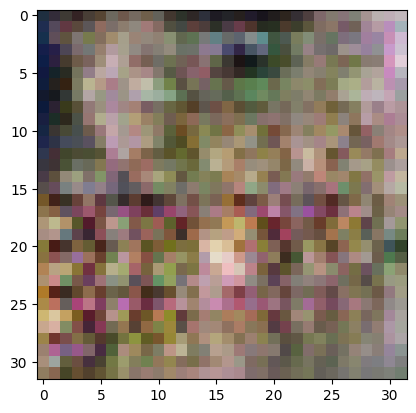

2/2 [==============================] - 0s 239ms/step
>17, 2/39, d1=0.532, d2=0.713 g=1.228


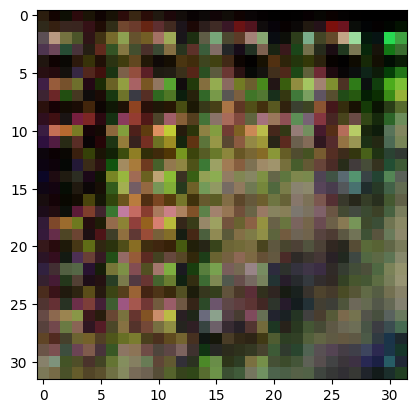

2/2 [==============================] - 1s 284ms/step
>17, 3/39, d1=0.650, d2=1.008 g=0.920


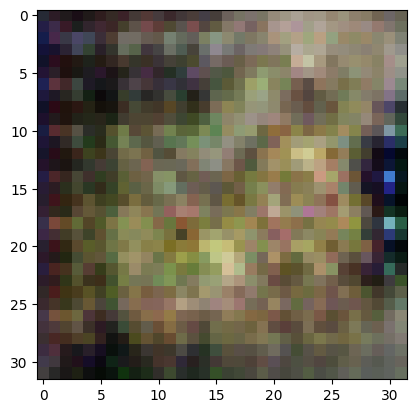

2/2 [==============================] - 0s 229ms/step
>17, 4/39, d1=0.504, d2=1.591 g=1.165


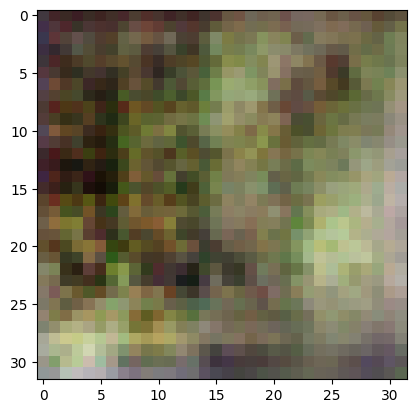

2/2 [==============================] - 0s 235ms/step
>17, 5/39, d1=0.835, d2=0.468 g=1.187


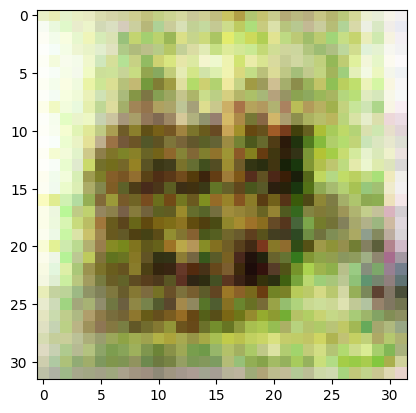

2/2 [==============================] - 0s 237ms/step
>17, 6/39, d1=0.772, d2=0.620 g=1.022


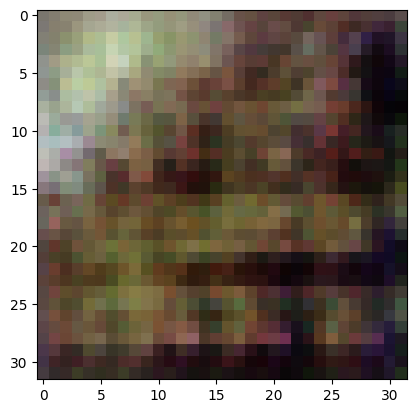

2/2 [==============================] - 0s 238ms/step
>17, 7/39, d1=0.623, d2=0.688 g=1.021


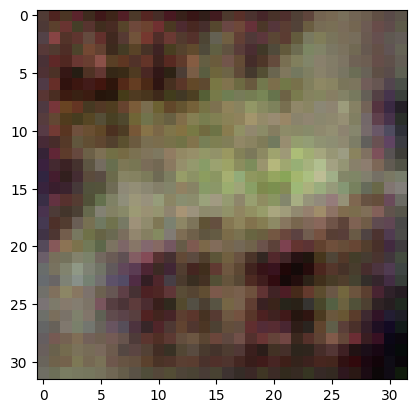

2/2 [==============================] - 0s 235ms/step
>17, 8/39, d1=0.550, d2=0.640 g=1.145


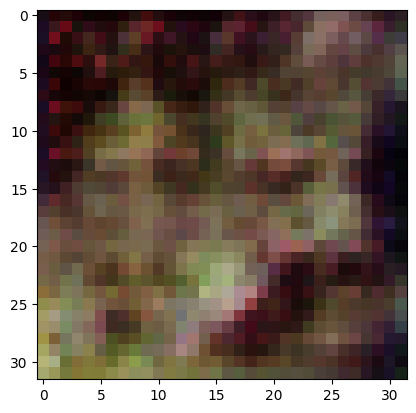

2/2 [==============================] - 0s 232ms/step
>17, 9/39, d1=0.558, d2=0.640 g=1.298


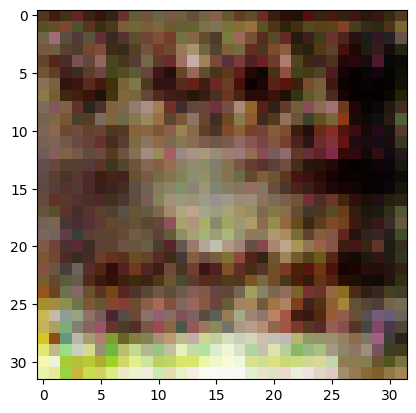

2/2 [==============================] - 0s 233ms/step
>17, 10/39, d1=0.602, d2=0.548 g=1.277


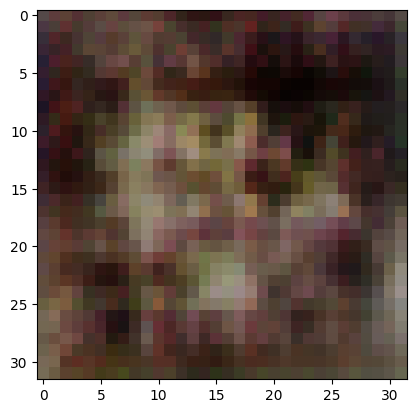

2/2 [==============================] - 0s 235ms/step
>17, 11/39, d1=0.646, d2=0.761 g=1.295


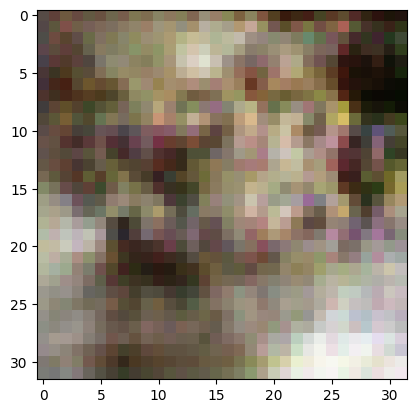

2/2 [==============================] - 0s 234ms/step
>17, 12/39, d1=0.823, d2=0.616 g=1.219


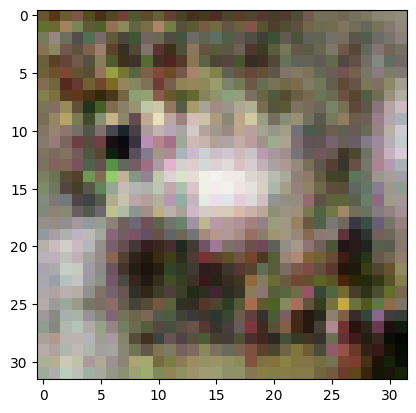

2/2 [==============================] - 0s 234ms/step
>17, 13/39, d1=0.757, d2=0.633 g=1.095


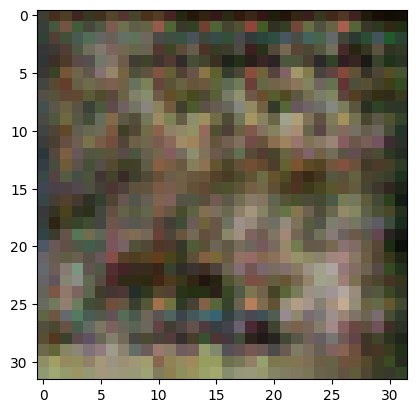

2/2 [==============================] - 1s 331ms/step
>17, 14/39, d1=0.549, d2=0.648 g=1.188


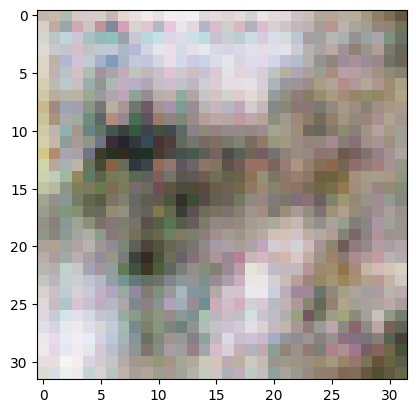

2/2 [==============================] - 0s 240ms/step
>17, 15/39, d1=0.581, d2=0.706 g=1.303


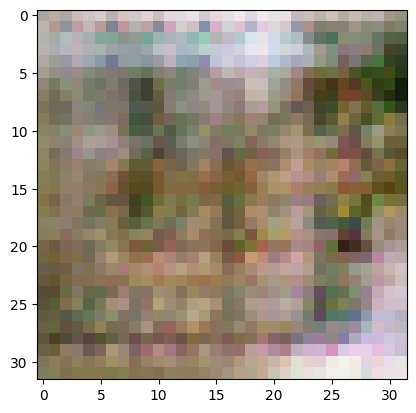

2/2 [==============================] - 0s 230ms/step
>17, 16/39, d1=0.624, d2=0.879 g=1.428


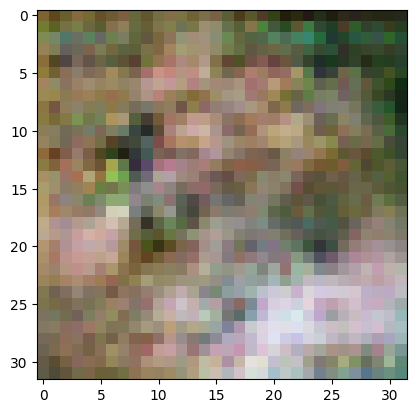

2/2 [==============================] - 0s 242ms/step
>17, 17/39, d1=0.842, d2=0.544 g=1.264


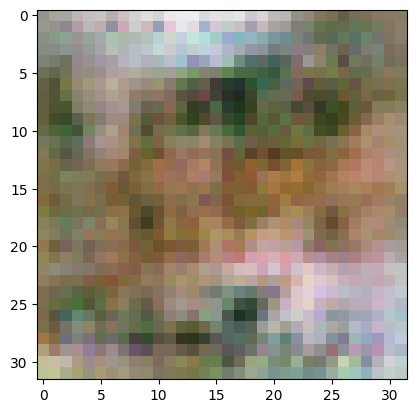

2/2 [==============================] - 0s 233ms/step
>17, 18/39, d1=0.883, d2=0.657 g=1.092


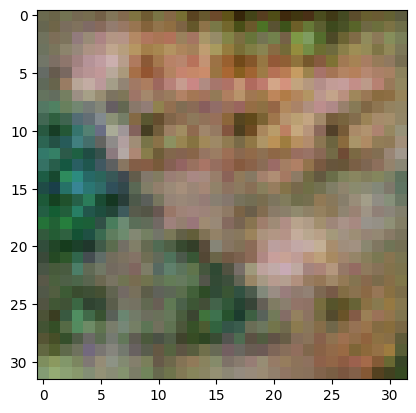

2/2 [==============================] - 0s 237ms/step
>17, 19/39, d1=0.809, d2=0.664 g=1.143


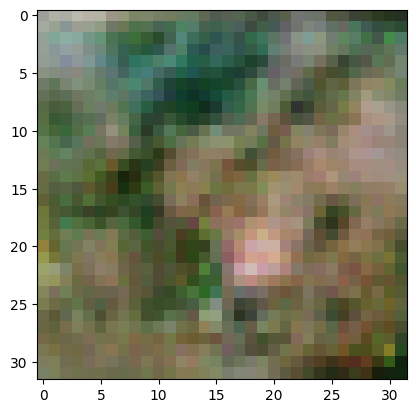

2/2 [==============================] - 0s 242ms/step
>17, 20/39, d1=0.773, d2=0.593 g=1.190


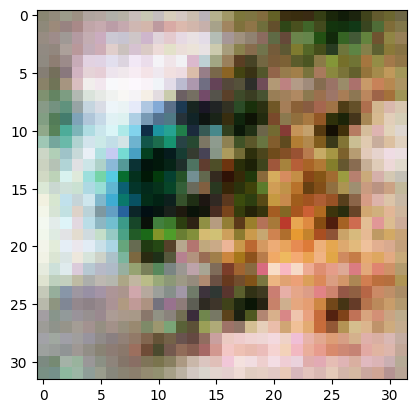

2/2 [==============================] - 0s 240ms/step
>17, 21/39, d1=0.723, d2=0.616 g=1.118


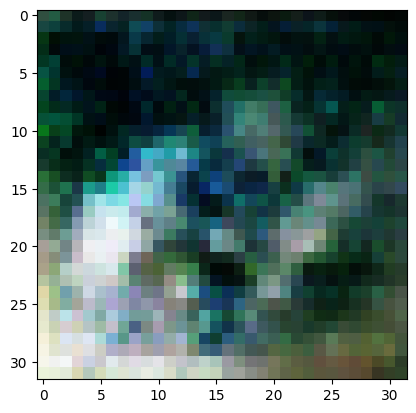

2/2 [==============================] - 0s 233ms/step
>17, 22/39, d1=0.681, d2=0.610 g=1.117


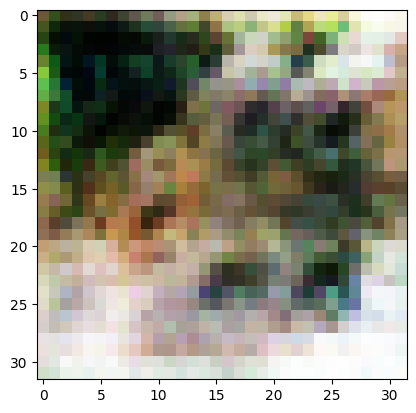

2/2 [==============================] - 0s 240ms/step
>17, 23/39, d1=0.687, d2=0.623 g=1.034


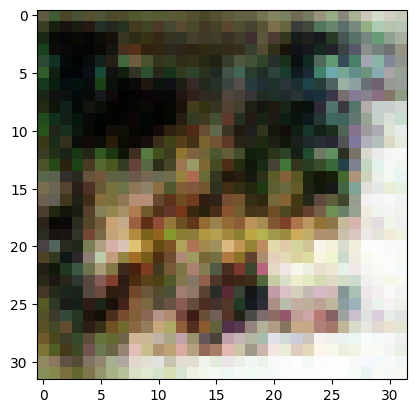

2/2 [==============================] - 0s 234ms/step
>17, 24/39, d1=0.700, d2=0.682 g=1.000


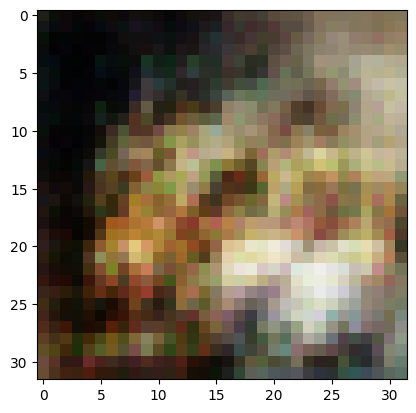

2/2 [==============================] - 1s 304ms/step
>17, 25/39, d1=0.625, d2=0.683 g=0.948


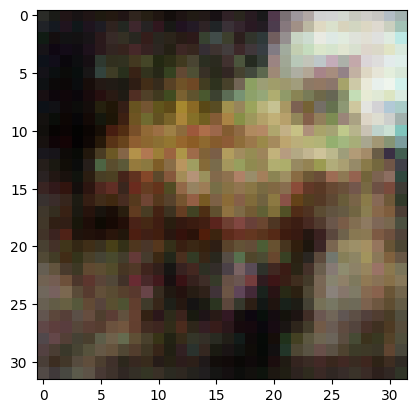

2/2 [==============================] - 0s 239ms/step
>17, 26/39, d1=0.615, d2=0.631 g=0.968


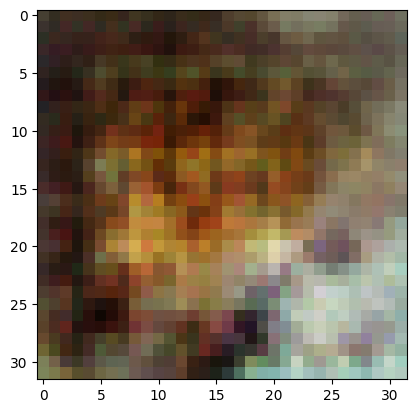

2/2 [==============================] - 0s 235ms/step
>17, 27/39, d1=0.614, d2=0.713 g=1.000


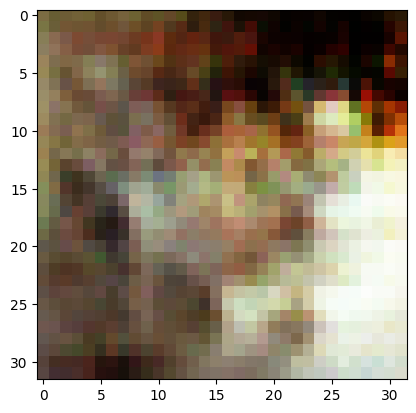

2/2 [==============================] - 1s 290ms/step
>17, 28/39, d1=0.607, d2=0.686 g=1.011


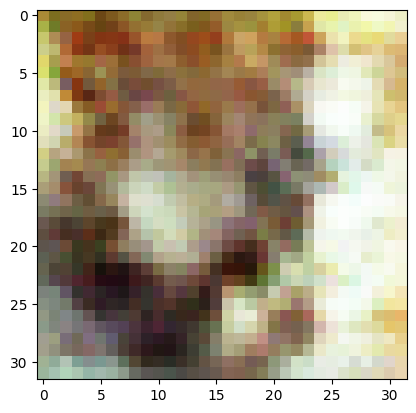

2/2 [==============================] - 0s 234ms/step
>17, 29/39, d1=0.610, d2=0.618 g=1.048


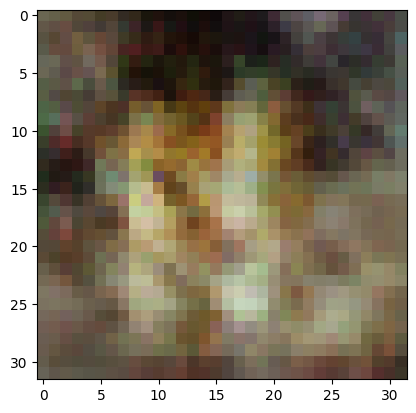

2/2 [==============================] - 0s 250ms/step
>17, 30/39, d1=0.559, d2=0.656 g=1.165


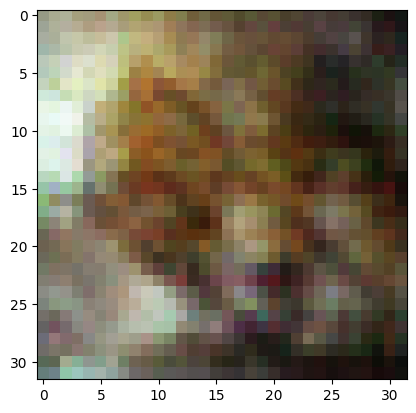

2/2 [==============================] - 1s 273ms/step
>17, 31/39, d1=0.629, d2=0.609 g=1.133


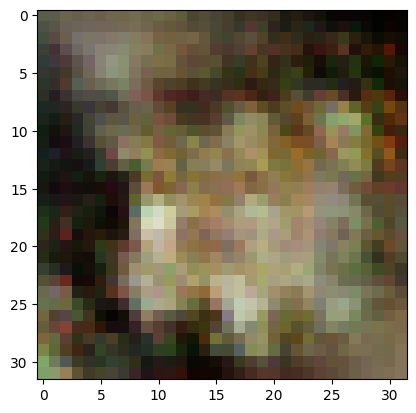

2/2 [==============================] - 0s 260ms/step
>17, 32/39, d1=0.558, d2=0.713 g=1.113


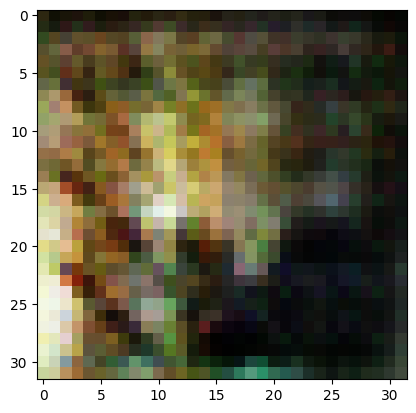

2/2 [==============================] - 0s 237ms/step
>17, 33/39, d1=0.597, d2=0.663 g=1.118


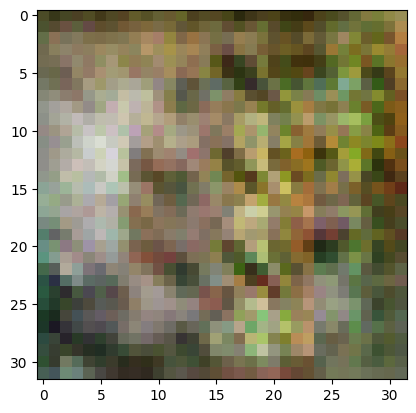

2/2 [==============================] - 1s 289ms/step
>17, 34/39, d1=0.529, d2=1.000 g=1.067


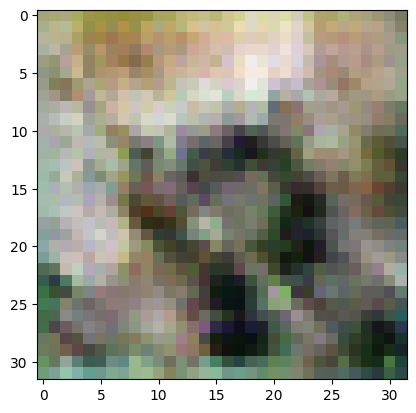

2/2 [==============================] - 0s 243ms/step
>17, 35/39, d1=0.576, d2=1.350 g=1.569


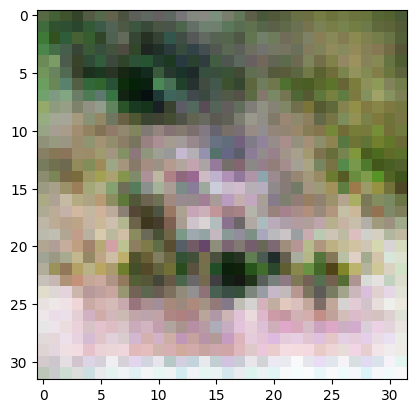

2/2 [==============================] - 0s 240ms/step
>17, 36/39, d1=0.642, d2=0.620 g=1.281


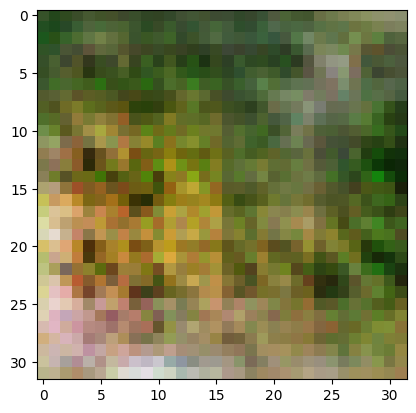

2/2 [==============================] - 1s 299ms/step
>17, 37/39, d1=0.538, d2=1.348 g=1.312


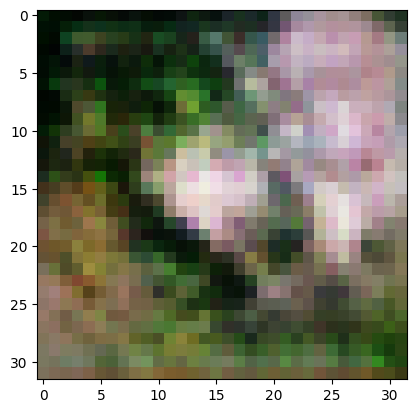

2/2 [==============================] - 0s 239ms/step
>17, 38/39, d1=1.005, d2=0.430 g=1.199


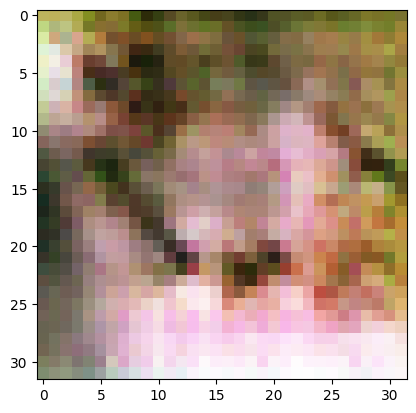

2/2 [==============================] - 0s 242ms/step
>17, 39/39, d1=1.022, d2=0.488 g=1.032


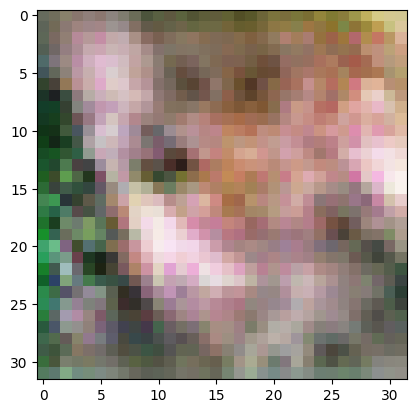

2/2 [==============================] - 0s 236ms/step
>18, 1/39, d1=0.825, d2=0.581 g=0.939


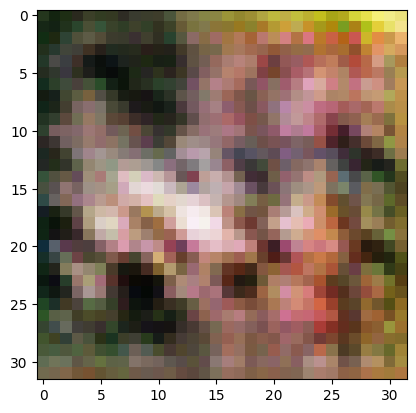

2/2 [==============================] - 0s 241ms/step
>18, 2/39, d1=0.724, d2=0.645 g=0.952


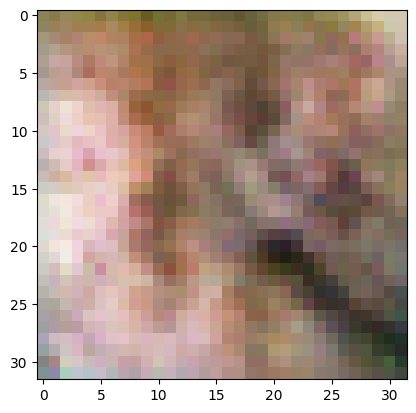

2/2 [==============================] - 0s 237ms/step
>18, 3/39, d1=0.704, d2=0.659 g=1.015


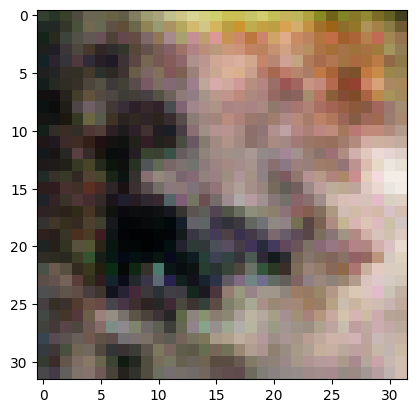

2/2 [==============================] - 0s 259ms/step
>18, 4/39, d1=0.711, d2=0.554 g=1.080


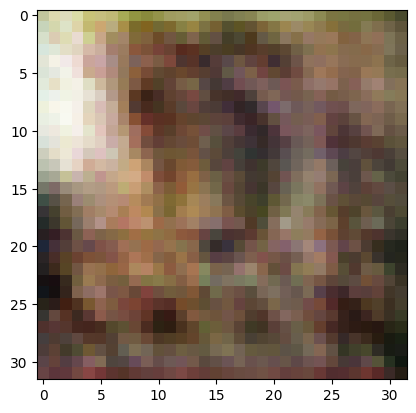

2/2 [==============================] - 0s 263ms/step
>18, 5/39, d1=0.689, d2=0.557 g=1.008


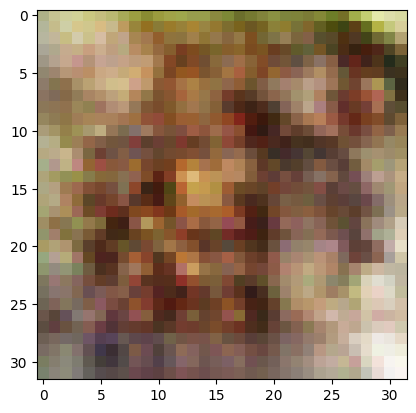

2/2 [==============================] - 1s 275ms/step
>18, 6/39, d1=0.693, d2=0.696 g=1.065


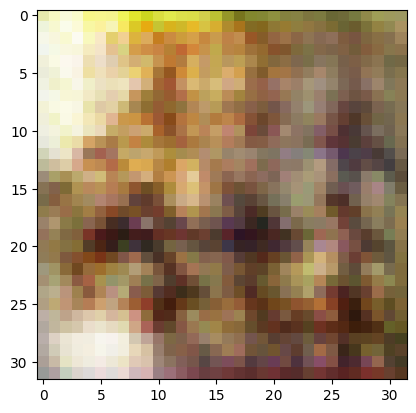

2/2 [==============================] - 0s 254ms/step
>18, 7/39, d1=0.698, d2=0.561 g=1.001


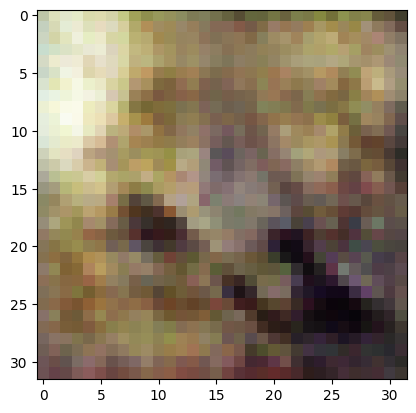

2/2 [==============================] - 0s 253ms/step
>18, 8/39, d1=0.735, d2=0.560 g=0.992


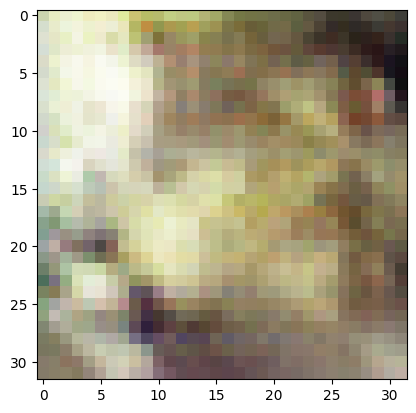

2/2 [==============================] - 1s 287ms/step
>18, 9/39, d1=0.714, d2=0.629 g=0.903


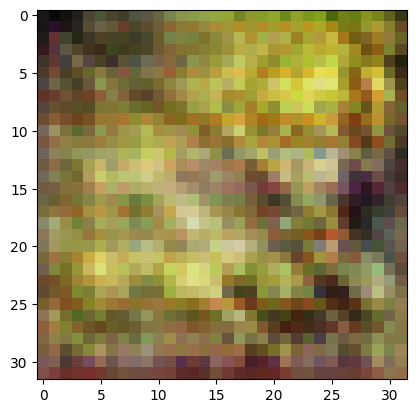

2/2 [==============================] - 0s 248ms/step
>18, 10/39, d1=0.630, d2=0.626 g=0.945


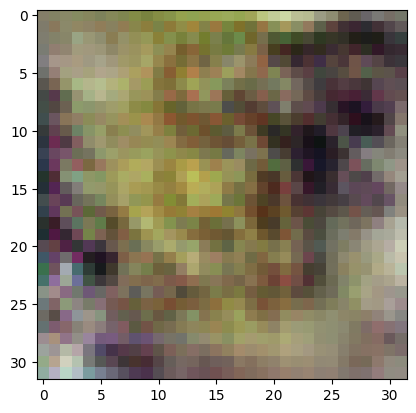

2/2 [==============================] - 0s 262ms/step
>18, 11/39, d1=0.608, d2=0.585 g=0.998


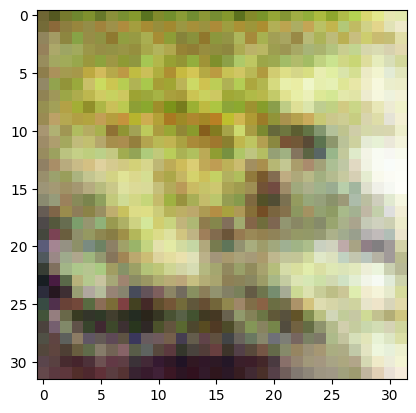

2/2 [==============================] - 1s 305ms/step
>18, 12/39, d1=0.522, d2=0.580 g=1.081


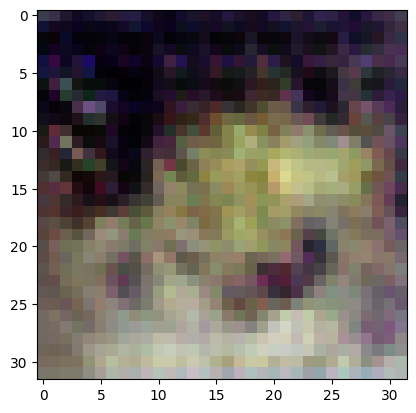

2/2 [==============================] - 0s 260ms/step
>18, 13/39, d1=0.530, d2=0.696 g=1.162


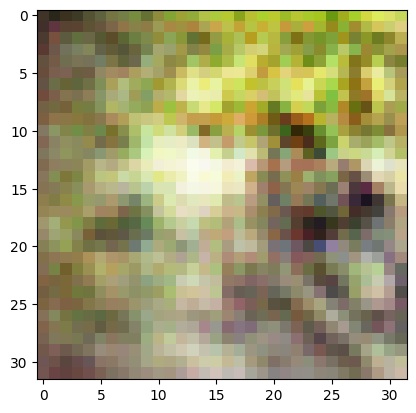

2/2 [==============================] - 0s 260ms/step
>18, 14/39, d1=0.639, d2=0.592 g=1.216


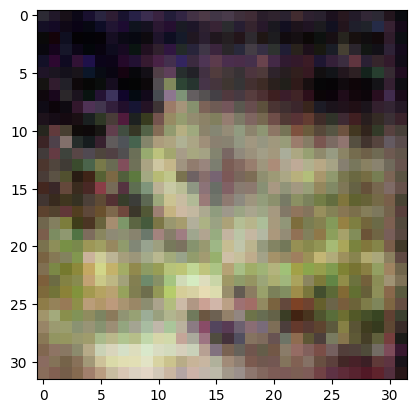

2/2 [==============================] - 1s 297ms/step
>18, 15/39, d1=0.674, d2=0.677 g=1.133


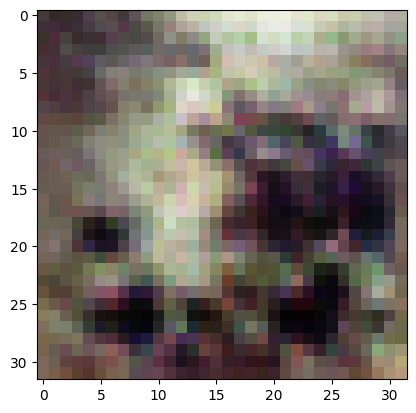

2/2 [==============================] - 0s 253ms/step
>18, 16/39, d1=0.653, d2=0.577 g=1.187


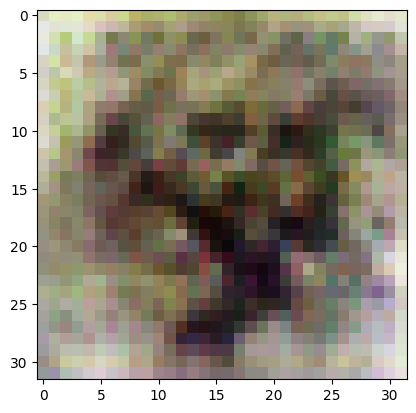

2/2 [==============================] - 0s 235ms/step
>18, 17/39, d1=0.617, d2=0.637 g=1.171


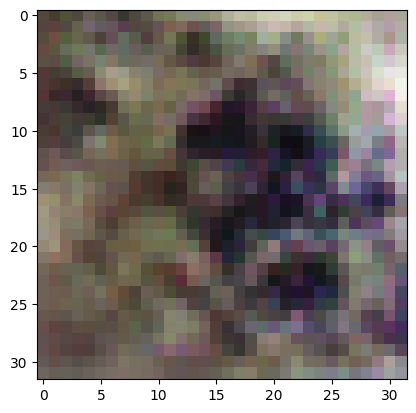

2/2 [==============================] - 0s 246ms/step
>18, 18/39, d1=0.483, d2=0.552 g=1.348


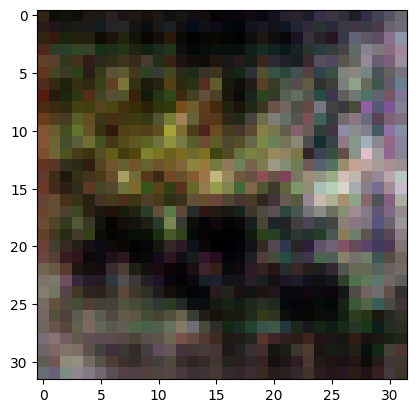

2/2 [==============================] - 1s 270ms/step
>18, 19/39, d1=0.632, d2=0.756 g=1.239


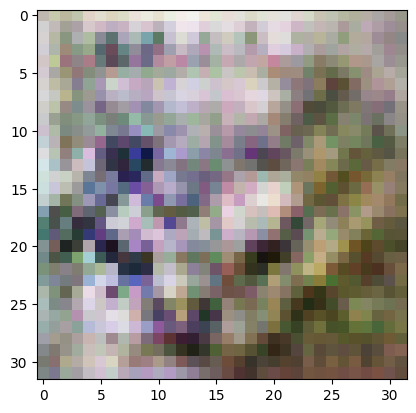

2/2 [==============================] - 0s 240ms/step
>18, 20/39, d1=0.566, d2=0.703 g=1.180


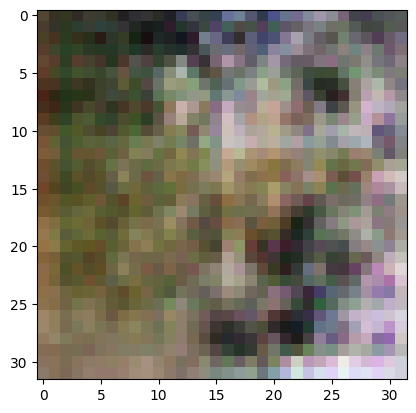

2/2 [==============================] - 0s 239ms/step
>18, 21/39, d1=0.589, d2=0.739 g=1.115


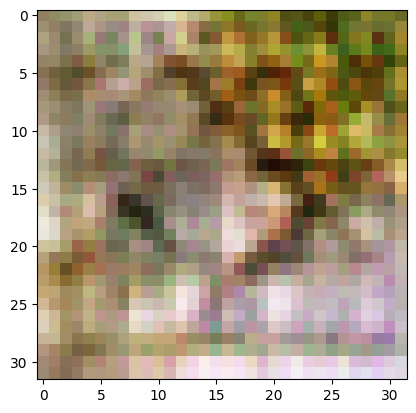

2/2 [==============================] - 0s 251ms/step
>18, 22/39, d1=0.604, d2=0.670 g=1.198


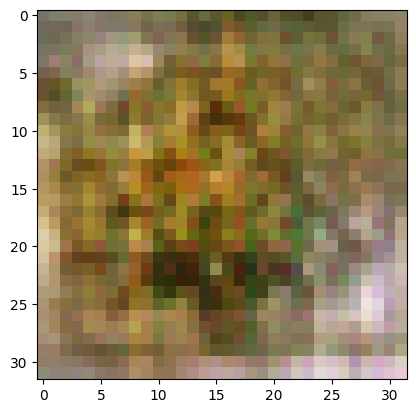

2/2 [==============================] - 1s 288ms/step
>18, 23/39, d1=0.587, d2=0.538 g=1.230


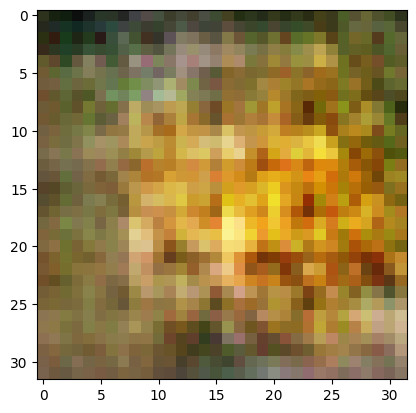

2/2 [==============================] - 0s 252ms/step
>18, 24/39, d1=0.518, d2=0.711 g=1.173


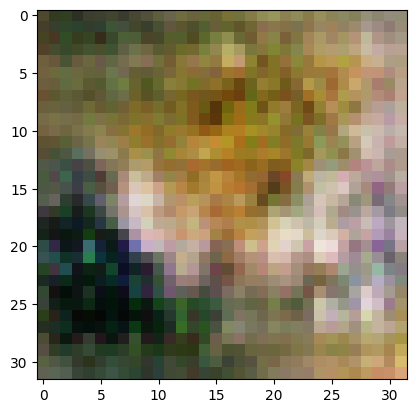

2/2 [==============================] - 0s 249ms/step
>18, 25/39, d1=0.421, d2=0.742 g=1.326


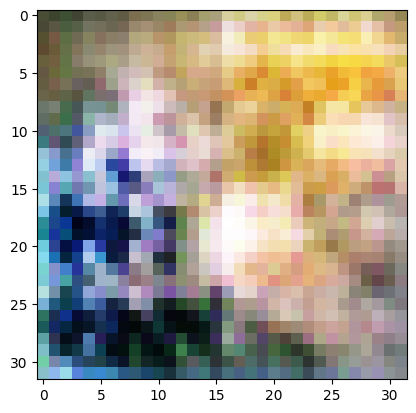

2/2 [==============================] - 1s 281ms/step
>18, 26/39, d1=0.513, d2=0.706 g=1.340


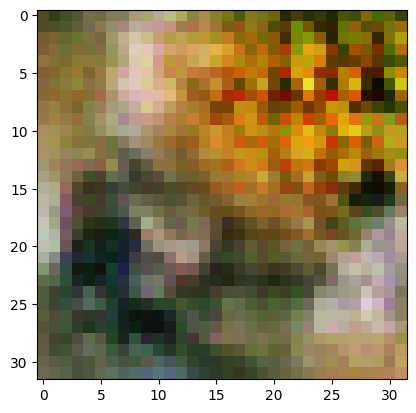

2/2 [==============================] - 0s 251ms/step
>18, 27/39, d1=0.611, d2=0.649 g=1.210


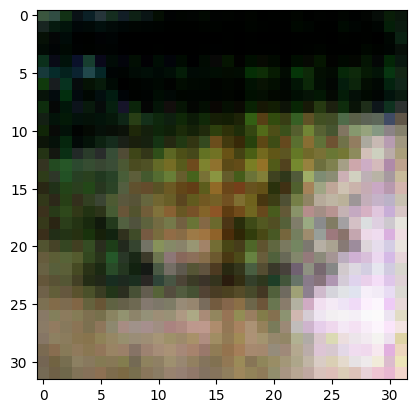

2/2 [==============================] - 0s 250ms/step
>18, 28/39, d1=0.647, d2=0.777 g=1.380


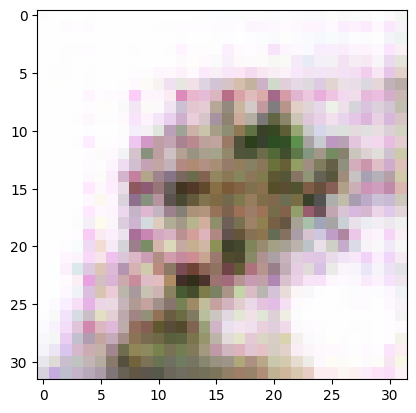

2/2 [==============================] - 1s 320ms/step
>18, 29/39, d1=0.718, d2=0.465 g=1.617


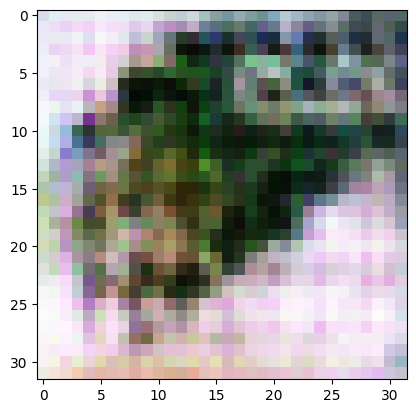

2/2 [==============================] - 0s 235ms/step
>18, 30/39, d1=0.665, d2=0.432 g=1.433


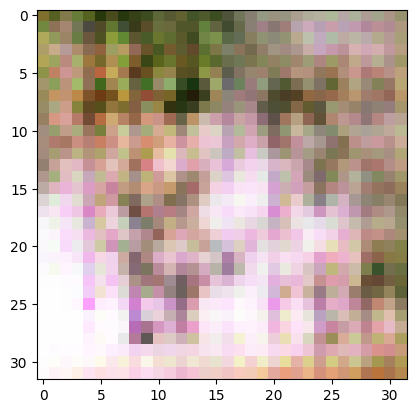

2/2 [==============================] - 0s 237ms/step
>18, 31/39, d1=0.417, d2=0.756 g=1.358


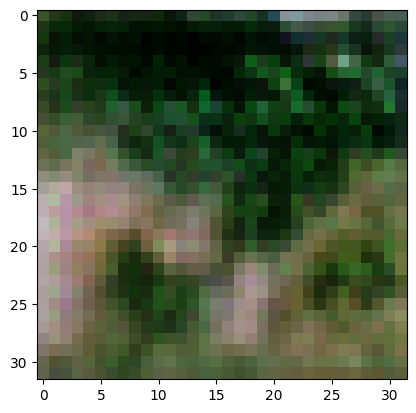

2/2 [==============================] - 0s 241ms/step
>18, 32/39, d1=0.491, d2=0.642 g=1.638


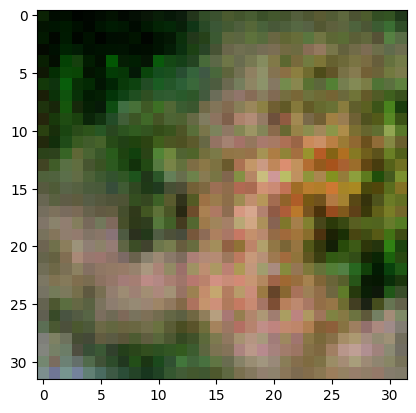

2/2 [==============================] - 0s 235ms/step
>18, 33/39, d1=0.627, d2=0.590 g=1.343


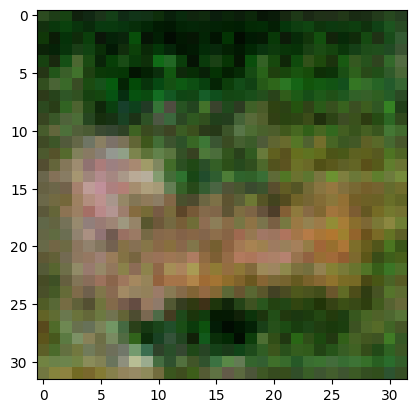

2/2 [==============================] - 0s 235ms/step
>18, 34/39, d1=0.368, d2=0.745 g=1.566


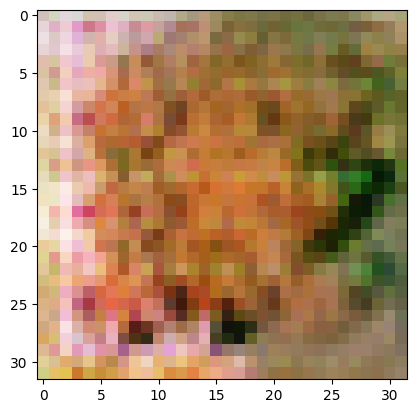

2/2 [==============================] - 0s 233ms/step
>18, 35/39, d1=0.521, d2=0.502 g=1.416


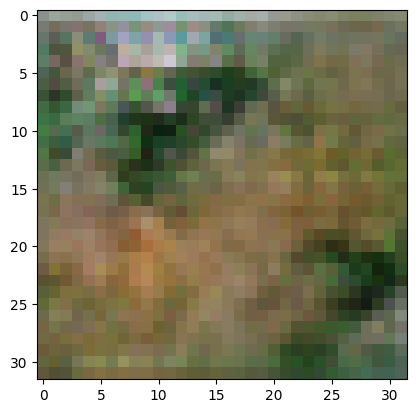

2/2 [==============================] - 0s 236ms/step
>18, 36/39, d1=0.476, d2=1.153 g=1.447


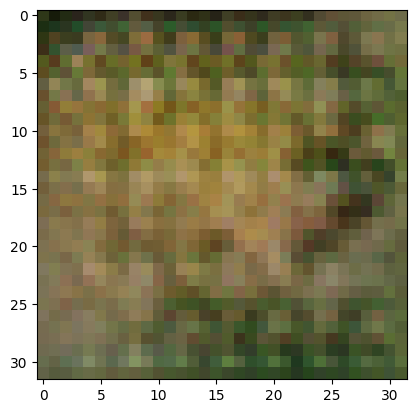

2/2 [==============================] - 0s 236ms/step
>18, 37/39, d1=1.012, d2=0.671 g=1.312


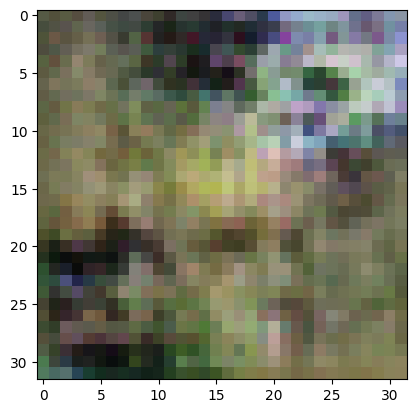

2/2 [==============================] - 0s 235ms/step
>18, 38/39, d1=0.969, d2=0.687 g=1.256


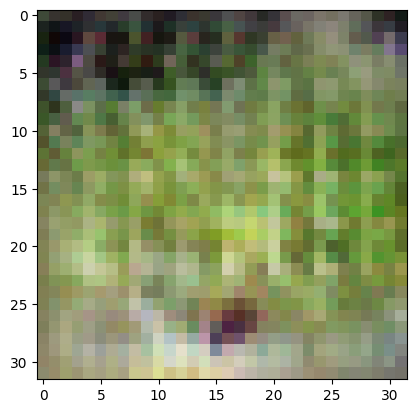

2/2 [==============================] - 0s 252ms/step
>18, 39/39, d1=0.681, d2=0.447 g=1.534


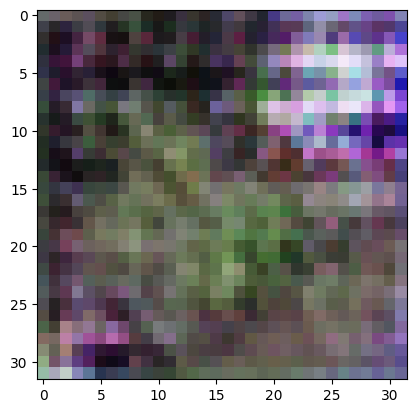

2/2 [==============================] - 1s 324ms/step
>19, 1/39, d1=0.609, d2=0.616 g=1.253


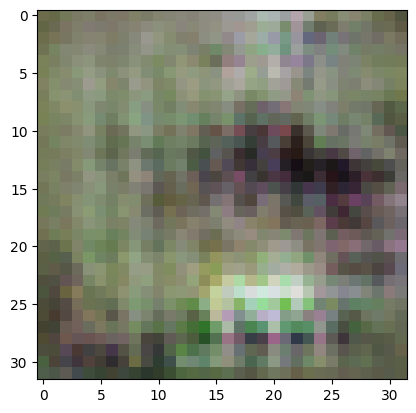

2/2 [==============================] - 0s 237ms/step
>19, 2/39, d1=0.582, d2=1.053 g=1.336


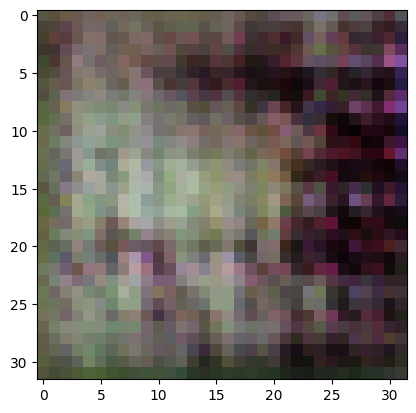

2/2 [==============================] - 0s 234ms/step
>19, 3/39, d1=0.692, d2=0.469 g=1.431


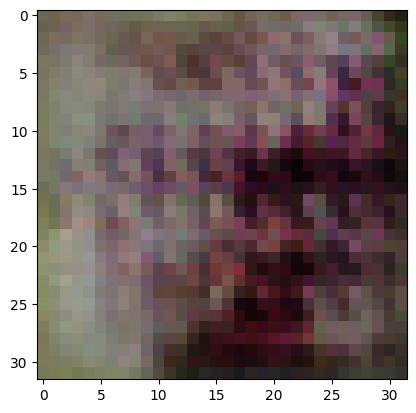

2/2 [==============================] - 1s 300ms/step
>19, 4/39, d1=0.724, d2=0.592 g=1.253


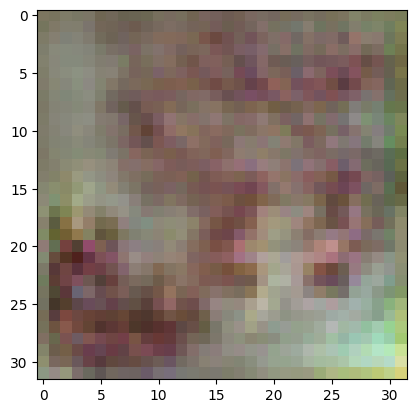

2/2 [==============================] - 0s 238ms/step
>19, 5/39, d1=0.715, d2=0.680 g=1.089


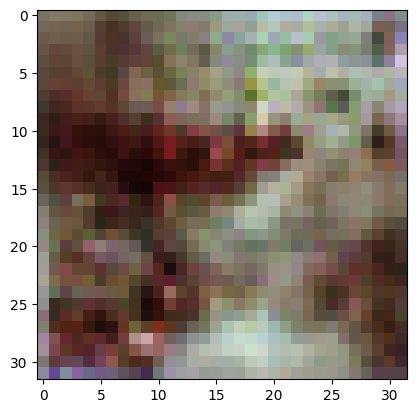

2/2 [==============================] - 0s 240ms/step
>19, 6/39, d1=0.672, d2=0.640 g=0.998


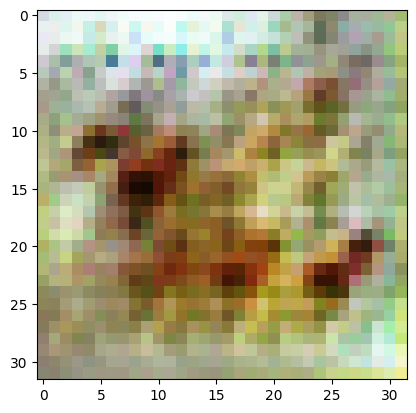

2/2 [==============================] - 1s 330ms/step
>19, 7/39, d1=0.714, d2=0.592 g=0.944


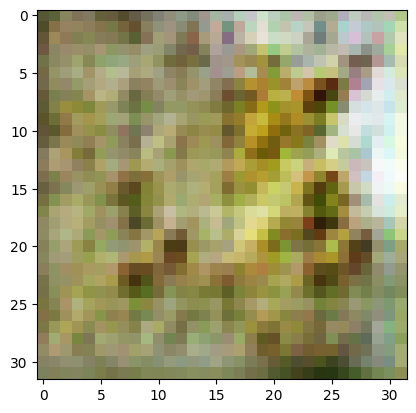

2/2 [==============================] - 0s 237ms/step
>19, 8/39, d1=0.728, d2=0.606 g=1.018


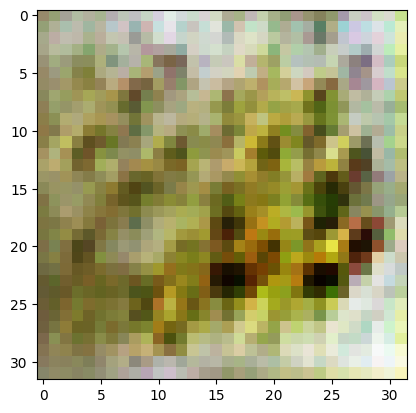

2/2 [==============================] - 0s 232ms/step
>19, 9/39, d1=0.647, d2=0.594 g=1.085


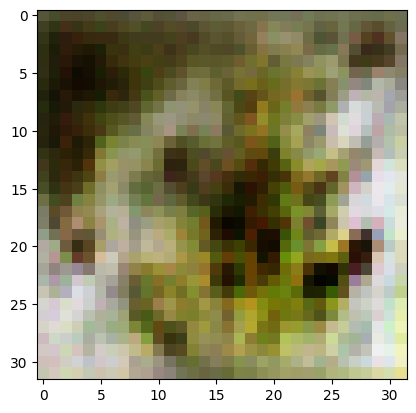

2/2 [==============================] - 1s 276ms/step
>19, 10/39, d1=0.523, d2=0.569 g=1.159


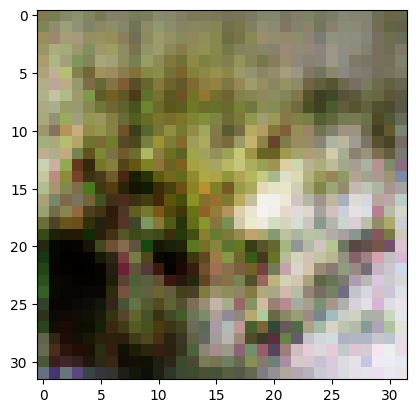

2/2 [==============================] - 0s 240ms/step
>19, 11/39, d1=0.431, d2=0.688 g=1.290


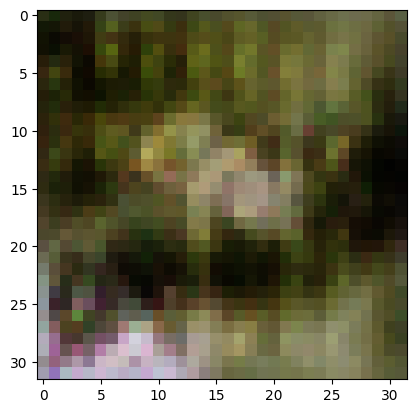

2/2 [==============================] - 0s 238ms/step
>19, 12/39, d1=0.471, d2=0.525 g=1.322


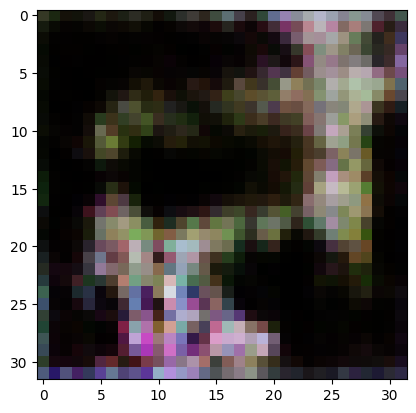

2/2 [==============================] - 1s 272ms/step
>19, 13/39, d1=0.546, d2=0.573 g=1.316


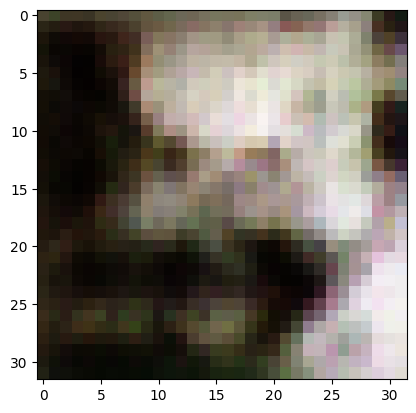

2/2 [==============================] - 0s 233ms/step
>19, 14/39, d1=0.548, d2=0.784 g=1.380


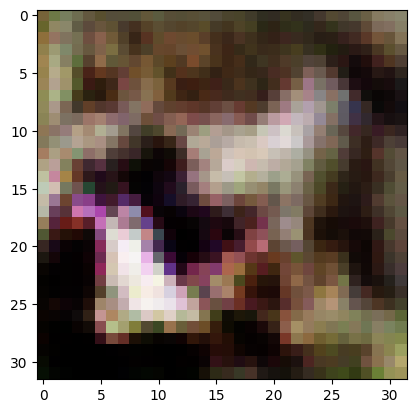

2/2 [==============================] - 0s 239ms/step
>19, 15/39, d1=0.596, d2=0.623 g=1.481


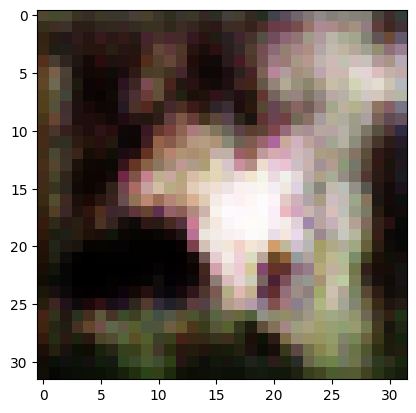

2/2 [==============================] - 0s 241ms/step
>19, 16/39, d1=0.691, d2=0.511 g=1.433


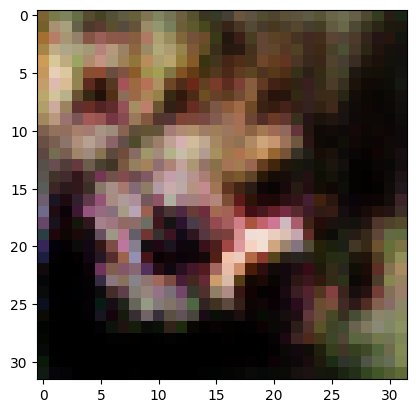

2/2 [==============================] - 0s 246ms/step
>19, 17/39, d1=0.699, d2=0.742 g=1.317


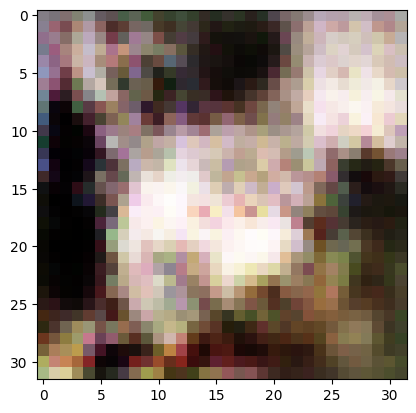

2/2 [==============================] - 0s 239ms/step
>19, 18/39, d1=0.640, d2=0.637 g=1.266


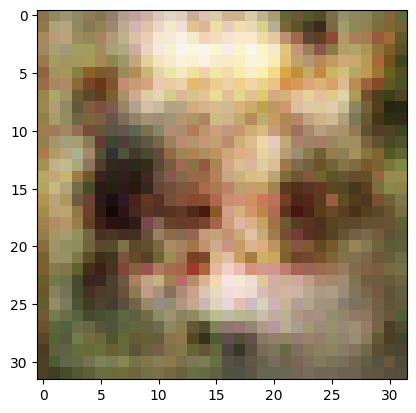

2/2 [==============================] - 0s 252ms/step
>19, 19/39, d1=0.741, d2=0.635 g=1.181


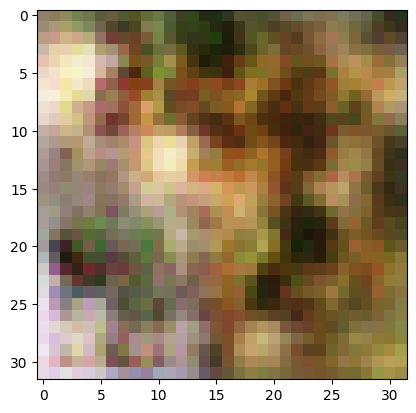

2/2 [==============================] - 0s 238ms/step
>19, 20/39, d1=0.720, d2=0.641 g=1.180


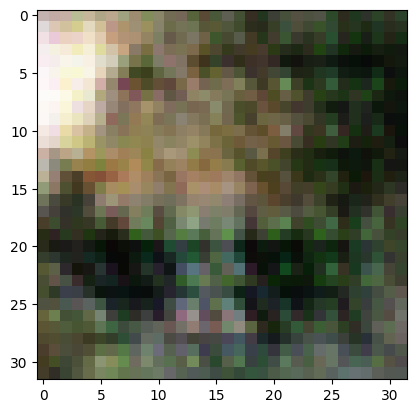

2/2 [==============================] - 1s 274ms/step
>19, 21/39, d1=0.573, d2=1.056 g=1.297


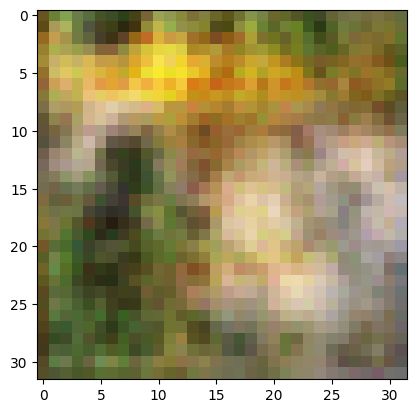

2/2 [==============================] - 0s 240ms/step
>19, 22/39, d1=0.761, d2=0.997 g=1.525


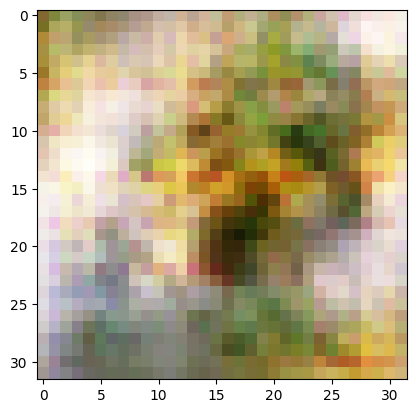

2/2 [==============================] - 0s 236ms/step
>19, 23/39, d1=0.740, d2=0.632 g=1.542


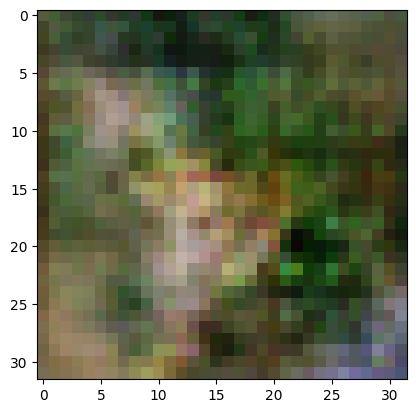

2/2 [==============================] - 1s 272ms/step
>19, 24/39, d1=0.666, d2=3.720 g=1.266


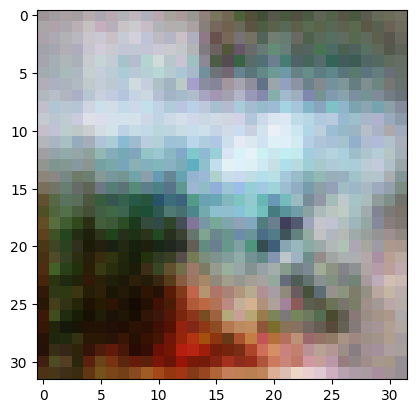

2/2 [==============================] - 0s 241ms/step
>19, 25/39, d1=0.928, d2=0.704 g=1.099


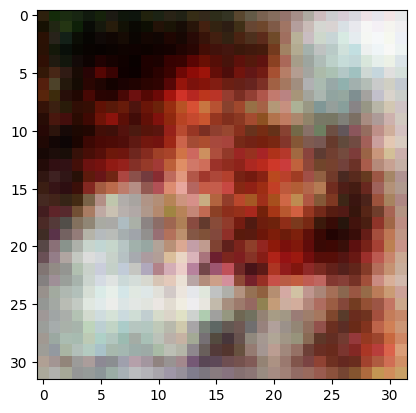

2/2 [==============================] - 0s 238ms/step
>19, 26/39, d1=0.738, d2=0.609 g=1.183


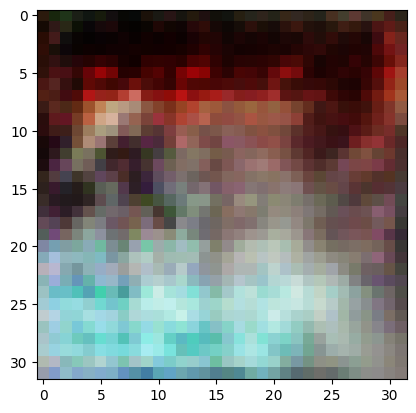

2/2 [==============================] - 1s 278ms/step
>19, 27/39, d1=0.632, d2=0.524 g=1.489


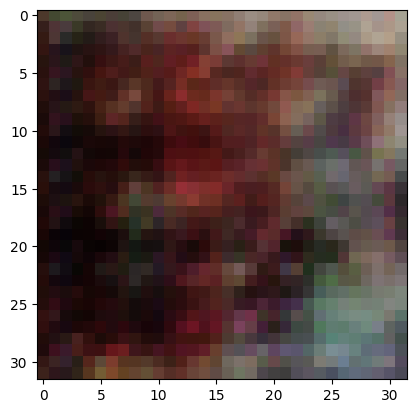

2/2 [==============================] - 0s 247ms/step
>19, 28/39, d1=0.619, d2=0.547 g=1.722


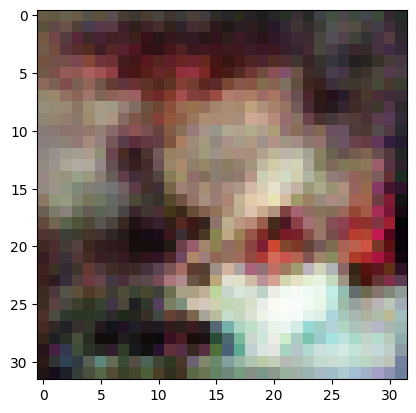

2/2 [==============================] - 0s 252ms/step
>19, 29/39, d1=0.621, d2=0.718 g=1.477


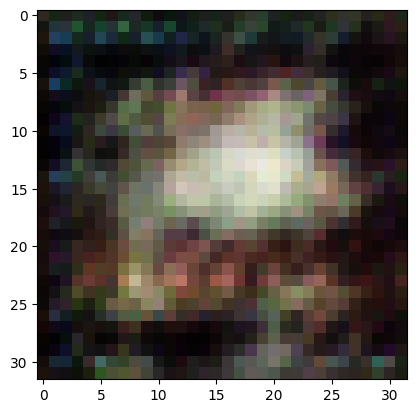

2/2 [==============================] - 0s 250ms/step
>19, 30/39, d1=0.770, d2=0.689 g=1.067


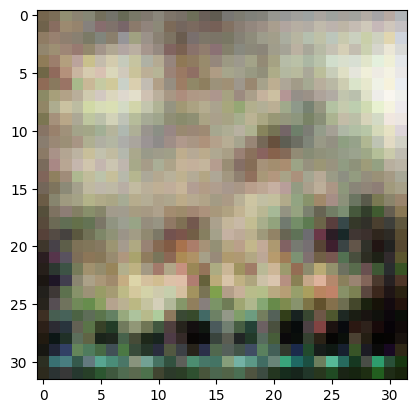

2/2 [==============================] - 0s 258ms/step
>19, 31/39, d1=0.541, d2=0.781 g=1.028


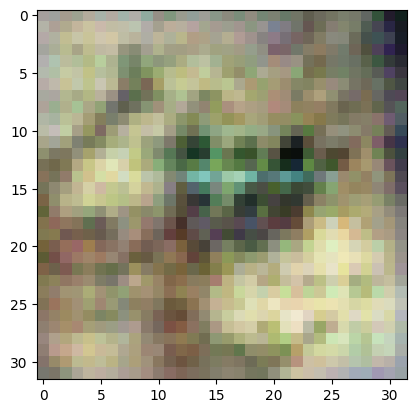

2/2 [==============================] - 0s 282ms/step
>19, 32/39, d1=0.567, d2=1.038 g=1.153


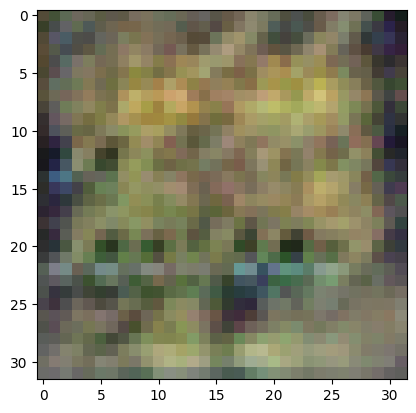

2/2 [==============================] - 0s 247ms/step
>19, 33/39, d1=0.579, d2=0.508 g=1.276


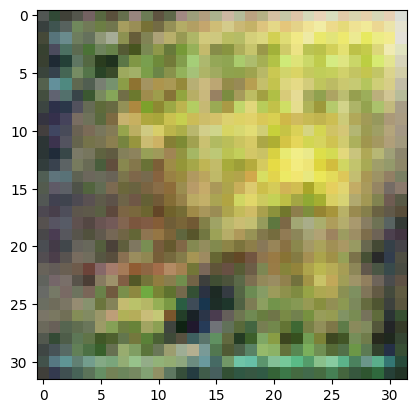

2/2 [==============================] - 0s 235ms/step
>19, 34/39, d1=0.554, d2=0.596 g=1.173


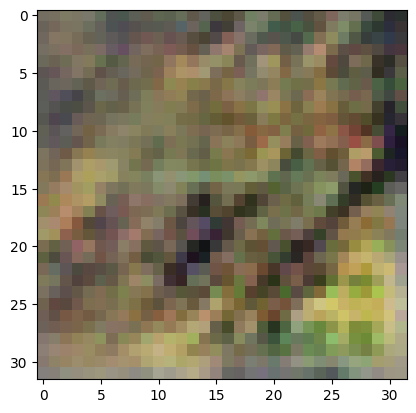

2/2 [==============================] - 1s 288ms/step
>19, 35/39, d1=0.481, d2=0.855 g=1.333


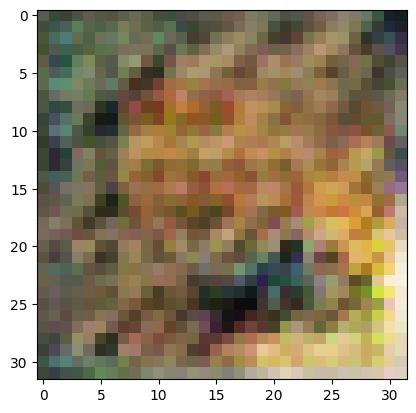

2/2 [==============================] - 0s 251ms/step
>19, 36/39, d1=0.694, d2=0.687 g=1.065


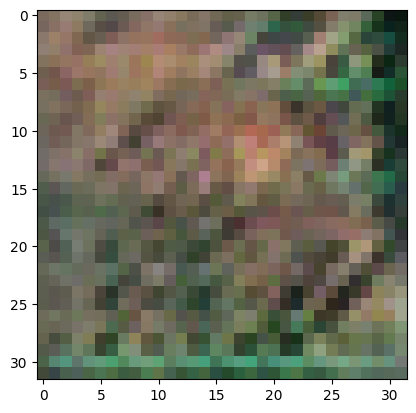

2/2 [==============================] - 0s 244ms/step
>19, 37/39, d1=0.487, d2=0.803 g=1.287


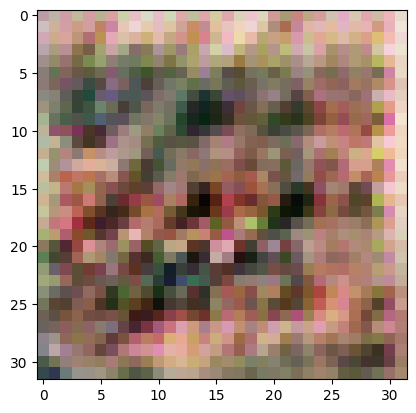

2/2 [==============================] - 0s 237ms/step
>19, 38/39, d1=0.531, d2=0.596 g=1.496


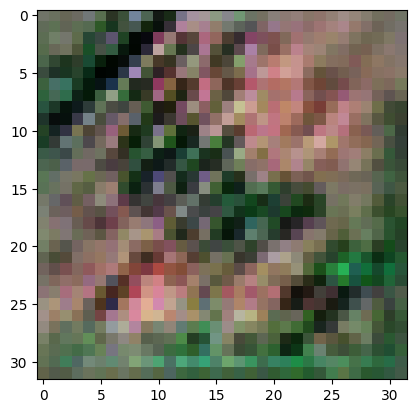

2/2 [==============================] - 0s 259ms/step
>19, 39/39, d1=0.669, d2=0.747 g=1.468


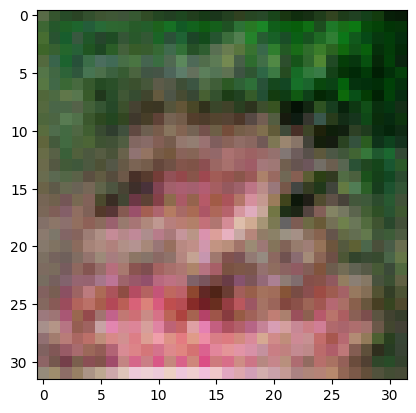

2/2 [==============================] - 1s 328ms/step
>20, 1/39, d1=0.773, d2=0.641 g=1.320


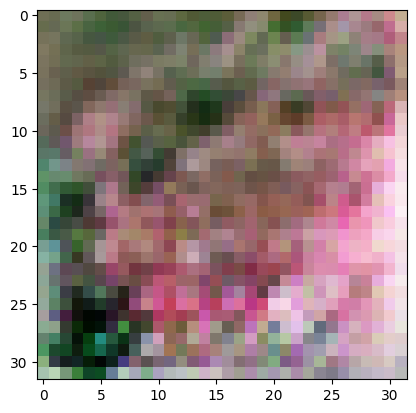

2/2 [==============================] - 0s 239ms/step
>20, 2/39, d1=0.743, d2=0.662 g=1.186


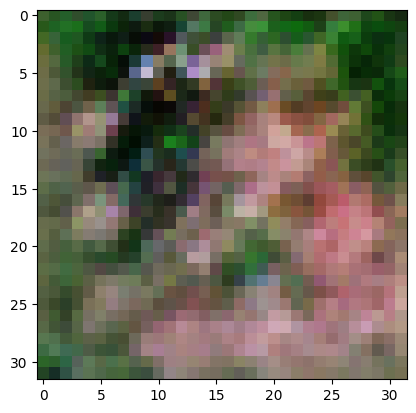

2/2 [==============================] - 0s 239ms/step
>20, 3/39, d1=0.632, d2=0.710 g=1.064


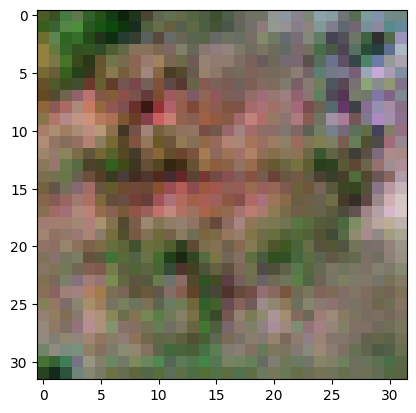

2/2 [==============================] - 1s 297ms/step
>20, 4/39, d1=0.740, d2=0.687 g=0.979


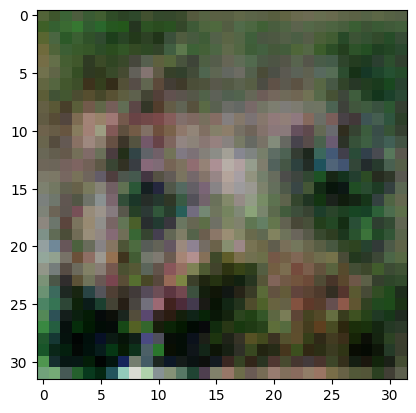

2/2 [==============================] - 0s 245ms/step
>20, 5/39, d1=0.658, d2=0.847 g=1.014


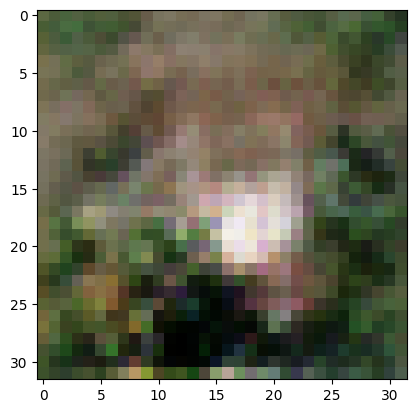

2/2 [==============================] - 0s 239ms/step
>20, 6/39, d1=0.738, d2=0.729 g=1.163


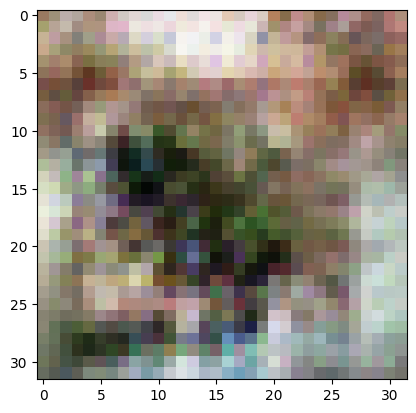

2/2 [==============================] - 1s 295ms/step
>20, 7/39, d1=0.760, d2=0.647 g=1.198


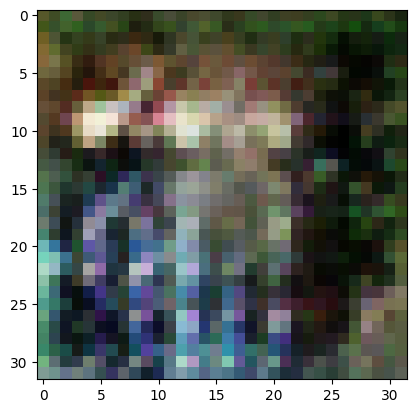

2/2 [==============================] - 0s 237ms/step
>20, 8/39, d1=0.759, d2=0.693 g=1.245


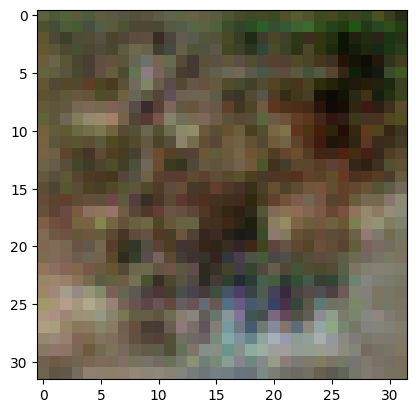

2/2 [==============================] - 0s 241ms/step
>20, 9/39, d1=0.695, d2=0.541 g=1.134


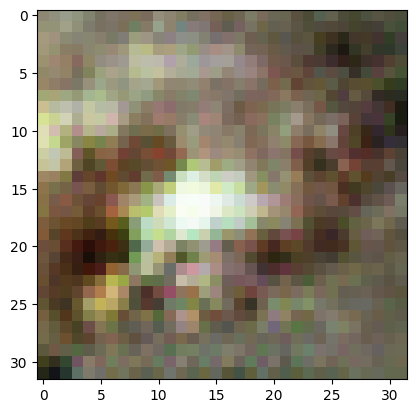

2/2 [==============================] - 1s 297ms/step
>20, 10/39, d1=0.644, d2=0.730 g=1.066


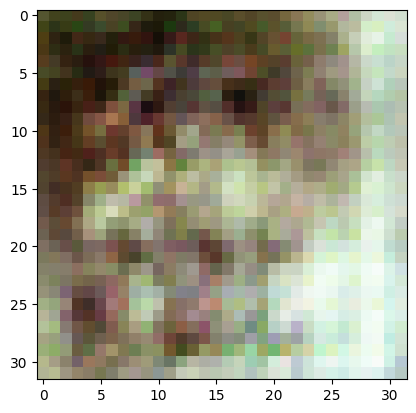

2/2 [==============================] - 0s 262ms/step
>20, 11/39, d1=0.624, d2=0.634 g=1.043


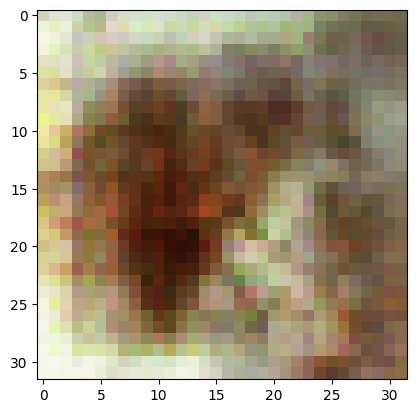

2/2 [==============================] - 0s 260ms/step
>20, 12/39, d1=0.600, d2=0.607 g=1.040


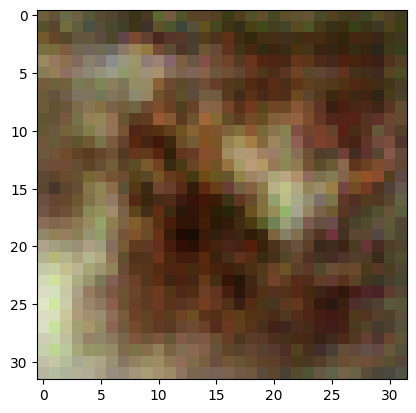

2/2 [==============================] - 0s 239ms/step
>20, 13/39, d1=0.574, d2=0.648 g=1.090


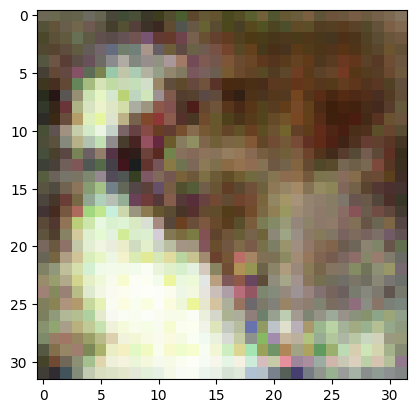

2/2 [==============================] - 0s 280ms/step
>20, 14/39, d1=0.657, d2=0.696 g=1.187


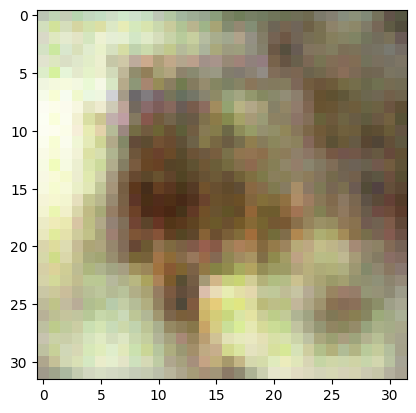

2/2 [==============================] - 0s 261ms/step
>20, 15/39, d1=0.690, d2=0.627 g=1.290


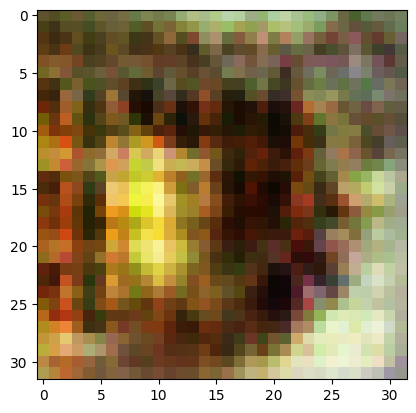

2/2 [==============================] - 0s 255ms/step
>20, 16/39, d1=0.671, d2=0.648 g=1.373


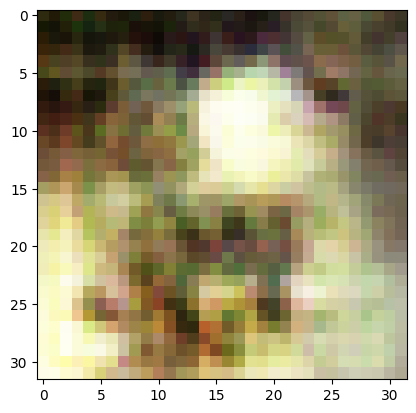

2/2 [==============================] - 0s 260ms/step
>20, 17/39, d1=0.779, d2=0.701 g=1.407


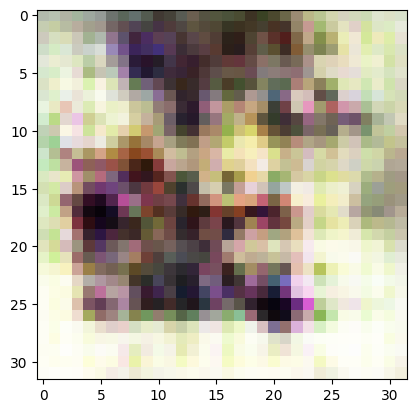

2/2 [==============================] - 1s 292ms/step
>20, 18/39, d1=0.698, d2=0.633 g=1.744


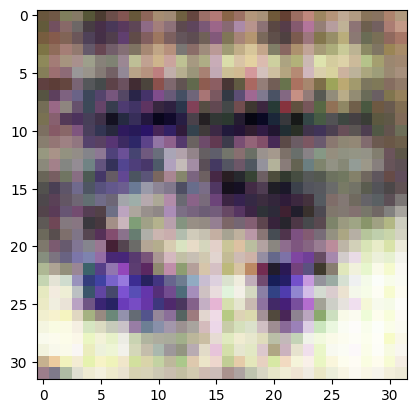

2/2 [==============================] - 0s 258ms/step
>20, 19/39, d1=0.633, d2=0.609 g=1.407


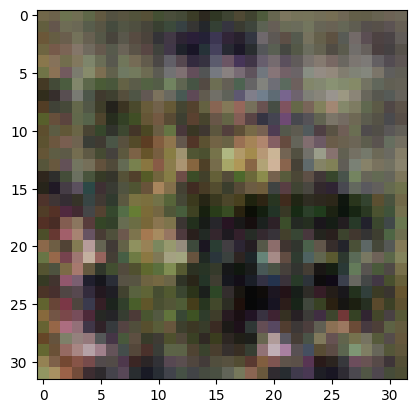

2/2 [==============================] - 0s 248ms/step
>20, 20/39, d1=0.574, d2=0.820 g=1.114


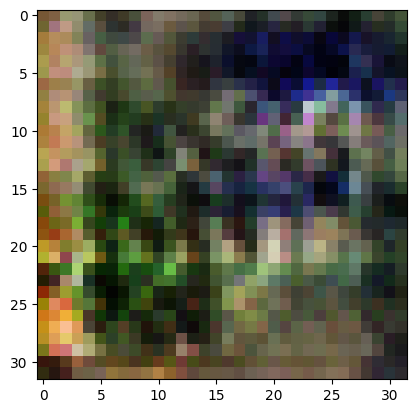

2/2 [==============================] - 1s 320ms/step
>20, 21/39, d1=0.743, d2=0.575 g=1.012


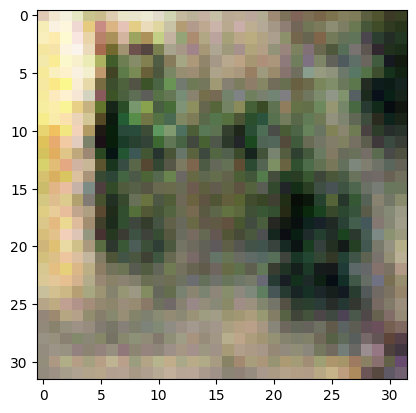

2/2 [==============================] - 0s 238ms/step
>20, 22/39, d1=0.681, d2=0.626 g=0.957


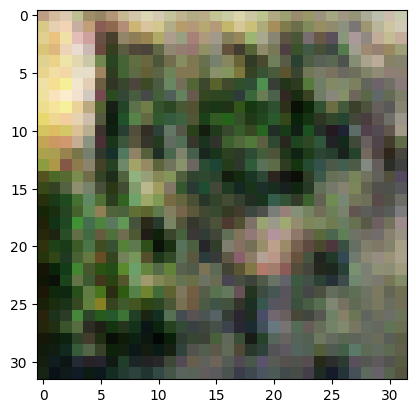

2/2 [==============================] - 0s 241ms/step
>20, 23/39, d1=0.539, d2=0.678 g=1.044


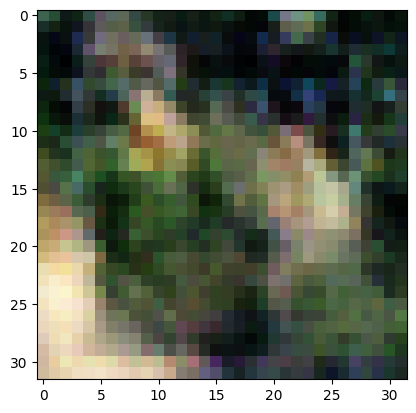

2/2 [==============================] - 0s 250ms/step
>20, 24/39, d1=0.592, d2=0.635 g=1.137


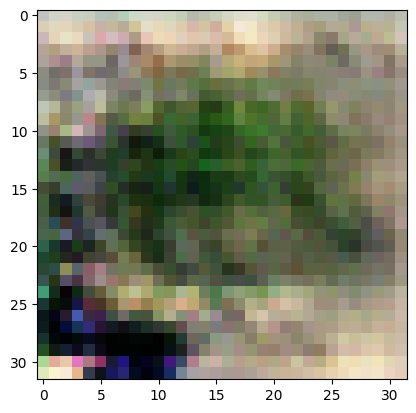

2/2 [==============================] - 0s 244ms/step
>20, 25/39, d1=0.697, d2=0.611 g=1.082


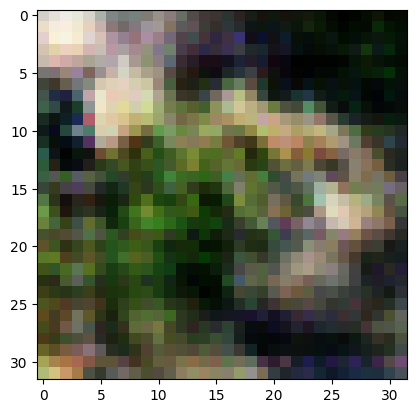

2/2 [==============================] - 0s 248ms/step
>20, 26/39, d1=0.623, d2=0.743 g=1.189


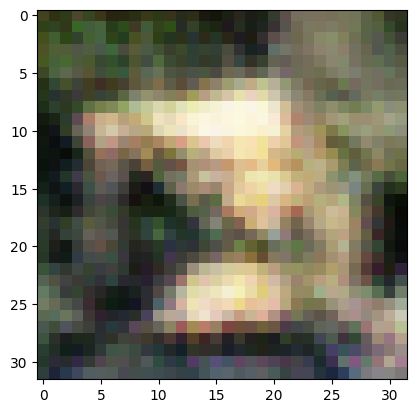

2/2 [==============================] - 0s 242ms/step
>20, 27/39, d1=0.711, d2=0.574 g=1.120


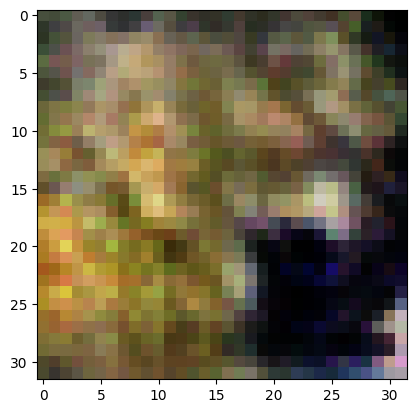

2/2 [==============================] - 0s 239ms/step
>20, 28/39, d1=0.680, d2=0.622 g=1.180


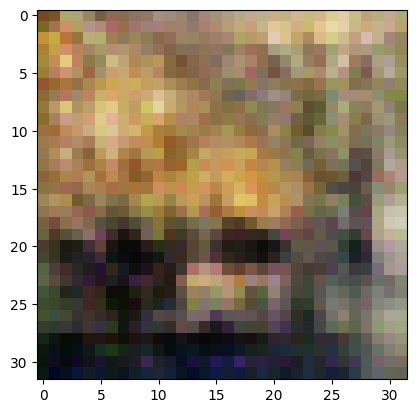

2/2 [==============================] - 0s 294ms/step
>20, 29/39, d1=0.691, d2=0.603 g=1.202


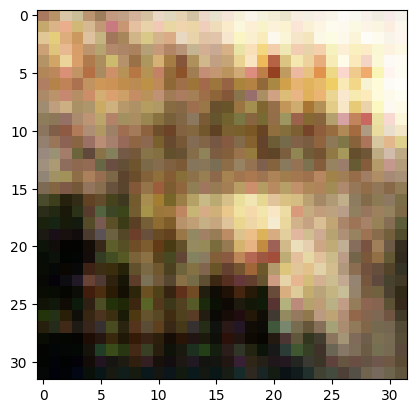

2/2 [==============================] - 0s 242ms/step
>20, 30/39, d1=0.672, d2=0.510 g=1.256


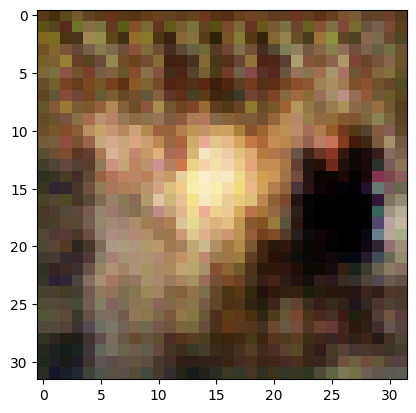

2/2 [==============================] - 1s 361ms/step
>20, 31/39, d1=0.604, d2=0.575 g=1.321


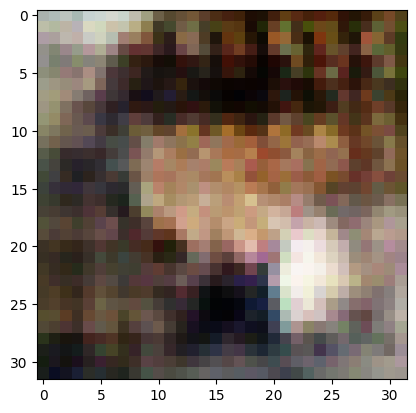

2/2 [==============================] - 1s 311ms/step
>20, 32/39, d1=0.600, d2=0.475 g=1.380


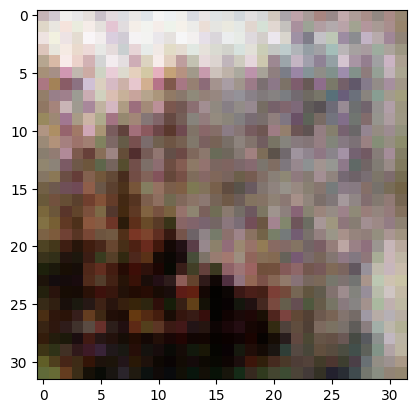

2/2 [==============================] - 0s 249ms/step
>20, 33/39, d1=0.604, d2=0.558 g=1.337


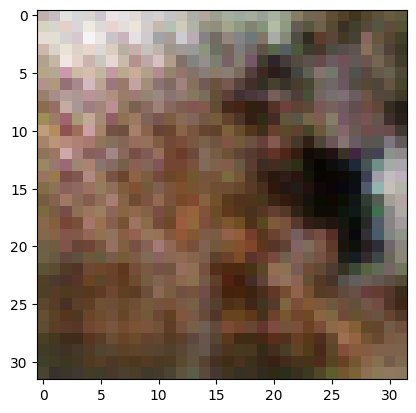

2/2 [==============================] - 0s 242ms/step
>20, 34/39, d1=0.676, d2=0.771 g=1.238


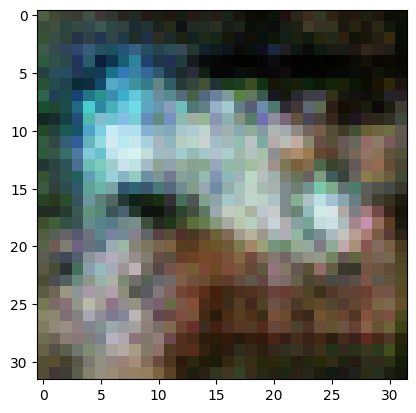

2/2 [==============================] - 0s 241ms/step
>20, 35/39, d1=0.615, d2=0.592 g=1.192


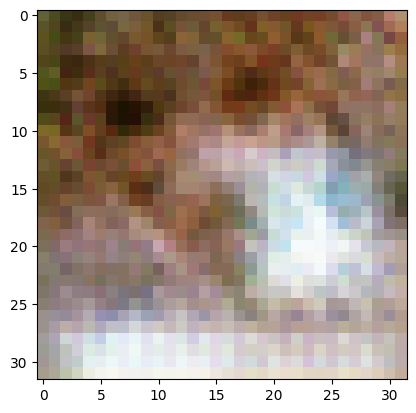

2/2 [==============================] - 0s 241ms/step
>20, 36/39, d1=0.564, d2=0.582 g=1.157


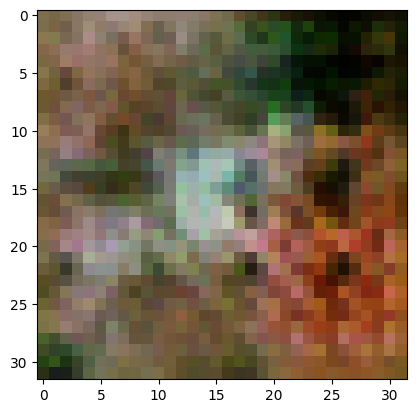

2/2 [==============================] - 0s 301ms/step
>20, 37/39, d1=0.540, d2=0.664 g=1.134


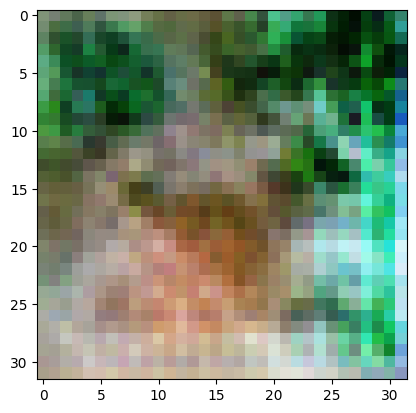

2/2 [==============================] - 0s 247ms/step
>20, 38/39, d1=0.668, d2=0.584 g=1.101


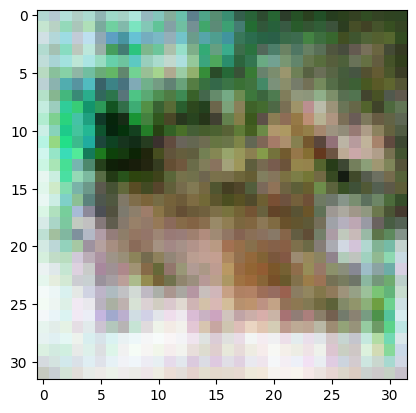

2/2 [==============================] - 0s 242ms/step
>20, 39/39, d1=0.581, d2=0.589 g=1.171


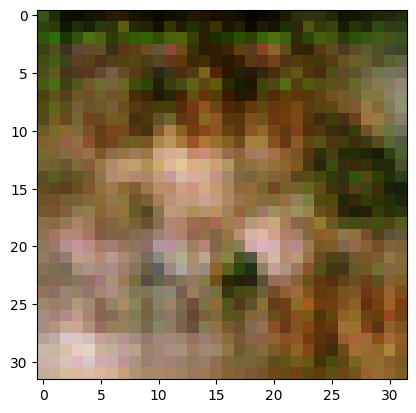

5/5 [==============================] - 1s 257ms/step
>Accuracy real: 55%, fake: 92%


2/2 [==============================] - 0s 248ms/step
>21, 1/39, d1=0.507, d2=0.522 g=1.388


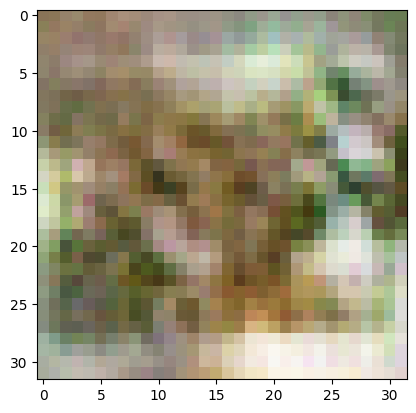

2/2 [==============================] - 0s 248ms/step
>21, 2/39, d1=0.604, d2=0.560 g=1.568


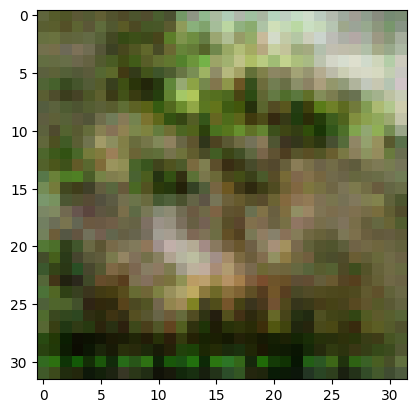

2/2 [==============================] - 1s 278ms/step
>21, 3/39, d1=0.622, d2=0.597 g=1.401


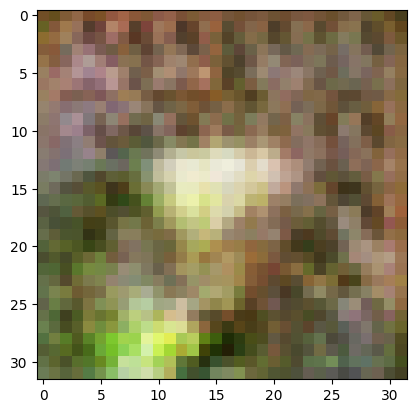

2/2 [==============================] - 0s 244ms/step
>21, 4/39, d1=0.699, d2=1.191 g=1.546


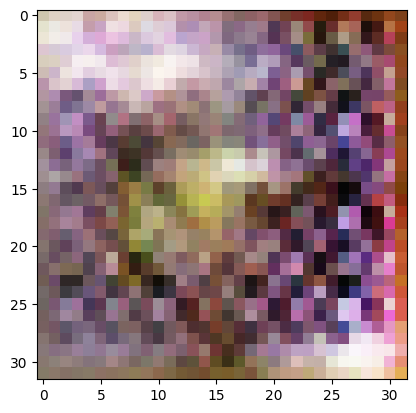

2/2 [==============================] - 0s 243ms/step
>21, 5/39, d1=0.780, d2=0.477 g=1.475


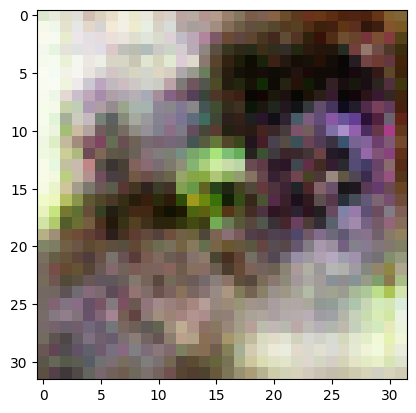

2/2 [==============================] - 1s 312ms/step
>21, 6/39, d1=0.787, d2=0.571 g=1.277


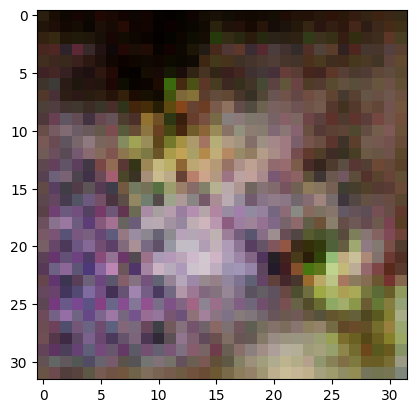

2/2 [==============================] - 0s 259ms/step
>21, 7/39, d1=0.690, d2=0.639 g=1.075


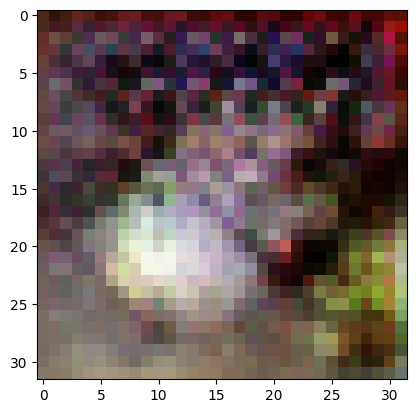

2/2 [==============================] - 0s 257ms/step
>21, 8/39, d1=0.611, d2=0.679 g=1.036


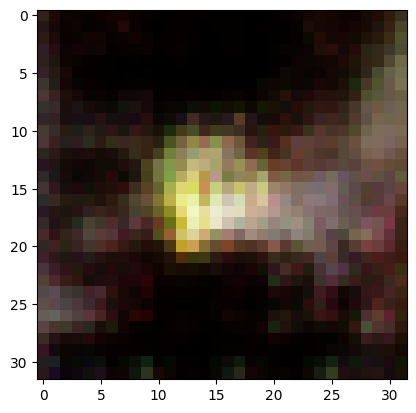

2/2 [==============================] - 1s 255ms/step
>21, 9/39, d1=0.616, d2=0.692 g=1.134


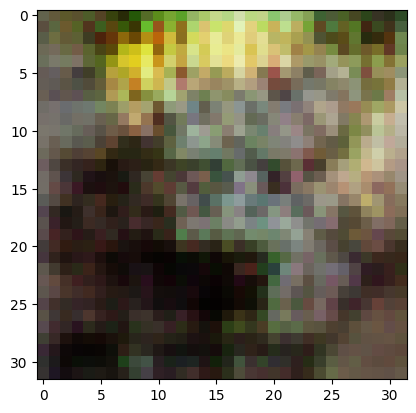

2/2 [==============================] - 0s 261ms/step
>21, 10/39, d1=0.593, d2=0.688 g=1.234


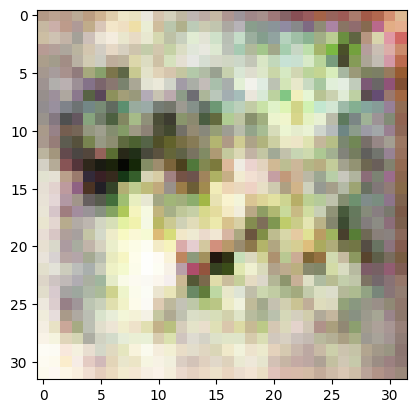

2/2 [==============================] - 0s 281ms/step
>21, 11/39, d1=0.712, d2=0.805 g=1.329


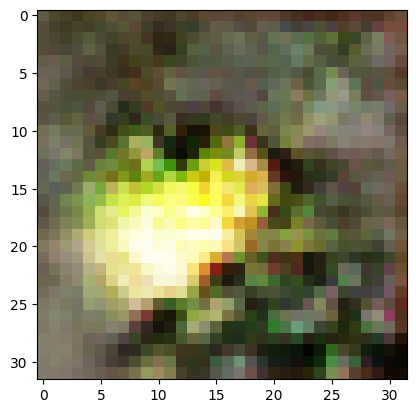

2/2 [==============================] - 0s 252ms/step
>21, 12/39, d1=0.728, d2=0.518 g=1.340


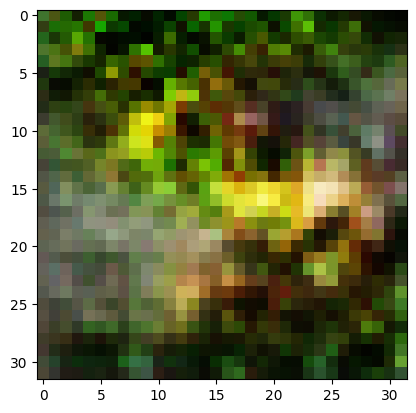

2/2 [==============================] - 0s 251ms/step
>21, 13/39, d1=0.651, d2=0.512 g=1.206


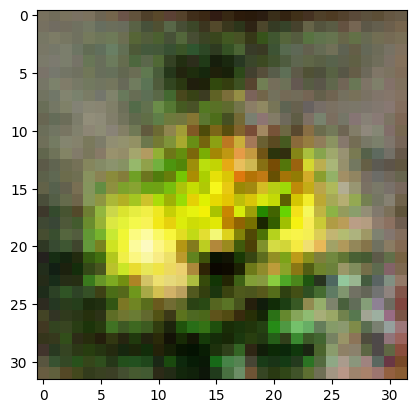

2/2 [==============================] - 0s 250ms/step
>21, 14/39, d1=0.574, d2=0.687 g=1.075


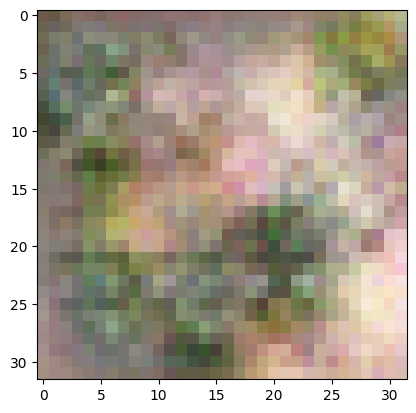

2/2 [==============================] - 0s 262ms/step
>21, 15/39, d1=0.580, d2=0.756 g=1.004


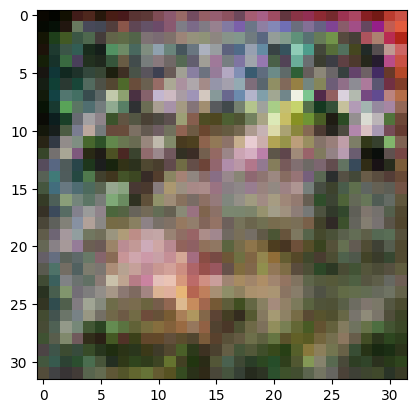

2/2 [==============================] - 0s 250ms/step
>21, 16/39, d1=0.517, d2=0.656 g=1.128


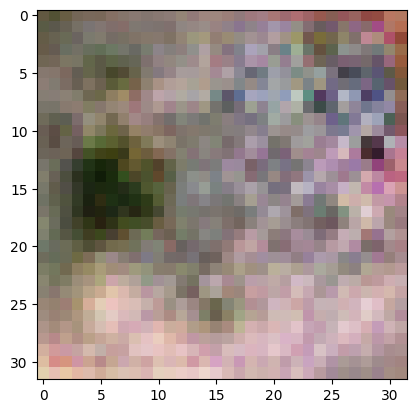

2/2 [==============================] - 1s 299ms/step
>21, 17/39, d1=0.604, d2=0.627 g=1.224


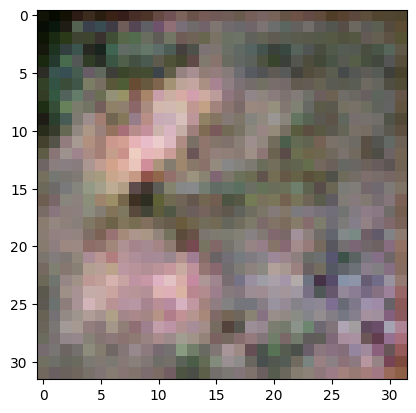

2/2 [==============================] - 0s 249ms/step
>21, 18/39, d1=0.567, d2=0.622 g=1.371


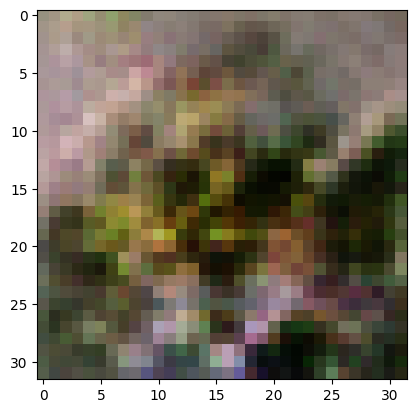

2/2 [==============================] - 0s 254ms/step
>21, 19/39, d1=0.558, d2=0.565 g=1.274


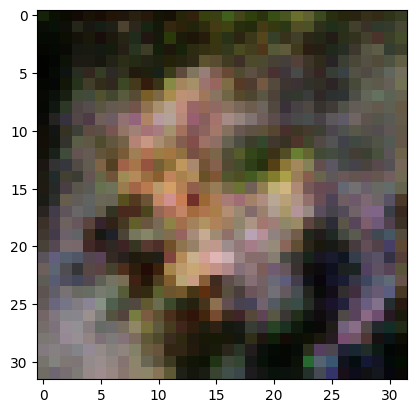

2/2 [==============================] - 1s 281ms/step
>21, 20/39, d1=0.536, d2=0.765 g=1.181


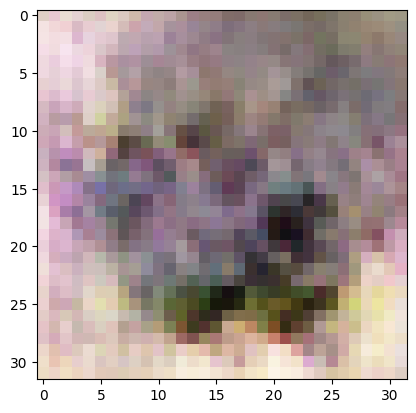

2/2 [==============================] - 0s 257ms/step
>21, 21/39, d1=0.636, d2=0.831 g=1.242


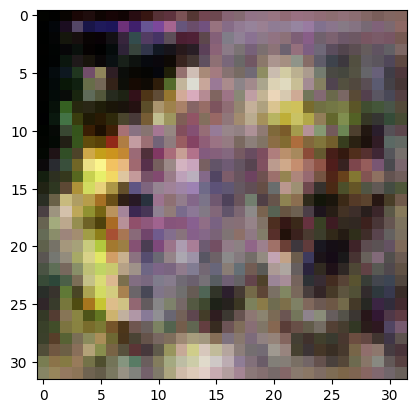

2/2 [==============================] - 0s 259ms/step
>21, 22/39, d1=0.828, d2=0.796 g=1.242


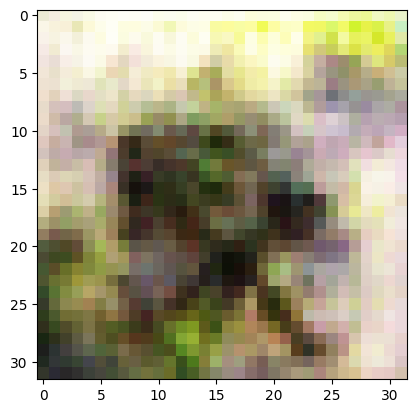

2/2 [==============================] - 1s 286ms/step
>21, 23/39, d1=0.921, d2=0.585 g=1.154


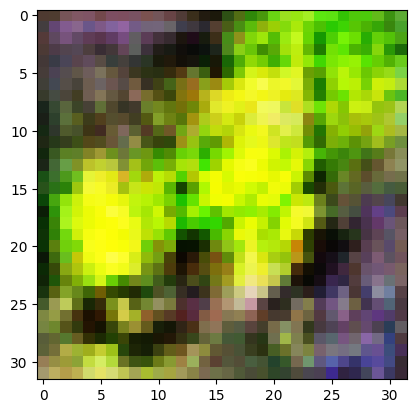

2/2 [==============================] - 0s 270ms/step
>21, 24/39, d1=0.763, d2=0.549 g=1.202


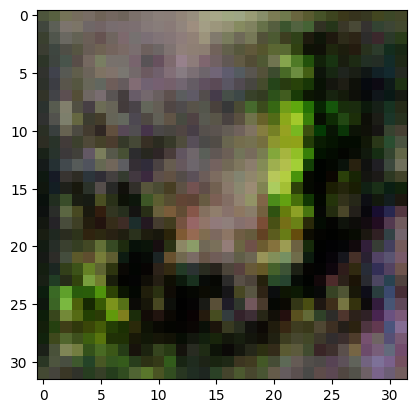

2/2 [==============================] - 0s 264ms/step
>21, 25/39, d1=0.739, d2=0.637 g=1.129


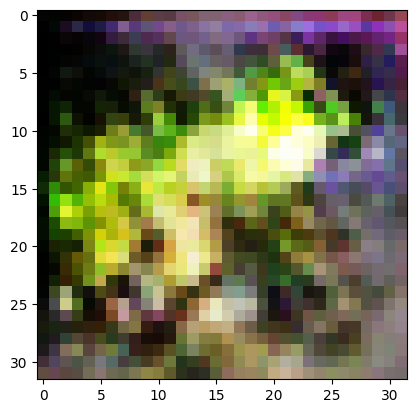

2/2 [==============================] - 0s 252ms/step
>21, 26/39, d1=0.756, d2=0.632 g=1.127


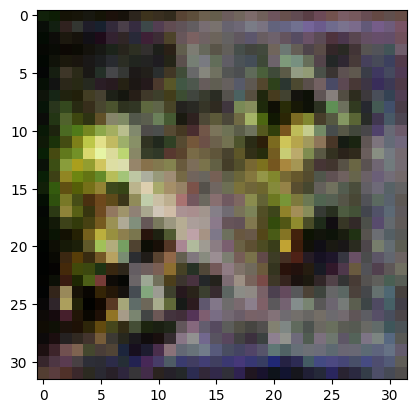

2/2 [==============================] - 0s 271ms/step
>21, 27/39, d1=0.740, d2=0.654 g=1.104


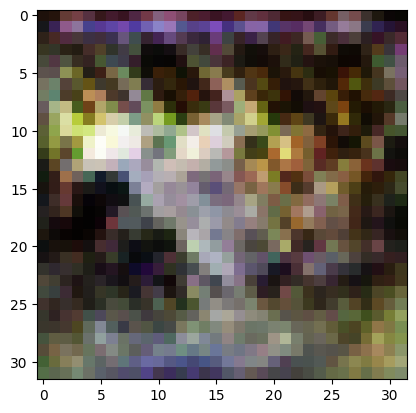

2/2 [==============================] - 0s 258ms/step
>21, 28/39, d1=0.629, d2=0.577 g=1.074


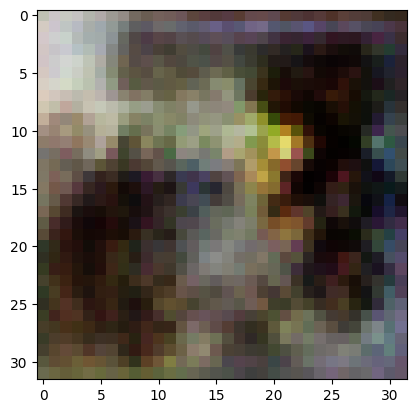

2/2 [==============================] - 0s 251ms/step
>21, 29/39, d1=0.658, d2=0.668 g=1.131


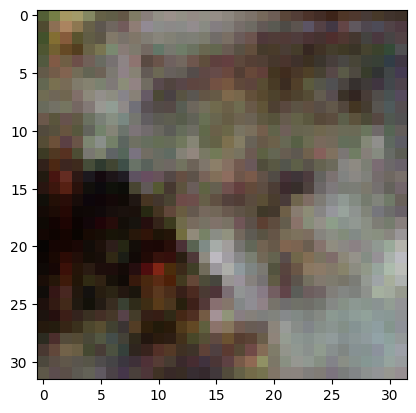

2/2 [==============================] - 0s 261ms/step
>21, 30/39, d1=0.650, d2=0.665 g=1.134


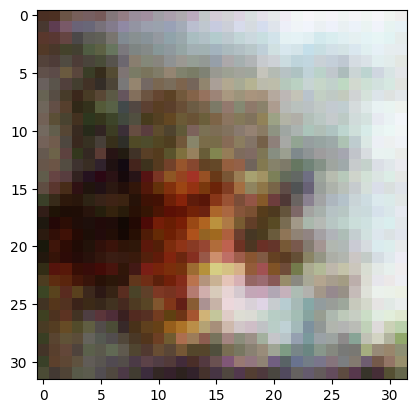

2/2 [==============================] - 1s 340ms/step
>21, 31/39, d1=0.619, d2=0.577 g=1.108


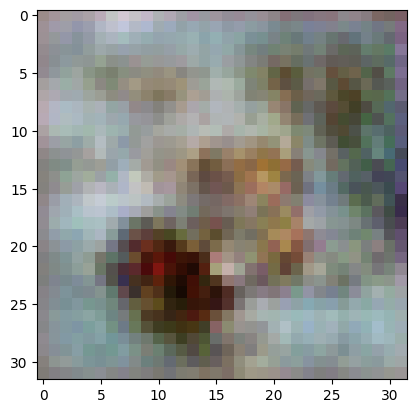

2/2 [==============================] - 0s 255ms/step
>21, 32/39, d1=0.635, d2=0.530 g=1.112


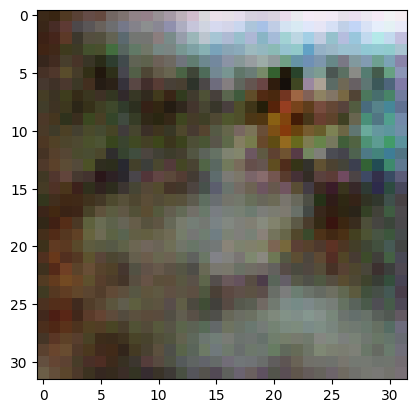

2/2 [==============================] - 0s 271ms/step
>21, 33/39, d1=0.559, d2=0.681 g=1.055


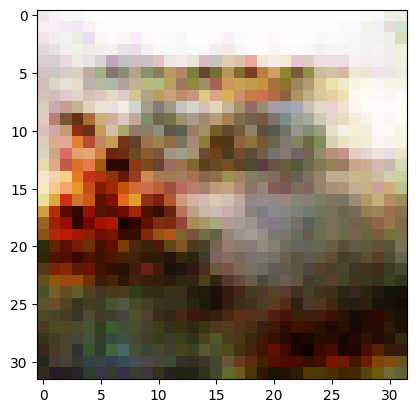

2/2 [==============================] - 1s 275ms/step
>21, 34/39, d1=0.486, d2=0.717 g=1.130


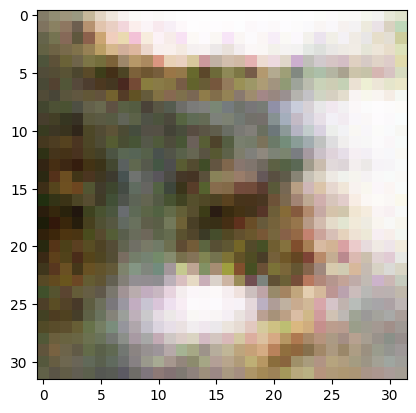

2/2 [==============================] - 0s 252ms/step
>21, 35/39, d1=0.551, d2=0.688 g=1.182


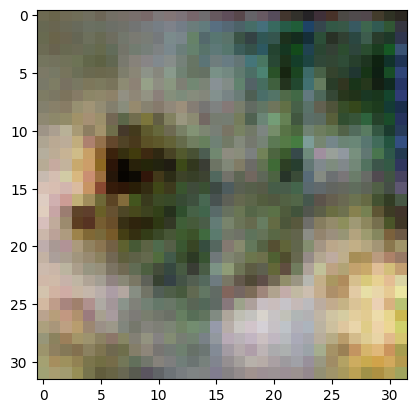

2/2 [==============================] - 1s 273ms/step
>21, 36/39, d1=0.578, d2=0.659 g=1.287


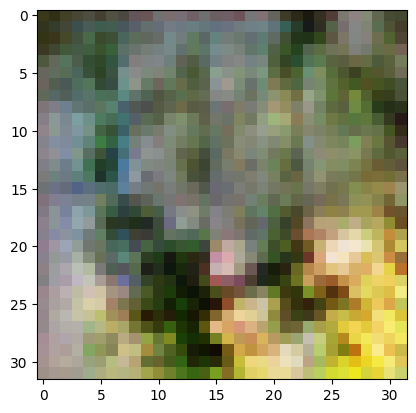

2/2 [==============================] - 1s 334ms/step
>21, 37/39, d1=0.612, d2=0.544 g=1.271


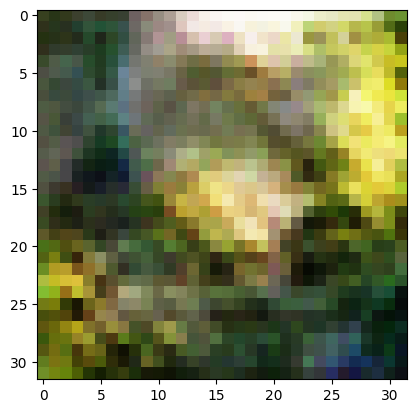

2/2 [==============================] - 0s 261ms/step
>21, 38/39, d1=0.723, d2=0.690 g=1.339


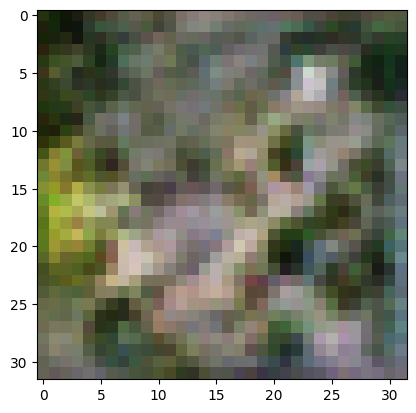

2/2 [==============================] - 0s 251ms/step
>21, 39/39, d1=0.698, d2=0.608 g=1.370


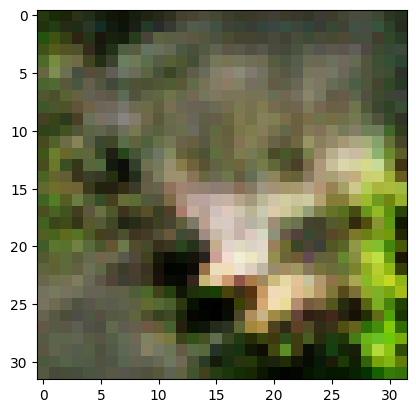

2/2 [==============================] - 0s 257ms/step
>22, 1/39, d1=0.756, d2=0.476 g=1.384


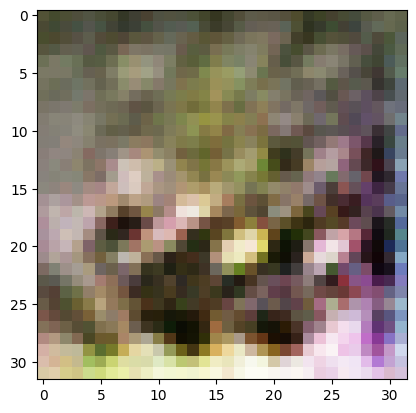

2/2 [==============================] - 0s 250ms/step
>22, 2/39, d1=0.731, d2=0.605 g=1.392


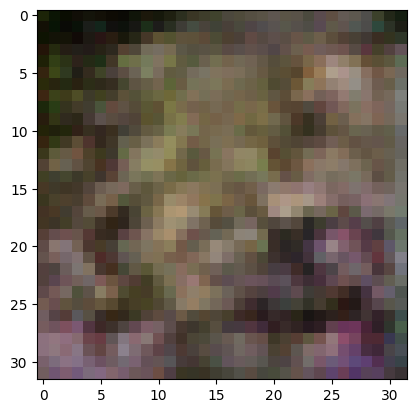

2/2 [==============================] - 0s 260ms/step
>22, 3/39, d1=0.661, d2=0.573 g=1.289


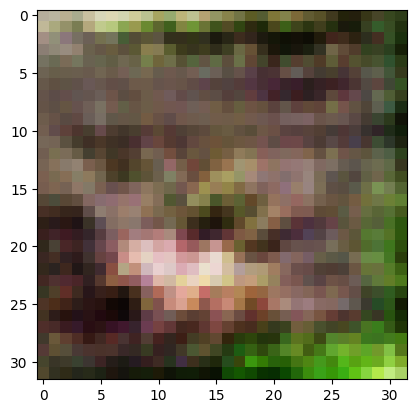

2/2 [==============================] - 0s 260ms/step
>22, 4/39, d1=0.697, d2=0.585 g=1.159


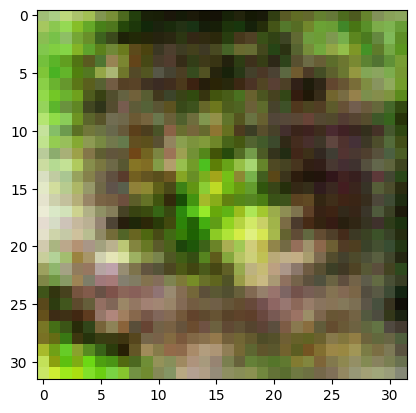

2/2 [==============================] - 0s 252ms/step
>22, 5/39, d1=0.601, d2=0.587 g=1.153


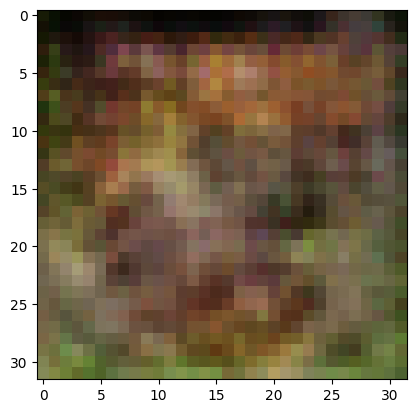

2/2 [==============================] - 0s 264ms/step
>22, 6/39, d1=0.560, d2=0.590 g=1.111


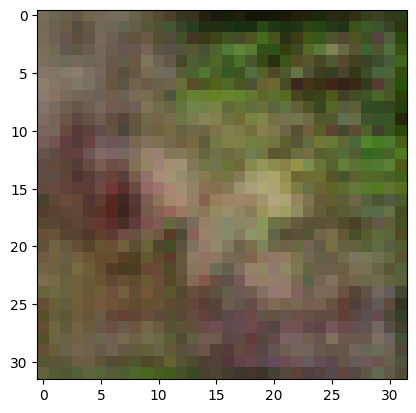

2/2 [==============================] - 0s 247ms/step
>22, 7/39, d1=0.589, d2=0.724 g=1.029


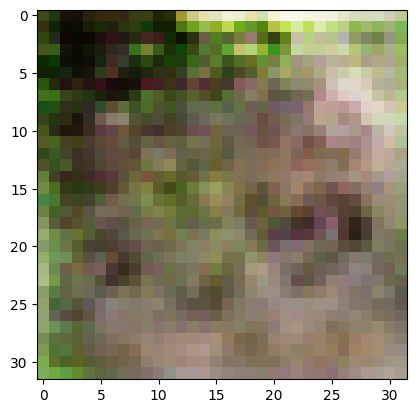

2/2 [==============================] - 0s 266ms/step
>22, 8/39, d1=0.525, d2=0.799 g=1.093


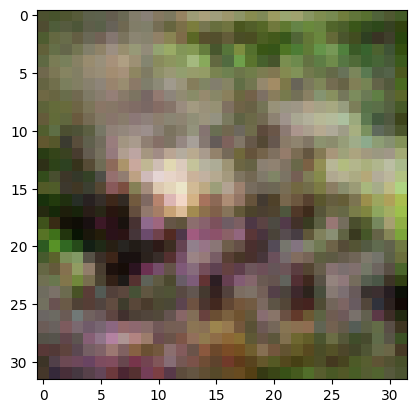

2/2 [==============================] - 1s 282ms/step
>22, 9/39, d1=0.696, d2=0.777 g=1.122


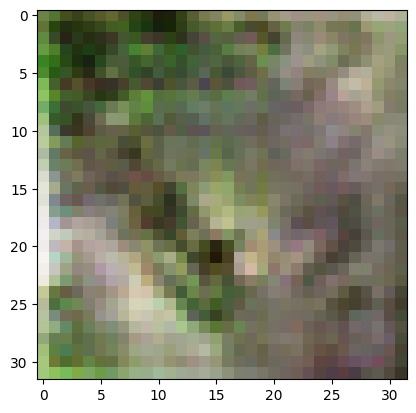

2/2 [==============================] - 0s 277ms/step
>22, 10/39, d1=0.559, d2=0.668 g=1.231


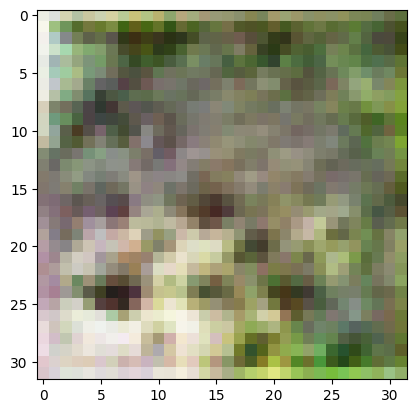

2/2 [==============================] - 0s 266ms/step
>22, 11/39, d1=0.653, d2=0.568 g=1.345


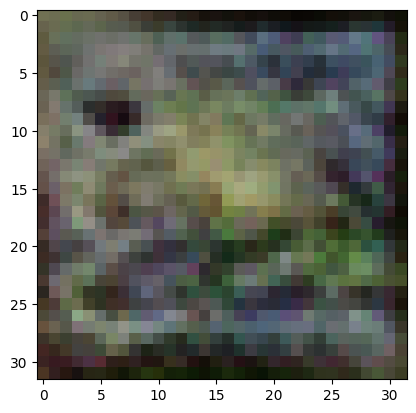

2/2 [==============================] - 1s 363ms/step
>22, 12/39, d1=0.643, d2=0.697 g=1.468


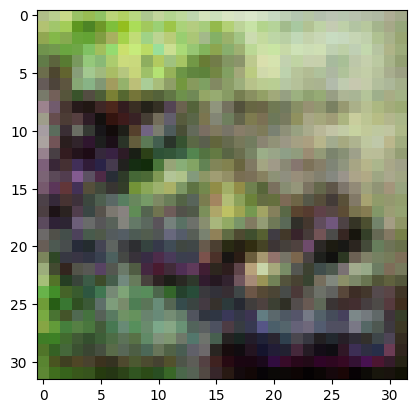

2/2 [==============================] - 0s 263ms/step
>22, 13/39, d1=0.582, d2=0.548 g=1.492


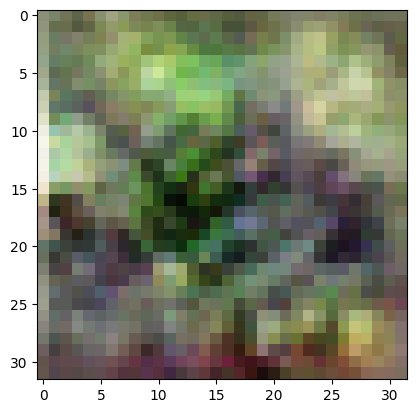

2/2 [==============================] - 0s 258ms/step
>22, 14/39, d1=0.579, d2=0.693 g=1.561


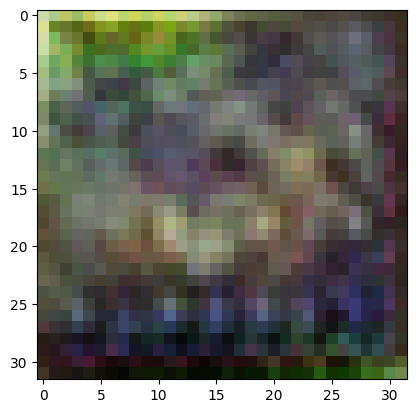

2/2 [==============================] - 0s 266ms/step
>22, 15/39, d1=0.653, d2=0.633 g=1.528


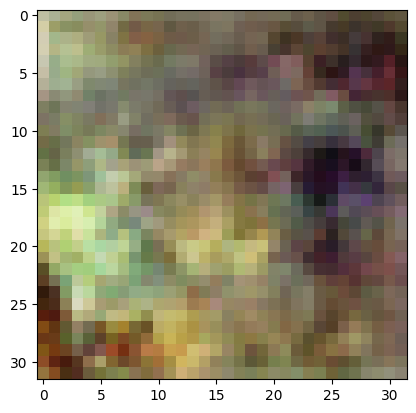

2/2 [==============================] - 0s 268ms/step
>22, 16/39, d1=0.746, d2=0.561 g=1.397


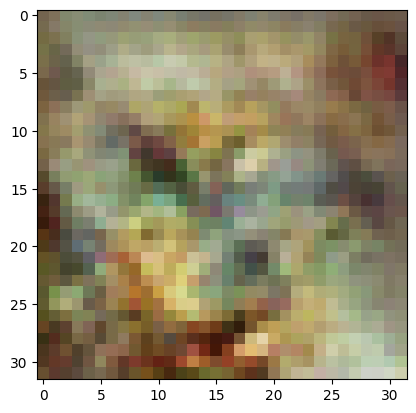

2/2 [==============================] - 0s 271ms/step
>22, 17/39, d1=0.859, d2=0.901 g=1.126


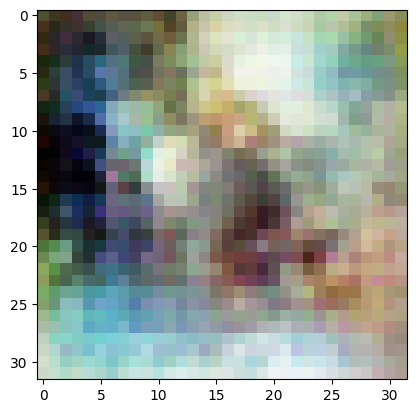

2/2 [==============================] - 0s 260ms/step
>22, 18/39, d1=0.787, d2=0.621 g=1.157


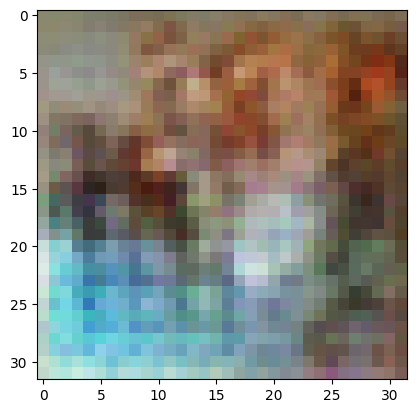

2/2 [==============================] - 0s 263ms/step
>22, 19/39, d1=0.764, d2=0.506 g=1.242


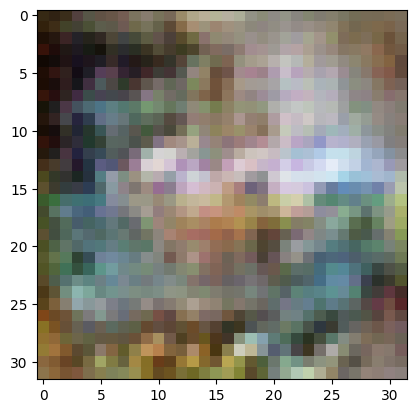

2/2 [==============================] - 1s 330ms/step
>22, 20/39, d1=0.712, d2=0.577 g=1.204


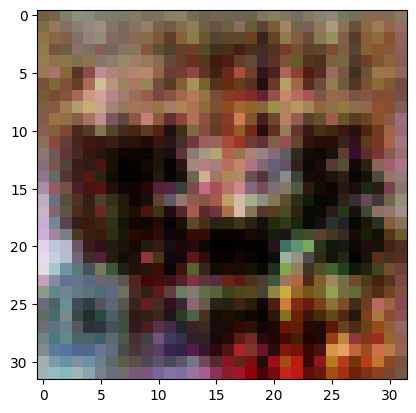

2/2 [==============================] - 0s 259ms/step
>22, 21/39, d1=0.594, d2=0.689 g=1.206


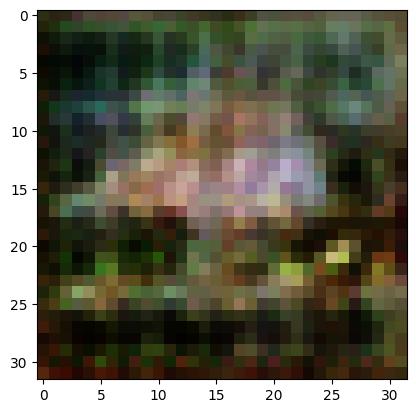

2/2 [==============================] - 0s 277ms/step
>22, 22/39, d1=0.665, d2=0.607 g=1.163


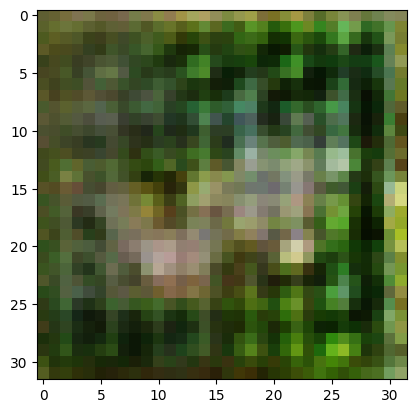

2/2 [==============================] - 1s 314ms/step
>22, 23/39, d1=0.625, d2=0.715 g=1.105


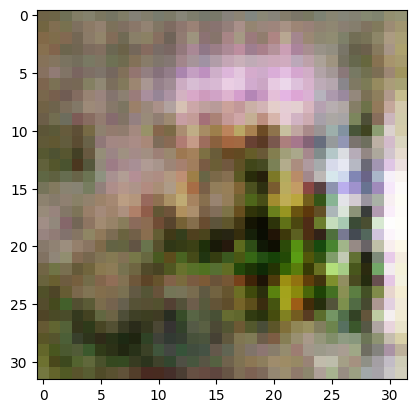

2/2 [==============================] - 0s 256ms/step
>22, 24/39, d1=0.599, d2=0.769 g=1.136


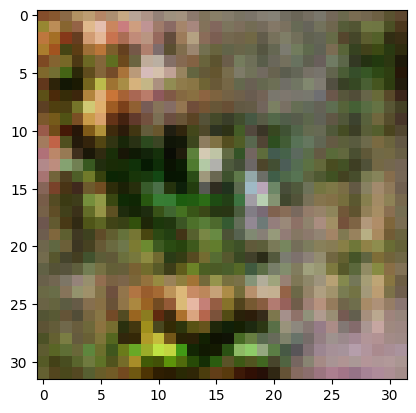

2/2 [==============================] - 0s 270ms/step
>22, 25/39, d1=0.792, d2=0.700 g=1.110


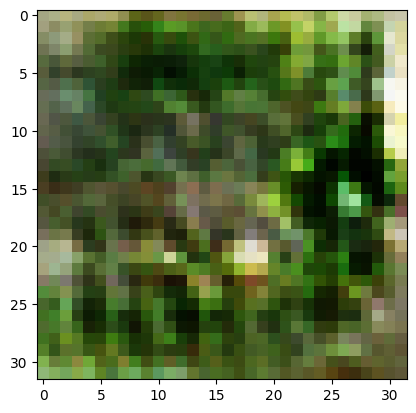

2/2 [==============================] - 1s 299ms/step
>22, 26/39, d1=0.663, d2=0.642 g=1.133


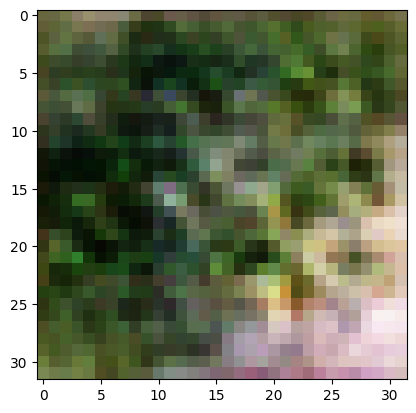

2/2 [==============================] - 0s 257ms/step
>22, 27/39, d1=0.703, d2=0.616 g=1.195


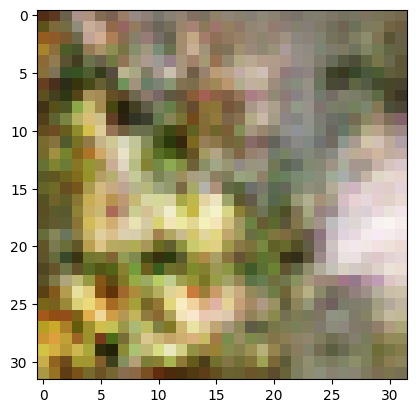

2/2 [==============================] - 0s 259ms/step
>22, 28/39, d1=0.642, d2=0.658 g=1.162


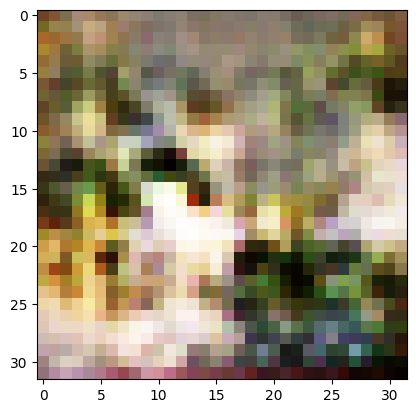

2/2 [==============================] - 0s 261ms/step
>22, 29/39, d1=0.572, d2=0.700 g=1.215


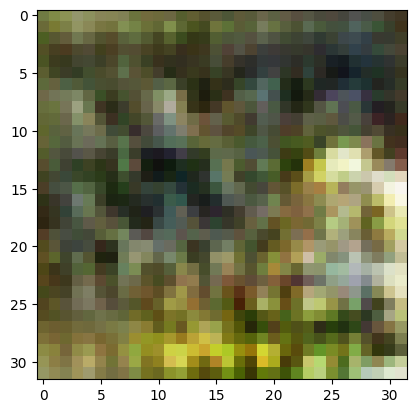

2/2 [==============================] - 0s 255ms/step
>22, 30/39, d1=0.579, d2=0.592 g=1.112


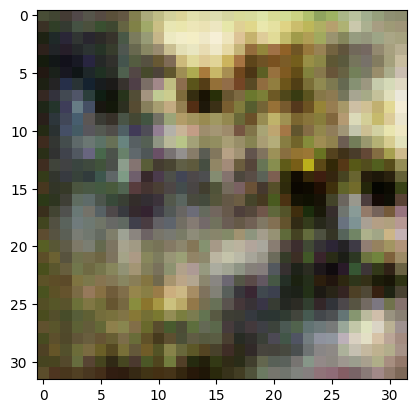

2/2 [==============================] - 0s 257ms/step
>22, 31/39, d1=0.657, d2=0.629 g=1.067


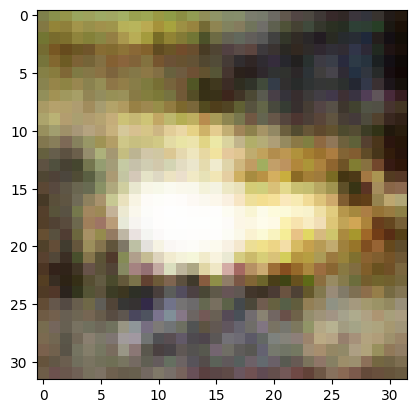

2/2 [==============================] - 0s 267ms/step
>22, 32/39, d1=0.555, d2=0.755 g=1.167


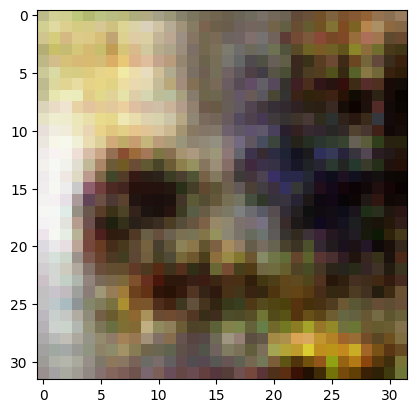

2/2 [==============================] - 0s 272ms/step
>22, 33/39, d1=0.612, d2=0.706 g=1.147


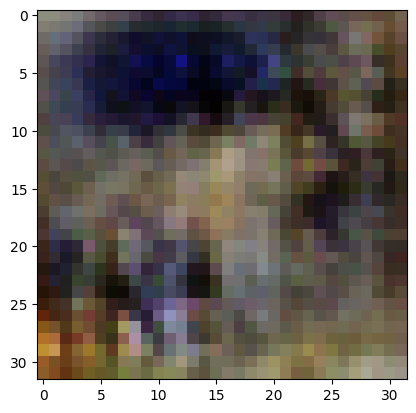

2/2 [==============================] - 1s 296ms/step
>22, 34/39, d1=0.620, d2=0.791 g=1.225


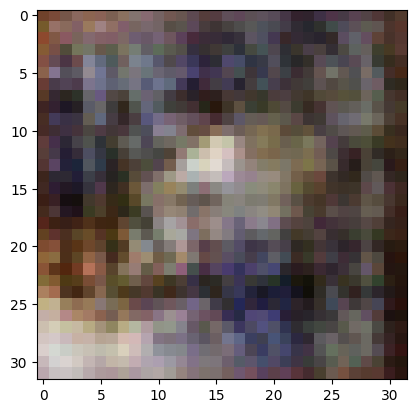

2/2 [==============================] - 0s 285ms/step
>22, 35/39, d1=0.768, d2=0.481 g=1.254


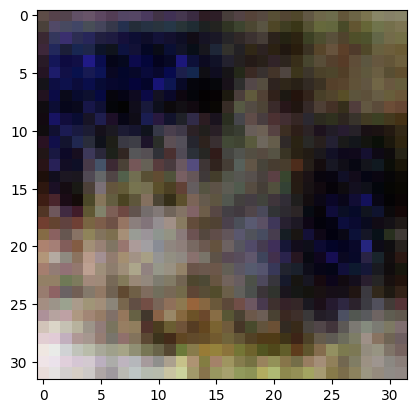

2/2 [==============================] - 0s 260ms/step
>22, 36/39, d1=0.604, d2=0.500 g=1.132


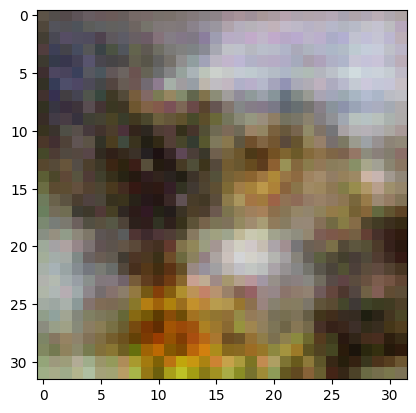

2/2 [==============================] - 1s 293ms/step
>22, 37/39, d1=0.585, d2=0.541 g=1.115


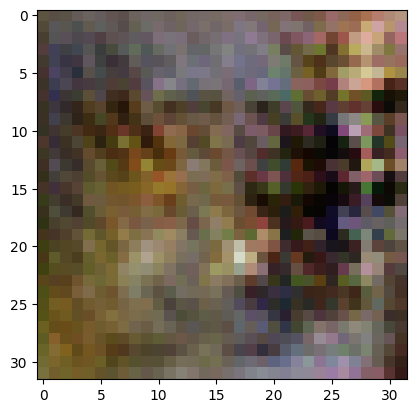

2/2 [==============================] - 0s 292ms/step
>22, 38/39, d1=0.599, d2=0.608 g=1.092


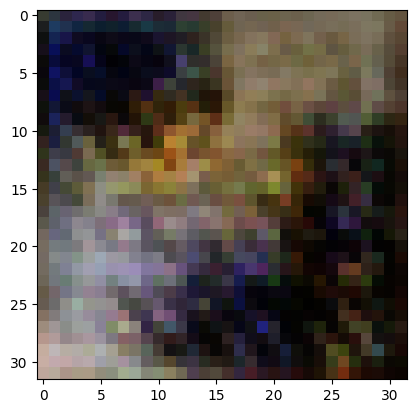

2/2 [==============================] - 0s 258ms/step
>22, 39/39, d1=0.479, d2=0.639 g=1.223


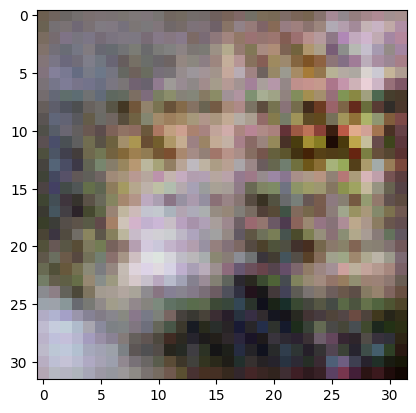

2/2 [==============================] - 1s 282ms/step
>23, 1/39, d1=0.532, d2=0.624 g=1.194


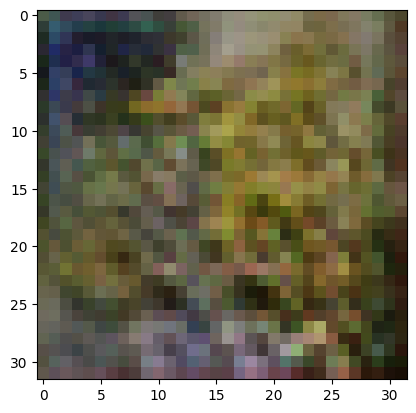

2/2 [==============================] - 0s 270ms/step
>23, 2/39, d1=0.601, d2=0.819 g=1.288


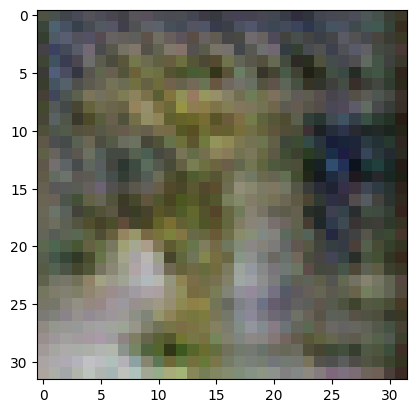

2/2 [==============================] - 1s 306ms/step
>23, 3/39, d1=0.732, d2=0.515 g=1.391


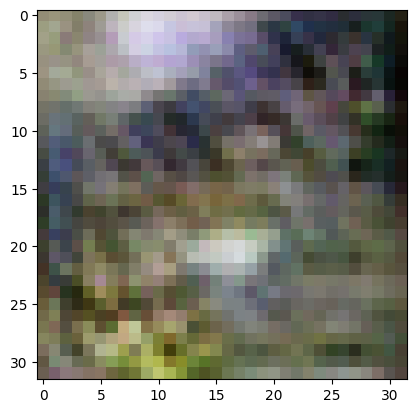

2/2 [==============================] - 0s 283ms/step
>23, 4/39, d1=0.708, d2=0.604 g=1.448


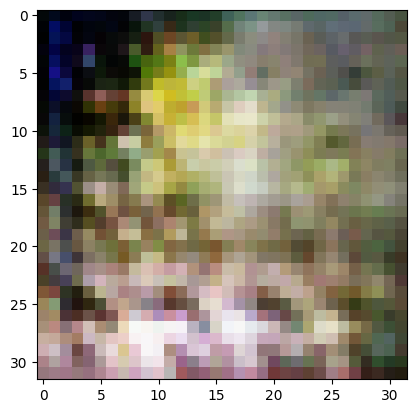

2/2 [==============================] - 0s 255ms/step
>23, 5/39, d1=0.604, d2=0.514 g=1.759


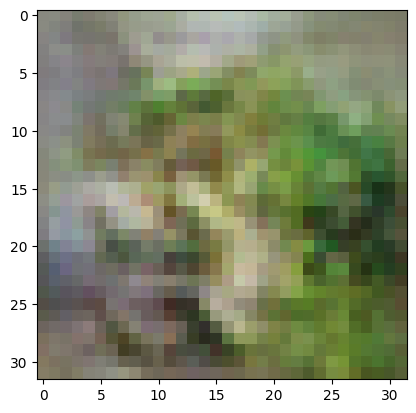

2/2 [==============================] - 0s 278ms/step
>23, 6/39, d1=0.554, d2=0.713 g=1.439


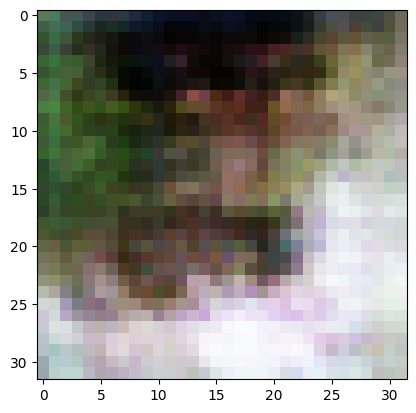

2/2 [==============================] - 0s 275ms/step
>23, 7/39, d1=0.593, d2=0.600 g=1.169


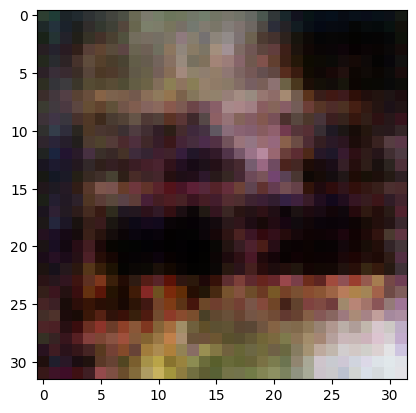

2/2 [==============================] - 0s 261ms/step
>23, 8/39, d1=0.761, d2=0.644 g=0.995


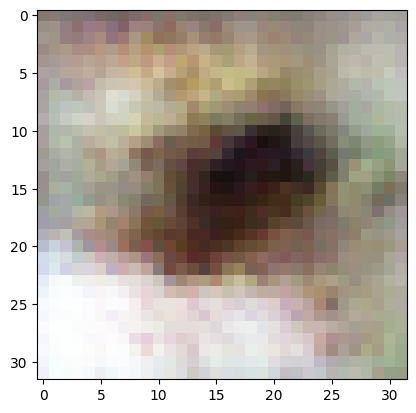

2/2 [==============================] - 1s 280ms/step
>23, 9/39, d1=0.599, d2=0.716 g=1.035


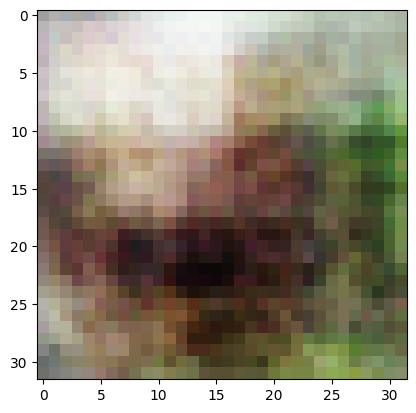

2/2 [==============================] - 0s 266ms/step
>23, 10/39, d1=0.600, d2=0.667 g=1.202


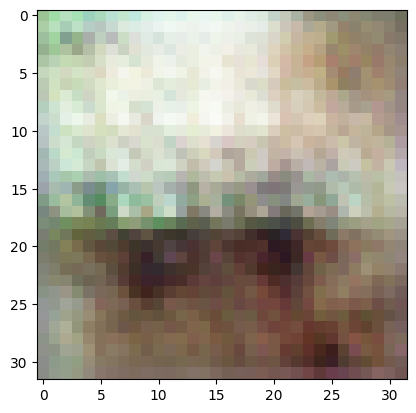

2/2 [==============================] - 0s 255ms/step
>23, 11/39, d1=0.617, d2=0.567 g=1.181


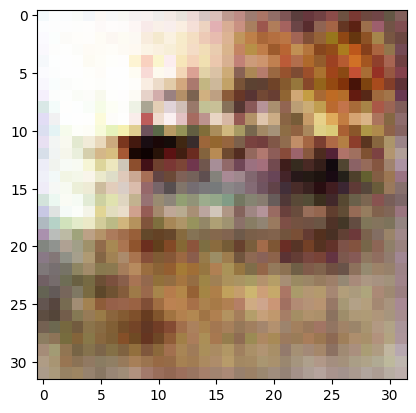

2/2 [==============================] - 1s 279ms/step
>23, 12/39, d1=0.575, d2=0.577 g=1.269


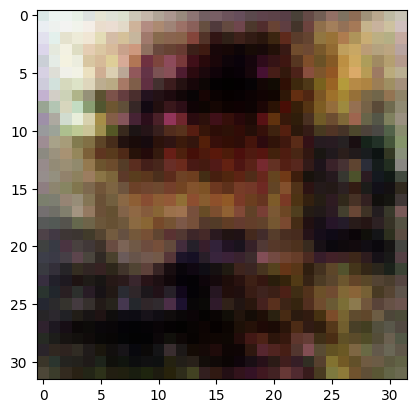

2/2 [==============================] - 0s 260ms/step
>23, 13/39, d1=0.604, d2=0.588 g=1.392


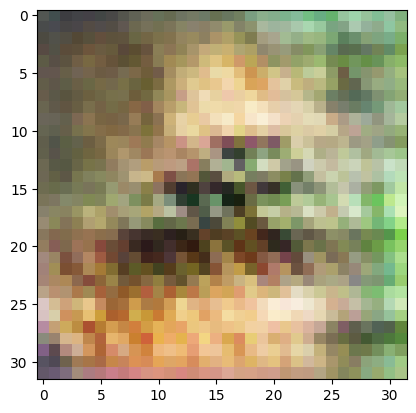

2/2 [==============================] - 0s 264ms/step
>23, 14/39, d1=0.620, d2=0.463 g=1.423


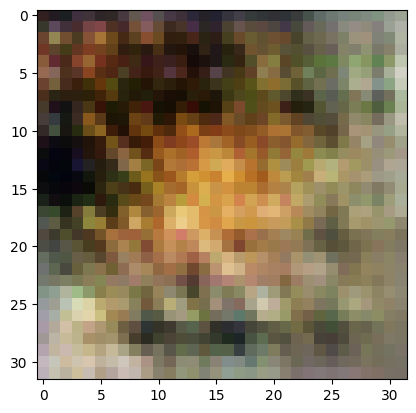

2/2 [==============================] - 1s 278ms/step
>23, 15/39, d1=0.540, d2=0.520 g=1.384


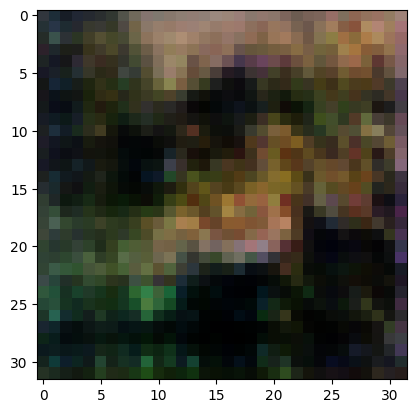

2/2 [==============================] - 0s 263ms/step
>23, 16/39, d1=0.513, d2=0.834 g=1.338


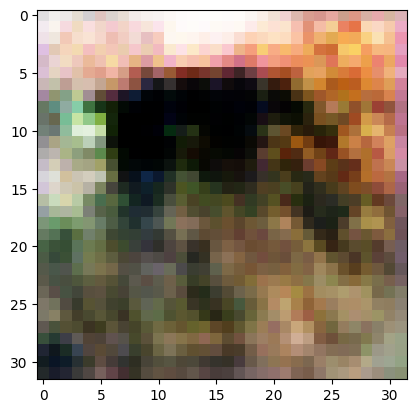

2/2 [==============================] - 0s 270ms/step
>23, 17/39, d1=0.662, d2=0.641 g=1.293


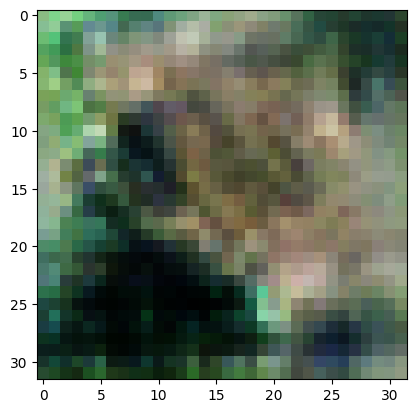

2/2 [==============================] - 0s 282ms/step
>23, 18/39, d1=0.714, d2=0.743 g=1.124


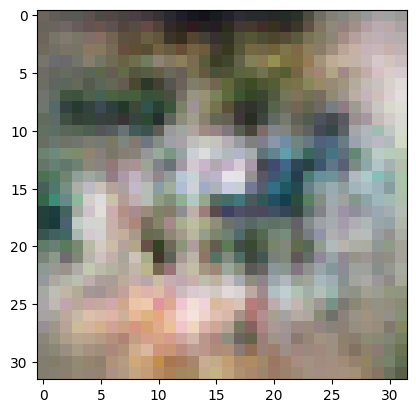

2/2 [==============================] - 0s 261ms/step
>23, 19/39, d1=0.721, d2=0.775 g=1.198


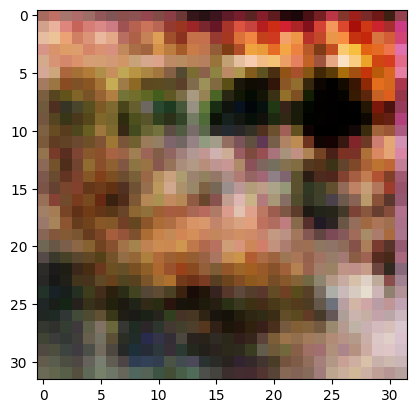

2/2 [==============================] - 0s 259ms/step
>23, 20/39, d1=0.829, d2=0.781 g=1.199


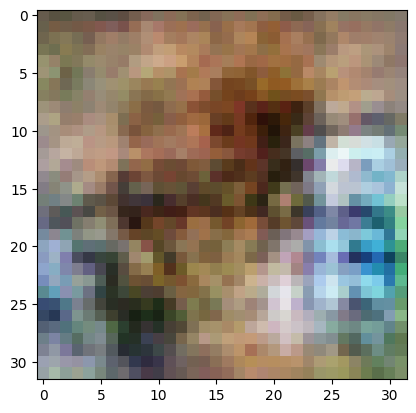

2/2 [==============================] - 0s 262ms/step
>23, 21/39, d1=0.817, d2=0.576 g=1.116


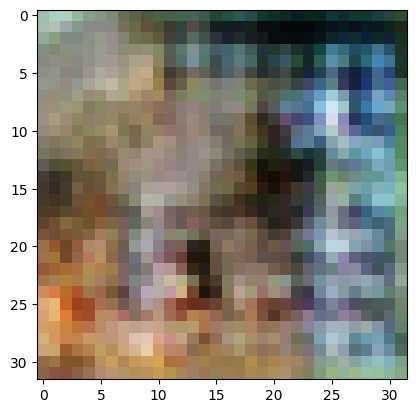

2/2 [==============================] - 0s 268ms/step
>23, 22/39, d1=0.764, d2=0.663 g=1.056


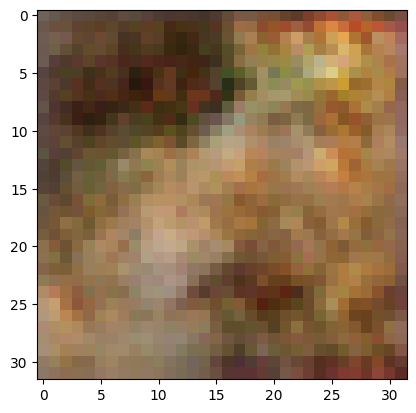

2/2 [==============================] - 1s 277ms/step
>23, 23/39, d1=0.717, d2=0.640 g=1.044


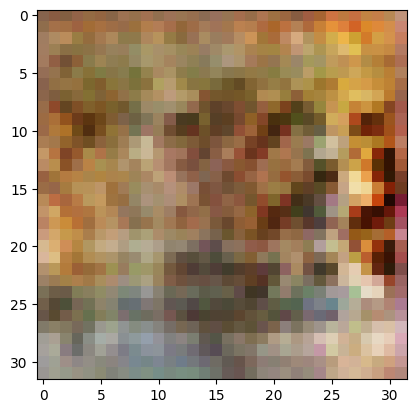

2/2 [==============================] - 0s 267ms/step
>23, 24/39, d1=0.708, d2=0.610 g=0.983


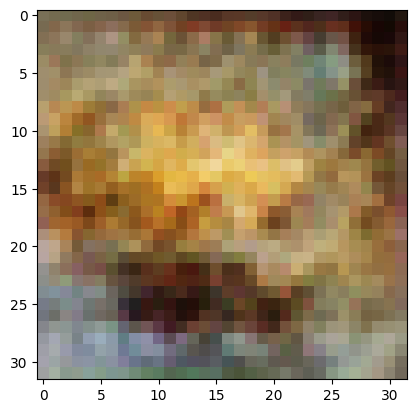

2/2 [==============================] - 0s 272ms/step
>23, 25/39, d1=0.655, d2=0.720 g=1.008


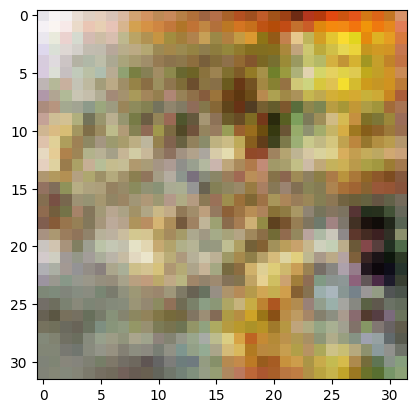

2/2 [==============================] - 1s 266ms/step
>23, 26/39, d1=0.560, d2=0.665 g=0.982


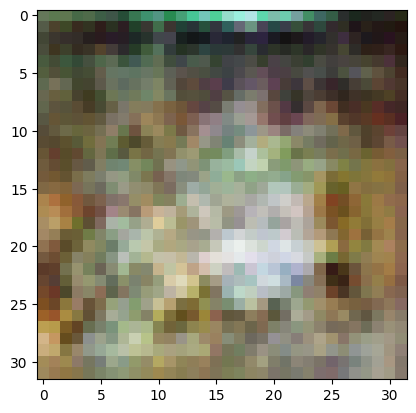

2/2 [==============================] - 0s 278ms/step
>23, 27/39, d1=0.627, d2=0.655 g=0.998


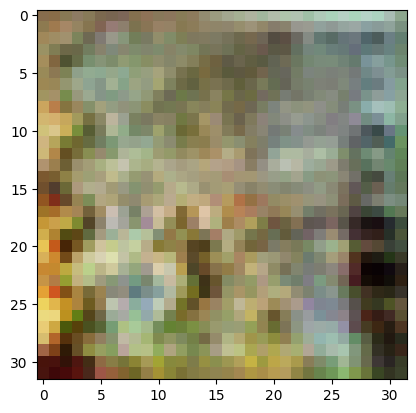

2/2 [==============================] - 0s 261ms/step
>23, 28/39, d1=0.522, d2=0.739 g=1.084


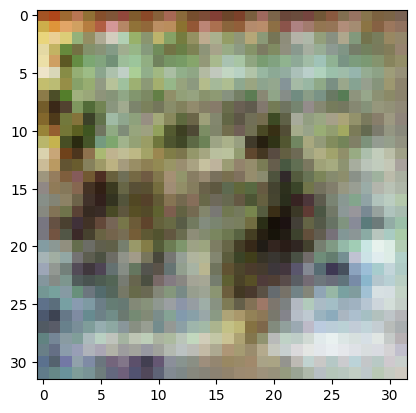

2/2 [==============================] - 1s 303ms/step
>23, 29/39, d1=0.652, d2=0.593 g=1.289


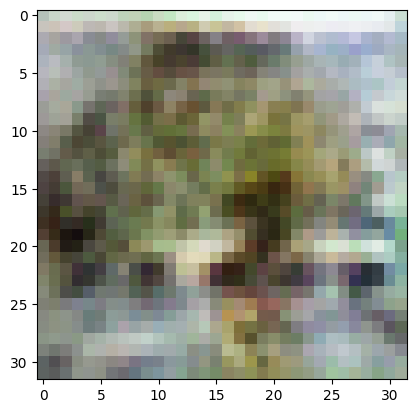

2/2 [==============================] - 0s 265ms/step
>23, 30/39, d1=0.660, d2=0.557 g=1.203


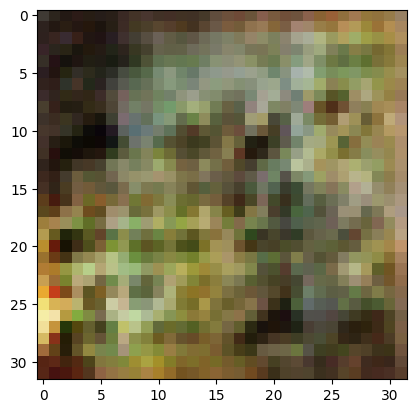

2/2 [==============================] - 0s 263ms/step
>23, 31/39, d1=0.571, d2=0.594 g=1.217


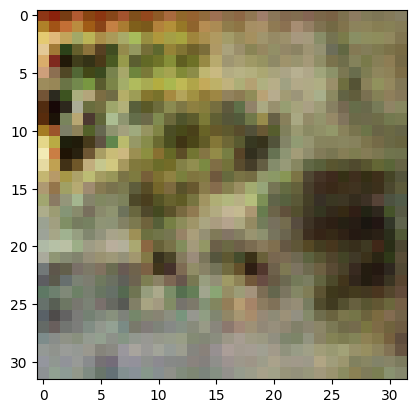

2/2 [==============================] - 0s 267ms/step
>23, 32/39, d1=0.623, d2=0.843 g=1.188


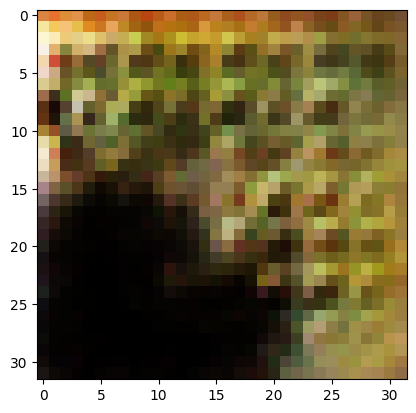

2/2 [==============================] - 0s 275ms/step
>23, 33/39, d1=0.722, d2=0.665 g=1.191


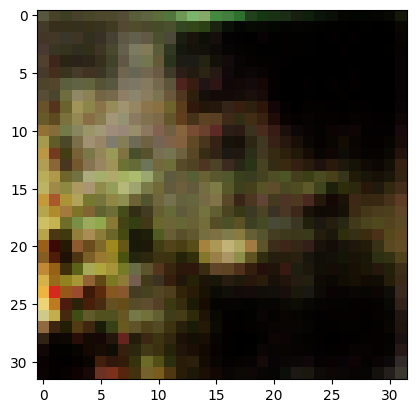

2/2 [==============================] - 0s 272ms/step
>23, 34/39, d1=0.785, d2=0.545 g=1.176


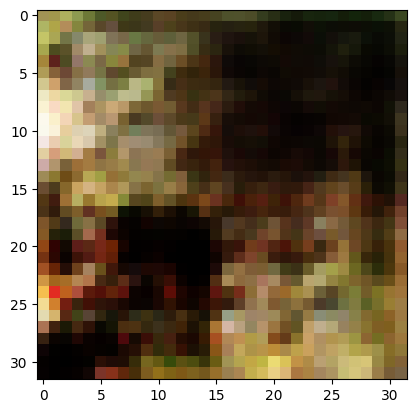

2/2 [==============================] - 0s 279ms/step
>23, 35/39, d1=0.824, d2=0.677 g=1.170


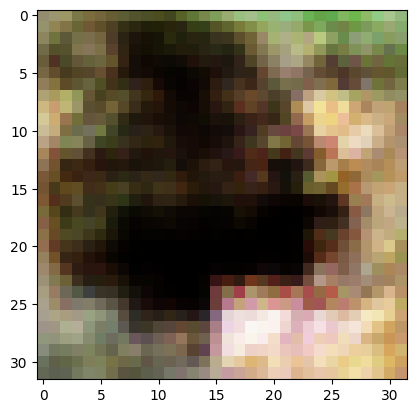

2/2 [==============================] - 0s 261ms/step
>23, 36/39, d1=0.777, d2=0.570 g=1.269


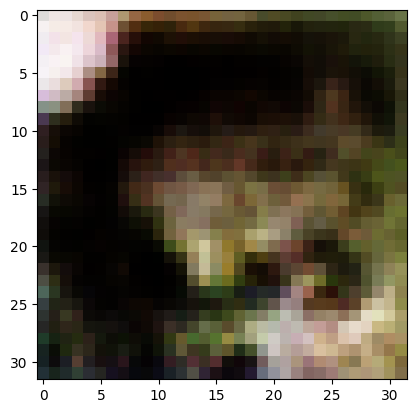

2/2 [==============================] - 1s 278ms/step
>23, 37/39, d1=0.750, d2=0.529 g=1.217


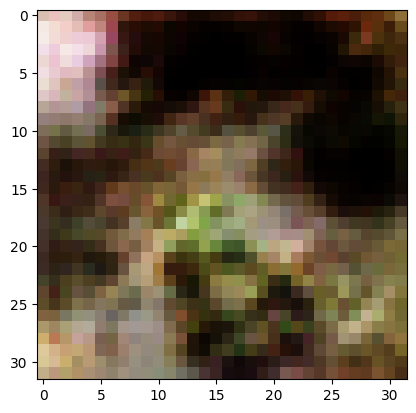

2/2 [==============================] - 0s 256ms/step
>23, 38/39, d1=0.711, d2=0.720 g=1.238


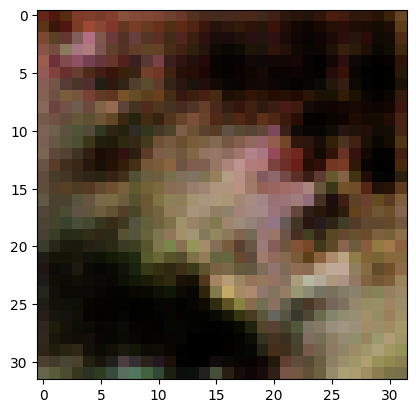

2/2 [==============================] - 0s 267ms/step
>23, 39/39, d1=0.706, d2=0.542 g=1.239


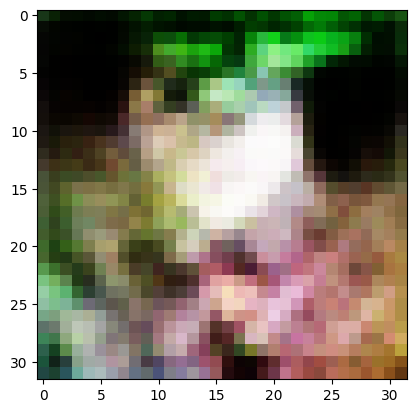

2/2 [==============================] - 1s 267ms/step
>24, 1/39, d1=0.766, d2=0.561 g=1.350


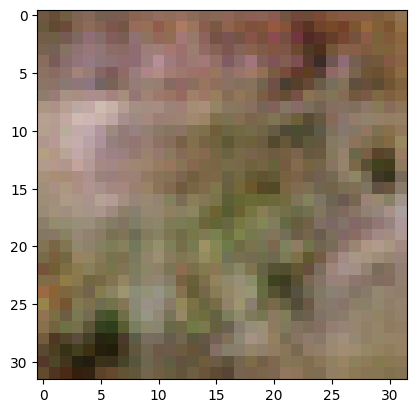

2/2 [==============================] - 0s 279ms/step
>24, 2/39, d1=0.768, d2=0.487 g=1.121


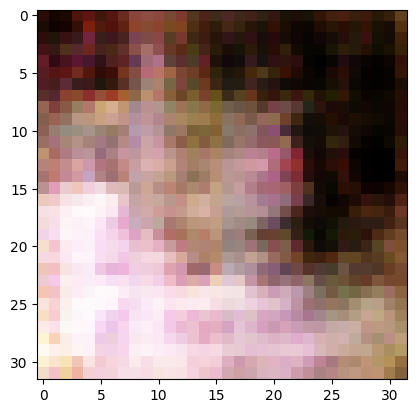

2/2 [==============================] - 0s 262ms/step
>24, 3/39, d1=0.620, d2=0.633 g=1.076


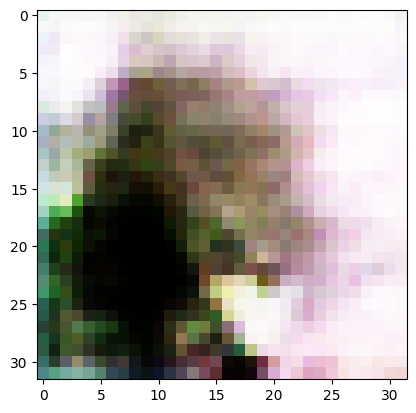

2/2 [==============================] - 0s 276ms/step
>24, 4/39, d1=0.597, d2=0.664 g=0.977


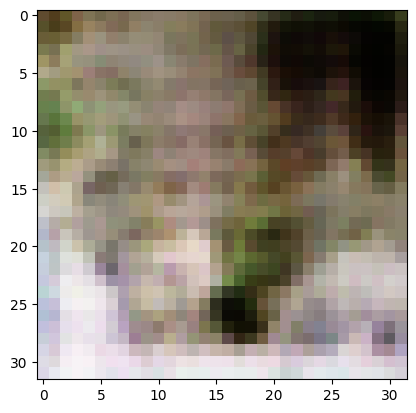

2/2 [==============================] - 0s 276ms/step
>24, 5/39, d1=0.570, d2=0.707 g=1.064


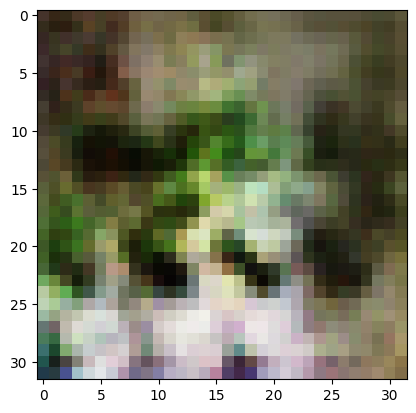

2/2 [==============================] - 0s 263ms/step
>24, 6/39, d1=0.579, d2=0.572 g=1.060


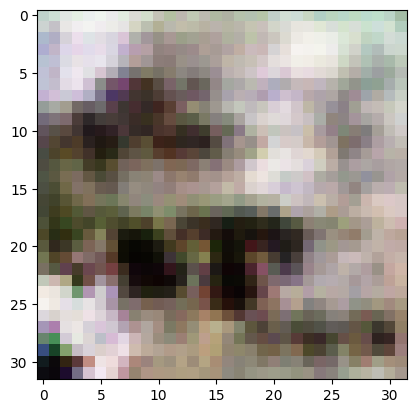

2/2 [==============================] - 0s 271ms/step
>24, 7/39, d1=0.529, d2=0.675 g=1.078


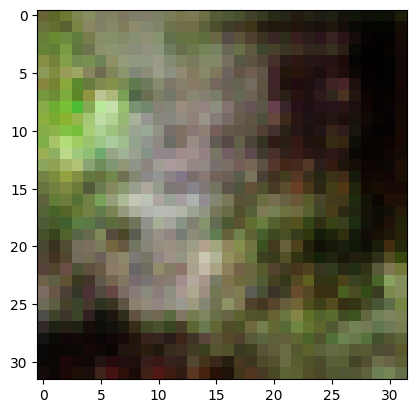

2/2 [==============================] - 1s 279ms/step
>24, 8/39, d1=0.498, d2=0.759 g=1.117


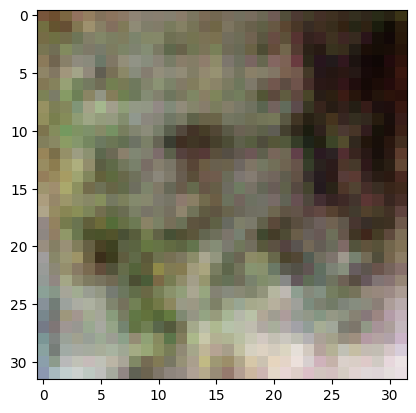

2/2 [==============================] - 1s 300ms/step
>24, 9/39, d1=0.571, d2=0.568 g=1.175


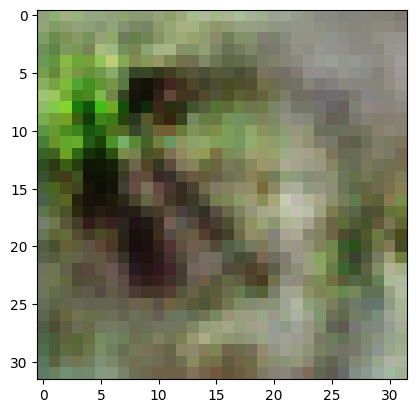

2/2 [==============================] - 0s 263ms/step
>24, 10/39, d1=0.609, d2=0.449 g=1.194


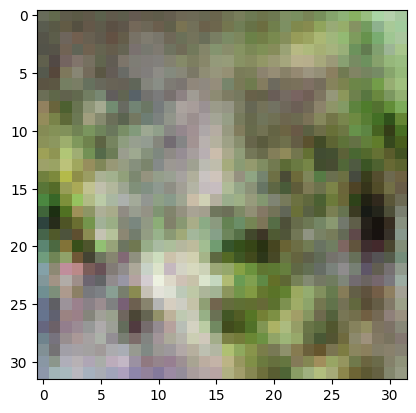

2/2 [==============================] - 0s 264ms/step
>24, 11/39, d1=0.477, d2=0.739 g=1.213


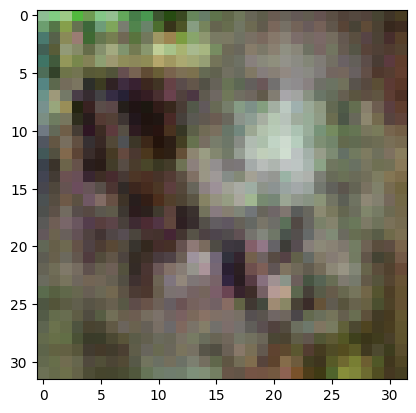

2/2 [==============================] - 0s 266ms/step
>24, 12/39, d1=0.397, d2=0.756 g=1.352


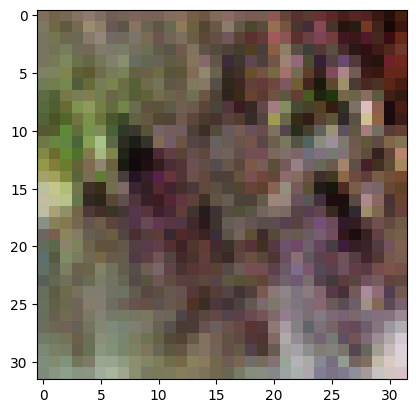

2/2 [==============================] - 0s 285ms/step
>24, 13/39, d1=0.586, d2=0.591 g=1.358


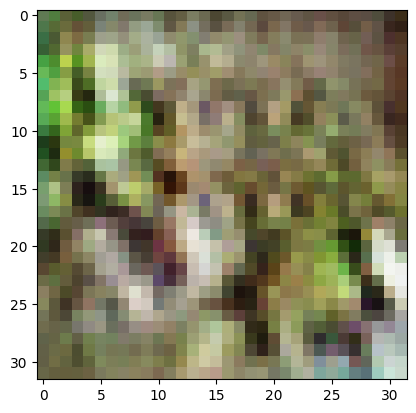

2/2 [==============================] - 0s 266ms/step
>24, 14/39, d1=0.514, d2=0.676 g=1.389


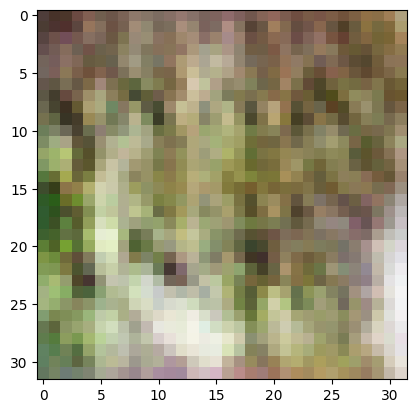

2/2 [==============================] - 0s 261ms/step
>24, 15/39, d1=0.617, d2=0.499 g=1.374


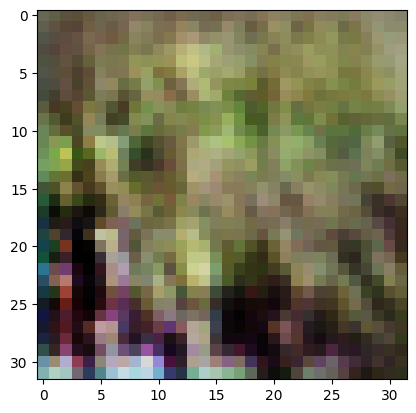

2/2 [==============================] - 0s 268ms/step
>24, 16/39, d1=0.523, d2=0.612 g=1.160


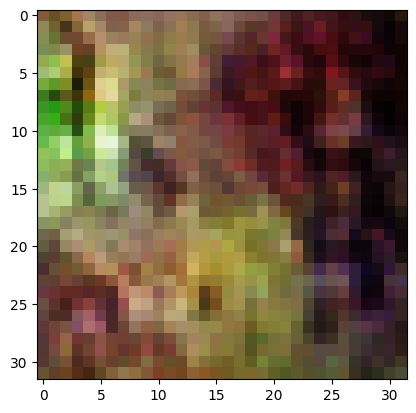

2/2 [==============================] - 1s 341ms/step
>24, 17/39, d1=0.325, d2=0.733 g=1.331


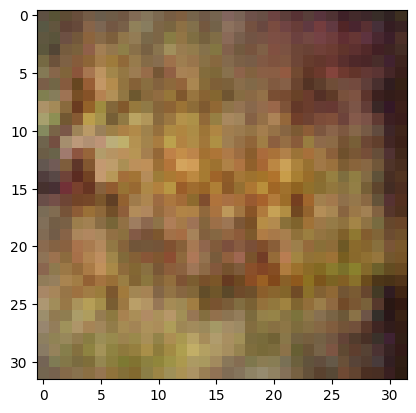

2/2 [==============================] - 0s 253ms/step
>24, 18/39, d1=0.582, d2=0.497 g=1.378


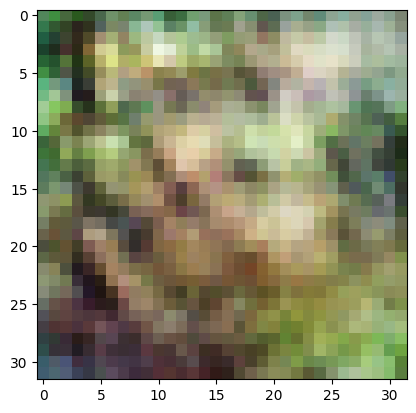

2/2 [==============================] - 0s 282ms/step
>24, 19/39, d1=0.653, d2=0.765 g=1.260


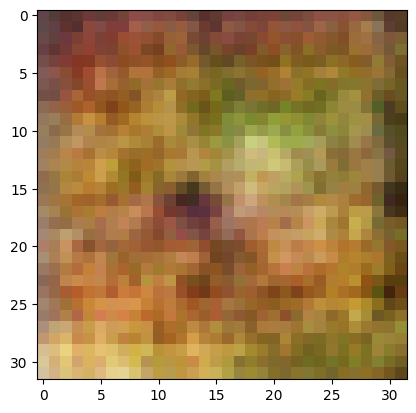

2/2 [==============================] - 1s 272ms/step
>24, 20/39, d1=0.726, d2=0.654 g=1.149


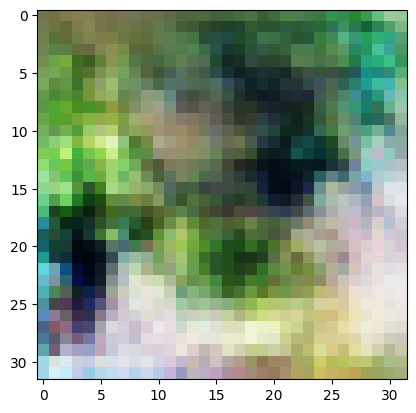

2/2 [==============================] - 0s 268ms/step
>24, 21/39, d1=0.711, d2=0.756 g=1.125


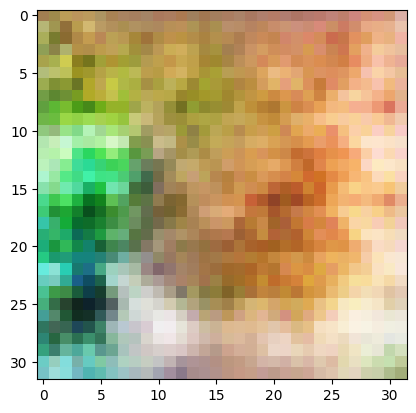

2/2 [==============================] - 0s 271ms/step
>24, 22/39, d1=0.763, d2=0.709 g=1.306


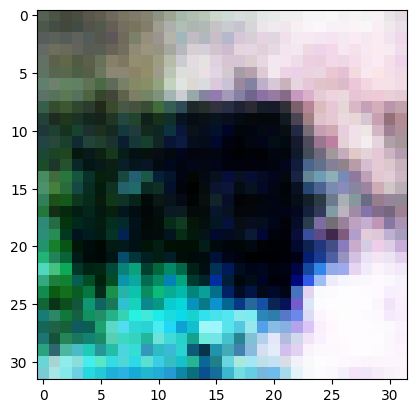

2/2 [==============================] - 1s 306ms/step
>24, 23/39, d1=0.743, d2=0.697 g=1.463


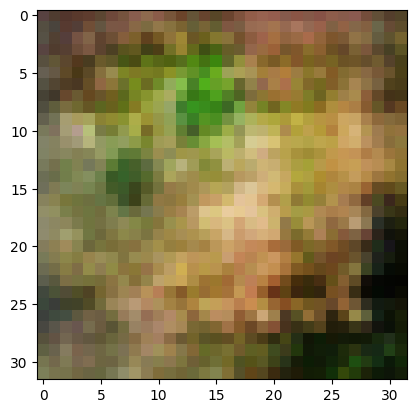

2/2 [==============================] - 0s 278ms/step
>24, 24/39, d1=0.820, d2=0.374 g=1.410


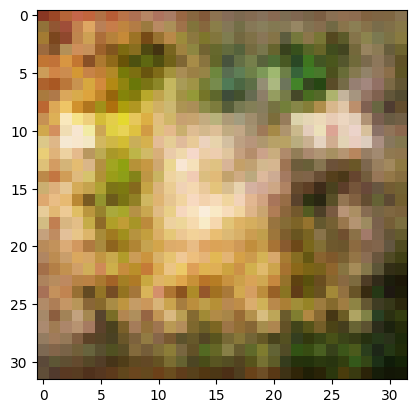

2/2 [==============================] - 0s 258ms/step
>24, 25/39, d1=0.909, d2=0.455 g=1.254


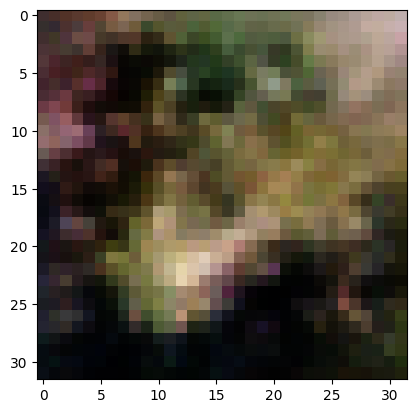

2/2 [==============================] - 0s 276ms/step
>24, 26/39, d1=0.676, d2=0.571 g=1.008


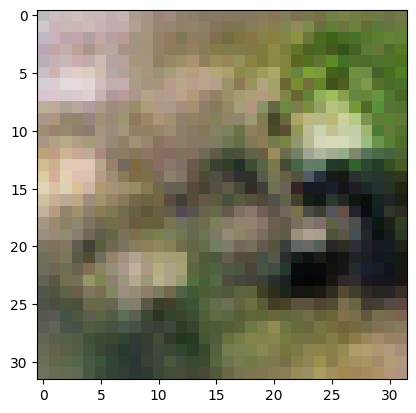

2/2 [==============================] - 0s 276ms/step
>24, 27/39, d1=0.665, d2=0.702 g=0.987


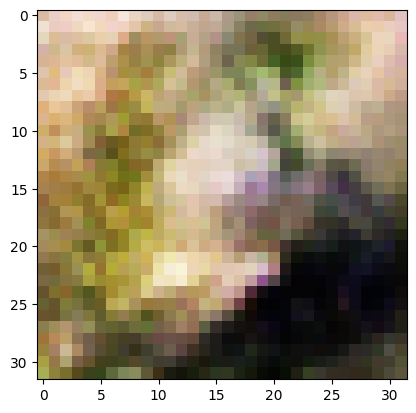

KeyboardInterrupt: 

In [3]:
# example of a dcgan on cifar10
import numpy as np
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from matplotlib import pyplot

# define the standalone discriminator model
def define_discriminator(in_shape=(32,32,3)):
	model = Sequential()
	# normal
	model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# downsample
	model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# classifier
	model.add(Flatten())
	model.add(Dropout(0.4))
	model.add(Dense(1, activation='sigmoid'))
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model

# define the standalone generator model
def define_generator(latent_dim):
	model = Sequential()
	# foundation for 4x4 image
	n_nodes = 256 * 4 * 4
	model.add(Dense(n_nodes, input_dim=latent_dim))
	model.add(LeakyReLU(alpha=0.2))
	model.add(Reshape((4, 4, 256)))
	# upsample to 8x8
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 16x16
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 32x32
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# output layer
	model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
	return model

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# connect them
	model = Sequential()
	# add generator
	model.add(g_model)
	# add the discriminator
	model.add(d_model)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

# load and prepare cifar10 training images
def load_real_samples():
	# load cifar10 dataset
	(trainX, _), (_, _) = load_data()
	# convert from unsigned ints to floats
	X = trainX.astype('float32')
	# scale from [0,255] to [-1,1]
	X = (X - 127.5) / 127.5
	return X

def load_real_samples_frogs():
  #load cifar10 dataset
  (trainX, trainY), (_, _) = load_data()

  frogX = []
  for img, label in zip(trainX, trainY):
    if label == 6: #6 is a frog
      frogX.append(img)
  # convert from unsigned ints to floats
  X = np.array(frogX)
  X = X.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return X

# select real samples
def generate_real_samples(dataset, n_samples):
	# choose random instances
	ix = randint(0, dataset.shape[0], n_samples)
	# retrieve selected images
	X = dataset[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, 1))
	return X, y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
	# generate points in latent space
	x_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	X = g_model.predict(x_input)
	# create 'fake' class labels (0)
	y = zeros((n_samples, 1))
	return X, y

# create and save a plot of generated images
def save_plot(examples, epoch, n=7):
	# scale from [-1,1] to [0,1]
	examples = (examples + 1) / 2.0
	# plot images
	for i in range(n * n):
		# define subplot
		pyplot.subplot(n, n, 1 + i)
		# turn off axis
		pyplot.axis('off')
		# plot raw pixel data
		pyplot.imshow(examples[i])
	# save plot to file
	filename = 'generated_plot_e%03d.png' % (epoch+1)
	pyplot.savefig(filename)
	pyplot.close()

# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
	# prepare real samples
	X_real, y_real = generate_real_samples(dataset, n_samples)
	# evaluate discriminator on real examples
	_, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
	# prepare fake examples
	x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
	# evaluate discriminator on fake examples
	_, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
	# summarize discriminator performance
	print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
	# save plot
	save_plot(x_fake, epoch)
	# save the generator model tile file
	filename = 'generator_model_%03d.h5' % (epoch+1)
	g_model.save(filename)

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=128):
	bat_per_epo = int(dataset.shape[0] / n_batch)
	half_batch = int(n_batch / 2)
	# manually enumerate epochs
	for i in range(n_epochs):
		# enumerate batches over the training set
		for j in range(bat_per_epo):
			# get randomly selected 'real' samples
			X_real, y_real = generate_real_samples(dataset, half_batch)
			# update discriminator model weights
			d_loss1, _ = d_model.train_on_batch(X_real, y_real)
			# generate 'fake' examples
			X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
			# update discriminator model weights
			d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
			# prepare points in latent space as input for the generator
			X_gan = generate_latent_points(latent_dim, n_batch)
			# create inverted labels for the fake samples
			y_gan = ones((n_batch, 1))
			# update the generator via the discriminator's error
			g_loss = gan_model.train_on_batch(X_gan, y_gan)
			# summarize loss on this batch
			print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %
				(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
			pyplot.imshow((X_fake[0]+1)/2); pyplot.show()
		# evaluate the model performance, sometimes
		if (i+1) % 10 == 0:
			summarize_performance(i, g_model, d_model, dataset, latent_dim)

# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples_frogs()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim)